# TOC:
* [FDR corrected maps](#fdr-bullet)
* [Voxel-wise thresholded maps](#voxel-bullet)
* [Concatenate subject scans](#concat-bullet)
* [Cluster extent corrected maps](#cluster-bullet)
* [TFCE corrected positive SV maps](#tfce_pos-bullet)
* [TFCE corrected negative SV maps](#tfce_neg-bullet)


In [1]:
# load modules
from scipy.stats import stats
import scipy.io as spio
import nibabel as nib
import numpy as np
from matplotlib import pyplot as plt
import os
import glob
# from sklearn import preprocessing
# from sklearn.preprocessing import StandardScaler
from nilearn.input_data import NiftiMasker
import nilearn.plotting as plotting
from nilearn.image import mean_img
from nilearn import image
# import pickle
import pandas as pd
import seaborn as sns 

import nipype.pipeline.engine as pe
from nipype.interfaces import spm
from nipype.interfaces import fsl


%matplotlib inline 
%autosave 5
sns.set(style = 'white', context='poster', rc={"lines.linewidth": 2.5})

/gpfs/ysm/project/rj299/conda_envs/py37_dev/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


210723-11:20:13,755 nipype.utils INFO:
	 Running nipype version 1.2.3 (latest: 1.5.1)


Autosaving every 5 seconds


In [2]:
from nipype.interfaces.matlab import MatlabCommand
MatlabCommand.set_default_paths('/home/rj299/project/MATLAB/toolbox/spm12/') # set default SPM12 path in my computer.

fsl.FSLCommand.set_default_output_type('NIFTI_GZ')

base_root = '/home/rj299/scratch60/mdm_analysis/'
data_root = '/home/rj299/project/mdm_analysis/'
out_root = '/home/rj299/scratch60/mdm_analysis/output'

# Subjects included in analysis
sub_num = [2073, 2550, 2582, 2583, 2584, 2585, 2588, 2592, 2593, 2594, 
           2596, 2597, 2598, 2599, 2600, 2624, 2650, 2651, 2652, 2653, 
           2654, 2655, 2656, 2657, 2658, 2659, 2660, 2661, 2662, 2663, 
           2664, 2665, 2666]
sub_num = [2073, 2550, 2582, 2583, 2584, 2585, 2588, 2592, 2593, 2594, 
           2596, 2597, 2598, 2599, 2600, 2624, 2650, 2651, 2652, 2653, 
           2654, 2655, 2657, 2658, 2659, 2660, 2661, 2662, 2663, 
           2664, 2665, 2666]

sub_num.sort()
print('All subjects included in analysis:', sub_num)
print(len(sub_num), 'subjects')

All subjects included in analysis: [2073, 2550, 2582, 2583, 2584, 2585, 2588, 2592, 2593, 2594, 2596, 2597, 2598, 2599, 2600, 2624, 2650, 2651, 2652, 2653, 2654, 2655, 2657, 2658, 2659, 2660, 2661, 2662, 2663, 2664, 2665, 2666]
32 subjects


In [3]:
# load anatomical
anat_mean = nib.load(os.path.join(data_root, 'output','imaging', 'all_sub_average.nii.gz'))

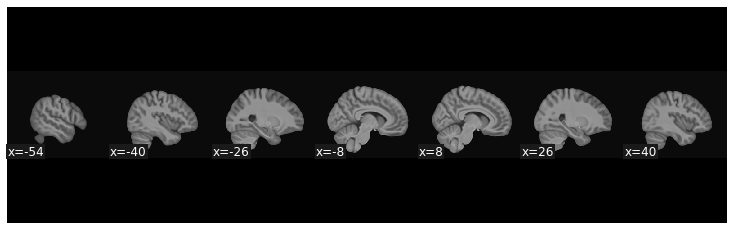

In [4]:
fig = plt.figure(figsize = (10,3))
plotting.plot_anat(anat_mean, black_bg = True, figure = fig,
                  display_mode = 'x')

### First level result (single participant)

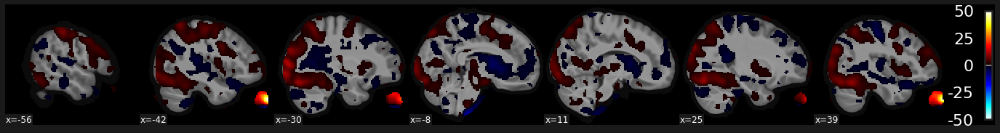

In [5]:
# contrast
con_id = '0002'
plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2073/con_%s.nii' %con_id,
                       anat_mean,
                      threshold = 1,
                      display_mode = 'x')

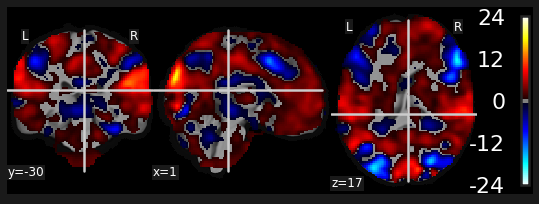

In [6]:
# t map
con_id = '0014'
plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2073/spmT_%s.nii' %con_id,
                       anat_mean,
                      threshold = 0.7,
#                       display_mode = 'x',
                      )

### FDR thresholded <a class = "anchor" id = "fdr-bullet"></a>

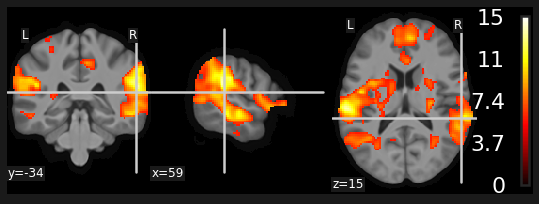

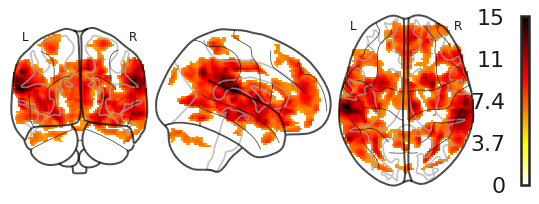

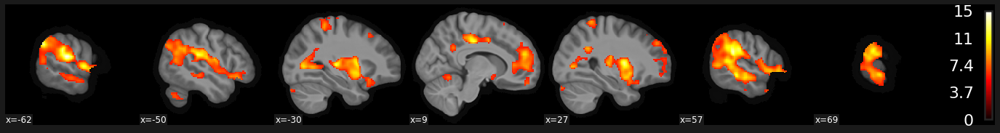

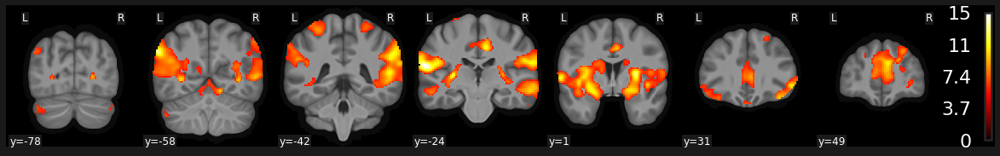

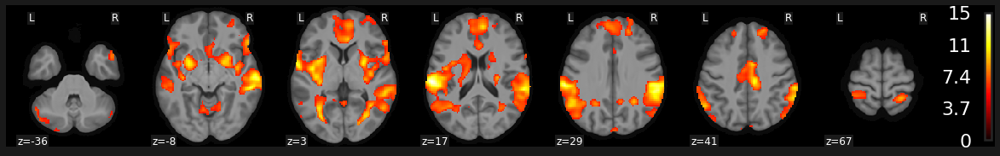

In [9]:
# second-level output: FDR corrected

con_id = '0014'
plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/2ndLevel_heightp05/_contrast_id_con_%s/spmT_0001_thr.nii' %con_id,
                       anat_mean)

plotting.plot_glass_brain('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/2ndLevel_heightp05/_contrast_id_con_%s/spmT_0001_thr.nii' %con_id,
                       colorbar = True)

plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/2ndLevel_heightp05/_contrast_id_con_%s/spmT_0001_thr.nii' %con_id,
                       anat_mean,
                      display_mode = 'x')

plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/2ndLevel_heightp05/_contrast_id_con_%s/spmT_0001_thr.nii' %con_id,
                       anat_mean,
                      display_mode = 'y')

plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/2ndLevel_heightp05/_contrast_id_con_%s/spmT_0001_thr.nii' %con_id,
                       anat_mean,
                      display_mode = 'z')

## Voxel-size thresholding <a class = "anchor" id = "voxel-bullet"></a>

Without correction just voxel-wise threshold

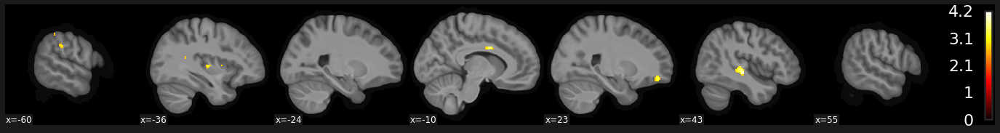

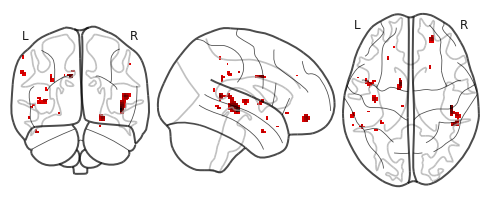

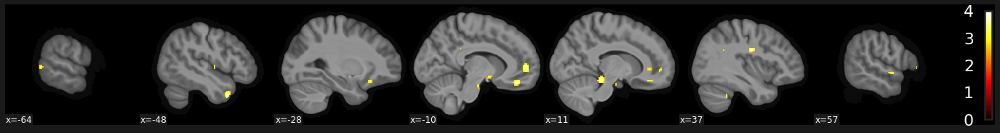

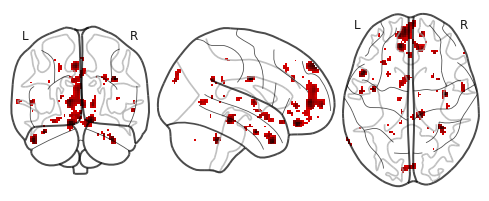

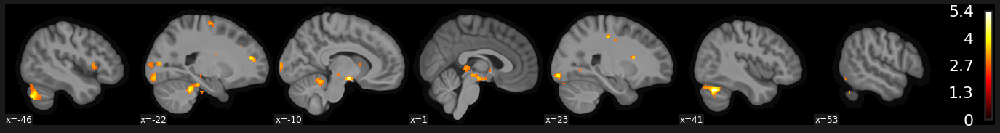

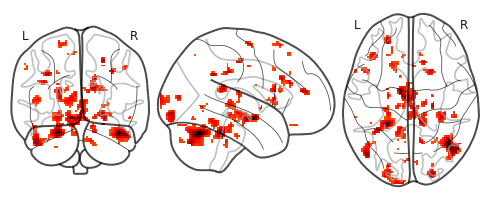

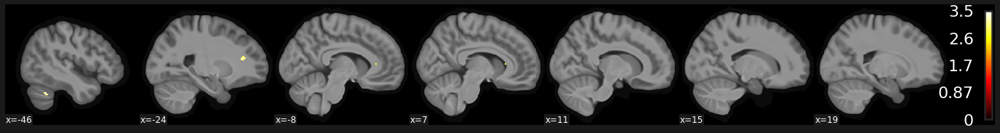

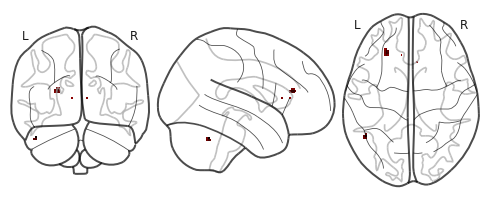

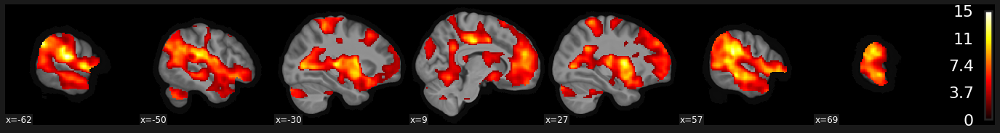

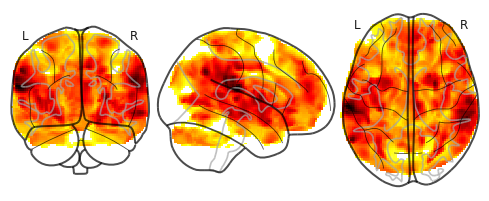

In [11]:
# voxel-wise p threshold
voxel_threshold = 0.005
con_ids = ['0010', '0011', '0012', '0013', '0014'] # Med_amb_rating, Med_risk_rating, Mon_amb_rating, Mon_risk_rating, Response

for con_id in con_ids:

    spm_thr = spm.Threshold(contrast_index=1,
                            spm_mat_file = os.path.join(out_root, 'imaging', 'Sink_resp_rating/2ndLevel_heightp05/_contrast_id_con_%s/SPM.mat' %con_id),
                            stat_image = os.path.join(out_root, 'imaging', 'Sink_resp_rating/2ndLevel_heightp05/_contrast_id_con_%s/spmT_0001.nii' %con_id),
                            use_topo_fdr=False,
                            use_fwe_correction=False, # here we can use fwe or fdr, default is true
    #                         extent_threshold=10,
                            height_threshold= voxel_threshold, # default is 0.05
    #                         extent_fdr_p_threshold = 0.05,
                            height_threshold_type='p-value', # default is p-value
                            )
    spm_thr.run()

    # plot 
    plotting.plot_stat_map('/home/rj299/project/mdm_analysis/mdm_imaging_analysis/spmT_0001_thr.nii',
                          bg_img = anat_mean,
                           display_mode = 'x')
    
    plotting.plot_glass_brain('/home/rj299/project/mdm_analysis/mdm_imaging_analysis/spmT_0001_thr.nii')
    # plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/mdm_imaging_analysis/spmT_0001_pre_topo_thr.nii')

## Concatenate all subjects' contrast <a class = "anchor" id = "concat-bullet"></a>

In [25]:
con_id = '0014'
con_filenames = ['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_*/con_%s.nii' %con_id]

con_all = {}

for i in sub_num:
    con_image = glob.glob('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_' + str(i) + '/con_%s.nii' %con_id)
    con_all[str(i)] = list(con_image)
print(len(con_all))
con_all

32


{'2073': ['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2073/con_0014.nii'],
 '2550': ['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2550/con_0014.nii'],
 '2582': ['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2582/con_0014.nii'],
 '2583': ['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2583/con_0014.nii'],
 '2584': ['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2584/con_0014.nii'],
 '2585': ['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2585/con_0014.nii'],
 '2588': ['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2588/con_0014.nii'],
 '2592': ['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2592/con_0014.nii'],
 '2593': ['/home/rj299/scratch60/mdm_ana

In [26]:
smooth_con_all = []

for k, v in con_all.items():
    smooth_con = image.smooth_img(v[0],None) #  If fwhm is None, no filtering is performed (useful when just removal of non-finite values is needed).
    print(v)
    smooth_con_all.append(smooth_con)
    
#     plotting.plot_glass_brain(smooth_con, colorbar = True)

['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2073/con_0014.nii']
['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2550/con_0014.nii']
['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2582/con_0014.nii']
['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2583/con_0014.nii']
['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2584/con_0014.nii']
['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2585/con_0014.nii']
['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2588/con_0014.nii']
['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2592/con_0014.nii']
['/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_2593/con_0014.nii']
['/home/rj

In [27]:
# from nilearn import image
con_concat = image.concat_imgs(smooth_con_all, auto_resample = True)
con_concat.to_filename(os.path.join(out_root, 'imaging', 'Sink_resp_rating', 'rating_glm_con%s_all_sub.nii.gz' %con_id))

In [46]:
# con_single = image.index_img(con_concat, 0)
# plotting.plot_glass_brain(con_single, colorbar = "w")

In [47]:
# for con_single in image.iter_img(con_concat):
#     plotting.plot_glass_brain(con_single, display_mode = 'lyrz', colorbar = "w")

In [28]:
# flip sign for the Mon > Med contrast
smooth_con_flip_all = []

for smooth_img in smooth_con_all:
    smooth_img_flip = image.math_img("-img", img=smooth_img)
    smooth_con_flip_all.append(smooth_img_flip)
    
con_concat_flip = image.concat_imgs(smooth_con_flip_all, auto_resample = True)
con_concat_flip.to_filename(os.path.join(out_root, 'imaging', 'Sink_resp_rating', 'rating_glm_con%s_flip_all_sub.nii.gz' %con_id))

## Cluster extent <a class = "anchor" id = "cluster-bullet"></a>

In [35]:
# conduct cluster-extent thresholding
# voxel-wise p threshold
voxel_threshold = 0.01
con_ids = ['0010', '0011', '0012', '0013', '0014']

for con_id in con_ids:

    spm_thr = spm.Threshold(contrast_index=1,
                            spm_mat_file = os.path.join(out_root, 'imaging', 'Sink_resp_rating/2ndLevel_heightp05/_contrast_id_con_%s/SPM.mat' %con_id),
                            stat_image = os.path.join(out_root, 'imaging', 'Sink_resp_rating/2ndLevel_heightp05/_contrast_id_con_%s/spmT_0001.nii' %con_id),
                            use_topo_fdr=False,
                            use_fwe_correction=False, # here we can use fwe or fdr, default is true
    #                         extent_threshold=10,
                            height_threshold= voxel_threshold, # default is 0.05
    #                         extent_fdr_p_threshold = 0.05,
                            height_threshold_type='p-value', # default is p-value
                            )
    spm_thr.run()

    # find the critical p value for a certain threshold
    t = nib.load('/home/rj299/project/mdm_analysis/mdm_imaging_analysis/spmT_0001_thr.nii')
    t_data = t.get_data()
    t_data_mask = ~np.isnan(t_data)
    t_critical = np.min(t_data[t_data_mask])
    t_critical

    # cluster extent threshold, using the preivous t_critical for initial thresholing
    cluster_thr = fsl.Randomise(in_file = os.path.join(out_root, 'imaging', 'Sink_resp_rating', 'rating_glm_con%s_all_sub.nii.gz' %con_id),
                                mask = '/home/rj299/project/mdm_analysis/output/imaging/wb_mask_group.nii.gz',
                                base_name = os.path.join(out_root, 'imaging', 'Sink_resp_rating', 'con%s_p%s' %(con_id, voxel_threshold)),
                                c_thresh = t_critical,
                                one_sample_group_mean = True,
                                tfce = False,
                                vox_p_values = True, 
    #                             raw_stats_imgs = True,
                                num_perm = 5000)
    cluster_thr.run()
    

210723-15:45:03,654 nipype.interface INFO:
	 stdout 2021-07-23T15:45:03.654190:randomise options: -i /home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/rating_glm_con0010_all_sub.nii.gz -o /home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/con0010_p0.01 -c 2.5 -m /home/rj299/project/mdm_analysis/output/imaging/wb_mask_group.nii.gz -n 5000 -1 -x 
210723-15:45:04,379 nipype.interface INFO:
	 stdout 2021-07-23T15:45:04.379392:Loading Data: 
210723-15:45:04,409 nipype.interface INFO:
	 stdout 2021-07-23T15:45:04.409326:Data loaded
210723-15:45:04,463 nipype.interface INFO:
	 stdout 2021-07-23T15:45:04.463444:One-sample design detected; sign-flipping instead of permuting.
210723-15:45:04,482 nipype.interface INFO:
	 stdout 2021-07-23T15:45:04.482885:4.29497e+09 sign-flips required for exhaustive test of t-test 1
210723-15:45:04,515 nipype.interface INFO:
	 stdout 2021-07-23T15:45:04.515078:Doing 5000 random permutations
210723-15:45:04,524 nipype.interface IN

210723-15:45:15,169 nipype.interface INFO:
	 stdout 2021-07-23T15:45:15.169151:Starting permutation 72
210723-15:45:15,310 nipype.interface INFO:
	 stdout 2021-07-23T15:45:15.310511:Starting permutation 73
210723-15:45:15,461 nipype.interface INFO:
	 stdout 2021-07-23T15:45:15.461637:Starting permutation 74
210723-15:45:15,610 nipype.interface INFO:
	 stdout 2021-07-23T15:45:15.610618:Starting permutation 75
210723-15:45:15,752 nipype.interface INFO:
	 stdout 2021-07-23T15:45:15.752465:Starting permutation 76
210723-15:45:15,892 nipype.interface INFO:
	 stdout 2021-07-23T15:45:15.892611:Starting permutation 77
210723-15:45:16,32 nipype.interface INFO:
	 stdout 2021-07-23T15:45:16.032213:Starting permutation 78
210723-15:45:16,171 nipype.interface INFO:
	 stdout 2021-07-23T15:45:16.171851:Starting permutation 79
210723-15:45:16,311 nipype.interface INFO:
	 stdout 2021-07-23T15:45:16.311768:Starting permutation 80
210723-15:45:16,451 nipype.interface INFO:
	 stdout 2021-07-23T15:45:16.45

210723-15:45:27,5 nipype.interface INFO:
	 stdout 2021-07-23T15:45:27.005693:Starting permutation 152
210723-15:45:27,144 nipype.interface INFO:
	 stdout 2021-07-23T15:45:27.144771:Starting permutation 153
210723-15:45:27,282 nipype.interface INFO:
	 stdout 2021-07-23T15:45:27.282700:Starting permutation 154
210723-15:45:27,424 nipype.interface INFO:
	 stdout 2021-07-23T15:45:27.424174:Starting permutation 155
210723-15:45:27,562 nipype.interface INFO:
	 stdout 2021-07-23T15:45:27.562258:Starting permutation 156
210723-15:45:27,700 nipype.interface INFO:
	 stdout 2021-07-23T15:45:27.700135:Starting permutation 157
210723-15:45:27,845 nipype.interface INFO:
	 stdout 2021-07-23T15:45:27.845007:Starting permutation 158
210723-15:45:27,983 nipype.interface INFO:
	 stdout 2021-07-23T15:45:27.983056:Starting permutation 159
210723-15:45:28,121 nipype.interface INFO:
	 stdout 2021-07-23T15:45:28.121872:Starting permutation 160
210723-15:45:28,263 nipype.interface INFO:
	 stdout 2021-07-23T15:

210723-15:45:38,68 nipype.interface INFO:
	 stdout 2021-07-23T15:45:38.068222:Starting permutation 231
210723-15:45:38,209 nipype.interface INFO:
	 stdout 2021-07-23T15:45:38.209136:Starting permutation 232
210723-15:45:38,347 nipype.interface INFO:
	 stdout 2021-07-23T15:45:38.347708:Starting permutation 233
210723-15:45:38,487 nipype.interface INFO:
	 stdout 2021-07-23T15:45:38.487797:Starting permutation 234
210723-15:45:38,626 nipype.interface INFO:
	 stdout 2021-07-23T15:45:38.626026:Starting permutation 235
210723-15:45:38,764 nipype.interface INFO:
	 stdout 2021-07-23T15:45:38.764866:Starting permutation 236
210723-15:45:38,902 nipype.interface INFO:
	 stdout 2021-07-23T15:45:38.902821:Starting permutation 237
210723-15:45:39,41 nipype.interface INFO:
	 stdout 2021-07-23T15:45:39.041058:Starting permutation 238
210723-15:45:39,180 nipype.interface INFO:
	 stdout 2021-07-23T15:45:39.180032:Starting permutation 239
210723-15:45:39,317 nipype.interface INFO:
	 stdout 2021-07-23T15:

210723-15:45:49,111 nipype.interface INFO:
	 stdout 2021-07-23T15:45:49.110988:Starting permutation 310
210723-15:45:49,250 nipype.interface INFO:
	 stdout 2021-07-23T15:45:49.250681:Starting permutation 311
210723-15:45:49,389 nipype.interface INFO:
	 stdout 2021-07-23T15:45:49.389213:Starting permutation 312
210723-15:45:49,528 nipype.interface INFO:
	 stdout 2021-07-23T15:45:49.528792:Starting permutation 313
210723-15:45:49,667 nipype.interface INFO:
	 stdout 2021-07-23T15:45:49.667772:Starting permutation 314
210723-15:45:49,806 nipype.interface INFO:
	 stdout 2021-07-23T15:45:49.806307:Starting permutation 315
210723-15:45:49,945 nipype.interface INFO:
	 stdout 2021-07-23T15:45:49.944964:Starting permutation 316
210723-15:45:50,83 nipype.interface INFO:
	 stdout 2021-07-23T15:45:50.083302:Starting permutation 317
210723-15:45:50,221 nipype.interface INFO:
	 stdout 2021-07-23T15:45:50.221472:Starting permutation 318
210723-15:45:50,359 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-15:46:00,781 nipype.interface INFO:
	 stdout 2021-07-23T15:46:00.781469:Starting permutation 389
210723-15:46:00,916 nipype.interface INFO:
	 stdout 2021-07-23T15:46:00.916897:Starting permutation 390
210723-15:46:01,54 nipype.interface INFO:
	 stdout 2021-07-23T15:46:01.054655:Starting permutation 391
210723-15:46:01,197 nipype.interface INFO:
	 stdout 2021-07-23T15:46:01.197661:Starting permutation 392
210723-15:46:01,335 nipype.interface INFO:
	 stdout 2021-07-23T15:46:01.335888:Starting permutation 393
210723-15:46:01,474 nipype.interface INFO:
	 stdout 2021-07-23T15:46:01.474382:Starting permutation 394
210723-15:46:01,612 nipype.interface INFO:
	 stdout 2021-07-23T15:46:01.612756:Starting permutation 395
210723-15:46:01,753 nipype.interface INFO:
	 stdout 2021-07-23T15:46:01.753481:Starting permutation 396
210723-15:46:01,892 nipype.interface INFO:
	 stdout 2021-07-23T15:46:01.892089:Starting permutation 397
210723-15:46:02,30 nipype.interface INFO:
	 stdout 2021-07-23T15:

210723-15:46:11,809 nipype.interface INFO:
	 stdout 2021-07-23T15:46:11.809465:Starting permutation 468
210723-15:46:11,948 nipype.interface INFO:
	 stdout 2021-07-23T15:46:11.948644:Starting permutation 469
210723-15:46:12,86 nipype.interface INFO:
	 stdout 2021-07-23T15:46:12.086828:Starting permutation 470
210723-15:46:12,228 nipype.interface INFO:
	 stdout 2021-07-23T15:46:12.228100:Starting permutation 471
210723-15:46:12,366 nipype.interface INFO:
	 stdout 2021-07-23T15:46:12.366743:Starting permutation 472
210723-15:46:12,505 nipype.interface INFO:
	 stdout 2021-07-23T15:46:12.505802:Starting permutation 473
210723-15:46:12,644 nipype.interface INFO:
	 stdout 2021-07-23T15:46:12.644731:Starting permutation 474
210723-15:46:12,791 nipype.interface INFO:
	 stdout 2021-07-23T15:46:12.791314:Starting permutation 475
210723-15:46:12,930 nipype.interface INFO:
	 stdout 2021-07-23T15:46:12.930683:Starting permutation 476
210723-15:46:13,69 nipype.interface INFO:
	 stdout 2021-07-23T15:

210723-15:46:22,861 nipype.interface INFO:
	 stdout 2021-07-23T15:46:22.861421:Starting permutation 547
210723-15:46:23,9 nipype.interface INFO:
	 stdout 2021-07-23T15:46:23.009279:Starting permutation 548
210723-15:46:23,148 nipype.interface INFO:
	 stdout 2021-07-23T15:46:23.148605:Starting permutation 549
210723-15:46:23,288 nipype.interface INFO:
	 stdout 2021-07-23T15:46:23.288859:Starting permutation 550
210723-15:46:23,427 nipype.interface INFO:
	 stdout 2021-07-23T15:46:23.427655:Starting permutation 551
210723-15:46:23,567 nipype.interface INFO:
	 stdout 2021-07-23T15:46:23.567037:Starting permutation 552
210723-15:46:23,705 nipype.interface INFO:
	 stdout 2021-07-23T15:46:23.705455:Starting permutation 553
210723-15:46:24,38 nipype.interface INFO:
	 stdout 2021-07-23T15:46:24.038419:Starting permutation 554
210723-15:46:24,277 nipype.interface INFO:
	 stdout 2021-07-23T15:46:24.277614:Starting permutation 555
210723-15:46:24,460 nipype.interface INFO:
	 stdout 2021-07-23T15:4

210723-15:46:34,489 nipype.interface INFO:
	 stdout 2021-07-23T15:46:34.489049:Starting permutation 626
210723-15:46:34,629 nipype.interface INFO:
	 stdout 2021-07-23T15:46:34.628955:Starting permutation 627
210723-15:46:34,768 nipype.interface INFO:
	 stdout 2021-07-23T15:46:34.767941:Starting permutation 628
210723-15:46:34,907 nipype.interface INFO:
	 stdout 2021-07-23T15:46:34.907210:Starting permutation 629
210723-15:46:35,46 nipype.interface INFO:
	 stdout 2021-07-23T15:46:35.046867:Starting permutation 630
210723-15:46:35,178 nipype.interface INFO:
	 stdout 2021-07-23T15:46:35.178567:Starting permutation 631
210723-15:46:35,304 nipype.interface INFO:
	 stdout 2021-07-23T15:46:35.304917:Starting permutation 632
210723-15:46:35,431 nipype.interface INFO:
	 stdout 2021-07-23T15:46:35.431721:Starting permutation 633
210723-15:46:35,561 nipype.interface INFO:
	 stdout 2021-07-23T15:46:35.561833:Starting permutation 634
210723-15:46:35,700 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-15:46:45,494 nipype.interface INFO:
	 stdout 2021-07-23T15:46:45.494283:Starting permutation 705
210723-15:46:45,634 nipype.interface INFO:
	 stdout 2021-07-23T15:46:45.634050:Starting permutation 706
210723-15:46:45,772 nipype.interface INFO:
	 stdout 2021-07-23T15:46:45.772929:Starting permutation 707
210723-15:46:45,911 nipype.interface INFO:
	 stdout 2021-07-23T15:46:45.911801:Starting permutation 708
210723-15:46:46,52 nipype.interface INFO:
	 stdout 2021-07-23T15:46:46.052757:Starting permutation 709
210723-15:46:46,191 nipype.interface INFO:
	 stdout 2021-07-23T15:46:46.191903:Starting permutation 710
210723-15:46:46,330 nipype.interface INFO:
	 stdout 2021-07-23T15:46:46.330363:Starting permutation 711
210723-15:46:46,469 nipype.interface INFO:
	 stdout 2021-07-23T15:46:46.469052:Starting permutation 712
210723-15:46:46,607 nipype.interface INFO:
	 stdout 2021-07-23T15:46:46.607925:Starting permutation 713
210723-15:46:46,747 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-15:46:57,131 nipype.interface INFO:
	 stdout 2021-07-23T15:46:57.131873:Starting permutation 784
210723-15:46:57,272 nipype.interface INFO:
	 stdout 2021-07-23T15:46:57.272024:Starting permutation 785
210723-15:46:57,412 nipype.interface INFO:
	 stdout 2021-07-23T15:46:57.412204:Starting permutation 786
210723-15:46:57,552 nipype.interface INFO:
	 stdout 2021-07-23T15:46:57.552001:Starting permutation 787
210723-15:46:57,691 nipype.interface INFO:
	 stdout 2021-07-23T15:46:57.691793:Starting permutation 788
210723-15:46:57,837 nipype.interface INFO:
	 stdout 2021-07-23T15:46:57.837028:Starting permutation 789
210723-15:46:57,976 nipype.interface INFO:
	 stdout 2021-07-23T15:46:57.976039:Starting permutation 790
210723-15:46:58,114 nipype.interface INFO:
	 stdout 2021-07-23T15:46:58.114842:Starting permutation 791
210723-15:46:58,253 nipype.interface INFO:
	 stdout 2021-07-23T15:46:58.253133:Starting permutation 792
210723-15:46:58,393 nipype.interface INFO:
	 stdout 2021-07-23T1

210723-15:47:08,188 nipype.interface INFO:
	 stdout 2021-07-23T15:47:08.188756:Starting permutation 863
210723-15:47:08,329 nipype.interface INFO:
	 stdout 2021-07-23T15:47:08.329385:Starting permutation 864
210723-15:47:08,468 nipype.interface INFO:
	 stdout 2021-07-23T15:47:08.467970:Starting permutation 865
210723-15:47:08,608 nipype.interface INFO:
	 stdout 2021-07-23T15:47:08.608505:Starting permutation 866
210723-15:47:08,747 nipype.interface INFO:
	 stdout 2021-07-23T15:47:08.747189:Starting permutation 867
210723-15:47:08,885 nipype.interface INFO:
	 stdout 2021-07-23T15:47:08.885733:Starting permutation 868
210723-15:47:09,25 nipype.interface INFO:
	 stdout 2021-07-23T15:47:09.025823:Starting permutation 869
210723-15:47:09,165 nipype.interface INFO:
	 stdout 2021-07-23T15:47:09.165845:Starting permutation 870
210723-15:47:09,307 nipype.interface INFO:
	 stdout 2021-07-23T15:47:09.307053:Starting permutation 871
210723-15:47:09,447 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-15:47:19,311 nipype.interface INFO:
	 stdout 2021-07-23T15:47:19.311619:Starting permutation 942
210723-15:47:19,451 nipype.interface INFO:
	 stdout 2021-07-23T15:47:19.451880:Starting permutation 943
210723-15:47:19,591 nipype.interface INFO:
	 stdout 2021-07-23T15:47:19.591117:Starting permutation 944
210723-15:47:19,731 nipype.interface INFO:
	 stdout 2021-07-23T15:47:19.731769:Starting permutation 945
210723-15:47:19,871 nipype.interface INFO:
	 stdout 2021-07-23T15:47:19.871209:Starting permutation 946
210723-15:47:20,11 nipype.interface INFO:
	 stdout 2021-07-23T15:47:20.011523:Starting permutation 947
210723-15:47:20,151 nipype.interface INFO:
	 stdout 2021-07-23T15:47:20.151176:Starting permutation 948
210723-15:47:20,290 nipype.interface INFO:
	 stdout 2021-07-23T15:47:20.290309:Starting permutation 949
210723-15:47:20,430 nipype.interface INFO:
	 stdout 2021-07-23T15:47:20.429948:Starting permutation 950
210723-15:47:20,570 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-15:47:30,745 nipype.interface INFO:
	 stdout 2021-07-23T15:47:30.745893:Starting permutation 1021
210723-15:47:30,883 nipype.interface INFO:
	 stdout 2021-07-23T15:47:30.883395:Starting permutation 1022
210723-15:47:31,22 nipype.interface INFO:
	 stdout 2021-07-23T15:47:31.022413:Starting permutation 1023
210723-15:47:31,162 nipype.interface INFO:
	 stdout 2021-07-23T15:47:31.162340:Starting permutation 1024
210723-15:47:31,301 nipype.interface INFO:
	 stdout 2021-07-23T15:47:31.301328:Starting permutation 1025
210723-15:47:31,439 nipype.interface INFO:
	 stdout 2021-07-23T15:47:31.439500:Starting permutation 1026
210723-15:47:31,578 nipype.interface INFO:
	 stdout 2021-07-23T15:47:31.578653:Starting permutation 1027
210723-15:47:31,717 nipype.interface INFO:
	 stdout 2021-07-23T15:47:31.717350:Starting permutation 1028
210723-15:47:31,852 nipype.interface INFO:
	 stdout 2021-07-23T15:47:31.852511:Starting permutation 1029
210723-15:47:31,992 nipype.interface INFO:
	 stdout 2021

210723-15:47:41,811 nipype.interface INFO:
	 stdout 2021-07-23T15:47:41.811489:Starting permutation 1100
210723-15:47:41,951 nipype.interface INFO:
	 stdout 2021-07-23T15:47:41.951232:Starting permutation 1101
210723-15:47:42,90 nipype.interface INFO:
	 stdout 2021-07-23T15:47:42.090142:Starting permutation 1102
210723-15:47:42,230 nipype.interface INFO:
	 stdout 2021-07-23T15:47:42.230474:Starting permutation 1103
210723-15:47:42,371 nipype.interface INFO:
	 stdout 2021-07-23T15:47:42.371178:Starting permutation 1104
210723-15:47:42,512 nipype.interface INFO:
	 stdout 2021-07-23T15:47:42.512005:Starting permutation 1105
210723-15:47:42,651 nipype.interface INFO:
	 stdout 2021-07-23T15:47:42.651492:Starting permutation 1106
210723-15:47:42,793 nipype.interface INFO:
	 stdout 2021-07-23T15:47:42.793898:Starting permutation 1107
210723-15:47:42,933 nipype.interface INFO:
	 stdout 2021-07-23T15:47:42.933864:Starting permutation 1108
210723-15:47:43,75 nipype.interface INFO:
	 stdout 2021-

210723-15:47:53,612 nipype.interface INFO:
	 stdout 2021-07-23T15:47:53.612706:Starting permutation 1179
210723-15:47:53,778 nipype.interface INFO:
	 stdout 2021-07-23T15:47:53.777951:Starting permutation 1180
210723-15:47:54,285 nipype.interface INFO:
	 stdout 2021-07-23T15:47:54.285692:Starting permutation 1181
210723-15:47:54,595 nipype.interface INFO:
	 stdout 2021-07-23T15:47:54.595124:Starting permutation 1182
210723-15:47:54,819 nipype.interface INFO:
	 stdout 2021-07-23T15:47:54.819569:Starting permutation 1183
210723-15:47:55,75 nipype.interface INFO:
	 stdout 2021-07-23T15:47:55.075657:Starting permutation 1184
210723-15:47:55,229 nipype.interface INFO:
	 stdout 2021-07-23T15:47:55.229669:Starting permutation 1185
210723-15:47:55,367 nipype.interface INFO:
	 stdout 2021-07-23T15:47:55.367098:Starting permutation 1186
210723-15:47:55,503 nipype.interface INFO:
	 stdout 2021-07-23T15:47:55.503164:Starting permutation 1187
210723-15:47:55,641 nipype.interface INFO:
	 stdout 2021

210723-15:48:05,459 nipype.interface INFO:
	 stdout 2021-07-23T15:48:05.459771:Starting permutation 1258
210723-15:48:05,587 nipype.interface INFO:
	 stdout 2021-07-23T15:48:05.587036:Starting permutation 1259
210723-15:48:05,714 nipype.interface INFO:
	 stdout 2021-07-23T15:48:05.714693:Starting permutation 1260
210723-15:48:05,846 nipype.interface INFO:
	 stdout 2021-07-23T15:48:05.846810:Starting permutation 1261
210723-15:48:05,984 nipype.interface INFO:
	 stdout 2021-07-23T15:48:05.984112:Starting permutation 1262
210723-15:48:06,123 nipype.interface INFO:
	 stdout 2021-07-23T15:48:06.123109:Starting permutation 1263
210723-15:48:06,261 nipype.interface INFO:
	 stdout 2021-07-23T15:48:06.261835:Starting permutation 1264
210723-15:48:06,398 nipype.interface INFO:
	 stdout 2021-07-23T15:48:06.398589:Starting permutation 1265
210723-15:48:06,537 nipype.interface INFO:
	 stdout 2021-07-23T15:48:06.537405:Starting permutation 1266
210723-15:48:06,675 nipype.interface INFO:
	 stdout 202

210723-15:48:16,460 nipype.interface INFO:
	 stdout 2021-07-23T15:48:16.460182:Starting permutation 1337
210723-15:48:16,604 nipype.interface INFO:
	 stdout 2021-07-23T15:48:16.604641:Starting permutation 1338
210723-15:48:16,745 nipype.interface INFO:
	 stdout 2021-07-23T15:48:16.745882:Starting permutation 1339
210723-15:48:16,887 nipype.interface INFO:
	 stdout 2021-07-23T15:48:16.887369:Starting permutation 1340
210723-15:48:17,25 nipype.interface INFO:
	 stdout 2021-07-23T15:48:17.025637:Starting permutation 1341
210723-15:48:17,163 nipype.interface INFO:
	 stdout 2021-07-23T15:48:17.163218:Starting permutation 1342
210723-15:48:17,300 nipype.interface INFO:
	 stdout 2021-07-23T15:48:17.300714:Starting permutation 1343
210723-15:48:17,438 nipype.interface INFO:
	 stdout 2021-07-23T15:48:17.438932:Starting permutation 1344
210723-15:48:17,576 nipype.interface INFO:
	 stdout 2021-07-23T15:48:17.576931:Starting permutation 1345
210723-15:48:17,715 nipype.interface INFO:
	 stdout 2021

210723-15:48:28,46 nipype.interface INFO:
	 stdout 2021-07-23T15:48:28.046761:Starting permutation 1416
210723-15:48:28,185 nipype.interface INFO:
	 stdout 2021-07-23T15:48:28.185037:Starting permutation 1417
210723-15:48:28,322 nipype.interface INFO:
	 stdout 2021-07-23T15:48:28.322368:Starting permutation 1418
210723-15:48:28,461 nipype.interface INFO:
	 stdout 2021-07-23T15:48:28.461494:Starting permutation 1419
210723-15:48:28,598 nipype.interface INFO:
	 stdout 2021-07-23T15:48:28.598672:Starting permutation 1420
210723-15:48:28,736 nipype.interface INFO:
	 stdout 2021-07-23T15:48:28.736582:Starting permutation 1421
210723-15:48:28,874 nipype.interface INFO:
	 stdout 2021-07-23T15:48:28.874811:Starting permutation 1422
210723-15:48:29,13 nipype.interface INFO:
	 stdout 2021-07-23T15:48:29.013514:Starting permutation 1423
210723-15:48:29,154 nipype.interface INFO:
	 stdout 2021-07-23T15:48:29.154507:Starting permutation 1424
210723-15:48:29,305 nipype.interface INFO:
	 stdout 2021-

210723-15:48:39,35 nipype.interface INFO:
	 stdout 2021-07-23T15:48:39.035266:Starting permutation 1495
210723-15:48:39,173 nipype.interface INFO:
	 stdout 2021-07-23T15:48:39.173538:Starting permutation 1496
210723-15:48:39,314 nipype.interface INFO:
	 stdout 2021-07-23T15:48:39.314055:Starting permutation 1497
210723-15:48:39,457 nipype.interface INFO:
	 stdout 2021-07-23T15:48:39.457055:Starting permutation 1498
210723-15:48:39,594 nipype.interface INFO:
	 stdout 2021-07-23T15:48:39.594209:Starting permutation 1499
210723-15:48:39,732 nipype.interface INFO:
	 stdout 2021-07-23T15:48:39.732222:Starting permutation 1500
210723-15:48:39,871 nipype.interface INFO:
	 stdout 2021-07-23T15:48:39.871117:Starting permutation 1501
210723-15:48:40,11 nipype.interface INFO:
	 stdout 2021-07-23T15:48:40.011414:Starting permutation 1502
210723-15:48:40,150 nipype.interface INFO:
	 stdout 2021-07-23T15:48:40.150113:Starting permutation 1503
210723-15:48:40,287 nipype.interface INFO:
	 stdout 2021-

210723-15:48:50,135 nipype.interface INFO:
	 stdout 2021-07-23T15:48:50.135786:Starting permutation 1574
210723-15:48:50,274 nipype.interface INFO:
	 stdout 2021-07-23T15:48:50.274318:Starting permutation 1575
210723-15:48:50,413 nipype.interface INFO:
	 stdout 2021-07-23T15:48:50.412989:Starting permutation 1576
210723-15:48:50,552 nipype.interface INFO:
	 stdout 2021-07-23T15:48:50.552794:Starting permutation 1577
210723-15:48:50,690 nipype.interface INFO:
	 stdout 2021-07-23T15:48:50.690589:Starting permutation 1578
210723-15:48:50,829 nipype.interface INFO:
	 stdout 2021-07-23T15:48:50.829135:Starting permutation 1579
210723-15:48:50,967 nipype.interface INFO:
	 stdout 2021-07-23T15:48:50.967056:Starting permutation 1580
210723-15:48:51,105 nipype.interface INFO:
	 stdout 2021-07-23T15:48:51.105929:Starting permutation 1581
210723-15:48:51,243 nipype.interface INFO:
	 stdout 2021-07-23T15:48:51.243847:Starting permutation 1582
210723-15:48:51,381 nipype.interface INFO:
	 stdout 202

210723-15:49:01,735 nipype.interface INFO:
	 stdout 2021-07-23T15:49:01.735267:Starting permutation 1653
210723-15:49:01,875 nipype.interface INFO:
	 stdout 2021-07-23T15:49:01.875148:Starting permutation 1654
210723-15:49:02,12 nipype.interface INFO:
	 stdout 2021-07-23T15:49:02.012706:Starting permutation 1655
210723-15:49:02,152 nipype.interface INFO:
	 stdout 2021-07-23T15:49:02.152651:Starting permutation 1656
210723-15:49:02,295 nipype.interface INFO:
	 stdout 2021-07-23T15:49:02.295300:Starting permutation 1657
210723-15:49:02,434 nipype.interface INFO:
	 stdout 2021-07-23T15:49:02.434357:Starting permutation 1658
210723-15:49:02,571 nipype.interface INFO:
	 stdout 2021-07-23T15:49:02.571114:Starting permutation 1659
210723-15:49:02,709 nipype.interface INFO:
	 stdout 2021-07-23T15:49:02.709213:Starting permutation 1660
210723-15:49:02,847 nipype.interface INFO:
	 stdout 2021-07-23T15:49:02.847433:Starting permutation 1661
210723-15:49:02,986 nipype.interface INFO:
	 stdout 2021

210723-15:49:12,768 nipype.interface INFO:
	 stdout 2021-07-23T15:49:12.768802:Starting permutation 1732
210723-15:49:12,909 nipype.interface INFO:
	 stdout 2021-07-23T15:49:12.909198:Starting permutation 1733
210723-15:49:13,47 nipype.interface INFO:
	 stdout 2021-07-23T15:49:13.047388:Starting permutation 1734
210723-15:49:13,189 nipype.interface INFO:
	 stdout 2021-07-23T15:49:13.189088:Starting permutation 1735
210723-15:49:13,327 nipype.interface INFO:
	 stdout 2021-07-23T15:49:13.327763:Starting permutation 1736
210723-15:49:13,465 nipype.interface INFO:
	 stdout 2021-07-23T15:49:13.465613:Starting permutation 1737
210723-15:49:13,604 nipype.interface INFO:
	 stdout 2021-07-23T15:49:13.603997:Starting permutation 1738
210723-15:49:13,740 nipype.interface INFO:
	 stdout 2021-07-23T15:49:13.740871:Starting permutation 1739
210723-15:49:13,879 nipype.interface INFO:
	 stdout 2021-07-23T15:49:13.879294:Starting permutation 1740
210723-15:49:14,19 nipype.interface INFO:
	 stdout 2021-

210723-15:49:23,787 nipype.interface INFO:
	 stdout 2021-07-23T15:49:23.787293:Starting permutation 1811
210723-15:49:24,116 nipype.interface INFO:
	 stdout 2021-07-23T15:49:24.116199:Starting permutation 1812
210723-15:49:24,349 nipype.interface INFO:
	 stdout 2021-07-23T15:49:24.349103:Starting permutation 1813
210723-15:49:24,542 nipype.interface INFO:
	 stdout 2021-07-23T15:49:24.542648:Starting permutation 1814
210723-15:49:24,807 nipype.interface INFO:
	 stdout 2021-07-23T15:49:24.807465:Starting permutation 1815
210723-15:49:24,976 nipype.interface INFO:
	 stdout 2021-07-23T15:49:24.976669:Starting permutation 1816
210723-15:49:25,116 nipype.interface INFO:
	 stdout 2021-07-23T15:49:25.116618:Starting permutation 1817
210723-15:49:25,254 nipype.interface INFO:
	 stdout 2021-07-23T15:49:25.254637:Starting permutation 1818
210723-15:49:25,392 nipype.interface INFO:
	 stdout 2021-07-23T15:49:25.392733:Starting permutation 1819
210723-15:49:25,527 nipype.interface INFO:
	 stdout 202

210723-15:49:35,246 nipype.interface INFO:
	 stdout 2021-07-23T15:49:35.246760:Starting permutation 1890
210723-15:49:35,386 nipype.interface INFO:
	 stdout 2021-07-23T15:49:35.386036:Starting permutation 1891
210723-15:49:35,524 nipype.interface INFO:
	 stdout 2021-07-23T15:49:35.524631:Starting permutation 1892
210723-15:49:35,664 nipype.interface INFO:
	 stdout 2021-07-23T15:49:35.664365:Starting permutation 1893
210723-15:49:35,801 nipype.interface INFO:
	 stdout 2021-07-23T15:49:35.801204:Starting permutation 1894
210723-15:49:35,938 nipype.interface INFO:
	 stdout 2021-07-23T15:49:35.938891:Starting permutation 1895
210723-15:49:36,76 nipype.interface INFO:
	 stdout 2021-07-23T15:49:36.076843:Starting permutation 1896
210723-15:49:36,215 nipype.interface INFO:
	 stdout 2021-07-23T15:49:36.215753:Starting permutation 1897
210723-15:49:36,354 nipype.interface INFO:
	 stdout 2021-07-23T15:49:36.354112:Starting permutation 1898
210723-15:49:36,492 nipype.interface INFO:
	 stdout 2021

210723-15:49:46,278 nipype.interface INFO:
	 stdout 2021-07-23T15:49:46.278843:Starting permutation 1969
210723-15:49:46,419 nipype.interface INFO:
	 stdout 2021-07-23T15:49:46.419175:Starting permutation 1970
210723-15:49:46,554 nipype.interface INFO:
	 stdout 2021-07-23T15:49:46.554585:Starting permutation 1971
210723-15:49:46,693 nipype.interface INFO:
	 stdout 2021-07-23T15:49:46.693279:Starting permutation 1972
210723-15:49:46,832 nipype.interface INFO:
	 stdout 2021-07-23T15:49:46.832574:Starting permutation 1973
210723-15:49:46,970 nipype.interface INFO:
	 stdout 2021-07-23T15:49:46.970776:Starting permutation 1974
210723-15:49:47,108 nipype.interface INFO:
	 stdout 2021-07-23T15:49:47.108688:Starting permutation 1975
210723-15:49:47,246 nipype.interface INFO:
	 stdout 2021-07-23T15:49:47.246243:Starting permutation 1976
210723-15:49:47,383 nipype.interface INFO:
	 stdout 2021-07-23T15:49:47.383550:Starting permutation 1977
210723-15:49:47,522 nipype.interface INFO:
	 stdout 202

210723-15:49:59,165 nipype.interface INFO:
	 stdout 2021-07-23T15:49:59.165103:Starting permutation 2048
210723-15:49:59,303 nipype.interface INFO:
	 stdout 2021-07-23T15:49:59.303403:Starting permutation 2049
210723-15:49:59,441 nipype.interface INFO:
	 stdout 2021-07-23T15:49:59.441461:Starting permutation 2050
210723-15:49:59,581 nipype.interface INFO:
	 stdout 2021-07-23T15:49:59.581045:Starting permutation 2051
210723-15:49:59,719 nipype.interface INFO:
	 stdout 2021-07-23T15:49:59.719195:Starting permutation 2052
210723-15:49:59,857 nipype.interface INFO:
	 stdout 2021-07-23T15:49:59.857001:Starting permutation 2053
210723-15:49:59,995 nipype.interface INFO:
	 stdout 2021-07-23T15:49:59.995638:Starting permutation 2054
210723-15:50:00,142 nipype.interface INFO:
	 stdout 2021-07-23T15:50:00.142075:Starting permutation 2055
210723-15:50:00,280 nipype.interface INFO:
	 stdout 2021-07-23T15:50:00.280080:Starting permutation 2056
210723-15:50:00,419 nipype.interface INFO:
	 stdout 202

210723-15:50:10,210 nipype.interface INFO:
	 stdout 2021-07-23T15:50:10.210849:Starting permutation 2127
210723-15:50:10,350 nipype.interface INFO:
	 stdout 2021-07-23T15:50:10.350119:Starting permutation 2128
210723-15:50:10,487 nipype.interface INFO:
	 stdout 2021-07-23T15:50:10.487593:Starting permutation 2129
210723-15:50:10,626 nipype.interface INFO:
	 stdout 2021-07-23T15:50:10.626430:Starting permutation 2130
210723-15:50:10,764 nipype.interface INFO:
	 stdout 2021-07-23T15:50:10.764305:Starting permutation 2131
210723-15:50:10,901 nipype.interface INFO:
	 stdout 2021-07-23T15:50:10.901355:Starting permutation 2132
210723-15:50:11,38 nipype.interface INFO:
	 stdout 2021-07-23T15:50:11.038896:Starting permutation 2133
210723-15:50:11,176 nipype.interface INFO:
	 stdout 2021-07-23T15:50:11.176699:Starting permutation 2134
210723-15:50:11,314 nipype.interface INFO:
	 stdout 2021-07-23T15:50:11.314585:Starting permutation 2135
210723-15:50:11,452 nipype.interface INFO:
	 stdout 2021

210723-15:50:21,202 nipype.interface INFO:
	 stdout 2021-07-23T15:50:21.202132:Starting permutation 2206
210723-15:50:21,341 nipype.interface INFO:
	 stdout 2021-07-23T15:50:21.341288:Starting permutation 2207
210723-15:50:21,480 nipype.interface INFO:
	 stdout 2021-07-23T15:50:21.480058:Starting permutation 2208
210723-15:50:21,619 nipype.interface INFO:
	 stdout 2021-07-23T15:50:21.619383:Starting permutation 2209
210723-15:50:21,757 nipype.interface INFO:
	 stdout 2021-07-23T15:50:21.757252:Starting permutation 2210
210723-15:50:21,896 nipype.interface INFO:
	 stdout 2021-07-23T15:50:21.896192:Starting permutation 2211
210723-15:50:22,33 nipype.interface INFO:
	 stdout 2021-07-23T15:50:22.033718:Starting permutation 2212
210723-15:50:22,170 nipype.interface INFO:
	 stdout 2021-07-23T15:50:22.169974:Starting permutation 2213
210723-15:50:22,307 nipype.interface INFO:
	 stdout 2021-07-23T15:50:22.307123:Starting permutation 2214
210723-15:50:22,445 nipype.interface INFO:
	 stdout 2021

210723-15:50:32,769 nipype.interface INFO:
	 stdout 2021-07-23T15:50:32.769788:Starting permutation 2285
210723-15:50:32,910 nipype.interface INFO:
	 stdout 2021-07-23T15:50:32.910149:Starting permutation 2286
210723-15:50:33,47 nipype.interface INFO:
	 stdout 2021-07-23T15:50:33.047347:Starting permutation 2287
210723-15:50:33,187 nipype.interface INFO:
	 stdout 2021-07-23T15:50:33.187001:Starting permutation 2288
210723-15:50:33,325 nipype.interface INFO:
	 stdout 2021-07-23T15:50:33.325122:Starting permutation 2289
210723-15:50:33,462 nipype.interface INFO:
	 stdout 2021-07-23T15:50:33.462496:Starting permutation 2290
210723-15:50:33,600 nipype.interface INFO:
	 stdout 2021-07-23T15:50:33.600278:Starting permutation 2291
210723-15:50:33,738 nipype.interface INFO:
	 stdout 2021-07-23T15:50:33.738590:Starting permutation 2292
210723-15:50:33,876 nipype.interface INFO:
	 stdout 2021-07-23T15:50:33.876138:Starting permutation 2293
210723-15:50:34,13 nipype.interface INFO:
	 stdout 2021-

210723-15:50:43,727 nipype.interface INFO:
	 stdout 2021-07-23T15:50:43.727742:Starting permutation 2364
210723-15:50:43,866 nipype.interface INFO:
	 stdout 2021-07-23T15:50:43.866908:Starting permutation 2365
210723-15:50:44,5 nipype.interface INFO:
	 stdout 2021-07-23T15:50:44.005472:Starting permutation 2366
210723-15:50:44,146 nipype.interface INFO:
	 stdout 2021-07-23T15:50:44.146032:Starting permutation 2367
210723-15:50:44,285 nipype.interface INFO:
	 stdout 2021-07-23T15:50:44.285894:Starting permutation 2368
210723-15:50:44,424 nipype.interface INFO:
	 stdout 2021-07-23T15:50:44.424764:Starting permutation 2369
210723-15:50:44,564 nipype.interface INFO:
	 stdout 2021-07-23T15:50:44.564806:Starting permutation 2370
210723-15:50:44,702 nipype.interface INFO:
	 stdout 2021-07-23T15:50:44.702818:Starting permutation 2371
210723-15:50:44,841 nipype.interface INFO:
	 stdout 2021-07-23T15:50:44.841211:Starting permutation 2372
210723-15:50:44,980 nipype.interface INFO:
	 stdout 2021-

210723-15:50:55,313 nipype.interface INFO:
	 stdout 2021-07-23T15:50:55.313151:Starting permutation 2443
210723-15:50:55,452 nipype.interface INFO:
	 stdout 2021-07-23T15:50:55.452870:Starting permutation 2444
210723-15:50:55,591 nipype.interface INFO:
	 stdout 2021-07-23T15:50:55.591093:Starting permutation 2445
210723-15:50:55,727 nipype.interface INFO:
	 stdout 2021-07-23T15:50:55.727803:Starting permutation 2446
210723-15:50:55,867 nipype.interface INFO:
	 stdout 2021-07-23T15:50:55.867473:Starting permutation 2447
210723-15:50:56,4 nipype.interface INFO:
	 stdout 2021-07-23T15:50:56.004120:Starting permutation 2448
210723-15:50:56,141 nipype.interface INFO:
	 stdout 2021-07-23T15:50:56.141870:Starting permutation 2449
210723-15:50:56,278 nipype.interface INFO:
	 stdout 2021-07-23T15:50:56.278373:Starting permutation 2450
210723-15:50:56,416 nipype.interface INFO:
	 stdout 2021-07-23T15:50:56.416412:Starting permutation 2451
210723-15:50:56,558 nipype.interface INFO:
	 stdout 2021-

210723-15:51:06,363 nipype.interface INFO:
	 stdout 2021-07-23T15:51:06.363302:Starting permutation 2522
210723-15:51:06,502 nipype.interface INFO:
	 stdout 2021-07-23T15:51:06.501946:Starting permutation 2523
210723-15:51:06,639 nipype.interface INFO:
	 stdout 2021-07-23T15:51:06.639704:Starting permutation 2524
210723-15:51:06,780 nipype.interface INFO:
	 stdout 2021-07-23T15:51:06.780695:Starting permutation 2525
210723-15:51:06,918 nipype.interface INFO:
	 stdout 2021-07-23T15:51:06.918404:Starting permutation 2526
210723-15:51:07,55 nipype.interface INFO:
	 stdout 2021-07-23T15:51:07.055355:Starting permutation 2527
210723-15:51:07,193 nipype.interface INFO:
	 stdout 2021-07-23T15:51:07.193159:Starting permutation 2528
210723-15:51:07,334 nipype.interface INFO:
	 stdout 2021-07-23T15:51:07.334383:Starting permutation 2529
210723-15:51:07,474 nipype.interface INFO:
	 stdout 2021-07-23T15:51:07.474040:Starting permutation 2530
210723-15:51:07,611 nipype.interface INFO:
	 stdout 2021

210723-15:51:17,367 nipype.interface INFO:
	 stdout 2021-07-23T15:51:17.367623:Starting permutation 2601
210723-15:51:17,508 nipype.interface INFO:
	 stdout 2021-07-23T15:51:17.508424:Starting permutation 2602
210723-15:51:17,647 nipype.interface INFO:
	 stdout 2021-07-23T15:51:17.647749:Starting permutation 2603
210723-15:51:17,787 nipype.interface INFO:
	 stdout 2021-07-23T15:51:17.787396:Starting permutation 2604
210723-15:51:17,924 nipype.interface INFO:
	 stdout 2021-07-23T15:51:17.924639:Starting permutation 2605
210723-15:51:18,62 nipype.interface INFO:
	 stdout 2021-07-23T15:51:18.062382:Starting permutation 2606
210723-15:51:18,201 nipype.interface INFO:
	 stdout 2021-07-23T15:51:18.201172:Starting permutation 2607
210723-15:51:18,338 nipype.interface INFO:
	 stdout 2021-07-23T15:51:18.338852:Starting permutation 2608
210723-15:51:18,477 nipype.interface INFO:
	 stdout 2021-07-23T15:51:18.477455:Starting permutation 2609
210723-15:51:18,615 nipype.interface INFO:
	 stdout 2021

210723-15:51:28,959 nipype.interface INFO:
	 stdout 2021-07-23T15:51:28.959513:Starting permutation 2680
210723-15:51:29,98 nipype.interface INFO:
	 stdout 2021-07-23T15:51:29.098574:Starting permutation 2681
210723-15:51:29,251 nipype.interface INFO:
	 stdout 2021-07-23T15:51:29.251508:Starting permutation 2682
210723-15:51:29,392 nipype.interface INFO:
	 stdout 2021-07-23T15:51:29.392212:Starting permutation 2683
210723-15:51:29,530 nipype.interface INFO:
	 stdout 2021-07-23T15:51:29.530447:Starting permutation 2684
210723-15:51:29,668 nipype.interface INFO:
	 stdout 2021-07-23T15:51:29.668502:Starting permutation 2685
210723-15:51:29,807 nipype.interface INFO:
	 stdout 2021-07-23T15:51:29.807020:Starting permutation 2686
210723-15:51:29,947 nipype.interface INFO:
	 stdout 2021-07-23T15:51:29.947180:Starting permutation 2687
210723-15:51:30,84 nipype.interface INFO:
	 stdout 2021-07-23T15:51:30.084851:Starting permutation 2688
210723-15:51:30,222 nipype.interface INFO:
	 stdout 2021-

210723-15:51:39,980 nipype.interface INFO:
	 stdout 2021-07-23T15:51:39.980797:Starting permutation 2759
210723-15:51:40,119 nipype.interface INFO:
	 stdout 2021-07-23T15:51:40.119836:Starting permutation 2760
210723-15:51:40,258 nipype.interface INFO:
	 stdout 2021-07-23T15:51:40.258179:Starting permutation 2761
210723-15:51:40,396 nipype.interface INFO:
	 stdout 2021-07-23T15:51:40.396866:Starting permutation 2762
210723-15:51:40,536 nipype.interface INFO:
	 stdout 2021-07-23T15:51:40.536073:Starting permutation 2763
210723-15:51:40,674 nipype.interface INFO:
	 stdout 2021-07-23T15:51:40.674468:Starting permutation 2764
210723-15:51:40,813 nipype.interface INFO:
	 stdout 2021-07-23T15:51:40.813627:Starting permutation 2765
210723-15:51:40,952 nipype.interface INFO:
	 stdout 2021-07-23T15:51:40.952882:Starting permutation 2766
210723-15:51:41,91 nipype.interface INFO:
	 stdout 2021-07-23T15:51:41.091542:Starting permutation 2767
210723-15:51:41,231 nipype.interface INFO:
	 stdout 2021

210723-15:51:51,22 nipype.interface INFO:
	 stdout 2021-07-23T15:51:51.022863:Starting permutation 2838
210723-15:51:51,162 nipype.interface INFO:
	 stdout 2021-07-23T15:51:51.162527:Starting permutation 2839
210723-15:51:51,300 nipype.interface INFO:
	 stdout 2021-07-23T15:51:51.300889:Starting permutation 2840
210723-15:51:51,439 nipype.interface INFO:
	 stdout 2021-07-23T15:51:51.439765:Starting permutation 2841
210723-15:51:51,578 nipype.interface INFO:
	 stdout 2021-07-23T15:51:51.578176:Starting permutation 2842
210723-15:51:51,718 nipype.interface INFO:
	 stdout 2021-07-23T15:51:51.718686:Starting permutation 2843
210723-15:51:51,859 nipype.interface INFO:
	 stdout 2021-07-23T15:51:51.859310:Starting permutation 2844
210723-15:51:51,998 nipype.interface INFO:
	 stdout 2021-07-23T15:51:51.998858:Starting permutation 2845
210723-15:51:52,138 nipype.interface INFO:
	 stdout 2021-07-23T15:51:52.138604:Starting permutation 2846
210723-15:51:52,278 nipype.interface INFO:
	 stdout 2021

210723-15:52:02,683 nipype.interface INFO:
	 stdout 2021-07-23T15:52:02.683135:Starting permutation 2917
210723-15:52:02,824 nipype.interface INFO:
	 stdout 2021-07-23T15:52:02.824820:Starting permutation 2918
210723-15:52:02,963 nipype.interface INFO:
	 stdout 2021-07-23T15:52:02.963219:Starting permutation 2919
210723-15:52:03,104 nipype.interface INFO:
	 stdout 2021-07-23T15:52:03.104528:Starting permutation 2920
210723-15:52:03,243 nipype.interface INFO:
	 stdout 2021-07-23T15:52:03.243513:Starting permutation 2921
210723-15:52:03,382 nipype.interface INFO:
	 stdout 2021-07-23T15:52:03.382099:Starting permutation 2922
210723-15:52:03,520 nipype.interface INFO:
	 stdout 2021-07-23T15:52:03.520354:Starting permutation 2923
210723-15:52:03,658 nipype.interface INFO:
	 stdout 2021-07-23T15:52:03.658859:Starting permutation 2924
210723-15:52:03,799 nipype.interface INFO:
	 stdout 2021-07-23T15:52:03.799150:Starting permutation 2925
210723-15:52:03,937 nipype.interface INFO:
	 stdout 202

210723-15:52:13,605 nipype.interface INFO:
	 stdout 2021-07-23T15:52:13.605781:Starting permutation 2996
210723-15:52:13,744 nipype.interface INFO:
	 stdout 2021-07-23T15:52:13.744701:Starting permutation 2997
210723-15:52:13,883 nipype.interface INFO:
	 stdout 2021-07-23T15:52:13.883748:Starting permutation 2998
210723-15:52:14,22 nipype.interface INFO:
	 stdout 2021-07-23T15:52:14.022436:Starting permutation 2999
210723-15:52:14,160 nipype.interface INFO:
	 stdout 2021-07-23T15:52:14.160296:Starting permutation 3000
210723-15:52:14,298 nipype.interface INFO:
	 stdout 2021-07-23T15:52:14.298381:Starting permutation 3001
210723-15:52:14,436 nipype.interface INFO:
	 stdout 2021-07-23T15:52:14.436133:Starting permutation 3002
210723-15:52:14,575 nipype.interface INFO:
	 stdout 2021-07-23T15:52:14.575792:Starting permutation 3003
210723-15:52:14,715 nipype.interface INFO:
	 stdout 2021-07-23T15:52:14.715215:Starting permutation 3004
210723-15:52:14,853 nipype.interface INFO:
	 stdout 2021

210723-15:52:25,164 nipype.interface INFO:
	 stdout 2021-07-23T15:52:25.164715:Starting permutation 3075
210723-15:52:25,304 nipype.interface INFO:
	 stdout 2021-07-23T15:52:25.304262:Starting permutation 3076
210723-15:52:25,444 nipype.interface INFO:
	 stdout 2021-07-23T15:52:25.444313:Starting permutation 3077
210723-15:52:25,584 nipype.interface INFO:
	 stdout 2021-07-23T15:52:25.584020:Starting permutation 3078
210723-15:52:25,724 nipype.interface INFO:
	 stdout 2021-07-23T15:52:25.723989:Starting permutation 3079
210723-15:52:25,863 nipype.interface INFO:
	 stdout 2021-07-23T15:52:25.863631:Starting permutation 3080
210723-15:52:26,1 nipype.interface INFO:
	 stdout 2021-07-23T15:52:26.001810:Starting permutation 3081
210723-15:52:26,141 nipype.interface INFO:
	 stdout 2021-07-23T15:52:26.141169:Starting permutation 3082
210723-15:52:26,278 nipype.interface INFO:
	 stdout 2021-07-23T15:52:26.278655:Starting permutation 3083
210723-15:52:26,416 nipype.interface INFO:
	 stdout 2021-

210723-15:52:36,260 nipype.interface INFO:
	 stdout 2021-07-23T15:52:36.260495:Starting permutation 3154
210723-15:52:36,399 nipype.interface INFO:
	 stdout 2021-07-23T15:52:36.399937:Starting permutation 3155
210723-15:52:36,537 nipype.interface INFO:
	 stdout 2021-07-23T15:52:36.537831:Starting permutation 3156
210723-15:52:36,678 nipype.interface INFO:
	 stdout 2021-07-23T15:52:36.678012:Starting permutation 3157
210723-15:52:36,818 nipype.interface INFO:
	 stdout 2021-07-23T15:52:36.818287:Starting permutation 3158
210723-15:52:36,957 nipype.interface INFO:
	 stdout 2021-07-23T15:52:36.957111:Starting permutation 3159
210723-15:52:37,95 nipype.interface INFO:
	 stdout 2021-07-23T15:52:37.095537:Starting permutation 3160
210723-15:52:37,234 nipype.interface INFO:
	 stdout 2021-07-23T15:52:37.234093:Starting permutation 3161
210723-15:52:37,373 nipype.interface INFO:
	 stdout 2021-07-23T15:52:37.373070:Starting permutation 3162
210723-15:52:37,512 nipype.interface INFO:
	 stdout 2021

210723-15:52:47,308 nipype.interface INFO:
	 stdout 2021-07-23T15:52:47.308418:Starting permutation 3233
210723-15:52:47,449 nipype.interface INFO:
	 stdout 2021-07-23T15:52:47.449665:Starting permutation 3234
210723-15:52:47,588 nipype.interface INFO:
	 stdout 2021-07-23T15:52:47.588488:Starting permutation 3235
210723-15:52:47,726 nipype.interface INFO:
	 stdout 2021-07-23T15:52:47.726798:Starting permutation 3236
210723-15:52:47,864 nipype.interface INFO:
	 stdout 2021-07-23T15:52:47.864052:Starting permutation 3237
210723-15:52:48,2 nipype.interface INFO:
	 stdout 2021-07-23T15:52:48.002205:Starting permutation 3238
210723-15:52:48,140 nipype.interface INFO:
	 stdout 2021-07-23T15:52:48.140378:Starting permutation 3239
210723-15:52:48,277 nipype.interface INFO:
	 stdout 2021-07-23T15:52:48.277912:Starting permutation 3240
210723-15:52:48,416 nipype.interface INFO:
	 stdout 2021-07-23T15:52:48.416028:Starting permutation 3241
210723-15:52:48,554 nipype.interface INFO:
	 stdout 2021-

210723-15:52:58,982 nipype.interface INFO:
	 stdout 2021-07-23T15:52:58.982520:Starting permutation 3312
210723-15:52:59,129 nipype.interface INFO:
	 stdout 2021-07-23T15:52:59.129387:Starting permutation 3313
210723-15:52:59,320 nipype.interface INFO:
	 stdout 2021-07-23T15:52:59.319962:Starting permutation 3314
210723-15:52:59,468 nipype.interface INFO:
	 stdout 2021-07-23T15:52:59.468225:Starting permutation 3315
210723-15:52:59,608 nipype.interface INFO:
	 stdout 2021-07-23T15:52:59.608592:Starting permutation 3316
210723-15:52:59,747 nipype.interface INFO:
	 stdout 2021-07-23T15:52:59.747072:Starting permutation 3317
210723-15:52:59,886 nipype.interface INFO:
	 stdout 2021-07-23T15:52:59.886883:Starting permutation 3318
210723-15:53:00,25 nipype.interface INFO:
	 stdout 2021-07-23T15:53:00.025791:Starting permutation 3319
210723-15:53:00,166 nipype.interface INFO:
	 stdout 2021-07-23T15:53:00.166182:Starting permutation 3320
210723-15:53:00,300 nipype.interface INFO:
	 stdout 2021

210723-15:53:10,240 nipype.interface INFO:
	 stdout 2021-07-23T15:53:10.240904:Starting permutation 3391
210723-15:53:10,382 nipype.interface INFO:
	 stdout 2021-07-23T15:53:10.381983:Starting permutation 3392
210723-15:53:10,519 nipype.interface INFO:
	 stdout 2021-07-23T15:53:10.519530:Starting permutation 3393
210723-15:53:10,658 nipype.interface INFO:
	 stdout 2021-07-23T15:53:10.658212:Starting permutation 3394
210723-15:53:10,797 nipype.interface INFO:
	 stdout 2021-07-23T15:53:10.797082:Starting permutation 3395
210723-15:53:10,934 nipype.interface INFO:
	 stdout 2021-07-23T15:53:10.934244:Starting permutation 3396
210723-15:53:11,71 nipype.interface INFO:
	 stdout 2021-07-23T15:53:11.071463:Starting permutation 3397
210723-15:53:11,209 nipype.interface INFO:
	 stdout 2021-07-23T15:53:11.209900:Starting permutation 3398
210723-15:53:11,346 nipype.interface INFO:
	 stdout 2021-07-23T15:53:11.346718:Starting permutation 3399
210723-15:53:11,483 nipype.interface INFO:
	 stdout 2021

210723-15:53:21,253 nipype.interface INFO:
	 stdout 2021-07-23T15:53:21.253193:Starting permutation 3470
210723-15:53:21,392 nipype.interface INFO:
	 stdout 2021-07-23T15:53:21.391959:Starting permutation 3471
210723-15:53:21,530 nipype.interface INFO:
	 stdout 2021-07-23T15:53:21.530070:Starting permutation 3472
210723-15:53:21,670 nipype.interface INFO:
	 stdout 2021-07-23T15:53:21.670201:Starting permutation 3473
210723-15:53:21,808 nipype.interface INFO:
	 stdout 2021-07-23T15:53:21.808372:Starting permutation 3474
210723-15:53:21,947 nipype.interface INFO:
	 stdout 2021-07-23T15:53:21.947522:Starting permutation 3475
210723-15:53:22,87 nipype.interface INFO:
	 stdout 2021-07-23T15:53:22.087013:Starting permutation 3476
210723-15:53:22,226 nipype.interface INFO:
	 stdout 2021-07-23T15:53:22.226082:Starting permutation 3477
210723-15:53:22,365 nipype.interface INFO:
	 stdout 2021-07-23T15:53:22.365520:Starting permutation 3478
210723-15:53:22,505 nipype.interface INFO:
	 stdout 2021

210723-15:53:33,3 nipype.interface INFO:
	 stdout 2021-07-23T15:53:33.003633:Starting permutation 3549
210723-15:53:33,146 nipype.interface INFO:
	 stdout 2021-07-23T15:53:33.146178:Starting permutation 3550
210723-15:53:33,287 nipype.interface INFO:
	 stdout 2021-07-23T15:53:33.287406:Starting permutation 3551
210723-15:53:33,426 nipype.interface INFO:
	 stdout 2021-07-23T15:53:33.426794:Starting permutation 3552
210723-15:53:33,566 nipype.interface INFO:
	 stdout 2021-07-23T15:53:33.566775:Starting permutation 3553
210723-15:53:33,705 nipype.interface INFO:
	 stdout 2021-07-23T15:53:33.705147:Starting permutation 3554
210723-15:53:33,843 nipype.interface INFO:
	 stdout 2021-07-23T15:53:33.843379:Starting permutation 3555
210723-15:53:33,981 nipype.interface INFO:
	 stdout 2021-07-23T15:53:33.981195:Starting permutation 3556
210723-15:53:34,120 nipype.interface INFO:
	 stdout 2021-07-23T15:53:34.120000:Starting permutation 3557
210723-15:53:34,258 nipype.interface INFO:
	 stdout 2021-

210723-15:53:44,32 nipype.interface INFO:
	 stdout 2021-07-23T15:53:44.032264:Starting permutation 3628
210723-15:53:44,209 nipype.interface INFO:
	 stdout 2021-07-23T15:53:44.209096:Starting permutation 3629
210723-15:53:44,431 nipype.interface INFO:
	 stdout 2021-07-23T15:53:44.431785:Starting permutation 3630
210723-15:53:44,569 nipype.interface INFO:
	 stdout 2021-07-23T15:53:44.569918:Starting permutation 3631
210723-15:53:44,709 nipype.interface INFO:
	 stdout 2021-07-23T15:53:44.709017:Starting permutation 3632
210723-15:53:44,848 nipype.interface INFO:
	 stdout 2021-07-23T15:53:44.848565:Starting permutation 3633
210723-15:53:44,988 nipype.interface INFO:
	 stdout 2021-07-23T15:53:44.988149:Starting permutation 3634
210723-15:53:45,126 nipype.interface INFO:
	 stdout 2021-07-23T15:53:45.126800:Starting permutation 3635
210723-15:53:45,266 nipype.interface INFO:
	 stdout 2021-07-23T15:53:45.266883:Starting permutation 3636
210723-15:53:45,405 nipype.interface INFO:
	 stdout 2021

210723-15:53:55,803 nipype.interface INFO:
	 stdout 2021-07-23T15:53:55.803230:Starting permutation 3707
210723-15:53:55,942 nipype.interface INFO:
	 stdout 2021-07-23T15:53:55.941956:Starting permutation 3708
210723-15:53:56,81 nipype.interface INFO:
	 stdout 2021-07-23T15:53:56.081330:Starting permutation 3709
210723-15:53:56,221 nipype.interface INFO:
	 stdout 2021-07-23T15:53:56.221762:Starting permutation 3710
210723-15:53:56,360 nipype.interface INFO:
	 stdout 2021-07-23T15:53:56.360592:Starting permutation 3711
210723-15:53:56,499 nipype.interface INFO:
	 stdout 2021-07-23T15:53:56.499090:Starting permutation 3712
210723-15:53:56,637 nipype.interface INFO:
	 stdout 2021-07-23T15:53:56.637877:Starting permutation 3713
210723-15:53:56,776 nipype.interface INFO:
	 stdout 2021-07-23T15:53:56.776042:Starting permutation 3714
210723-15:53:56,914 nipype.interface INFO:
	 stdout 2021-07-23T15:53:56.914693:Starting permutation 3715
210723-15:53:57,105 nipype.interface INFO:
	 stdout 2021

210723-15:54:06,887 nipype.interface INFO:
	 stdout 2021-07-23T15:54:06.887667:Starting permutation 3786
210723-15:54:07,25 nipype.interface INFO:
	 stdout 2021-07-23T15:54:07.025711:Starting permutation 3787
210723-15:54:07,163 nipype.interface INFO:
	 stdout 2021-07-23T15:54:07.163584:Starting permutation 3788
210723-15:54:07,302 nipype.interface INFO:
	 stdout 2021-07-23T15:54:07.302858:Starting permutation 3789
210723-15:54:07,441 nipype.interface INFO:
	 stdout 2021-07-23T15:54:07.441460:Starting permutation 3790
210723-15:54:07,583 nipype.interface INFO:
	 stdout 2021-07-23T15:54:07.583806:Starting permutation 3791
210723-15:54:07,722 nipype.interface INFO:
	 stdout 2021-07-23T15:54:07.722384:Starting permutation 3792
210723-15:54:07,924 nipype.interface INFO:
	 stdout 2021-07-23T15:54:07.924656:Starting permutation 3793
210723-15:54:08,62 nipype.interface INFO:
	 stdout 2021-07-23T15:54:08.062897:Starting permutation 3794
210723-15:54:08,202 nipype.interface INFO:
	 stdout 2021-

210723-15:54:17,996 nipype.interface INFO:
	 stdout 2021-07-23T15:54:17.996657:Starting permutation 3865
210723-15:54:18,136 nipype.interface INFO:
	 stdout 2021-07-23T15:54:18.136510:Starting permutation 3866
210723-15:54:18,275 nipype.interface INFO:
	 stdout 2021-07-23T15:54:18.275282:Starting permutation 3867
210723-15:54:18,415 nipype.interface INFO:
	 stdout 2021-07-23T15:54:18.415457:Starting permutation 3868
210723-15:54:18,555 nipype.interface INFO:
	 stdout 2021-07-23T15:54:18.555239:Starting permutation 3869
210723-15:54:18,694 nipype.interface INFO:
	 stdout 2021-07-23T15:54:18.693950:Starting permutation 3870
210723-15:54:18,832 nipype.interface INFO:
	 stdout 2021-07-23T15:54:18.832610:Starting permutation 3871
210723-15:54:18,971 nipype.interface INFO:
	 stdout 2021-07-23T15:54:18.971566:Starting permutation 3872
210723-15:54:19,110 nipype.interface INFO:
	 stdout 2021-07-23T15:54:19.110636:Starting permutation 3873
210723-15:54:19,249 nipype.interface INFO:
	 stdout 202

210723-15:54:29,691 nipype.interface INFO:
	 stdout 2021-07-23T15:54:29.691585:Starting permutation 3944
210723-15:54:29,830 nipype.interface INFO:
	 stdout 2021-07-23T15:54:29.830574:Starting permutation 3945
210723-15:54:29,968 nipype.interface INFO:
	 stdout 2021-07-23T15:54:29.968638:Starting permutation 3946
210723-15:54:30,110 nipype.interface INFO:
	 stdout 2021-07-23T15:54:30.110274:Starting permutation 3947
210723-15:54:30,248 nipype.interface INFO:
	 stdout 2021-07-23T15:54:30.248608:Starting permutation 3948
210723-15:54:30,386 nipype.interface INFO:
	 stdout 2021-07-23T15:54:30.386795:Starting permutation 3949
210723-15:54:30,526 nipype.interface INFO:
	 stdout 2021-07-23T15:54:30.526239:Starting permutation 3950
210723-15:54:30,665 nipype.interface INFO:
	 stdout 2021-07-23T15:54:30.665262:Starting permutation 3951
210723-15:54:30,803 nipype.interface INFO:
	 stdout 2021-07-23T15:54:30.803393:Starting permutation 3952
210723-15:54:30,942 nipype.interface INFO:
	 stdout 202

210723-15:54:40,725 nipype.interface INFO:
	 stdout 2021-07-23T15:54:40.725489:Starting permutation 4023
210723-15:54:40,865 nipype.interface INFO:
	 stdout 2021-07-23T15:54:40.865119:Starting permutation 4024
210723-15:54:41,4 nipype.interface INFO:
	 stdout 2021-07-23T15:54:41.004657:Starting permutation 4025
210723-15:54:41,145 nipype.interface INFO:
	 stdout 2021-07-23T15:54:41.145252:Starting permutation 4026
210723-15:54:41,283 nipype.interface INFO:
	 stdout 2021-07-23T15:54:41.283042:Starting permutation 4027
210723-15:54:41,421 nipype.interface INFO:
	 stdout 2021-07-23T15:54:41.421845:Starting permutation 4028
210723-15:54:41,559 nipype.interface INFO:
	 stdout 2021-07-23T15:54:41.559848:Starting permutation 4029
210723-15:54:41,698 nipype.interface INFO:
	 stdout 2021-07-23T15:54:41.698029:Starting permutation 4030
210723-15:54:41,837 nipype.interface INFO:
	 stdout 2021-07-23T15:54:41.836987:Starting permutation 4031
210723-15:54:41,975 nipype.interface INFO:
	 stdout 2021-

210723-15:54:51,758 nipype.interface INFO:
	 stdout 2021-07-23T15:54:51.758136:Starting permutation 4102
210723-15:54:51,897 nipype.interface INFO:
	 stdout 2021-07-23T15:54:51.897208:Starting permutation 4103
210723-15:54:52,35 nipype.interface INFO:
	 stdout 2021-07-23T15:54:52.035225:Starting permutation 4104
210723-15:54:52,174 nipype.interface INFO:
	 stdout 2021-07-23T15:54:52.174462:Starting permutation 4105
210723-15:54:52,311 nipype.interface INFO:
	 stdout 2021-07-23T15:54:52.311840:Starting permutation 4106
210723-15:54:52,449 nipype.interface INFO:
	 stdout 2021-07-23T15:54:52.449775:Starting permutation 4107
210723-15:54:52,588 nipype.interface INFO:
	 stdout 2021-07-23T15:54:52.588415:Starting permutation 4108
210723-15:54:52,726 nipype.interface INFO:
	 stdout 2021-07-23T15:54:52.726301:Starting permutation 4109
210723-15:54:52,864 nipype.interface INFO:
	 stdout 2021-07-23T15:54:52.864414:Starting permutation 4110
210723-15:54:53,2 nipype.interface INFO:
	 stdout 2021-0

210723-15:55:03,507 nipype.interface INFO:
	 stdout 2021-07-23T15:55:03.507249:Starting permutation 4181
210723-15:55:03,648 nipype.interface INFO:
	 stdout 2021-07-23T15:55:03.648509:Starting permutation 4182
210723-15:55:03,786 nipype.interface INFO:
	 stdout 2021-07-23T15:55:03.786665:Starting permutation 4183
210723-15:55:03,927 nipype.interface INFO:
	 stdout 2021-07-23T15:55:03.927819:Starting permutation 4184
210723-15:55:04,66 nipype.interface INFO:
	 stdout 2021-07-23T15:55:04.066413:Starting permutation 4185
210723-15:55:04,205 nipype.interface INFO:
	 stdout 2021-07-23T15:55:04.205084:Starting permutation 4186
210723-15:55:04,343 nipype.interface INFO:
	 stdout 2021-07-23T15:55:04.343507:Starting permutation 4187
210723-15:55:04,482 nipype.interface INFO:
	 stdout 2021-07-23T15:55:04.482084:Starting permutation 4188
210723-15:55:04,620 nipype.interface INFO:
	 stdout 2021-07-23T15:55:04.620280:Starting permutation 4189
210723-15:55:04,758 nipype.interface INFO:
	 stdout 2021

210723-15:55:14,561 nipype.interface INFO:
	 stdout 2021-07-23T15:55:14.561422:Starting permutation 4260
210723-15:55:14,702 nipype.interface INFO:
	 stdout 2021-07-23T15:55:14.702392:Starting permutation 4261
210723-15:55:14,840 nipype.interface INFO:
	 stdout 2021-07-23T15:55:14.840517:Starting permutation 4262
210723-15:55:14,980 nipype.interface INFO:
	 stdout 2021-07-23T15:55:14.980144:Starting permutation 4263
210723-15:55:15,118 nipype.interface INFO:
	 stdout 2021-07-23T15:55:15.118917:Starting permutation 4264
210723-15:55:15,256 nipype.interface INFO:
	 stdout 2021-07-23T15:55:15.256929:Starting permutation 4265
210723-15:55:15,395 nipype.interface INFO:
	 stdout 2021-07-23T15:55:15.395645:Starting permutation 4266
210723-15:55:15,533 nipype.interface INFO:
	 stdout 2021-07-23T15:55:15.533157:Starting permutation 4267
210723-15:55:15,676 nipype.interface INFO:
	 stdout 2021-07-23T15:55:15.676547:Starting permutation 4268
210723-15:55:15,814 nipype.interface INFO:
	 stdout 202

210723-15:55:26,159 nipype.interface INFO:
	 stdout 2021-07-23T15:55:26.159293:Starting permutation 4339
210723-15:55:26,298 nipype.interface INFO:
	 stdout 2021-07-23T15:55:26.298736:Starting permutation 4340
210723-15:55:26,436 nipype.interface INFO:
	 stdout 2021-07-23T15:55:26.436450:Starting permutation 4341
210723-15:55:26,577 nipype.interface INFO:
	 stdout 2021-07-23T15:55:26.577089:Starting permutation 4342
210723-15:55:26,715 nipype.interface INFO:
	 stdout 2021-07-23T15:55:26.715014:Starting permutation 4343
210723-15:55:26,853 nipype.interface INFO:
	 stdout 2021-07-23T15:55:26.852952:Starting permutation 4344
210723-15:55:27,37 nipype.interface INFO:
	 stdout 2021-07-23T15:55:27.037317:Starting permutation 4345
210723-15:55:27,175 nipype.interface INFO:
	 stdout 2021-07-23T15:55:27.175579:Starting permutation 4346
210723-15:55:27,313 nipype.interface INFO:
	 stdout 2021-07-23T15:55:27.313640:Starting permutation 4347
210723-15:55:27,451 nipype.interface INFO:
	 stdout 2021

210723-15:55:37,256 nipype.interface INFO:
	 stdout 2021-07-23T15:55:37.256915:Starting permutation 4418
210723-15:55:37,396 nipype.interface INFO:
	 stdout 2021-07-23T15:55:37.396057:Starting permutation 4419
210723-15:55:37,535 nipype.interface INFO:
	 stdout 2021-07-23T15:55:37.535389:Starting permutation 4420
210723-15:55:37,674 nipype.interface INFO:
	 stdout 2021-07-23T15:55:37.674758:Starting permutation 4421
210723-15:55:37,813 nipype.interface INFO:
	 stdout 2021-07-23T15:55:37.813050:Starting permutation 4422
210723-15:55:37,953 nipype.interface INFO:
	 stdout 2021-07-23T15:55:37.953705:Starting permutation 4423
210723-15:55:38,91 nipype.interface INFO:
	 stdout 2021-07-23T15:55:38.091117:Starting permutation 4424
210723-15:55:38,229 nipype.interface INFO:
	 stdout 2021-07-23T15:55:38.229297:Starting permutation 4425
210723-15:55:38,366 nipype.interface INFO:
	 stdout 2021-07-23T15:55:38.366740:Starting permutation 4426
210723-15:55:38,504 nipype.interface INFO:
	 stdout 2021

210723-15:55:48,256 nipype.interface INFO:
	 stdout 2021-07-23T15:55:48.256183:Starting permutation 4497
210723-15:55:48,394 nipype.interface INFO:
	 stdout 2021-07-23T15:55:48.394101:Starting permutation 4498
210723-15:55:48,531 nipype.interface INFO:
	 stdout 2021-07-23T15:55:48.531442:Starting permutation 4499
210723-15:55:48,672 nipype.interface INFO:
	 stdout 2021-07-23T15:55:48.672047:Starting permutation 4500
210723-15:55:48,809 nipype.interface INFO:
	 stdout 2021-07-23T15:55:48.809198:Starting permutation 4501
210723-15:55:48,946 nipype.interface INFO:
	 stdout 2021-07-23T15:55:48.946662:Starting permutation 4502
210723-15:55:49,84 nipype.interface INFO:
	 stdout 2021-07-23T15:55:49.084239:Starting permutation 4503
210723-15:55:49,222 nipype.interface INFO:
	 stdout 2021-07-23T15:55:49.222367:Starting permutation 4504
210723-15:55:49,360 nipype.interface INFO:
	 stdout 2021-07-23T15:55:49.360458:Starting permutation 4505
210723-15:55:49,499 nipype.interface INFO:
	 stdout 2021

210723-15:55:59,918 nipype.interface INFO:
	 stdout 2021-07-23T15:55:59.918379:Starting permutation 4576
210723-15:56:00,57 nipype.interface INFO:
	 stdout 2021-07-23T15:56:00.057810:Starting permutation 4577
210723-15:56:00,203 nipype.interface INFO:
	 stdout 2021-07-23T15:56:00.203130:Starting permutation 4578
210723-15:56:00,343 nipype.interface INFO:
	 stdout 2021-07-23T15:56:00.343036:Starting permutation 4579
210723-15:56:00,482 nipype.interface INFO:
	 stdout 2021-07-23T15:56:00.482755:Starting permutation 4580
210723-15:56:00,620 nipype.interface INFO:
	 stdout 2021-07-23T15:56:00.620567:Starting permutation 4581
210723-15:56:00,758 nipype.interface INFO:
	 stdout 2021-07-23T15:56:00.758364:Starting permutation 4582
210723-15:56:00,896 nipype.interface INFO:
	 stdout 2021-07-23T15:56:00.896082:Starting permutation 4583
210723-15:56:01,34 nipype.interface INFO:
	 stdout 2021-07-23T15:56:01.034828:Starting permutation 4584
210723-15:56:01,173 nipype.interface INFO:
	 stdout 2021-

210723-15:56:10,835 nipype.interface INFO:
	 stdout 2021-07-23T15:56:10.835017:Starting permutation 4655
210723-15:56:10,975 nipype.interface INFO:
	 stdout 2021-07-23T15:56:10.974944:Starting permutation 4656
210723-15:56:11,113 nipype.interface INFO:
	 stdout 2021-07-23T15:56:11.113698:Starting permutation 4657
210723-15:56:11,251 nipype.interface INFO:
	 stdout 2021-07-23T15:56:11.251481:Starting permutation 4658
210723-15:56:11,388 nipype.interface INFO:
	 stdout 2021-07-23T15:56:11.388903:Starting permutation 4659
210723-15:56:11,526 nipype.interface INFO:
	 stdout 2021-07-23T15:56:11.526523:Starting permutation 4660
210723-15:56:11,664 nipype.interface INFO:
	 stdout 2021-07-23T15:56:11.664728:Starting permutation 4661
210723-15:56:11,801 nipype.interface INFO:
	 stdout 2021-07-23T15:56:11.801759:Starting permutation 4662
210723-15:56:11,938 nipype.interface INFO:
	 stdout 2021-07-23T15:56:11.938730:Starting permutation 4663
210723-15:56:12,76 nipype.interface INFO:
	 stdout 2021

210723-15:56:21,824 nipype.interface INFO:
	 stdout 2021-07-23T15:56:21.824546:Starting permutation 4734
210723-15:56:21,963 nipype.interface INFO:
	 stdout 2021-07-23T15:56:21.963500:Starting permutation 4735
210723-15:56:22,100 nipype.interface INFO:
	 stdout 2021-07-23T15:56:22.100738:Starting permutation 4736
210723-15:56:22,239 nipype.interface INFO:
	 stdout 2021-07-23T15:56:22.239870:Starting permutation 4737
210723-15:56:22,377 nipype.interface INFO:
	 stdout 2021-07-23T15:56:22.377557:Starting permutation 4738
210723-15:56:22,516 nipype.interface INFO:
	 stdout 2021-07-23T15:56:22.516845:Starting permutation 4739
210723-15:56:22,654 nipype.interface INFO:
	 stdout 2021-07-23T15:56:22.654770:Starting permutation 4740
210723-15:56:22,792 nipype.interface INFO:
	 stdout 2021-07-23T15:56:22.792873:Starting permutation 4741
210723-15:56:22,931 nipype.interface INFO:
	 stdout 2021-07-23T15:56:22.931626:Starting permutation 4742
210723-15:56:23,68 nipype.interface INFO:
	 stdout 2021

210723-15:56:33,463 nipype.interface INFO:
	 stdout 2021-07-23T15:56:33.463011:Starting permutation 4813
210723-15:56:33,601 nipype.interface INFO:
	 stdout 2021-07-23T15:56:33.601092:Starting permutation 4814
210723-15:56:33,739 nipype.interface INFO:
	 stdout 2021-07-23T15:56:33.739869:Starting permutation 4815
210723-15:56:33,878 nipype.interface INFO:
	 stdout 2021-07-23T15:56:33.878774:Starting permutation 4816
210723-15:56:34,16 nipype.interface INFO:
	 stdout 2021-07-23T15:56:34.016637:Starting permutation 4817
210723-15:56:34,154 nipype.interface INFO:
	 stdout 2021-07-23T15:56:34.154436:Starting permutation 4818
210723-15:56:34,293 nipype.interface INFO:
	 stdout 2021-07-23T15:56:34.293006:Starting permutation 4819
210723-15:56:34,432 nipype.interface INFO:
	 stdout 2021-07-23T15:56:34.432372:Starting permutation 4820
210723-15:56:34,569 nipype.interface INFO:
	 stdout 2021-07-23T15:56:34.569420:Starting permutation 4821
210723-15:56:34,707 nipype.interface INFO:
	 stdout 2021

210723-15:56:44,460 nipype.interface INFO:
	 stdout 2021-07-23T15:56:44.460751:Starting permutation 4892
210723-15:56:44,599 nipype.interface INFO:
	 stdout 2021-07-23T15:56:44.599290:Starting permutation 4893
210723-15:56:44,738 nipype.interface INFO:
	 stdout 2021-07-23T15:56:44.738170:Starting permutation 4894
210723-15:56:44,876 nipype.interface INFO:
	 stdout 2021-07-23T15:56:44.876851:Starting permutation 4895
210723-15:56:45,14 nipype.interface INFO:
	 stdout 2021-07-23T15:56:45.014676:Starting permutation 4896
210723-15:56:45,155 nipype.interface INFO:
	 stdout 2021-07-23T15:56:45.155289:Starting permutation 4897
210723-15:56:45,293 nipype.interface INFO:
	 stdout 2021-07-23T15:56:45.292990:Starting permutation 4898
210723-15:56:45,430 nipype.interface INFO:
	 stdout 2021-07-23T15:56:45.430852:Starting permutation 4899
210723-15:56:45,569 nipype.interface INFO:
	 stdout 2021-07-23T15:56:45.568962:Starting permutation 4900
210723-15:56:45,706 nipype.interface INFO:
	 stdout 2021

210723-15:56:56,35 nipype.interface INFO:
	 stdout 2021-07-23T15:56:56.035392:Starting permutation 4971
210723-15:56:56,176 nipype.interface INFO:
	 stdout 2021-07-23T15:56:56.176742:Starting permutation 4972
210723-15:56:56,314 nipype.interface INFO:
	 stdout 2021-07-23T15:56:56.314606:Starting permutation 4973
210723-15:56:56,453 nipype.interface INFO:
	 stdout 2021-07-23T15:56:56.453912:Starting permutation 4974
210723-15:56:56,591 nipype.interface INFO:
	 stdout 2021-07-23T15:56:56.591558:Starting permutation 4975
210723-15:56:56,729 nipype.interface INFO:
	 stdout 2021-07-23T15:56:56.729684:Starting permutation 4976
210723-15:56:56,868 nipype.interface INFO:
	 stdout 2021-07-23T15:56:56.868280:Starting permutation 4977
210723-15:56:57,41 nipype.interface INFO:
	 stdout 2021-07-23T15:56:57.040989:Starting permutation 4978
210723-15:56:57,187 nipype.interface INFO:
	 stdout 2021-07-23T15:56:57.187785:Starting permutation 4979
210723-15:56:57,325 nipype.interface INFO:
	 stdout 2021-

210723-15:57:40,526 nipype.interface INFO:
	 stdout 2021-07-23T15:57:40.526374:Starting permutation 36
210723-15:57:40,657 nipype.interface INFO:
	 stdout 2021-07-23T15:57:40.656977:Starting permutation 37
210723-15:57:40,791 nipype.interface INFO:
	 stdout 2021-07-23T15:57:40.791520:Starting permutation 38
210723-15:57:40,931 nipype.interface INFO:
	 stdout 2021-07-23T15:57:40.931540:Starting permutation 39
210723-15:57:41,68 nipype.interface INFO:
	 stdout 2021-07-23T15:57:41.067992:Starting permutation 40
210723-15:57:41,200 nipype.interface INFO:
	 stdout 2021-07-23T15:57:41.200210:Starting permutation 41
210723-15:57:41,330 nipype.interface INFO:
	 stdout 2021-07-23T15:57:41.330595:Starting permutation 42
210723-15:57:41,464 nipype.interface INFO:
	 stdout 2021-07-23T15:57:41.464805:Starting permutation 43
210723-15:57:41,592 nipype.interface INFO:
	 stdout 2021-07-23T15:57:41.592915:Starting permutation 44
210723-15:57:41,722 nipype.interface INFO:
	 stdout 2021-07-23T15:57:41.72

210723-15:57:51,110 nipype.interface INFO:
	 stdout 2021-07-23T15:57:51.110806:Starting permutation 116
210723-15:57:51,250 nipype.interface INFO:
	 stdout 2021-07-23T15:57:51.250315:Starting permutation 117
210723-15:57:51,389 nipype.interface INFO:
	 stdout 2021-07-23T15:57:51.389162:Starting permutation 118
210723-15:57:51,528 nipype.interface INFO:
	 stdout 2021-07-23T15:57:51.528860:Starting permutation 119
210723-15:57:51,668 nipype.interface INFO:
	 stdout 2021-07-23T15:57:51.668024:Starting permutation 120
210723-15:57:51,806 nipype.interface INFO:
	 stdout 2021-07-23T15:57:51.806511:Starting permutation 121
210723-15:57:51,945 nipype.interface INFO:
	 stdout 2021-07-23T15:57:51.945053:Starting permutation 122
210723-15:57:52,83 nipype.interface INFO:
	 stdout 2021-07-23T15:57:52.083320:Starting permutation 123
210723-15:57:52,222 nipype.interface INFO:
	 stdout 2021-07-23T15:57:52.221973:Starting permutation 124
210723-15:57:52,360 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-15:58:02,920 nipype.interface INFO:
	 stdout 2021-07-23T15:58:02.920478:Starting permutation 195
210723-15:58:03,66 nipype.interface INFO:
	 stdout 2021-07-23T15:58:03.066719:Starting permutation 196
210723-15:58:03,207 nipype.interface INFO:
	 stdout 2021-07-23T15:58:03.207543:Starting permutation 197
210723-15:58:03,349 nipype.interface INFO:
	 stdout 2021-07-23T15:58:03.349133:Starting permutation 198
210723-15:58:03,491 nipype.interface INFO:
	 stdout 2021-07-23T15:58:03.491167:Starting permutation 199
210723-15:58:03,631 nipype.interface INFO:
	 stdout 2021-07-23T15:58:03.631682:Starting permutation 200
210723-15:58:03,772 nipype.interface INFO:
	 stdout 2021-07-23T15:58:03.772762:Starting permutation 201
210723-15:58:03,913 nipype.interface INFO:
	 stdout 2021-07-23T15:58:03.913395:Starting permutation 202
210723-15:58:04,54 nipype.interface INFO:
	 stdout 2021-07-23T15:58:04.054857:Starting permutation 203
210723-15:58:04,197 nipype.interface INFO:
	 stdout 2021-07-23T15:

210723-15:58:14,184 nipype.interface INFO:
	 stdout 2021-07-23T15:58:14.184153:Starting permutation 274
210723-15:58:14,324 nipype.interface INFO:
	 stdout 2021-07-23T15:58:14.324363:Starting permutation 275
210723-15:58:14,462 nipype.interface INFO:
	 stdout 2021-07-23T15:58:14.462762:Starting permutation 276
210723-15:58:14,602 nipype.interface INFO:
	 stdout 2021-07-23T15:58:14.602762:Starting permutation 277
210723-15:58:14,742 nipype.interface INFO:
	 stdout 2021-07-23T15:58:14.742343:Starting permutation 278
210723-15:58:14,881 nipype.interface INFO:
	 stdout 2021-07-23T15:58:14.881401:Starting permutation 279
210723-15:58:15,23 nipype.interface INFO:
	 stdout 2021-07-23T15:58:15.023237:Starting permutation 280
210723-15:58:15,163 nipype.interface INFO:
	 stdout 2021-07-23T15:58:15.163142:Starting permutation 281
210723-15:58:15,302 nipype.interface INFO:
	 stdout 2021-07-23T15:58:15.302358:Starting permutation 282
210723-15:58:15,440 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-15:58:25,862 nipype.interface INFO:
	 stdout 2021-07-23T15:58:25.861984:Starting permutation 353
210723-15:58:26,4 nipype.interface INFO:
	 stdout 2021-07-23T15:58:26.004110:Starting permutation 354
210723-15:58:26,143 nipype.interface INFO:
	 stdout 2021-07-23T15:58:26.143652:Starting permutation 355
210723-15:58:26,284 nipype.interface INFO:
	 stdout 2021-07-23T15:58:26.284706:Starting permutation 356
210723-15:58:26,423 nipype.interface INFO:
	 stdout 2021-07-23T15:58:26.423863:Starting permutation 357
210723-15:58:26,564 nipype.interface INFO:
	 stdout 2021-07-23T15:58:26.564606:Starting permutation 358
210723-15:58:26,703 nipype.interface INFO:
	 stdout 2021-07-23T15:58:26.703874:Starting permutation 359
210723-15:58:26,842 nipype.interface INFO:
	 stdout 2021-07-23T15:58:26.842485:Starting permutation 360
210723-15:58:27,54 nipype.interface INFO:
	 stdout 2021-07-23T15:58:27.053969:Starting permutation 361
210723-15:58:27,194 nipype.interface INFO:
	 stdout 2021-07-23T15:5

210723-15:58:37,47 nipype.interface INFO:
	 stdout 2021-07-23T15:58:37.047026:Starting permutation 432
210723-15:58:37,182 nipype.interface INFO:
	 stdout 2021-07-23T15:58:37.182319:Starting permutation 433
210723-15:58:37,320 nipype.interface INFO:
	 stdout 2021-07-23T15:58:37.320802:Starting permutation 434
210723-15:58:37,463 nipype.interface INFO:
	 stdout 2021-07-23T15:58:37.462938:Starting permutation 435
210723-15:58:37,602 nipype.interface INFO:
	 stdout 2021-07-23T15:58:37.602863:Starting permutation 436
210723-15:58:37,742 nipype.interface INFO:
	 stdout 2021-07-23T15:58:37.742122:Starting permutation 437
210723-15:58:37,881 nipype.interface INFO:
	 stdout 2021-07-23T15:58:37.881509:Starting permutation 438
210723-15:58:38,20 nipype.interface INFO:
	 stdout 2021-07-23T15:58:38.020379:Starting permutation 439
210723-15:58:38,159 nipype.interface INFO:
	 stdout 2021-07-23T15:58:38.159467:Starting permutation 440
210723-15:58:38,298 nipype.interface INFO:
	 stdout 2021-07-23T15:

210723-15:58:48,413 nipype.interface INFO:
	 stdout 2021-07-23T15:58:48.412962:Starting permutation 511
210723-15:58:48,552 nipype.interface INFO:
	 stdout 2021-07-23T15:58:48.552722:Starting permutation 512
210723-15:58:48,692 nipype.interface INFO:
	 stdout 2021-07-23T15:58:48.691979:Starting permutation 513
210723-15:58:48,831 nipype.interface INFO:
	 stdout 2021-07-23T15:58:48.831840:Starting permutation 514
210723-15:58:48,971 nipype.interface INFO:
	 stdout 2021-07-23T15:58:48.971562:Starting permutation 515
210723-15:58:49,111 nipype.interface INFO:
	 stdout 2021-07-23T15:58:49.111359:Starting permutation 516
210723-15:58:49,250 nipype.interface INFO:
	 stdout 2021-07-23T15:58:49.250545:Starting permutation 517
210723-15:58:49,389 nipype.interface INFO:
	 stdout 2021-07-23T15:58:49.389755:Starting permutation 518
210723-15:58:49,529 nipype.interface INFO:
	 stdout 2021-07-23T15:58:49.529186:Starting permutation 519
210723-15:58:49,669 nipype.interface INFO:
	 stdout 2021-07-23T1

210723-15:59:00,213 nipype.interface INFO:
	 stdout 2021-07-23T15:59:00.213276:Starting permutation 590
210723-15:59:00,354 nipype.interface INFO:
	 stdout 2021-07-23T15:59:00.354664:Starting permutation 591
210723-15:59:00,494 nipype.interface INFO:
	 stdout 2021-07-23T15:59:00.494797:Starting permutation 592
210723-15:59:00,635 nipype.interface INFO:
	 stdout 2021-07-23T15:59:00.635244:Starting permutation 593
210723-15:59:00,774 nipype.interface INFO:
	 stdout 2021-07-23T15:59:00.774531:Starting permutation 594
210723-15:59:00,913 nipype.interface INFO:
	 stdout 2021-07-23T15:59:00.913183:Starting permutation 595
210723-15:59:01,52 nipype.interface INFO:
	 stdout 2021-07-23T15:59:01.052081:Starting permutation 596
210723-15:59:01,191 nipype.interface INFO:
	 stdout 2021-07-23T15:59:01.191373:Starting permutation 597
210723-15:59:01,330 nipype.interface INFO:
	 stdout 2021-07-23T15:59:01.330561:Starting permutation 598
210723-15:59:01,470 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-15:59:11,308 nipype.interface INFO:
	 stdout 2021-07-23T15:59:11.308232:Starting permutation 669
210723-15:59:11,449 nipype.interface INFO:
	 stdout 2021-07-23T15:59:11.449305:Starting permutation 670
210723-15:59:11,589 nipype.interface INFO:
	 stdout 2021-07-23T15:59:11.589024:Starting permutation 671
210723-15:59:11,729 nipype.interface INFO:
	 stdout 2021-07-23T15:59:11.728953:Starting permutation 672
210723-15:59:11,868 nipype.interface INFO:
	 stdout 2021-07-23T15:59:11.868403:Starting permutation 673
210723-15:59:12,0 nipype.interface INFO:
	 stdout 2021-07-23T15:59:12.000236:Starting permutation 674
210723-15:59:12,128 nipype.interface INFO:
	 stdout 2021-07-23T15:59:12.128542:Starting permutation 675
210723-15:59:12,261 nipype.interface INFO:
	 stdout 2021-07-23T15:59:12.260971:Starting permutation 676
210723-15:59:12,400 nipype.interface INFO:
	 stdout 2021-07-23T15:59:12.400415:Starting permutation 677
210723-15:59:12,542 nipype.interface INFO:
	 stdout 2021-07-23T15:

210723-15:59:22,326 nipype.interface INFO:
	 stdout 2021-07-23T15:59:22.326340:Starting permutation 748
210723-15:59:22,467 nipype.interface INFO:
	 stdout 2021-07-23T15:59:22.467328:Starting permutation 749
210723-15:59:22,608 nipype.interface INFO:
	 stdout 2021-07-23T15:59:22.608640:Starting permutation 750
210723-15:59:22,750 nipype.interface INFO:
	 stdout 2021-07-23T15:59:22.750208:Starting permutation 751
210723-15:59:22,891 nipype.interface INFO:
	 stdout 2021-07-23T15:59:22.891152:Starting permutation 752
210723-15:59:23,31 nipype.interface INFO:
	 stdout 2021-07-23T15:59:23.031708:Starting permutation 753
210723-15:59:23,172 nipype.interface INFO:
	 stdout 2021-07-23T15:59:23.172870:Starting permutation 754
210723-15:59:23,313 nipype.interface INFO:
	 stdout 2021-07-23T15:59:23.313093:Starting permutation 755
210723-15:59:23,453 nipype.interface INFO:
	 stdout 2021-07-23T15:59:23.453100:Starting permutation 756
210723-15:59:23,594 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-15:59:33,970 nipype.interface INFO:
	 stdout 2021-07-23T15:59:33.970268:Starting permutation 827
210723-15:59:34,112 nipype.interface INFO:
	 stdout 2021-07-23T15:59:34.112640:Starting permutation 828
210723-15:59:34,254 nipype.interface INFO:
	 stdout 2021-07-23T15:59:34.254160:Starting permutation 829
210723-15:59:34,393 nipype.interface INFO:
	 stdout 2021-07-23T15:59:34.393030:Starting permutation 830
210723-15:59:34,523 nipype.interface INFO:
	 stdout 2021-07-23T15:59:34.523424:Starting permutation 831
210723-15:59:34,660 nipype.interface INFO:
	 stdout 2021-07-23T15:59:34.660012:Starting permutation 832
210723-15:59:34,798 nipype.interface INFO:
	 stdout 2021-07-23T15:59:34.798810:Starting permutation 833
210723-15:59:34,938 nipype.interface INFO:
	 stdout 2021-07-23T15:59:34.938484:Starting permutation 834
210723-15:59:35,77 nipype.interface INFO:
	 stdout 2021-07-23T15:59:35.077372:Starting permutation 835
210723-15:59:35,216 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-15:59:44,903 nipype.interface INFO:
	 stdout 2021-07-23T15:59:44.903485:Starting permutation 906
210723-15:59:45,42 nipype.interface INFO:
	 stdout 2021-07-23T15:59:45.042471:Starting permutation 907
210723-15:59:45,182 nipype.interface INFO:
	 stdout 2021-07-23T15:59:45.182234:Starting permutation 908
210723-15:59:45,322 nipype.interface INFO:
	 stdout 2021-07-23T15:59:45.322537:Starting permutation 909
210723-15:59:45,463 nipype.interface INFO:
	 stdout 2021-07-23T15:59:45.463177:Starting permutation 910
210723-15:59:45,604 nipype.interface INFO:
	 stdout 2021-07-23T15:59:45.604052:Starting permutation 911
210723-15:59:45,742 nipype.interface INFO:
	 stdout 2021-07-23T15:59:45.742292:Starting permutation 912
210723-15:59:45,881 nipype.interface INFO:
	 stdout 2021-07-23T15:59:45.881073:Starting permutation 913
210723-15:59:46,19 nipype.interface INFO:
	 stdout 2021-07-23T15:59:46.019208:Starting permutation 914
210723-15:59:46,158 nipype.interface INFO:
	 stdout 2021-07-23T15:

210723-15:59:56,575 nipype.interface INFO:
	 stdout 2021-07-23T15:59:56.575077:Starting permutation 985
210723-15:59:56,717 nipype.interface INFO:
	 stdout 2021-07-23T15:59:56.717476:Starting permutation 986
210723-15:59:56,859 nipype.interface INFO:
	 stdout 2021-07-23T15:59:56.859157:Starting permutation 987
210723-15:59:57,41 nipype.interface INFO:
	 stdout 2021-07-23T15:59:57.040960:Starting permutation 988
210723-15:59:57,176 nipype.interface INFO:
	 stdout 2021-07-23T15:59:57.176095:Starting permutation 989
210723-15:59:57,303 nipype.interface INFO:
	 stdout 2021-07-23T15:59:57.303552:Starting permutation 990
210723-15:59:57,431 nipype.interface INFO:
	 stdout 2021-07-23T15:59:57.431814:Starting permutation 991
210723-15:59:57,559 nipype.interface INFO:
	 stdout 2021-07-23T15:59:57.559634:Starting permutation 992
210723-15:59:57,686 nipype.interface INFO:
	 stdout 2021-07-23T15:59:57.686753:Starting permutation 993
210723-15:59:57,814 nipype.interface INFO:
	 stdout 2021-07-23T15

210723-16:00:07,532 nipype.interface INFO:
	 stdout 2021-07-23T16:00:07.532800:Starting permutation 1064
210723-16:00:07,671 nipype.interface INFO:
	 stdout 2021-07-23T16:00:07.671665:Starting permutation 1065
210723-16:00:07,810 nipype.interface INFO:
	 stdout 2021-07-23T16:00:07.810604:Starting permutation 1066
210723-16:00:07,952 nipype.interface INFO:
	 stdout 2021-07-23T16:00:07.952172:Starting permutation 1067
210723-16:00:08,93 nipype.interface INFO:
	 stdout 2021-07-23T16:00:08.093618:Starting permutation 1068
210723-16:00:08,232 nipype.interface INFO:
	 stdout 2021-07-23T16:00:08.232731:Starting permutation 1069
210723-16:00:08,371 nipype.interface INFO:
	 stdout 2021-07-23T16:00:08.371690:Starting permutation 1070
210723-16:00:08,511 nipype.interface INFO:
	 stdout 2021-07-23T16:00:08.511723:Starting permutation 1071
210723-16:00:08,652 nipype.interface INFO:
	 stdout 2021-07-23T16:00:08.651993:Starting permutation 1072
210723-16:00:08,791 nipype.interface INFO:
	 stdout 2021

210723-16:00:18,598 nipype.interface INFO:
	 stdout 2021-07-23T16:00:18.598084:Starting permutation 1143
210723-16:00:18,737 nipype.interface INFO:
	 stdout 2021-07-23T16:00:18.737601:Starting permutation 1144
210723-16:00:18,877 nipype.interface INFO:
	 stdout 2021-07-23T16:00:18.877134:Starting permutation 1145
210723-16:00:19,17 nipype.interface INFO:
	 stdout 2021-07-23T16:00:19.017485:Starting permutation 1146
210723-16:00:19,156 nipype.interface INFO:
	 stdout 2021-07-23T16:00:19.156847:Starting permutation 1147
210723-16:00:19,296 nipype.interface INFO:
	 stdout 2021-07-23T16:00:19.295980:Starting permutation 1148
210723-16:00:19,436 nipype.interface INFO:
	 stdout 2021-07-23T16:00:19.436073:Starting permutation 1149
210723-16:00:19,576 nipype.interface INFO:
	 stdout 2021-07-23T16:00:19.576819:Starting permutation 1150
210723-16:00:19,715 nipype.interface INFO:
	 stdout 2021-07-23T16:00:19.715911:Starting permutation 1151
210723-16:00:19,856 nipype.interface INFO:
	 stdout 2021

210723-16:00:30,189 nipype.interface INFO:
	 stdout 2021-07-23T16:00:30.189039:Starting permutation 1222
210723-16:00:30,328 nipype.interface INFO:
	 stdout 2021-07-23T16:00:30.328153:Starting permutation 1223
210723-16:00:30,467 nipype.interface INFO:
	 stdout 2021-07-23T16:00:30.467895:Starting permutation 1224
210723-16:00:30,608 nipype.interface INFO:
	 stdout 2021-07-23T16:00:30.608515:Starting permutation 1225
210723-16:00:30,746 nipype.interface INFO:
	 stdout 2021-07-23T16:00:30.746765:Starting permutation 1226
210723-16:00:30,885 nipype.interface INFO:
	 stdout 2021-07-23T16:00:30.885811:Starting permutation 1227
210723-16:00:31,24 nipype.interface INFO:
	 stdout 2021-07-23T16:00:31.024384:Starting permutation 1228
210723-16:00:31,163 nipype.interface INFO:
	 stdout 2021-07-23T16:00:31.163617:Starting permutation 1229
210723-16:00:31,302 nipype.interface INFO:
	 stdout 2021-07-23T16:00:31.302489:Starting permutation 1230
210723-16:00:31,442 nipype.interface INFO:
	 stdout 2021

210723-16:00:41,113 nipype.interface INFO:
	 stdout 2021-07-23T16:00:41.113792:Starting permutation 1301
210723-16:00:41,253 nipype.interface INFO:
	 stdout 2021-07-23T16:00:41.253899:Starting permutation 1302
210723-16:00:41,392 nipype.interface INFO:
	 stdout 2021-07-23T16:00:41.392793:Starting permutation 1303
210723-16:00:41,532 nipype.interface INFO:
	 stdout 2021-07-23T16:00:41.532430:Starting permutation 1304
210723-16:00:41,672 nipype.interface INFO:
	 stdout 2021-07-23T16:00:41.672122:Starting permutation 1305
210723-16:00:41,811 nipype.interface INFO:
	 stdout 2021-07-23T16:00:41.810998:Starting permutation 1306
210723-16:00:41,949 nipype.interface INFO:
	 stdout 2021-07-23T16:00:41.949414:Starting permutation 1307
210723-16:00:42,88 nipype.interface INFO:
	 stdout 2021-07-23T16:00:42.088918:Starting permutation 1308
210723-16:00:42,225 nipype.interface INFO:
	 stdout 2021-07-23T16:00:42.225447:Starting permutation 1309
210723-16:00:42,354 nipype.interface INFO:
	 stdout 2021

210723-16:00:52,70 nipype.interface INFO:
	 stdout 2021-07-23T16:00:52.070712:Starting permutation 1380
210723-16:00:52,210 nipype.interface INFO:
	 stdout 2021-07-23T16:00:52.210393:Starting permutation 1381
210723-16:00:52,339 nipype.interface INFO:
	 stdout 2021-07-23T16:00:52.339888:Starting permutation 1382
210723-16:00:52,468 nipype.interface INFO:
	 stdout 2021-07-23T16:00:52.468423:Starting permutation 1383
210723-16:00:52,596 nipype.interface INFO:
	 stdout 2021-07-23T16:00:52.596471:Starting permutation 1384
210723-16:00:52,724 nipype.interface INFO:
	 stdout 2021-07-23T16:00:52.724598:Starting permutation 1385
210723-16:00:52,852 nipype.interface INFO:
	 stdout 2021-07-23T16:00:52.852417:Starting permutation 1386
210723-16:00:52,979 nipype.interface INFO:
	 stdout 2021-07-23T16:00:52.979506:Starting permutation 1387
210723-16:00:53,109 nipype.interface INFO:
	 stdout 2021-07-23T16:00:53.109310:Starting permutation 1388
210723-16:00:53,244 nipype.interface INFO:
	 stdout 2021

210723-16:01:03,784 nipype.interface INFO:
	 stdout 2021-07-23T16:01:03.784507:Starting permutation 1459
210723-16:01:03,923 nipype.interface INFO:
	 stdout 2021-07-23T16:01:03.923906:Starting permutation 1460
210723-16:01:04,63 nipype.interface INFO:
	 stdout 2021-07-23T16:01:04.063393:Starting permutation 1461
210723-16:01:04,202 nipype.interface INFO:
	 stdout 2021-07-23T16:01:04.202325:Starting permutation 1462
210723-16:01:04,340 nipype.interface INFO:
	 stdout 2021-07-23T16:01:04.340429:Starting permutation 1463
210723-16:01:04,479 nipype.interface INFO:
	 stdout 2021-07-23T16:01:04.479262:Starting permutation 1464
210723-16:01:04,618 nipype.interface INFO:
	 stdout 2021-07-23T16:01:04.618512:Starting permutation 1465
210723-16:01:04,757 nipype.interface INFO:
	 stdout 2021-07-23T16:01:04.757196:Starting permutation 1466
210723-16:01:04,896 nipype.interface INFO:
	 stdout 2021-07-23T16:01:04.896604:Starting permutation 1467
210723-16:01:05,35 nipype.interface INFO:
	 stdout 2021-

210723-16:01:14,885 nipype.interface INFO:
	 stdout 2021-07-23T16:01:14.885256:Starting permutation 1538
210723-16:01:15,24 nipype.interface INFO:
	 stdout 2021-07-23T16:01:15.024749:Starting permutation 1539
210723-16:01:15,164 nipype.interface INFO:
	 stdout 2021-07-23T16:01:15.164703:Starting permutation 1540
210723-16:01:15,305 nipype.interface INFO:
	 stdout 2021-07-23T16:01:15.305570:Starting permutation 1541
210723-16:01:15,445 nipype.interface INFO:
	 stdout 2021-07-23T16:01:15.445763:Starting permutation 1542
210723-16:01:15,585 nipype.interface INFO:
	 stdout 2021-07-23T16:01:15.585311:Starting permutation 1543
210723-16:01:15,724 nipype.interface INFO:
	 stdout 2021-07-23T16:01:15.724498:Starting permutation 1544
210723-16:01:15,863 nipype.interface INFO:
	 stdout 2021-07-23T16:01:15.863720:Starting permutation 1545
210723-16:01:16,2 nipype.interface INFO:
	 stdout 2021-07-23T16:01:16.002735:Starting permutation 1546
210723-16:01:16,142 nipype.interface INFO:
	 stdout 2021-0

210723-16:01:26,561 nipype.interface INFO:
	 stdout 2021-07-23T16:01:26.561024:Starting permutation 1617
210723-16:01:26,700 nipype.interface INFO:
	 stdout 2021-07-23T16:01:26.700232:Starting permutation 1618
210723-16:01:26,839 nipype.interface INFO:
	 stdout 2021-07-23T16:01:26.839612:Starting permutation 1619
210723-16:01:27,30 nipype.interface INFO:
	 stdout 2021-07-23T16:01:27.030523:Starting permutation 1620
210723-16:01:27,176 nipype.interface INFO:
	 stdout 2021-07-23T16:01:27.176225:Starting permutation 1621
210723-16:01:27,314 nipype.interface INFO:
	 stdout 2021-07-23T16:01:27.313961:Starting permutation 1622
210723-16:01:27,443 nipype.interface INFO:
	 stdout 2021-07-23T16:01:27.443071:Starting permutation 1623
210723-16:01:27,570 nipype.interface INFO:
	 stdout 2021-07-23T16:01:27.570933:Starting permutation 1624
210723-16:01:27,701 nipype.interface INFO:
	 stdout 2021-07-23T16:01:27.701004:Starting permutation 1625
210723-16:01:27,830 nipype.interface INFO:
	 stdout 2021

210723-16:01:37,134 nipype.interface INFO:
	 stdout 2021-07-23T16:01:37.134644:Starting permutation 1696
210723-16:01:37,267 nipype.interface INFO:
	 stdout 2021-07-23T16:01:37.267421:Starting permutation 1697
210723-16:01:37,397 nipype.interface INFO:
	 stdout 2021-07-23T16:01:37.397454:Starting permutation 1698
210723-16:01:37,529 nipype.interface INFO:
	 stdout 2021-07-23T16:01:37.529011:Starting permutation 1699
210723-16:01:37,660 nipype.interface INFO:
	 stdout 2021-07-23T16:01:37.660029:Starting permutation 1700
210723-16:01:37,790 nipype.interface INFO:
	 stdout 2021-07-23T16:01:37.790432:Starting permutation 1701
210723-16:01:37,922 nipype.interface INFO:
	 stdout 2021-07-23T16:01:37.922252:Starting permutation 1702
210723-16:01:38,53 nipype.interface INFO:
	 stdout 2021-07-23T16:01:38.053862:Starting permutation 1703
210723-16:01:38,185 nipype.interface INFO:
	 stdout 2021-07-23T16:01:38.185179:Starting permutation 1704
210723-16:01:38,314 nipype.interface INFO:
	 stdout 2021

210723-16:01:48,30 nipype.interface INFO:
	 stdout 2021-07-23T16:01:48.030381:Starting permutation 1775
210723-16:01:48,171 nipype.interface INFO:
	 stdout 2021-07-23T16:01:48.171014:Starting permutation 1776
210723-16:01:48,314 nipype.interface INFO:
	 stdout 2021-07-23T16:01:48.313936:Starting permutation 1777
210723-16:01:48,458 nipype.interface INFO:
	 stdout 2021-07-23T16:01:48.458568:Starting permutation 1778
210723-16:01:48,602 nipype.interface INFO:
	 stdout 2021-07-23T16:01:48.602046:Starting permutation 1779
210723-16:01:48,744 nipype.interface INFO:
	 stdout 2021-07-23T16:01:48.744452:Starting permutation 1780
210723-16:01:48,888 nipype.interface INFO:
	 stdout 2021-07-23T16:01:48.888622:Starting permutation 1781
210723-16:01:49,22 nipype.interface INFO:
	 stdout 2021-07-23T16:01:49.022086:Starting permutation 1782
210723-16:01:49,152 nipype.interface INFO:
	 stdout 2021-07-23T16:01:49.152365:Starting permutation 1783
210723-16:01:49,281 nipype.interface INFO:
	 stdout 2021-

210723-16:01:59,253 nipype.interface INFO:
	 stdout 2021-07-23T16:01:59.253550:Starting permutation 1854
210723-16:01:59,390 nipype.interface INFO:
	 stdout 2021-07-23T16:01:59.389986:Starting permutation 1855
210723-16:01:59,522 nipype.interface INFO:
	 stdout 2021-07-23T16:01:59.522805:Starting permutation 1856
210723-16:01:59,651 nipype.interface INFO:
	 stdout 2021-07-23T16:01:59.651739:Starting permutation 1857
210723-16:01:59,779 nipype.interface INFO:
	 stdout 2021-07-23T16:01:59.779032:Starting permutation 1858
210723-16:01:59,907 nipype.interface INFO:
	 stdout 2021-07-23T16:01:59.907464:Starting permutation 1859
210723-16:02:00,44 nipype.interface INFO:
	 stdout 2021-07-23T16:02:00.044483:Starting permutation 1860
210723-16:02:00,193 nipype.interface INFO:
	 stdout 2021-07-23T16:02:00.193821:Starting permutation 1861
210723-16:02:00,333 nipype.interface INFO:
	 stdout 2021-07-23T16:02:00.333802:Starting permutation 1862
210723-16:02:00,473 nipype.interface INFO:
	 stdout 2021

210723-16:02:10,302 nipype.interface INFO:
	 stdout 2021-07-23T16:02:10.302172:Starting permutation 1933
210723-16:02:10,443 nipype.interface INFO:
	 stdout 2021-07-23T16:02:10.443756:Starting permutation 1934
210723-16:02:10,584 nipype.interface INFO:
	 stdout 2021-07-23T16:02:10.584078:Starting permutation 1935
210723-16:02:10,727 nipype.interface INFO:
	 stdout 2021-07-23T16:02:10.727327:Starting permutation 1936
210723-16:02:10,869 nipype.interface INFO:
	 stdout 2021-07-23T16:02:10.869366:Starting permutation 1937
210723-16:02:11,10 nipype.interface INFO:
	 stdout 2021-07-23T16:02:11.010394:Starting permutation 1938
210723-16:02:11,152 nipype.interface INFO:
	 stdout 2021-07-23T16:02:11.152491:Starting permutation 1939
210723-16:02:11,285 nipype.interface INFO:
	 stdout 2021-07-23T16:02:11.285271:Starting permutation 1940
210723-16:02:11,415 nipype.interface INFO:
	 stdout 2021-07-23T16:02:11.415634:Starting permutation 1941
210723-16:02:11,548 nipype.interface INFO:
	 stdout 2021

210723-16:02:21,486 nipype.interface INFO:
	 stdout 2021-07-23T16:02:21.486918:Starting permutation 2012
210723-16:02:21,628 nipype.interface INFO:
	 stdout 2021-07-23T16:02:21.628751:Starting permutation 2013
210723-16:02:21,770 nipype.interface INFO:
	 stdout 2021-07-23T16:02:21.770250:Starting permutation 2014
210723-16:02:21,911 nipype.interface INFO:
	 stdout 2021-07-23T16:02:21.911522:Starting permutation 2015
210723-16:02:22,51 nipype.interface INFO:
	 stdout 2021-07-23T16:02:22.051403:Starting permutation 2016
210723-16:02:22,197 nipype.interface INFO:
	 stdout 2021-07-23T16:02:22.197211:Starting permutation 2017
210723-16:02:22,339 nipype.interface INFO:
	 stdout 2021-07-23T16:02:22.339382:Starting permutation 2018
210723-16:02:22,479 nipype.interface INFO:
	 stdout 2021-07-23T16:02:22.479348:Starting permutation 2019
210723-16:02:22,622 nipype.interface INFO:
	 stdout 2021-07-23T16:02:22.622390:Starting permutation 2020
210723-16:02:22,767 nipype.interface INFO:
	 stdout 2021

210723-16:02:33,342 nipype.interface INFO:
	 stdout 2021-07-23T16:02:33.342161:Starting permutation 2091
210723-16:02:33,481 nipype.interface INFO:
	 stdout 2021-07-23T16:02:33.481891:Starting permutation 2092
210723-16:02:33,620 nipype.interface INFO:
	 stdout 2021-07-23T16:02:33.620381:Starting permutation 2093
210723-16:02:33,760 nipype.interface INFO:
	 stdout 2021-07-23T16:02:33.760521:Starting permutation 2094
210723-16:02:33,900 nipype.interface INFO:
	 stdout 2021-07-23T16:02:33.900195:Starting permutation 2095
210723-16:02:34,40 nipype.interface INFO:
	 stdout 2021-07-23T16:02:34.040686:Starting permutation 2096
210723-16:02:34,181 nipype.interface INFO:
	 stdout 2021-07-23T16:02:34.181422:Starting permutation 2097
210723-16:02:34,321 nipype.interface INFO:
	 stdout 2021-07-23T16:02:34.321212:Starting permutation 2098
210723-16:02:34,460 nipype.interface INFO:
	 stdout 2021-07-23T16:02:34.460238:Starting permutation 2099
210723-16:02:34,600 nipype.interface INFO:
	 stdout 2021

210723-16:02:44,411 nipype.interface INFO:
	 stdout 2021-07-23T16:02:44.411366:Starting permutation 2170
210723-16:02:44,551 nipype.interface INFO:
	 stdout 2021-07-23T16:02:44.551217:Starting permutation 2171
210723-16:02:44,690 nipype.interface INFO:
	 stdout 2021-07-23T16:02:44.690269:Starting permutation 2172
210723-16:02:44,830 nipype.interface INFO:
	 stdout 2021-07-23T16:02:44.830617:Starting permutation 2173
210723-16:02:44,970 nipype.interface INFO:
	 stdout 2021-07-23T16:02:44.970356:Starting permutation 2174
210723-16:02:45,111 nipype.interface INFO:
	 stdout 2021-07-23T16:02:45.111466:Starting permutation 2175
210723-16:02:45,250 nipype.interface INFO:
	 stdout 2021-07-23T16:02:45.250920:Starting permutation 2176
210723-16:02:45,389 nipype.interface INFO:
	 stdout 2021-07-23T16:02:45.389683:Starting permutation 2177
210723-16:02:45,528 nipype.interface INFO:
	 stdout 2021-07-23T16:02:45.528724:Starting permutation 2178
210723-16:02:45,667 nipype.interface INFO:
	 stdout 202

210723-16:02:56,106 nipype.interface INFO:
	 stdout 2021-07-23T16:02:56.106356:Starting permutation 2249
210723-16:02:56,246 nipype.interface INFO:
	 stdout 2021-07-23T16:02:56.246138:Starting permutation 2250
210723-16:02:56,385 nipype.interface INFO:
	 stdout 2021-07-23T16:02:56.384951:Starting permutation 2251
210723-16:02:56,524 nipype.interface INFO:
	 stdout 2021-07-23T16:02:56.524922:Starting permutation 2252
210723-16:02:56,663 nipype.interface INFO:
	 stdout 2021-07-23T16:02:56.663190:Starting permutation 2253
210723-16:02:56,803 nipype.interface INFO:
	 stdout 2021-07-23T16:02:56.803206:Starting permutation 2254
210723-16:02:56,942 nipype.interface INFO:
	 stdout 2021-07-23T16:02:56.942234:Starting permutation 2255
210723-16:02:57,81 nipype.interface INFO:
	 stdout 2021-07-23T16:02:57.081173:Starting permutation 2256
210723-16:02:57,274 nipype.interface INFO:
	 stdout 2021-07-23T16:02:57.274514:Starting permutation 2257
210723-16:02:57,413 nipype.interface INFO:
	 stdout 2021

210723-16:03:07,275 nipype.interface INFO:
	 stdout 2021-07-23T16:03:07.275594:Starting permutation 2328
210723-16:03:07,416 nipype.interface INFO:
	 stdout 2021-07-23T16:03:07.415978:Starting permutation 2329
210723-16:03:07,555 nipype.interface INFO:
	 stdout 2021-07-23T16:03:07.555609:Starting permutation 2330
210723-16:03:07,695 nipype.interface INFO:
	 stdout 2021-07-23T16:03:07.695223:Starting permutation 2331
210723-16:03:07,833 nipype.interface INFO:
	 stdout 2021-07-23T16:03:07.832966:Starting permutation 2332
210723-16:03:07,971 nipype.interface INFO:
	 stdout 2021-07-23T16:03:07.970939:Starting permutation 2333
210723-16:03:08,110 nipype.interface INFO:
	 stdout 2021-07-23T16:03:08.110465:Starting permutation 2334
210723-16:03:08,249 nipype.interface INFO:
	 stdout 2021-07-23T16:03:08.249856:Starting permutation 2335
210723-16:03:08,388 nipype.interface INFO:
	 stdout 2021-07-23T16:03:08.388572:Starting permutation 2336
210723-16:03:08,527 nipype.interface INFO:
	 stdout 202

210723-16:03:18,359 nipype.interface INFO:
	 stdout 2021-07-23T16:03:18.359851:Starting permutation 2407
210723-16:03:18,500 nipype.interface INFO:
	 stdout 2021-07-23T16:03:18.500231:Starting permutation 2408
210723-16:03:18,639 nipype.interface INFO:
	 stdout 2021-07-23T16:03:18.639358:Starting permutation 2409
210723-16:03:18,779 nipype.interface INFO:
	 stdout 2021-07-23T16:03:18.779432:Starting permutation 2410
210723-16:03:18,918 nipype.interface INFO:
	 stdout 2021-07-23T16:03:18.918105:Starting permutation 2411
210723-16:03:19,56 nipype.interface INFO:
	 stdout 2021-07-23T16:03:19.056900:Starting permutation 2412
210723-16:03:19,196 nipype.interface INFO:
	 stdout 2021-07-23T16:03:19.196856:Starting permutation 2413
210723-16:03:19,336 nipype.interface INFO:
	 stdout 2021-07-23T16:03:19.336057:Starting permutation 2414
210723-16:03:19,474 nipype.interface INFO:
	 stdout 2021-07-23T16:03:19.474682:Starting permutation 2415
210723-16:03:19,615 nipype.interface INFO:
	 stdout 2021

210723-16:03:29,778 nipype.interface INFO:
	 stdout 2021-07-23T16:03:29.778085:Starting permutation 2486
210723-16:03:29,905 nipype.interface INFO:
	 stdout 2021-07-23T16:03:29.905941:Starting permutation 2487
210723-16:03:30,35 nipype.interface INFO:
	 stdout 2021-07-23T16:03:30.035385:Starting permutation 2488
210723-16:03:30,170 nipype.interface INFO:
	 stdout 2021-07-23T16:03:30.170163:Starting permutation 2489
210723-16:03:30,308 nipype.interface INFO:
	 stdout 2021-07-23T16:03:30.308169:Starting permutation 2490
210723-16:03:30,436 nipype.interface INFO:
	 stdout 2021-07-23T16:03:30.436592:Starting permutation 2491
210723-16:03:30,566 nipype.interface INFO:
	 stdout 2021-07-23T16:03:30.566710:Starting permutation 2492
210723-16:03:30,694 nipype.interface INFO:
	 stdout 2021-07-23T16:03:30.694175:Starting permutation 2493
210723-16:03:30,822 nipype.interface INFO:
	 stdout 2021-07-23T16:03:30.822071:Starting permutation 2494
210723-16:03:30,953 nipype.interface INFO:
	 stdout 2021

210723-16:03:40,758 nipype.interface INFO:
	 stdout 2021-07-23T16:03:40.758722:Starting permutation 2565
210723-16:03:40,900 nipype.interface INFO:
	 stdout 2021-07-23T16:03:40.900659:Starting permutation 2566
210723-16:03:41,41 nipype.interface INFO:
	 stdout 2021-07-23T16:03:41.041420:Starting permutation 2567
210723-16:03:41,183 nipype.interface INFO:
	 stdout 2021-07-23T16:03:41.183785:Starting permutation 2568
210723-16:03:41,324 nipype.interface INFO:
	 stdout 2021-07-23T16:03:41.324713:Starting permutation 2569
210723-16:03:41,465 nipype.interface INFO:
	 stdout 2021-07-23T16:03:41.465341:Starting permutation 2570
210723-16:03:41,605 nipype.interface INFO:
	 stdout 2021-07-23T16:03:41.605564:Starting permutation 2571
210723-16:03:41,745 nipype.interface INFO:
	 stdout 2021-07-23T16:03:41.745344:Starting permutation 2572
210723-16:03:41,882 nipype.interface INFO:
	 stdout 2021-07-23T16:03:41.882513:Starting permutation 2573
210723-16:03:42,23 nipype.interface INFO:
	 stdout 2021-

210723-16:03:52,38 nipype.interface INFO:
	 stdout 2021-07-23T16:03:52.038650:Starting permutation 2644
210723-16:03:52,181 nipype.interface INFO:
	 stdout 2021-07-23T16:03:52.181874:Starting permutation 2645
210723-16:03:52,324 nipype.interface INFO:
	 stdout 2021-07-23T16:03:52.324300:Starting permutation 2646
210723-16:03:52,468 nipype.interface INFO:
	 stdout 2021-07-23T16:03:52.468226:Starting permutation 2647
210723-16:03:52,610 nipype.interface INFO:
	 stdout 2021-07-23T16:03:52.610371:Starting permutation 2648
210723-16:03:52,751 nipype.interface INFO:
	 stdout 2021-07-23T16:03:52.751202:Starting permutation 2649
210723-16:03:52,882 nipype.interface INFO:
	 stdout 2021-07-23T16:03:52.882411:Starting permutation 2650
210723-16:03:53,16 nipype.interface INFO:
	 stdout 2021-07-23T16:03:53.016032:Starting permutation 2651
210723-16:03:53,158 nipype.interface INFO:
	 stdout 2021-07-23T16:03:53.158410:Starting permutation 2652
210723-16:03:53,302 nipype.interface INFO:
	 stdout 2021-

210723-16:04:04,300 nipype.interface INFO:
	 stdout 2021-07-23T16:04:04.300126:Starting permutation 2723
210723-16:04:04,444 nipype.interface INFO:
	 stdout 2021-07-23T16:04:04.444902:Starting permutation 2724
210723-16:04:04,590 nipype.interface INFO:
	 stdout 2021-07-23T16:04:04.590214:Starting permutation 2725
210723-16:04:04,736 nipype.interface INFO:
	 stdout 2021-07-23T16:04:04.736506:Starting permutation 2726
210723-16:04:04,880 nipype.interface INFO:
	 stdout 2021-07-23T16:04:04.879978:Starting permutation 2727
210723-16:04:05,25 nipype.interface INFO:
	 stdout 2021-07-23T16:04:05.025872:Starting permutation 2728
210723-16:04:05,170 nipype.interface INFO:
	 stdout 2021-07-23T16:04:05.170669:Starting permutation 2729
210723-16:04:05,316 nipype.interface INFO:
	 stdout 2021-07-23T16:04:05.316250:Starting permutation 2730
210723-16:04:05,460 nipype.interface INFO:
	 stdout 2021-07-23T16:04:05.460725:Starting permutation 2731
210723-16:04:05,604 nipype.interface INFO:
	 stdout 2021

210723-16:04:15,748 nipype.interface INFO:
	 stdout 2021-07-23T16:04:15.748826:Starting permutation 2802
210723-16:04:15,894 nipype.interface INFO:
	 stdout 2021-07-23T16:04:15.894877:Starting permutation 2803
210723-16:04:16,38 nipype.interface INFO:
	 stdout 2021-07-23T16:04:16.038429:Starting permutation 2804
210723-16:04:16,184 nipype.interface INFO:
	 stdout 2021-07-23T16:04:16.184298:Starting permutation 2805
210723-16:04:16,328 nipype.interface INFO:
	 stdout 2021-07-23T16:04:16.328413:Starting permutation 2806
210723-16:04:16,471 nipype.interface INFO:
	 stdout 2021-07-23T16:04:16.471808:Starting permutation 2807
210723-16:04:16,614 nipype.interface INFO:
	 stdout 2021-07-23T16:04:16.614877:Starting permutation 2808
210723-16:04:16,758 nipype.interface INFO:
	 stdout 2021-07-23T16:04:16.758722:Starting permutation 2809
210723-16:04:16,902 nipype.interface INFO:
	 stdout 2021-07-23T16:04:16.902103:Starting permutation 2810
210723-16:04:17,45 nipype.interface INFO:
	 stdout 2021-

210723-16:04:27,915 nipype.interface INFO:
	 stdout 2021-07-23T16:04:27.915049:Starting permutation 2881
210723-16:04:28,66 nipype.interface INFO:
	 stdout 2021-07-23T16:04:28.065997:Starting permutation 2882
210723-16:04:28,210 nipype.interface INFO:
	 stdout 2021-07-23T16:04:28.210729:Starting permutation 2883
210723-16:04:28,355 nipype.interface INFO:
	 stdout 2021-07-23T16:04:28.355690:Starting permutation 2884
210723-16:04:28,498 nipype.interface INFO:
	 stdout 2021-07-23T16:04:28.498917:Starting permutation 2885
210723-16:04:28,642 nipype.interface INFO:
	 stdout 2021-07-23T16:04:28.642418:Starting permutation 2886
210723-16:04:28,786 nipype.interface INFO:
	 stdout 2021-07-23T16:04:28.786085:Starting permutation 2887
210723-16:04:28,930 nipype.interface INFO:
	 stdout 2021-07-23T16:04:28.930450:Starting permutation 2888
210723-16:04:29,80 nipype.interface INFO:
	 stdout 2021-07-23T16:04:29.080510:Starting permutation 2889
210723-16:04:29,244 nipype.interface INFO:
	 stdout 2021-

210723-16:04:39,395 nipype.interface INFO:
	 stdout 2021-07-23T16:04:39.395566:Starting permutation 2960
210723-16:04:39,540 nipype.interface INFO:
	 stdout 2021-07-23T16:04:39.540345:Starting permutation 2961
210723-16:04:39,689 nipype.interface INFO:
	 stdout 2021-07-23T16:04:39.689675:Starting permutation 2962
210723-16:04:39,835 nipype.interface INFO:
	 stdout 2021-07-23T16:04:39.835461:Starting permutation 2963
210723-16:04:39,980 nipype.interface INFO:
	 stdout 2021-07-23T16:04:39.980339:Starting permutation 2964
210723-16:04:40,124 nipype.interface INFO:
	 stdout 2021-07-23T16:04:40.124541:Starting permutation 2965
210723-16:04:40,269 nipype.interface INFO:
	 stdout 2021-07-23T16:04:40.268972:Starting permutation 2966
210723-16:04:40,412 nipype.interface INFO:
	 stdout 2021-07-23T16:04:40.412386:Starting permutation 2967
210723-16:04:40,556 nipype.interface INFO:
	 stdout 2021-07-23T16:04:40.556446:Starting permutation 2968
210723-16:04:40,700 nipype.interface INFO:
	 stdout 202

210723-16:04:50,864 nipype.interface INFO:
	 stdout 2021-07-23T16:04:50.864690:Starting permutation 3039
210723-16:04:51,11 nipype.interface INFO:
	 stdout 2021-07-23T16:04:51.011041:Starting permutation 3040
210723-16:04:51,155 nipype.interface INFO:
	 stdout 2021-07-23T16:04:51.155775:Starting permutation 3041
210723-16:04:51,301 nipype.interface INFO:
	 stdout 2021-07-23T16:04:51.301135:Starting permutation 3042
210723-16:04:51,444 nipype.interface INFO:
	 stdout 2021-07-23T16:04:51.444336:Starting permutation 3043
210723-16:04:51,588 nipype.interface INFO:
	 stdout 2021-07-23T16:04:51.588201:Starting permutation 3044
210723-16:04:51,731 nipype.interface INFO:
	 stdout 2021-07-23T16:04:51.731051:Starting permutation 3045
210723-16:04:51,874 nipype.interface INFO:
	 stdout 2021-07-23T16:04:51.874696:Starting permutation 3046
210723-16:04:52,18 nipype.interface INFO:
	 stdout 2021-07-23T16:04:52.018113:Starting permutation 3047
210723-16:04:52,163 nipype.interface INFO:
	 stdout 2021-

210723-16:05:03,48 nipype.interface INFO:
	 stdout 2021-07-23T16:05:03.048522:Starting permutation 3118
210723-16:05:03,181 nipype.interface INFO:
	 stdout 2021-07-23T16:05:03.181687:Starting permutation 3119
210723-16:05:03,315 nipype.interface INFO:
	 stdout 2021-07-23T16:05:03.315282:Starting permutation 3120
210723-16:05:03,457 nipype.interface INFO:
	 stdout 2021-07-23T16:05:03.457768:Starting permutation 3121
210723-16:05:03,601 nipype.interface INFO:
	 stdout 2021-07-23T16:05:03.601689:Starting permutation 3122
210723-16:05:03,744 nipype.interface INFO:
	 stdout 2021-07-23T16:05:03.744571:Starting permutation 3123
210723-16:05:03,887 nipype.interface INFO:
	 stdout 2021-07-23T16:05:03.887877:Starting permutation 3124
210723-16:05:04,31 nipype.interface INFO:
	 stdout 2021-07-23T16:05:04.031461:Starting permutation 3125
210723-16:05:04,175 nipype.interface INFO:
	 stdout 2021-07-23T16:05:04.175474:Starting permutation 3126
210723-16:05:04,319 nipype.interface INFO:
	 stdout 2021-

210723-16:05:14,430 nipype.interface INFO:
	 stdout 2021-07-23T16:05:14.429987:Starting permutation 3197
210723-16:05:14,574 nipype.interface INFO:
	 stdout 2021-07-23T16:05:14.574374:Starting permutation 3198
210723-16:05:14,718 nipype.interface INFO:
	 stdout 2021-07-23T16:05:14.718011:Starting permutation 3199
210723-16:05:14,864 nipype.interface INFO:
	 stdout 2021-07-23T16:05:14.864042:Starting permutation 3200
210723-16:05:15,8 nipype.interface INFO:
	 stdout 2021-07-23T16:05:15.007946:Starting permutation 3201
210723-16:05:15,152 nipype.interface INFO:
	 stdout 2021-07-23T16:05:15.152889:Starting permutation 3202
210723-16:05:15,296 nipype.interface INFO:
	 stdout 2021-07-23T16:05:15.296851:Starting permutation 3203
210723-16:05:15,441 nipype.interface INFO:
	 stdout 2021-07-23T16:05:15.441053:Starting permutation 3204
210723-16:05:15,584 nipype.interface INFO:
	 stdout 2021-07-23T16:05:15.584388:Starting permutation 3205
210723-16:05:15,727 nipype.interface INFO:
	 stdout 2021-

210723-16:05:26,464 nipype.interface INFO:
	 stdout 2021-07-23T16:05:26.464293:Starting permutation 3276
210723-16:05:26,608 nipype.interface INFO:
	 stdout 2021-07-23T16:05:26.608190:Starting permutation 3277
210723-16:05:26,752 nipype.interface INFO:
	 stdout 2021-07-23T16:05:26.752199:Starting permutation 3278
210723-16:05:26,897 nipype.interface INFO:
	 stdout 2021-07-23T16:05:26.896983:Starting permutation 3279
210723-16:05:27,80 nipype.interface INFO:
	 stdout 2021-07-23T16:05:27.080598:Starting permutation 3280
210723-16:05:27,247 nipype.interface INFO:
	 stdout 2021-07-23T16:05:27.247804:Starting permutation 3281
210723-16:05:27,391 nipype.interface INFO:
	 stdout 2021-07-23T16:05:27.391591:Starting permutation 3282
210723-16:05:27,538 nipype.interface INFO:
	 stdout 2021-07-23T16:05:27.538175:Starting permutation 3283
210723-16:05:27,683 nipype.interface INFO:
	 stdout 2021-07-23T16:05:27.683113:Starting permutation 3284
210723-16:05:27,827 nipype.interface INFO:
	 stdout 2021

210723-16:05:37,984 nipype.interface INFO:
	 stdout 2021-07-23T16:05:37.984383:Starting permutation 3355
210723-16:05:38,122 nipype.interface INFO:
	 stdout 2021-07-23T16:05:38.122267:Starting permutation 3356
210723-16:05:38,254 nipype.interface INFO:
	 stdout 2021-07-23T16:05:38.254916:Starting permutation 3357
210723-16:05:38,394 nipype.interface INFO:
	 stdout 2021-07-23T16:05:38.394324:Starting permutation 3358
210723-16:05:38,539 nipype.interface INFO:
	 stdout 2021-07-23T16:05:38.538963:Starting permutation 3359
210723-16:05:38,682 nipype.interface INFO:
	 stdout 2021-07-23T16:05:38.682485:Starting permutation 3360
210723-16:05:38,825 nipype.interface INFO:
	 stdout 2021-07-23T16:05:38.825904:Starting permutation 3361
210723-16:05:38,969 nipype.interface INFO:
	 stdout 2021-07-23T16:05:38.969702:Starting permutation 3362
210723-16:05:39,114 nipype.interface INFO:
	 stdout 2021-07-23T16:05:39.114405:Starting permutation 3363
210723-16:05:39,257 nipype.interface INFO:
	 stdout 202

210723-16:05:49,348 nipype.interface INFO:
	 stdout 2021-07-23T16:05:49.348113:Starting permutation 3434
210723-16:05:49,492 nipype.interface INFO:
	 stdout 2021-07-23T16:05:49.492239:Starting permutation 3435
210723-16:05:49,634 nipype.interface INFO:
	 stdout 2021-07-23T16:05:49.634650:Starting permutation 3436
210723-16:05:49,779 nipype.interface INFO:
	 stdout 2021-07-23T16:05:49.779426:Starting permutation 3437
210723-16:05:49,924 nipype.interface INFO:
	 stdout 2021-07-23T16:05:49.924369:Starting permutation 3438
210723-16:05:50,69 nipype.interface INFO:
	 stdout 2021-07-23T16:05:50.069331:Starting permutation 3439
210723-16:05:50,212 nipype.interface INFO:
	 stdout 2021-07-23T16:05:50.212040:Starting permutation 3440
210723-16:05:50,355 nipype.interface INFO:
	 stdout 2021-07-23T16:05:50.355378:Starting permutation 3441
210723-16:05:50,501 nipype.interface INFO:
	 stdout 2021-07-23T16:05:50.501225:Starting permutation 3442
210723-16:05:50,644 nipype.interface INFO:
	 stdout 2021

210723-16:06:01,549 nipype.interface INFO:
	 stdout 2021-07-23T16:06:01.549449:Starting permutation 3513
210723-16:06:01,694 nipype.interface INFO:
	 stdout 2021-07-23T16:06:01.694876:Starting permutation 3514
210723-16:06:01,839 nipype.interface INFO:
	 stdout 2021-07-23T16:06:01.839260:Starting permutation 3515
210723-16:06:01,983 nipype.interface INFO:
	 stdout 2021-07-23T16:06:01.983507:Starting permutation 3516
210723-16:06:02,131 nipype.interface INFO:
	 stdout 2021-07-23T16:06:02.130987:Starting permutation 3517
210723-16:06:02,276 nipype.interface INFO:
	 stdout 2021-07-23T16:06:02.276240:Starting permutation 3518
210723-16:06:02,421 nipype.interface INFO:
	 stdout 2021-07-23T16:06:02.421498:Starting permutation 3519
210723-16:06:02,566 nipype.interface INFO:
	 stdout 2021-07-23T16:06:02.566031:Starting permutation 3520
210723-16:06:02,711 nipype.interface INFO:
	 stdout 2021-07-23T16:06:02.711439:Starting permutation 3521
210723-16:06:02,858 nipype.interface INFO:
	 stdout 202

210723-16:06:13,5 nipype.interface INFO:
	 stdout 2021-07-23T16:06:13.004945:Starting permutation 3592
210723-16:06:13,149 nipype.interface INFO:
	 stdout 2021-07-23T16:06:13.149169:Starting permutation 3593
210723-16:06:13,292 nipype.interface INFO:
	 stdout 2021-07-23T16:06:13.292639:Starting permutation 3594
210723-16:06:13,437 nipype.interface INFO:
	 stdout 2021-07-23T16:06:13.437345:Starting permutation 3595
210723-16:06:13,581 nipype.interface INFO:
	 stdout 2021-07-23T16:06:13.581000:Starting permutation 3596
210723-16:06:13,726 nipype.interface INFO:
	 stdout 2021-07-23T16:06:13.726391:Starting permutation 3597
210723-16:06:13,870 nipype.interface INFO:
	 stdout 2021-07-23T16:06:13.870243:Starting permutation 3598
210723-16:06:14,13 nipype.interface INFO:
	 stdout 2021-07-23T16:06:14.013634:Starting permutation 3599
210723-16:06:14,156 nipype.interface INFO:
	 stdout 2021-07-23T16:06:14.156262:Starting permutation 3600
210723-16:06:14,300 nipype.interface INFO:
	 stdout 2021-0

210723-16:06:24,964 nipype.interface INFO:
	 stdout 2021-07-23T16:06:24.964258:Starting permutation 3671
210723-16:06:25,231 nipype.interface INFO:
	 stdout 2021-07-23T16:06:25.231512:Starting permutation 3672
210723-16:06:25,374 nipype.interface INFO:
	 stdout 2021-07-23T16:06:25.374925:Starting permutation 3673
210723-16:06:25,517 nipype.interface INFO:
	 stdout 2021-07-23T16:06:25.517791:Starting permutation 3674
210723-16:06:25,661 nipype.interface INFO:
	 stdout 2021-07-23T16:06:25.661856:Starting permutation 3675
210723-16:06:25,805 nipype.interface INFO:
	 stdout 2021-07-23T16:06:25.805773:Starting permutation 3676
210723-16:06:25,949 nipype.interface INFO:
	 stdout 2021-07-23T16:06:25.949444:Starting permutation 3677
210723-16:06:26,94 nipype.interface INFO:
	 stdout 2021-07-23T16:06:26.094523:Starting permutation 3678
210723-16:06:26,238 nipype.interface INFO:
	 stdout 2021-07-23T16:06:26.238544:Starting permutation 3679
210723-16:06:26,384 nipype.interface INFO:
	 stdout 2021

210723-16:06:36,604 nipype.interface INFO:
	 stdout 2021-07-23T16:06:36.604279:Starting permutation 3750
210723-16:06:36,748 nipype.interface INFO:
	 stdout 2021-07-23T16:06:36.748923:Starting permutation 3751
210723-16:06:36,892 nipype.interface INFO:
	 stdout 2021-07-23T16:06:36.892612:Starting permutation 3752
210723-16:06:37,38 nipype.interface INFO:
	 stdout 2021-07-23T16:06:37.038299:Starting permutation 3753
210723-16:06:37,182 nipype.interface INFO:
	 stdout 2021-07-23T16:06:37.182514:Starting permutation 3754
210723-16:06:37,325 nipype.interface INFO:
	 stdout 2021-07-23T16:06:37.325747:Starting permutation 3755
210723-16:06:37,469 nipype.interface INFO:
	 stdout 2021-07-23T16:06:37.469860:Starting permutation 3756
210723-16:06:37,615 nipype.interface INFO:
	 stdout 2021-07-23T16:06:37.615420:Starting permutation 3757
210723-16:06:37,758 nipype.interface INFO:
	 stdout 2021-07-23T16:06:37.758650:Starting permutation 3758
210723-16:06:37,901 nipype.interface INFO:
	 stdout 2021

210723-16:06:48,5 nipype.interface INFO:
	 stdout 2021-07-23T16:06:48.005262:Starting permutation 3829
210723-16:06:48,152 nipype.interface INFO:
	 stdout 2021-07-23T16:06:48.152162:Starting permutation 3830
210723-16:06:48,297 nipype.interface INFO:
	 stdout 2021-07-23T16:06:48.296944:Starting permutation 3831
210723-16:06:48,443 nipype.interface INFO:
	 stdout 2021-07-23T16:06:48.443289:Starting permutation 3832
210723-16:06:48,588 nipype.interface INFO:
	 stdout 2021-07-23T16:06:48.588395:Starting permutation 3833
210723-16:06:48,733 nipype.interface INFO:
	 stdout 2021-07-23T16:06:48.733339:Starting permutation 3834
210723-16:06:48,877 nipype.interface INFO:
	 stdout 2021-07-23T16:06:48.877768:Starting permutation 3835
210723-16:06:49,22 nipype.interface INFO:
	 stdout 2021-07-23T16:06:49.022265:Starting permutation 3836
210723-16:06:49,166 nipype.interface INFO:
	 stdout 2021-07-23T16:06:49.166853:Starting permutation 3837
210723-16:06:49,312 nipype.interface INFO:
	 stdout 2021-0

210723-16:07:00,253 nipype.interface INFO:
	 stdout 2021-07-23T16:07:00.253700:Starting permutation 3908
210723-16:07:00,397 nipype.interface INFO:
	 stdout 2021-07-23T16:07:00.397210:Starting permutation 3909
210723-16:07:00,542 nipype.interface INFO:
	 stdout 2021-07-23T16:07:00.542036:Starting permutation 3910
210723-16:07:00,687 nipype.interface INFO:
	 stdout 2021-07-23T16:07:00.687861:Starting permutation 3911
210723-16:07:00,830 nipype.interface INFO:
	 stdout 2021-07-23T16:07:00.830366:Starting permutation 3912
210723-16:07:00,972 nipype.interface INFO:
	 stdout 2021-07-23T16:07:00.972928:Starting permutation 3913
210723-16:07:01,116 nipype.interface INFO:
	 stdout 2021-07-23T16:07:01.116792:Starting permutation 3914
210723-16:07:01,260 nipype.interface INFO:
	 stdout 2021-07-23T16:07:01.260594:Starting permutation 3915
210723-16:07:01,404 nipype.interface INFO:
	 stdout 2021-07-23T16:07:01.404447:Starting permutation 3916
210723-16:07:01,547 nipype.interface INFO:
	 stdout 202

210723-16:07:11,690 nipype.interface INFO:
	 stdout 2021-07-23T16:07:11.690483:Starting permutation 3987
210723-16:07:11,834 nipype.interface INFO:
	 stdout 2021-07-23T16:07:11.834456:Starting permutation 3988
210723-16:07:11,977 nipype.interface INFO:
	 stdout 2021-07-23T16:07:11.977869:Starting permutation 3989
210723-16:07:12,122 nipype.interface INFO:
	 stdout 2021-07-23T16:07:12.122644:Starting permutation 3990
210723-16:07:12,267 nipype.interface INFO:
	 stdout 2021-07-23T16:07:12.267743:Starting permutation 3991
210723-16:07:12,411 nipype.interface INFO:
	 stdout 2021-07-23T16:07:12.411206:Starting permutation 3992
210723-16:07:12,554 nipype.interface INFO:
	 stdout 2021-07-23T16:07:12.554332:Starting permutation 3993
210723-16:07:12,699 nipype.interface INFO:
	 stdout 2021-07-23T16:07:12.699156:Starting permutation 3994
210723-16:07:12,842 nipype.interface INFO:
	 stdout 2021-07-23T16:07:12.841977:Starting permutation 3995
210723-16:07:12,986 nipype.interface INFO:
	 stdout 202

210723-16:07:23,553 nipype.interface INFO:
	 stdout 2021-07-23T16:07:23.553456:Starting permutation 4066
210723-16:07:23,727 nipype.interface INFO:
	 stdout 2021-07-23T16:07:23.727082:Starting permutation 4067
210723-16:07:24,90 nipype.interface INFO:
	 stdout 2021-07-23T16:07:24.090206:Starting permutation 4068
210723-16:07:24,343 nipype.interface INFO:
	 stdout 2021-07-23T16:07:24.343298:Starting permutation 4069
210723-16:07:24,584 nipype.interface INFO:
	 stdout 2021-07-23T16:07:24.583987:Starting permutation 4070
210723-16:07:24,756 nipype.interface INFO:
	 stdout 2021-07-23T16:07:24.756126:Starting permutation 4071
210723-16:07:25,55 nipype.interface INFO:
	 stdout 2021-07-23T16:07:25.055202:Starting permutation 4072
210723-16:07:25,280 nipype.interface INFO:
	 stdout 2021-07-23T16:07:25.280401:Starting permutation 4073
210723-16:07:25,426 nipype.interface INFO:
	 stdout 2021-07-23T16:07:25.426733:Starting permutation 4074
210723-16:07:25,577 nipype.interface INFO:
	 stdout 2021-

210723-16:07:36,86 nipype.interface INFO:
	 stdout 2021-07-23T16:07:36.086527:Starting permutation 4145
210723-16:07:36,234 nipype.interface INFO:
	 stdout 2021-07-23T16:07:36.234807:Starting permutation 4146
210723-16:07:36,381 nipype.interface INFO:
	 stdout 2021-07-23T16:07:36.380981:Starting permutation 4147
210723-16:07:36,527 nipype.interface INFO:
	 stdout 2021-07-23T16:07:36.527187:Starting permutation 4148
210723-16:07:36,672 nipype.interface INFO:
	 stdout 2021-07-23T16:07:36.672564:Starting permutation 4149
210723-16:07:36,817 nipype.interface INFO:
	 stdout 2021-07-23T16:07:36.816952:Starting permutation 4150
210723-16:07:36,962 nipype.interface INFO:
	 stdout 2021-07-23T16:07:36.962357:Starting permutation 4151
210723-16:07:37,107 nipype.interface INFO:
	 stdout 2021-07-23T16:07:37.106942:Starting permutation 4152
210723-16:07:37,252 nipype.interface INFO:
	 stdout 2021-07-23T16:07:37.251966:Starting permutation 4153
210723-16:07:37,397 nipype.interface INFO:
	 stdout 2021

210723-16:07:47,674 nipype.interface INFO:
	 stdout 2021-07-23T16:07:47.674398:Starting permutation 4224
210723-16:07:47,819 nipype.interface INFO:
	 stdout 2021-07-23T16:07:47.819726:Starting permutation 4225
210723-16:07:47,965 nipype.interface INFO:
	 stdout 2021-07-23T16:07:47.965763:Starting permutation 4226
210723-16:07:48,112 nipype.interface INFO:
	 stdout 2021-07-23T16:07:48.112614:Starting permutation 4227
210723-16:07:48,258 nipype.interface INFO:
	 stdout 2021-07-23T16:07:48.258890:Starting permutation 4228
210723-16:07:48,404 nipype.interface INFO:
	 stdout 2021-07-23T16:07:48.404559:Starting permutation 4229
210723-16:07:48,550 nipype.interface INFO:
	 stdout 2021-07-23T16:07:48.550217:Starting permutation 4230
210723-16:07:48,696 nipype.interface INFO:
	 stdout 2021-07-23T16:07:48.695998:Starting permutation 4231
210723-16:07:48,841 nipype.interface INFO:
	 stdout 2021-07-23T16:07:48.841509:Starting permutation 4232
210723-16:07:48,987 nipype.interface INFO:
	 stdout 202

210723-16:08:00,142 nipype.interface INFO:
	 stdout 2021-07-23T16:08:00.142505:Starting permutation 4303
210723-16:08:00,291 nipype.interface INFO:
	 stdout 2021-07-23T16:08:00.291203:Starting permutation 4304
210723-16:08:00,438 nipype.interface INFO:
	 stdout 2021-07-23T16:08:00.438101:Starting permutation 4305
210723-16:08:00,585 nipype.interface INFO:
	 stdout 2021-07-23T16:08:00.585230:Starting permutation 4306
210723-16:08:00,730 nipype.interface INFO:
	 stdout 2021-07-23T16:08:00.730795:Starting permutation 4307
210723-16:08:00,876 nipype.interface INFO:
	 stdout 2021-07-23T16:08:00.876630:Starting permutation 4308
210723-16:08:01,22 nipype.interface INFO:
	 stdout 2021-07-23T16:08:01.022883:Starting permutation 4309
210723-16:08:01,170 nipype.interface INFO:
	 stdout 2021-07-23T16:08:01.170587:Starting permutation 4310
210723-16:08:01,317 nipype.interface INFO:
	 stdout 2021-07-23T16:08:01.317789:Starting permutation 4311
210723-16:08:01,466 nipype.interface INFO:
	 stdout 2021

210723-16:08:11,793 nipype.interface INFO:
	 stdout 2021-07-23T16:08:11.793565:Starting permutation 4382
210723-16:08:11,939 nipype.interface INFO:
	 stdout 2021-07-23T16:08:11.939469:Starting permutation 4383
210723-16:08:12,84 nipype.interface INFO:
	 stdout 2021-07-23T16:08:12.084505:Starting permutation 4384
210723-16:08:12,230 nipype.interface INFO:
	 stdout 2021-07-23T16:08:12.230640:Starting permutation 4385
210723-16:08:12,375 nipype.interface INFO:
	 stdout 2021-07-23T16:08:12.375141:Starting permutation 4386
210723-16:08:12,522 nipype.interface INFO:
	 stdout 2021-07-23T16:08:12.522396:Starting permutation 4387
210723-16:08:12,667 nipype.interface INFO:
	 stdout 2021-07-23T16:08:12.667858:Starting permutation 4388
210723-16:08:12,813 nipype.interface INFO:
	 stdout 2021-07-23T16:08:12.813235:Starting permutation 4389
210723-16:08:12,959 nipype.interface INFO:
	 stdout 2021-07-23T16:08:12.959471:Starting permutation 4390
210723-16:08:13,105 nipype.interface INFO:
	 stdout 2021

210723-16:08:23,425 nipype.interface INFO:
	 stdout 2021-07-23T16:08:23.425370:Starting permutation 4461
210723-16:08:23,572 nipype.interface INFO:
	 stdout 2021-07-23T16:08:23.572743:Starting permutation 4462
210723-16:08:23,718 nipype.interface INFO:
	 stdout 2021-07-23T16:08:23.718075:Starting permutation 4463
210723-16:08:24,67 nipype.interface INFO:
	 stdout 2021-07-23T16:08:24.067839:Starting permutation 4464
210723-16:08:24,319 nipype.interface INFO:
	 stdout 2021-07-23T16:08:24.319093:Starting permutation 4465
210723-16:08:24,575 nipype.interface INFO:
	 stdout 2021-07-23T16:08:24.575796:Starting permutation 4466
210723-16:08:24,708 nipype.interface INFO:
	 stdout 2021-07-23T16:08:24.708588:Starting permutation 4467
210723-16:08:24,958 nipype.interface INFO:
	 stdout 2021-07-23T16:08:24.958403:Starting permutation 4468
210723-16:08:25,231 nipype.interface INFO:
	 stdout 2021-07-23T16:08:25.231012:Starting permutation 4469
210723-16:08:25,376 nipype.interface INFO:
	 stdout 2021

210723-16:08:35,827 nipype.interface INFO:
	 stdout 2021-07-23T16:08:35.827105:Starting permutation 4540
210723-16:08:35,974 nipype.interface INFO:
	 stdout 2021-07-23T16:08:35.974644:Starting permutation 4541
210723-16:08:36,119 nipype.interface INFO:
	 stdout 2021-07-23T16:08:36.119802:Starting permutation 4542
210723-16:08:36,268 nipype.interface INFO:
	 stdout 2021-07-23T16:08:36.268459:Starting permutation 4543
210723-16:08:36,413 nipype.interface INFO:
	 stdout 2021-07-23T16:08:36.413538:Starting permutation 4544
210723-16:08:36,558 nipype.interface INFO:
	 stdout 2021-07-23T16:08:36.557980:Starting permutation 4545
210723-16:08:36,702 nipype.interface INFO:
	 stdout 2021-07-23T16:08:36.702831:Starting permutation 4546
210723-16:08:36,847 nipype.interface INFO:
	 stdout 2021-07-23T16:08:36.847714:Starting permutation 4547
210723-16:08:36,992 nipype.interface INFO:
	 stdout 2021-07-23T16:08:36.992887:Starting permutation 4548
210723-16:08:37,138 nipype.interface INFO:
	 stdout 202

210723-16:08:47,555 nipype.interface INFO:
	 stdout 2021-07-23T16:08:47.555758:Starting permutation 4619
210723-16:08:47,703 nipype.interface INFO:
	 stdout 2021-07-23T16:08:47.703486:Starting permutation 4620
210723-16:08:47,848 nipype.interface INFO:
	 stdout 2021-07-23T16:08:47.848888:Starting permutation 4621
210723-16:08:47,995 nipype.interface INFO:
	 stdout 2021-07-23T16:08:47.995810:Starting permutation 4622
210723-16:08:48,141 nipype.interface INFO:
	 stdout 2021-07-23T16:08:48.141732:Starting permutation 4623
210723-16:08:48,287 nipype.interface INFO:
	 stdout 2021-07-23T16:08:48.287253:Starting permutation 4624
210723-16:08:48,433 nipype.interface INFO:
	 stdout 2021-07-23T16:08:48.433851:Starting permutation 4625
210723-16:08:48,581 nipype.interface INFO:
	 stdout 2021-07-23T16:08:48.580988:Starting permutation 4626
210723-16:08:48,726 nipype.interface INFO:
	 stdout 2021-07-23T16:08:48.726691:Starting permutation 4627
210723-16:08:48,872 nipype.interface INFO:
	 stdout 202

210723-16:08:59,896 nipype.interface INFO:
	 stdout 2021-07-23T16:08:59.896367:Starting permutation 4698
210723-16:09:00,42 nipype.interface INFO:
	 stdout 2021-07-23T16:09:00.042718:Starting permutation 4699
210723-16:09:00,199 nipype.interface INFO:
	 stdout 2021-07-23T16:09:00.199415:Starting permutation 4700
210723-16:09:00,346 nipype.interface INFO:
	 stdout 2021-07-23T16:09:00.346689:Starting permutation 4701
210723-16:09:00,491 nipype.interface INFO:
	 stdout 2021-07-23T16:09:00.491672:Starting permutation 4702
210723-16:09:00,637 nipype.interface INFO:
	 stdout 2021-07-23T16:09:00.637204:Starting permutation 4703
210723-16:09:00,782 nipype.interface INFO:
	 stdout 2021-07-23T16:09:00.782145:Starting permutation 4704
210723-16:09:00,928 nipype.interface INFO:
	 stdout 2021-07-23T16:09:00.928673:Starting permutation 4705
210723-16:09:01,75 nipype.interface INFO:
	 stdout 2021-07-23T16:09:01.075538:Starting permutation 4706
210723-16:09:01,221 nipype.interface INFO:
	 stdout 2021-

210723-16:09:11,503 nipype.interface INFO:
	 stdout 2021-07-23T16:09:11.503407:Starting permutation 4777
210723-16:09:11,650 nipype.interface INFO:
	 stdout 2021-07-23T16:09:11.650819:Starting permutation 4778
210723-16:09:11,796 nipype.interface INFO:
	 stdout 2021-07-23T16:09:11.796323:Starting permutation 4779
210723-16:09:11,942 nipype.interface INFO:
	 stdout 2021-07-23T16:09:11.942693:Starting permutation 4780
210723-16:09:12,86 nipype.interface INFO:
	 stdout 2021-07-23T16:09:12.086674:Starting permutation 4781
210723-16:09:12,232 nipype.interface INFO:
	 stdout 2021-07-23T16:09:12.232462:Starting permutation 4782
210723-16:09:12,378 nipype.interface INFO:
	 stdout 2021-07-23T16:09:12.377967:Starting permutation 4783
210723-16:09:12,524 nipype.interface INFO:
	 stdout 2021-07-23T16:09:12.523939:Starting permutation 4784
210723-16:09:12,669 nipype.interface INFO:
	 stdout 2021-07-23T16:09:12.669805:Starting permutation 4785
210723-16:09:12,813 nipype.interface INFO:
	 stdout 2021

210723-16:09:23,74 nipype.interface INFO:
	 stdout 2021-07-23T16:09:23.074640:Starting permutation 4856
210723-16:09:23,220 nipype.interface INFO:
	 stdout 2021-07-23T16:09:23.220295:Starting permutation 4857
210723-16:09:23,364 nipype.interface INFO:
	 stdout 2021-07-23T16:09:23.364813:Starting permutation 4858
210723-16:09:23,511 nipype.interface INFO:
	 stdout 2021-07-23T16:09:23.511431:Starting permutation 4859
210723-16:09:23,652 nipype.interface INFO:
	 stdout 2021-07-23T16:09:23.652478:Starting permutation 4860
210723-16:09:23,837 nipype.interface INFO:
	 stdout 2021-07-23T16:09:23.837134:Starting permutation 4861
210723-16:09:24,204 nipype.interface INFO:
	 stdout 2021-07-23T16:09:24.204746:Starting permutation 4862
210723-16:09:24,451 nipype.interface INFO:
	 stdout 2021-07-23T16:09:24.451339:Starting permutation 4863
210723-16:09:24,666 nipype.interface INFO:
	 stdout 2021-07-23T16:09:24.666165:Starting permutation 4864
210723-16:09:24,840 nipype.interface INFO:
	 stdout 2021

210723-16:09:35,194 nipype.interface INFO:
	 stdout 2021-07-23T16:09:35.194586:Starting permutation 4935
210723-16:09:35,341 nipype.interface INFO:
	 stdout 2021-07-23T16:09:35.341666:Starting permutation 4936
210723-16:09:35,487 nipype.interface INFO:
	 stdout 2021-07-23T16:09:35.487268:Starting permutation 4937
210723-16:09:35,636 nipype.interface INFO:
	 stdout 2021-07-23T16:09:35.636043:Starting permutation 4938
210723-16:09:35,783 nipype.interface INFO:
	 stdout 2021-07-23T16:09:35.783851:Starting permutation 4939
210723-16:09:35,930 nipype.interface INFO:
	 stdout 2021-07-23T16:09:35.930837:Starting permutation 4940
210723-16:09:36,76 nipype.interface INFO:
	 stdout 2021-07-23T16:09:36.076184:Starting permutation 4941
210723-16:09:36,222 nipype.interface INFO:
	 stdout 2021-07-23T16:09:36.221972:Starting permutation 4942
210723-16:09:36,367 nipype.interface INFO:
	 stdout 2021-07-23T16:09:36.367561:Starting permutation 4943
210723-16:09:36,515 nipype.interface INFO:
	 stdout 2021

210723-16:10:25,346 nipype.interface INFO:
	 stdout 2021-07-23T16:10:25.345996:Doing 5000 random permutations
210723-16:10:25,365 nipype.interface INFO:
	 stdout 2021-07-23T16:10:25.365033:Starting permutation 1 (Unpermuted data)
210723-16:10:25,545 nipype.interface INFO:
	 stdout 2021-07-23T16:10:25.545279:Starting permutation 2
210723-16:10:25,690 nipype.interface INFO:
	 stdout 2021-07-23T16:10:25.690724:Starting permutation 3
210723-16:10:25,841 nipype.interface INFO:
	 stdout 2021-07-23T16:10:25.841654:Starting permutation 4
210723-16:10:25,988 nipype.interface INFO:
	 stdout 2021-07-23T16:10:25.988809:Starting permutation 5
210723-16:10:26,138 nipype.interface INFO:
	 stdout 2021-07-23T16:10:26.138624:Starting permutation 6
210723-16:10:26,284 nipype.interface INFO:
	 stdout 2021-07-23T16:10:26.284861:Starting permutation 7
210723-16:10:26,430 nipype.interface INFO:
	 stdout 2021-07-23T16:10:26.429981:Starting permutation 8
210723-16:10:26,575 nipype.interface INFO:
	 stdout 2021

210723-16:10:37,20 nipype.interface INFO:
	 stdout 2021-07-23T16:10:37.020768:Starting permutation 80
210723-16:10:37,167 nipype.interface INFO:
	 stdout 2021-07-23T16:10:37.167369:Starting permutation 81
210723-16:10:37,312 nipype.interface INFO:
	 stdout 2021-07-23T16:10:37.312332:Starting permutation 82
210723-16:10:37,458 nipype.interface INFO:
	 stdout 2021-07-23T16:10:37.458365:Starting permutation 83
210723-16:10:37,603 nipype.interface INFO:
	 stdout 2021-07-23T16:10:37.603442:Starting permutation 84
210723-16:10:37,750 nipype.interface INFO:
	 stdout 2021-07-23T16:10:37.750648:Starting permutation 85
210723-16:10:37,895 nipype.interface INFO:
	 stdout 2021-07-23T16:10:37.895772:Starting permutation 86
210723-16:10:38,34 nipype.interface INFO:
	 stdout 2021-07-23T16:10:38.034767:Starting permutation 87
210723-16:10:38,180 nipype.interface INFO:
	 stdout 2021-07-23T16:10:38.180761:Starting permutation 88
210723-16:10:38,326 nipype.interface INFO:
	 stdout 2021-07-23T16:10:38.326

210723-16:10:48,753 nipype.interface INFO:
	 stdout 2021-07-23T16:10:48.753582:Starting permutation 160
210723-16:10:48,899 nipype.interface INFO:
	 stdout 2021-07-23T16:10:48.899689:Starting permutation 161
210723-16:10:49,45 nipype.interface INFO:
	 stdout 2021-07-23T16:10:49.045097:Starting permutation 162
210723-16:10:49,191 nipype.interface INFO:
	 stdout 2021-07-23T16:10:49.191050:Starting permutation 163
210723-16:10:49,335 nipype.interface INFO:
	 stdout 2021-07-23T16:10:49.335884:Starting permutation 164
210723-16:10:49,480 nipype.interface INFO:
	 stdout 2021-07-23T16:10:49.480057:Starting permutation 165
210723-16:10:49,625 nipype.interface INFO:
	 stdout 2021-07-23T16:10:49.625504:Starting permutation 166
210723-16:10:49,769 nipype.interface INFO:
	 stdout 2021-07-23T16:10:49.769872:Starting permutation 167
210723-16:10:49,915 nipype.interface INFO:
	 stdout 2021-07-23T16:10:49.915241:Starting permutation 168
210723-16:10:50,61 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:11:00,930 nipype.interface INFO:
	 stdout 2021-07-23T16:11:00.930009:Starting permutation 239
210723-16:11:01,66 nipype.interface INFO:
	 stdout 2021-07-23T16:11:01.066305:Starting permutation 240
210723-16:11:01,202 nipype.interface INFO:
	 stdout 2021-07-23T16:11:01.202337:Starting permutation 241
210723-16:11:01,338 nipype.interface INFO:
	 stdout 2021-07-23T16:11:01.338044:Starting permutation 242
210723-16:11:01,473 nipype.interface INFO:
	 stdout 2021-07-23T16:11:01.473562:Starting permutation 243
210723-16:11:01,608 nipype.interface INFO:
	 stdout 2021-07-23T16:11:01.608657:Starting permutation 244
210723-16:11:01,742 nipype.interface INFO:
	 stdout 2021-07-23T16:11:01.742899:Starting permutation 245
210723-16:11:01,878 nipype.interface INFO:
	 stdout 2021-07-23T16:11:01.878419:Starting permutation 246
210723-16:11:02,13 nipype.interface INFO:
	 stdout 2021-07-23T16:11:02.013023:Starting permutation 247
210723-16:11:02,151 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:11:12,321 nipype.interface INFO:
	 stdout 2021-07-23T16:11:12.321285:Starting permutation 318
210723-16:11:12,467 nipype.interface INFO:
	 stdout 2021-07-23T16:11:12.467399:Starting permutation 319
210723-16:11:12,612 nipype.interface INFO:
	 stdout 2021-07-23T16:11:12.612153:Starting permutation 320
210723-16:11:12,759 nipype.interface INFO:
	 stdout 2021-07-23T16:11:12.759391:Starting permutation 321
210723-16:11:12,906 nipype.interface INFO:
	 stdout 2021-07-23T16:11:12.906702:Starting permutation 322
210723-16:11:13,52 nipype.interface INFO:
	 stdout 2021-07-23T16:11:13.052877:Starting permutation 323
210723-16:11:13,200 nipype.interface INFO:
	 stdout 2021-07-23T16:11:13.200116:Starting permutation 324
210723-16:11:13,346 nipype.interface INFO:
	 stdout 2021-07-23T16:11:13.346019:Starting permutation 325
210723-16:11:13,494 nipype.interface INFO:
	 stdout 2021-07-23T16:11:13.494705:Starting permutation 326
210723-16:11:13,640 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:11:23,873 nipype.interface INFO:
	 stdout 2021-07-23T16:11:23.872959:Starting permutation 397
210723-16:11:24,219 nipype.interface INFO:
	 stdout 2021-07-23T16:11:24.219134:Starting permutation 398
210723-16:11:24,459 nipype.interface INFO:
	 stdout 2021-07-23T16:11:24.459485:Starting permutation 399
210723-16:11:24,651 nipype.interface INFO:
	 stdout 2021-07-23T16:11:24.651514:Starting permutation 400
210723-16:11:24,824 nipype.interface INFO:
	 stdout 2021-07-23T16:11:24.824708:Starting permutation 401
210723-16:11:25,108 nipype.interface INFO:
	 stdout 2021-07-23T16:11:25.108018:Starting permutation 402
210723-16:11:25,273 nipype.interface INFO:
	 stdout 2021-07-23T16:11:25.273413:Starting permutation 403
210723-16:11:25,413 nipype.interface INFO:
	 stdout 2021-07-23T16:11:25.413514:Starting permutation 404
210723-16:11:25,555 nipype.interface INFO:
	 stdout 2021-07-23T16:11:25.555622:Starting permutation 405
210723-16:11:25,696 nipype.interface INFO:
	 stdout 2021-07-23T1

210723-16:11:35,795 nipype.interface INFO:
	 stdout 2021-07-23T16:11:35.795048:Starting permutation 476
210723-16:11:35,937 nipype.interface INFO:
	 stdout 2021-07-23T16:11:35.937597:Starting permutation 477
210723-16:11:36,79 nipype.interface INFO:
	 stdout 2021-07-23T16:11:36.079322:Starting permutation 478
210723-16:11:36,223 nipype.interface INFO:
	 stdout 2021-07-23T16:11:36.223077:Starting permutation 479
210723-16:11:36,365 nipype.interface INFO:
	 stdout 2021-07-23T16:11:36.365784:Starting permutation 480
210723-16:11:36,507 nipype.interface INFO:
	 stdout 2021-07-23T16:11:36.507551:Starting permutation 481
210723-16:11:36,650 nipype.interface INFO:
	 stdout 2021-07-23T16:11:36.650747:Starting permutation 482
210723-16:11:36,792 nipype.interface INFO:
	 stdout 2021-07-23T16:11:36.792373:Starting permutation 483
210723-16:11:36,934 nipype.interface INFO:
	 stdout 2021-07-23T16:11:36.934325:Starting permutation 484
210723-16:11:37,76 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:11:47,96 nipype.interface INFO:
	 stdout 2021-07-23T16:11:47.096638:Starting permutation 555
210723-16:11:47,238 nipype.interface INFO:
	 stdout 2021-07-23T16:11:47.238482:Starting permutation 556
210723-16:11:47,379 nipype.interface INFO:
	 stdout 2021-07-23T16:11:47.379409:Starting permutation 557
210723-16:11:47,522 nipype.interface INFO:
	 stdout 2021-07-23T16:11:47.521957:Starting permutation 558
210723-16:11:47,663 nipype.interface INFO:
	 stdout 2021-07-23T16:11:47.663720:Starting permutation 559
210723-16:11:47,804 nipype.interface INFO:
	 stdout 2021-07-23T16:11:47.804548:Starting permutation 560
210723-16:11:47,944 nipype.interface INFO:
	 stdout 2021-07-23T16:11:47.944831:Starting permutation 561
210723-16:11:48,87 nipype.interface INFO:
	 stdout 2021-07-23T16:11:48.087434:Starting permutation 562
210723-16:11:48,229 nipype.interface INFO:
	 stdout 2021-07-23T16:11:48.229395:Starting permutation 563
210723-16:11:48,375 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:11:59,180 nipype.interface INFO:
	 stdout 2021-07-23T16:11:59.180200:Starting permutation 634
210723-16:11:59,311 nipype.interface INFO:
	 stdout 2021-07-23T16:11:59.311654:Starting permutation 635
210723-16:11:59,442 nipype.interface INFO:
	 stdout 2021-07-23T16:11:59.442182:Starting permutation 636
210723-16:11:59,572 nipype.interface INFO:
	 stdout 2021-07-23T16:11:59.572392:Starting permutation 637
210723-16:11:59,703 nipype.interface INFO:
	 stdout 2021-07-23T16:11:59.703886:Starting permutation 638
210723-16:11:59,846 nipype.interface INFO:
	 stdout 2021-07-23T16:11:59.846052:Starting permutation 639
210723-16:11:59,988 nipype.interface INFO:
	 stdout 2021-07-23T16:11:59.988341:Starting permutation 640
210723-16:12:00,139 nipype.interface INFO:
	 stdout 2021-07-23T16:12:00.139852:Starting permutation 641
210723-16:12:00,282 nipype.interface INFO:
	 stdout 2021-07-23T16:12:00.282020:Starting permutation 642
210723-16:12:00,424 nipype.interface INFO:
	 stdout 2021-07-23T1

210723-16:12:10,488 nipype.interface INFO:
	 stdout 2021-07-23T16:12:10.488270:Starting permutation 713
210723-16:12:10,630 nipype.interface INFO:
	 stdout 2021-07-23T16:12:10.630762:Starting permutation 714
210723-16:12:10,773 nipype.interface INFO:
	 stdout 2021-07-23T16:12:10.773431:Starting permutation 715
210723-16:12:10,916 nipype.interface INFO:
	 stdout 2021-07-23T16:12:10.916469:Starting permutation 716
210723-16:12:11,57 nipype.interface INFO:
	 stdout 2021-07-23T16:12:11.057907:Starting permutation 717
210723-16:12:11,200 nipype.interface INFO:
	 stdout 2021-07-23T16:12:11.200476:Starting permutation 718
210723-16:12:11,342 nipype.interface INFO:
	 stdout 2021-07-23T16:12:11.342256:Starting permutation 719
210723-16:12:11,484 nipype.interface INFO:
	 stdout 2021-07-23T16:12:11.484271:Starting permutation 720
210723-16:12:11,626 nipype.interface INFO:
	 stdout 2021-07-23T16:12:11.626849:Starting permutation 721
210723-16:12:11,769 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:12:21,789 nipype.interface INFO:
	 stdout 2021-07-23T16:12:21.789384:Starting permutation 792
210723-16:12:21,930 nipype.interface INFO:
	 stdout 2021-07-23T16:12:21.930726:Starting permutation 793
210723-16:12:22,71 nipype.interface INFO:
	 stdout 2021-07-23T16:12:22.071397:Starting permutation 794
210723-16:12:22,213 nipype.interface INFO:
	 stdout 2021-07-23T16:12:22.213912:Starting permutation 795
210723-16:12:22,355 nipype.interface INFO:
	 stdout 2021-07-23T16:12:22.355141:Starting permutation 796
210723-16:12:22,496 nipype.interface INFO:
	 stdout 2021-07-23T16:12:22.495988:Starting permutation 797
210723-16:12:22,637 nipype.interface INFO:
	 stdout 2021-07-23T16:12:22.637724:Starting permutation 798
210723-16:12:22,779 nipype.interface INFO:
	 stdout 2021-07-23T16:12:22.779018:Starting permutation 799
210723-16:12:22,920 nipype.interface INFO:
	 stdout 2021-07-23T16:12:22.920011:Starting permutation 800
210723-16:12:23,64 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:12:34,214 nipype.interface INFO:
	 stdout 2021-07-23T16:12:34.214330:Starting permutation 871
210723-16:12:34,359 nipype.interface INFO:
	 stdout 2021-07-23T16:12:34.359797:Starting permutation 872
210723-16:12:34,503 nipype.interface INFO:
	 stdout 2021-07-23T16:12:34.503915:Starting permutation 873
210723-16:12:34,647 nipype.interface INFO:
	 stdout 2021-07-23T16:12:34.647391:Starting permutation 874
210723-16:12:34,789 nipype.interface INFO:
	 stdout 2021-07-23T16:12:34.789582:Starting permutation 875
210723-16:12:34,931 nipype.interface INFO:
	 stdout 2021-07-23T16:12:34.931188:Starting permutation 876
210723-16:12:35,73 nipype.interface INFO:
	 stdout 2021-07-23T16:12:35.073047:Starting permutation 877
210723-16:12:35,214 nipype.interface INFO:
	 stdout 2021-07-23T16:12:35.214926:Starting permutation 878
210723-16:12:35,356 nipype.interface INFO:
	 stdout 2021-07-23T16:12:35.356679:Starting permutation 879
210723-16:12:35,500 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:12:45,496 nipype.interface INFO:
	 stdout 2021-07-23T16:12:45.496666:Starting permutation 950
210723-16:12:45,640 nipype.interface INFO:
	 stdout 2021-07-23T16:12:45.640305:Starting permutation 951
210723-16:12:45,782 nipype.interface INFO:
	 stdout 2021-07-23T16:12:45.782748:Starting permutation 952
210723-16:12:45,928 nipype.interface INFO:
	 stdout 2021-07-23T16:12:45.928171:Starting permutation 953
210723-16:12:46,70 nipype.interface INFO:
	 stdout 2021-07-23T16:12:46.070483:Starting permutation 954
210723-16:12:46,212 nipype.interface INFO:
	 stdout 2021-07-23T16:12:46.212430:Starting permutation 955
210723-16:12:46,354 nipype.interface INFO:
	 stdout 2021-07-23T16:12:46.354206:Starting permutation 956
210723-16:12:46,495 nipype.interface INFO:
	 stdout 2021-07-23T16:12:46.495910:Starting permutation 957
210723-16:12:46,637 nipype.interface INFO:
	 stdout 2021-07-23T16:12:46.637603:Starting permutation 958
210723-16:12:46,778 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:12:57,536 nipype.interface INFO:
	 stdout 2021-07-23T16:12:57.536238:Starting permutation 1029
210723-16:12:57,679 nipype.interface INFO:
	 stdout 2021-07-23T16:12:57.679710:Starting permutation 1030
210723-16:12:57,821 nipype.interface INFO:
	 stdout 2021-07-23T16:12:57.821195:Starting permutation 1031
210723-16:12:57,965 nipype.interface INFO:
	 stdout 2021-07-23T16:12:57.965193:Starting permutation 1032
210723-16:12:58,107 nipype.interface INFO:
	 stdout 2021-07-23T16:12:58.107000:Starting permutation 1033
210723-16:12:58,257 nipype.interface INFO:
	 stdout 2021-07-23T16:12:58.257472:Starting permutation 1034
210723-16:12:58,400 nipype.interface INFO:
	 stdout 2021-07-23T16:12:58.400254:Starting permutation 1035
210723-16:12:58,542 nipype.interface INFO:
	 stdout 2021-07-23T16:12:58.542175:Starting permutation 1036
210723-16:12:58,685 nipype.interface INFO:
	 stdout 2021-07-23T16:12:58.685109:Starting permutation 1037
210723-16:12:58,826 nipype.interface INFO:
	 stdout 202

210723-16:13:08,558 nipype.interface INFO:
	 stdout 2021-07-23T16:13:08.558805:Starting permutation 1108
210723-16:13:08,702 nipype.interface INFO:
	 stdout 2021-07-23T16:13:08.702108:Starting permutation 1109
210723-16:13:08,843 nipype.interface INFO:
	 stdout 2021-07-23T16:13:08.843380:Starting permutation 1110
210723-16:13:08,985 nipype.interface INFO:
	 stdout 2021-07-23T16:13:08.985778:Starting permutation 1111
210723-16:13:09,127 nipype.interface INFO:
	 stdout 2021-07-23T16:13:09.127781:Starting permutation 1112
210723-16:13:09,269 nipype.interface INFO:
	 stdout 2021-07-23T16:13:09.269926:Starting permutation 1113
210723-16:13:09,412 nipype.interface INFO:
	 stdout 2021-07-23T16:13:09.412041:Starting permutation 1114
210723-16:13:09,554 nipype.interface INFO:
	 stdout 2021-07-23T16:13:09.553923:Starting permutation 1115
210723-16:13:09,695 nipype.interface INFO:
	 stdout 2021-07-23T16:13:09.695338:Starting permutation 1116
210723-16:13:09,842 nipype.interface INFO:
	 stdout 202

210723-16:13:19,886 nipype.interface INFO:
	 stdout 2021-07-23T16:13:19.886409:Starting permutation 1187
210723-16:13:20,28 nipype.interface INFO:
	 stdout 2021-07-23T16:13:20.028668:Starting permutation 1188
210723-16:13:20,170 nipype.interface INFO:
	 stdout 2021-07-23T16:13:20.169980:Starting permutation 1189
210723-16:13:20,312 nipype.interface INFO:
	 stdout 2021-07-23T16:13:20.312770:Starting permutation 1190
210723-16:13:20,454 nipype.interface INFO:
	 stdout 2021-07-23T16:13:20.454401:Starting permutation 1191
210723-16:13:20,596 nipype.interface INFO:
	 stdout 2021-07-23T16:13:20.596385:Starting permutation 1192
210723-16:13:20,738 nipype.interface INFO:
	 stdout 2021-07-23T16:13:20.738715:Starting permutation 1193
210723-16:13:20,880 nipype.interface INFO:
	 stdout 2021-07-23T16:13:20.880092:Starting permutation 1194
210723-16:13:21,21 nipype.interface INFO:
	 stdout 2021-07-23T16:13:21.021497:Starting permutation 1195
210723-16:13:21,163 nipype.interface INFO:
	 stdout 2021-

210723-16:13:31,936 nipype.interface INFO:
	 stdout 2021-07-23T16:13:31.936398:Starting permutation 1266
210723-16:13:32,79 nipype.interface INFO:
	 stdout 2021-07-23T16:13:32.078945:Starting permutation 1267
210723-16:13:32,221 nipype.interface INFO:
	 stdout 2021-07-23T16:13:32.221664:Starting permutation 1268
210723-16:13:32,365 nipype.interface INFO:
	 stdout 2021-07-23T16:13:32.365243:Starting permutation 1269
210723-16:13:32,507 nipype.interface INFO:
	 stdout 2021-07-23T16:13:32.507337:Starting permutation 1270
210723-16:13:32,650 nipype.interface INFO:
	 stdout 2021-07-23T16:13:32.650561:Starting permutation 1271
210723-16:13:32,793 nipype.interface INFO:
	 stdout 2021-07-23T16:13:32.793594:Starting permutation 1272
210723-16:13:32,935 nipype.interface INFO:
	 stdout 2021-07-23T16:13:32.935686:Starting permutation 1273
210723-16:13:33,78 nipype.interface INFO:
	 stdout 2021-07-23T16:13:33.078461:Starting permutation 1274
210723-16:13:33,224 nipype.interface INFO:
	 stdout 2021-

210723-16:13:43,271 nipype.interface INFO:
	 stdout 2021-07-23T16:13:43.271314:Starting permutation 1345
210723-16:13:43,414 nipype.interface INFO:
	 stdout 2021-07-23T16:13:43.414350:Starting permutation 1346
210723-16:13:43,557 nipype.interface INFO:
	 stdout 2021-07-23T16:13:43.556982:Starting permutation 1347
210723-16:13:43,699 nipype.interface INFO:
	 stdout 2021-07-23T16:13:43.699610:Starting permutation 1348
210723-16:13:43,841 nipype.interface INFO:
	 stdout 2021-07-23T16:13:43.841804:Starting permutation 1349
210723-16:13:43,983 nipype.interface INFO:
	 stdout 2021-07-23T16:13:43.983827:Starting permutation 1350
210723-16:13:44,126 nipype.interface INFO:
	 stdout 2021-07-23T16:13:44.126251:Starting permutation 1351
210723-16:13:44,386 nipype.interface INFO:
	 stdout 2021-07-23T16:13:44.386406:Starting permutation 1352
210723-16:13:44,527 nipype.interface INFO:
	 stdout 2021-07-23T16:13:44.527539:Starting permutation 1353
210723-16:13:44,669 nipype.interface INFO:
	 stdout 202

210723-16:13:55,396 nipype.interface INFO:
	 stdout 2021-07-23T16:13:55.396542:Starting permutation 1424
210723-16:13:55,541 nipype.interface INFO:
	 stdout 2021-07-23T16:13:55.541378:Starting permutation 1425
210723-16:13:55,683 nipype.interface INFO:
	 stdout 2021-07-23T16:13:55.683350:Starting permutation 1426
210723-16:13:55,827 nipype.interface INFO:
	 stdout 2021-07-23T16:13:55.827094:Starting permutation 1427
210723-16:13:55,969 nipype.interface INFO:
	 stdout 2021-07-23T16:13:55.969350:Starting permutation 1428
210723-16:13:56,111 nipype.interface INFO:
	 stdout 2021-07-23T16:13:56.111019:Starting permutation 1429
210723-16:13:56,255 nipype.interface INFO:
	 stdout 2021-07-23T16:13:56.255843:Starting permutation 1430
210723-16:13:56,399 nipype.interface INFO:
	 stdout 2021-07-23T16:13:56.399173:Starting permutation 1431
210723-16:13:56,540 nipype.interface INFO:
	 stdout 2021-07-23T16:13:56.540937:Starting permutation 1432
210723-16:13:56,683 nipype.interface INFO:
	 stdout 202

210723-16:14:06,832 nipype.interface INFO:
	 stdout 2021-07-23T16:14:06.832702:Starting permutation 1503
210723-16:14:06,975 nipype.interface INFO:
	 stdout 2021-07-23T16:14:06.975878:Starting permutation 1504
210723-16:14:07,118 nipype.interface INFO:
	 stdout 2021-07-23T16:14:07.118112:Starting permutation 1505
210723-16:14:07,261 nipype.interface INFO:
	 stdout 2021-07-23T16:14:07.261822:Starting permutation 1506
210723-16:14:07,404 nipype.interface INFO:
	 stdout 2021-07-23T16:14:07.404178:Starting permutation 1507
210723-16:14:07,546 nipype.interface INFO:
	 stdout 2021-07-23T16:14:07.546590:Starting permutation 1508
210723-16:14:07,688 nipype.interface INFO:
	 stdout 2021-07-23T16:14:07.688648:Starting permutation 1509
210723-16:14:07,831 nipype.interface INFO:
	 stdout 2021-07-23T16:14:07.831207:Starting permutation 1510
210723-16:14:07,973 nipype.interface INFO:
	 stdout 2021-07-23T16:14:07.973143:Starting permutation 1511
210723-16:14:08,115 nipype.interface INFO:
	 stdout 202

210723-16:14:18,187 nipype.interface INFO:
	 stdout 2021-07-23T16:14:18.187525:Starting permutation 1582
210723-16:14:18,330 nipype.interface INFO:
	 stdout 2021-07-23T16:14:18.329978:Starting permutation 1583
210723-16:14:18,472 nipype.interface INFO:
	 stdout 2021-07-23T16:14:18.471983:Starting permutation 1584
210723-16:14:18,615 nipype.interface INFO:
	 stdout 2021-07-23T16:14:18.615525:Starting permutation 1585
210723-16:14:18,757 nipype.interface INFO:
	 stdout 2021-07-23T16:14:18.757720:Starting permutation 1586
210723-16:14:18,899 nipype.interface INFO:
	 stdout 2021-07-23T16:14:18.899783:Starting permutation 1587
210723-16:14:19,41 nipype.interface INFO:
	 stdout 2021-07-23T16:14:19.041703:Starting permutation 1588
210723-16:14:19,186 nipype.interface INFO:
	 stdout 2021-07-23T16:14:19.186294:Starting permutation 1589
210723-16:14:19,328 nipype.interface INFO:
	 stdout 2021-07-23T16:14:19.328800:Starting permutation 1590
210723-16:14:19,470 nipype.interface INFO:
	 stdout 2021

210723-16:14:30,168 nipype.interface INFO:
	 stdout 2021-07-23T16:14:30.168145:Starting permutation 1661
210723-16:14:30,309 nipype.interface INFO:
	 stdout 2021-07-23T16:14:30.309582:Starting permutation 1662
210723-16:14:30,451 nipype.interface INFO:
	 stdout 2021-07-23T16:14:30.451468:Starting permutation 1663
210723-16:14:30,593 nipype.interface INFO:
	 stdout 2021-07-23T16:14:30.593594:Starting permutation 1664
210723-16:14:30,734 nipype.interface INFO:
	 stdout 2021-07-23T16:14:30.734532:Starting permutation 1665
210723-16:14:30,875 nipype.interface INFO:
	 stdout 2021-07-23T16:14:30.875850:Starting permutation 1666
210723-16:14:31,18 nipype.interface INFO:
	 stdout 2021-07-23T16:14:31.018877:Starting permutation 1667
210723-16:14:31,160 nipype.interface INFO:
	 stdout 2021-07-23T16:14:31.160328:Starting permutation 1668
210723-16:14:31,301 nipype.interface INFO:
	 stdout 2021-07-23T16:14:31.301632:Starting permutation 1669
210723-16:14:31,442 nipype.interface INFO:
	 stdout 2021

210723-16:14:41,445 nipype.interface INFO:
	 stdout 2021-07-23T16:14:41.445446:Starting permutation 1740
210723-16:14:41,588 nipype.interface INFO:
	 stdout 2021-07-23T16:14:41.588192:Starting permutation 1741
210723-16:14:41,728 nipype.interface INFO:
	 stdout 2021-07-23T16:14:41.728916:Starting permutation 1742
210723-16:14:41,876 nipype.interface INFO:
	 stdout 2021-07-23T16:14:41.876757:Starting permutation 1743
210723-16:14:42,17 nipype.interface INFO:
	 stdout 2021-07-23T16:14:42.017209:Starting permutation 1744
210723-16:14:42,158 nipype.interface INFO:
	 stdout 2021-07-23T16:14:42.158189:Starting permutation 1745
210723-16:14:42,299 nipype.interface INFO:
	 stdout 2021-07-23T16:14:42.299708:Starting permutation 1746
210723-16:14:42,441 nipype.interface INFO:
	 stdout 2021-07-23T16:14:42.441666:Starting permutation 1747
210723-16:14:42,584 nipype.interface INFO:
	 stdout 2021-07-23T16:14:42.584203:Starting permutation 1748
210723-16:14:42,726 nipype.interface INFO:
	 stdout 2021

210723-16:14:52,738 nipype.interface INFO:
	 stdout 2021-07-23T16:14:52.738820:Starting permutation 1819
210723-16:14:52,881 nipype.interface INFO:
	 stdout 2021-07-23T16:14:52.881141:Starting permutation 1820
210723-16:14:53,23 nipype.interface INFO:
	 stdout 2021-07-23T16:14:53.023163:Starting permutation 1821
210723-16:14:53,167 nipype.interface INFO:
	 stdout 2021-07-23T16:14:53.167838:Starting permutation 1822
210723-16:14:53,312 nipype.interface INFO:
	 stdout 2021-07-23T16:14:53.312076:Starting permutation 1823
210723-16:14:53,453 nipype.interface INFO:
	 stdout 2021-07-23T16:14:53.453606:Starting permutation 1824
210723-16:14:53,594 nipype.interface INFO:
	 stdout 2021-07-23T16:14:53.594552:Starting permutation 1825
210723-16:14:53,736 nipype.interface INFO:
	 stdout 2021-07-23T16:14:53.736532:Starting permutation 1826
210723-16:14:54,83 nipype.interface INFO:
	 stdout 2021-07-23T16:14:54.083138:Starting permutation 1827
210723-16:14:54,397 nipype.interface INFO:
	 stdout 2021-

210723-16:15:04,849 nipype.interface INFO:
	 stdout 2021-07-23T16:15:04.849309:Starting permutation 1898
210723-16:15:04,992 nipype.interface INFO:
	 stdout 2021-07-23T16:15:04.992360:Starting permutation 1899
210723-16:15:05,133 nipype.interface INFO:
	 stdout 2021-07-23T16:15:05.133457:Starting permutation 1900
210723-16:15:05,276 nipype.interface INFO:
	 stdout 2021-07-23T16:15:05.276441:Starting permutation 1901
210723-16:15:05,417 nipype.interface INFO:
	 stdout 2021-07-23T16:15:05.417570:Starting permutation 1902
210723-16:15:05,558 nipype.interface INFO:
	 stdout 2021-07-23T16:15:05.558316:Starting permutation 1903
210723-16:15:05,700 nipype.interface INFO:
	 stdout 2021-07-23T16:15:05.700277:Starting permutation 1904
210723-16:15:05,842 nipype.interface INFO:
	 stdout 2021-07-23T16:15:05.842161:Starting permutation 1905
210723-16:15:05,984 nipype.interface INFO:
	 stdout 2021-07-23T16:15:05.984460:Starting permutation 1906
210723-16:15:06,126 nipype.interface INFO:
	 stdout 202

210723-16:15:16,160 nipype.interface INFO:
	 stdout 2021-07-23T16:15:16.160072:Starting permutation 1977
210723-16:15:16,301 nipype.interface INFO:
	 stdout 2021-07-23T16:15:16.301937:Starting permutation 1978
210723-16:15:16,443 nipype.interface INFO:
	 stdout 2021-07-23T16:15:16.443808:Starting permutation 1979
210723-16:15:16,589 nipype.interface INFO:
	 stdout 2021-07-23T16:15:16.589659:Starting permutation 1980
210723-16:15:16,732 nipype.interface INFO:
	 stdout 2021-07-23T16:15:16.732433:Starting permutation 1981
210723-16:15:16,873 nipype.interface INFO:
	 stdout 2021-07-23T16:15:16.873331:Starting permutation 1982
210723-16:15:17,14 nipype.interface INFO:
	 stdout 2021-07-23T16:15:17.014125:Starting permutation 1983
210723-16:15:17,156 nipype.interface INFO:
	 stdout 2021-07-23T16:15:17.156328:Starting permutation 1984
210723-16:15:17,298 nipype.interface INFO:
	 stdout 2021-07-23T16:15:17.297955:Starting permutation 1985
210723-16:15:17,440 nipype.interface INFO:
	 stdout 2021

210723-16:15:28,151 nipype.interface INFO:
	 stdout 2021-07-23T16:15:28.151889:Starting permutation 2056
210723-16:15:28,295 nipype.interface INFO:
	 stdout 2021-07-23T16:15:28.294919:Starting permutation 2057
210723-16:15:28,436 nipype.interface INFO:
	 stdout 2021-07-23T16:15:28.436035:Starting permutation 2058
210723-16:15:28,580 nipype.interface INFO:
	 stdout 2021-07-23T16:15:28.580029:Starting permutation 2059
210723-16:15:28,722 nipype.interface INFO:
	 stdout 2021-07-23T16:15:28.722461:Starting permutation 2060
210723-16:15:28,863 nipype.interface INFO:
	 stdout 2021-07-23T16:15:28.863559:Starting permutation 2061
210723-16:15:29,8 nipype.interface INFO:
	 stdout 2021-07-23T16:15:29.008136:Starting permutation 2062
210723-16:15:29,151 nipype.interface INFO:
	 stdout 2021-07-23T16:15:29.151388:Starting permutation 2063
210723-16:15:29,295 nipype.interface INFO:
	 stdout 2021-07-23T16:15:29.295077:Starting permutation 2064
210723-16:15:29,436 nipype.interface INFO:
	 stdout 2021-

210723-16:15:39,570 nipype.interface INFO:
	 stdout 2021-07-23T16:15:39.570492:Starting permutation 2135
210723-16:15:39,711 nipype.interface INFO:
	 stdout 2021-07-23T16:15:39.711662:Starting permutation 2136
210723-16:15:39,855 nipype.interface INFO:
	 stdout 2021-07-23T16:15:39.855693:Starting permutation 2137
210723-16:15:39,996 nipype.interface INFO:
	 stdout 2021-07-23T16:15:39.996128:Starting permutation 2138
210723-16:15:40,135 nipype.interface INFO:
	 stdout 2021-07-23T16:15:40.135749:Starting permutation 2139
210723-16:15:40,276 nipype.interface INFO:
	 stdout 2021-07-23T16:15:40.276856:Starting permutation 2140
210723-16:15:40,417 nipype.interface INFO:
	 stdout 2021-07-23T16:15:40.417568:Starting permutation 2141
210723-16:15:40,560 nipype.interface INFO:
	 stdout 2021-07-23T16:15:40.560403:Starting permutation 2142
210723-16:15:40,701 nipype.interface INFO:
	 stdout 2021-07-23T16:15:40.701713:Starting permutation 2143
210723-16:15:40,841 nipype.interface INFO:
	 stdout 202

210723-16:15:50,755 nipype.interface INFO:
	 stdout 2021-07-23T16:15:50.755595:Starting permutation 2214
210723-16:15:50,896 nipype.interface INFO:
	 stdout 2021-07-23T16:15:50.896896:Starting permutation 2215
210723-16:15:51,37 nipype.interface INFO:
	 stdout 2021-07-23T16:15:51.037245:Starting permutation 2216
210723-16:15:51,178 nipype.interface INFO:
	 stdout 2021-07-23T16:15:51.178447:Starting permutation 2217
210723-16:15:51,320 nipype.interface INFO:
	 stdout 2021-07-23T16:15:51.320903:Starting permutation 2218
210723-16:15:51,467 nipype.interface INFO:
	 stdout 2021-07-23T16:15:51.467689:Starting permutation 2219
210723-16:15:51,607 nipype.interface INFO:
	 stdout 2021-07-23T16:15:51.607781:Starting permutation 2220
210723-16:15:51,751 nipype.interface INFO:
	 stdout 2021-07-23T16:15:51.751751:Starting permutation 2221
210723-16:15:51,893 nipype.interface INFO:
	 stdout 2021-07-23T16:15:51.893836:Starting permutation 2222
210723-16:15:52,34 nipype.interface INFO:
	 stdout 2021-

210723-16:16:02,689 nipype.interface INFO:
	 stdout 2021-07-23T16:16:02.689603:Starting permutation 2293
210723-16:16:02,832 nipype.interface INFO:
	 stdout 2021-07-23T16:16:02.832404:Starting permutation 2294
210723-16:16:02,971 nipype.interface INFO:
	 stdout 2021-07-23T16:16:02.971779:Starting permutation 2295
210723-16:16:03,114 nipype.interface INFO:
	 stdout 2021-07-23T16:16:03.114360:Starting permutation 2296
210723-16:16:03,254 nipype.interface INFO:
	 stdout 2021-07-23T16:16:03.254271:Starting permutation 2297
210723-16:16:03,395 nipype.interface INFO:
	 stdout 2021-07-23T16:16:03.395359:Starting permutation 2298
210723-16:16:03,535 nipype.interface INFO:
	 stdout 2021-07-23T16:16:03.535325:Starting permutation 2299
210723-16:16:03,675 nipype.interface INFO:
	 stdout 2021-07-23T16:16:03.675657:Starting permutation 2300
210723-16:16:03,816 nipype.interface INFO:
	 stdout 2021-07-23T16:16:03.816430:Starting permutation 2301
210723-16:16:03,956 nipype.interface INFO:
	 stdout 202

210723-16:16:13,878 nipype.interface INFO:
	 stdout 2021-07-23T16:16:13.878039:Starting permutation 2372
210723-16:16:14,19 nipype.interface INFO:
	 stdout 2021-07-23T16:16:14.019421:Starting permutation 2373
210723-16:16:14,158 nipype.interface INFO:
	 stdout 2021-07-23T16:16:14.158872:Starting permutation 2374
210723-16:16:14,300 nipype.interface INFO:
	 stdout 2021-07-23T16:16:14.300249:Starting permutation 2375
210723-16:16:14,439 nipype.interface INFO:
	 stdout 2021-07-23T16:16:14.439691:Starting permutation 2376
210723-16:16:14,579 nipype.interface INFO:
	 stdout 2021-07-23T16:16:14.579439:Starting permutation 2377
210723-16:16:14,719 nipype.interface INFO:
	 stdout 2021-07-23T16:16:14.719234:Starting permutation 2378
210723-16:16:14,862 nipype.interface INFO:
	 stdout 2021-07-23T16:16:14.862430:Starting permutation 2379
210723-16:16:15,2 nipype.interface INFO:
	 stdout 2021-07-23T16:16:15.002159:Starting permutation 2380
210723-16:16:15,142 nipype.interface INFO:
	 stdout 2021-0

210723-16:16:25,692 nipype.interface INFO:
	 stdout 2021-07-23T16:16:25.692110:Starting permutation 2451
210723-16:16:25,833 nipype.interface INFO:
	 stdout 2021-07-23T16:16:25.833912:Starting permutation 2452
210723-16:16:25,974 nipype.interface INFO:
	 stdout 2021-07-23T16:16:25.974387:Starting permutation 2453
210723-16:16:26,118 nipype.interface INFO:
	 stdout 2021-07-23T16:16:26.118108:Starting permutation 2454
210723-16:16:26,258 nipype.interface INFO:
	 stdout 2021-07-23T16:16:26.258045:Starting permutation 2455
210723-16:16:26,399 nipype.interface INFO:
	 stdout 2021-07-23T16:16:26.398971:Starting permutation 2456
210723-16:16:26,538 nipype.interface INFO:
	 stdout 2021-07-23T16:16:26.538791:Starting permutation 2457
210723-16:16:26,678 nipype.interface INFO:
	 stdout 2021-07-23T16:16:26.678398:Starting permutation 2458
210723-16:16:26,818 nipype.interface INFO:
	 stdout 2021-07-23T16:16:26.818651:Starting permutation 2459
210723-16:16:26,958 nipype.interface INFO:
	 stdout 202

210723-16:16:36,921 nipype.interface INFO:
	 stdout 2021-07-23T16:16:36.921467:Starting permutation 2530
210723-16:16:37,61 nipype.interface INFO:
	 stdout 2021-07-23T16:16:37.061538:Starting permutation 2531
210723-16:16:37,201 nipype.interface INFO:
	 stdout 2021-07-23T16:16:37.201798:Starting permutation 2532
210723-16:16:37,342 nipype.interface INFO:
	 stdout 2021-07-23T16:16:37.342833:Starting permutation 2533
210723-16:16:37,482 nipype.interface INFO:
	 stdout 2021-07-23T16:16:37.482344:Starting permutation 2534
210723-16:16:37,621 nipype.interface INFO:
	 stdout 2021-07-23T16:16:37.621551:Starting permutation 2535
210723-16:16:37,762 nipype.interface INFO:
	 stdout 2021-07-23T16:16:37.762498:Starting permutation 2536
210723-16:16:37,902 nipype.interface INFO:
	 stdout 2021-07-23T16:16:37.902495:Starting permutation 2537
210723-16:16:38,42 nipype.interface INFO:
	 stdout 2021-07-23T16:16:38.042838:Starting permutation 2538
210723-16:16:38,183 nipype.interface INFO:
	 stdout 2021-

210723-16:16:48,96 nipype.interface INFO:
	 stdout 2021-07-23T16:16:48.096313:Starting permutation 2609
210723-16:16:48,237 nipype.interface INFO:
	 stdout 2021-07-23T16:16:48.237914:Starting permutation 2610
210723-16:16:48,377 nipype.interface INFO:
	 stdout 2021-07-23T16:16:48.377804:Starting permutation 2611
210723-16:16:48,519 nipype.interface INFO:
	 stdout 2021-07-23T16:16:48.519803:Starting permutation 2612
210723-16:16:48,659 nipype.interface INFO:
	 stdout 2021-07-23T16:16:48.659147:Starting permutation 2613
210723-16:16:48,799 nipype.interface INFO:
	 stdout 2021-07-23T16:16:48.799029:Starting permutation 2614
210723-16:16:48,939 nipype.interface INFO:
	 stdout 2021-07-23T16:16:48.939395:Starting permutation 2615
210723-16:16:49,81 nipype.interface INFO:
	 stdout 2021-07-23T16:16:49.081865:Starting permutation 2616
210723-16:16:49,222 nipype.interface INFO:
	 stdout 2021-07-23T16:16:49.222330:Starting permutation 2617
210723-16:16:49,362 nipype.interface INFO:
	 stdout 2021-

210723-16:17:00,63 nipype.interface INFO:
	 stdout 2021-07-23T16:17:00.063763:Starting permutation 2688
210723-16:17:00,217 nipype.interface INFO:
	 stdout 2021-07-23T16:17:00.217688:Starting permutation 2689
210723-16:17:00,358 nipype.interface INFO:
	 stdout 2021-07-23T16:17:00.358442:Starting permutation 2690
210723-16:17:00,500 nipype.interface INFO:
	 stdout 2021-07-23T16:17:00.500131:Starting permutation 2691
210723-16:17:00,639 nipype.interface INFO:
	 stdout 2021-07-23T16:17:00.639574:Starting permutation 2692
210723-16:17:00,779 nipype.interface INFO:
	 stdout 2021-07-23T16:17:00.779524:Starting permutation 2693
210723-16:17:00,918 nipype.interface INFO:
	 stdout 2021-07-23T16:17:00.918822:Starting permutation 2694
210723-16:17:01,58 nipype.interface INFO:
	 stdout 2021-07-23T16:17:01.058370:Starting permutation 2695
210723-16:17:01,199 nipype.interface INFO:
	 stdout 2021-07-23T16:17:01.199461:Starting permutation 2696
210723-16:17:01,339 nipype.interface INFO:
	 stdout 2021-

210723-16:17:11,278 nipype.interface INFO:
	 stdout 2021-07-23T16:17:11.278640:Starting permutation 2767
210723-16:17:11,420 nipype.interface INFO:
	 stdout 2021-07-23T16:17:11.420337:Starting permutation 2768
210723-16:17:11,561 nipype.interface INFO:
	 stdout 2021-07-23T16:17:11.561418:Starting permutation 2769
210723-16:17:11,702 nipype.interface INFO:
	 stdout 2021-07-23T16:17:11.702411:Starting permutation 2770
210723-16:17:11,841 nipype.interface INFO:
	 stdout 2021-07-23T16:17:11.841902:Starting permutation 2771
210723-16:17:11,981 nipype.interface INFO:
	 stdout 2021-07-23T16:17:11.981718:Starting permutation 2772
210723-16:17:12,123 nipype.interface INFO:
	 stdout 2021-07-23T16:17:12.123196:Starting permutation 2773
210723-16:17:12,263 nipype.interface INFO:
	 stdout 2021-07-23T16:17:12.263230:Starting permutation 2774
210723-16:17:12,403 nipype.interface INFO:
	 stdout 2021-07-23T16:17:12.403345:Starting permutation 2775
210723-16:17:12,543 nipype.interface INFO:
	 stdout 202

210723-16:17:22,434 nipype.interface INFO:
	 stdout 2021-07-23T16:17:22.434486:Starting permutation 2846
210723-16:17:22,575 nipype.interface INFO:
	 stdout 2021-07-23T16:17:22.574959:Starting permutation 2847
210723-16:17:22,717 nipype.interface INFO:
	 stdout 2021-07-23T16:17:22.717647:Starting permutation 2848
210723-16:17:22,859 nipype.interface INFO:
	 stdout 2021-07-23T16:17:22.859535:Starting permutation 2849
210723-16:17:22,999 nipype.interface INFO:
	 stdout 2021-07-23T16:17:22.999108:Starting permutation 2850
210723-16:17:23,138 nipype.interface INFO:
	 stdout 2021-07-23T16:17:23.138844:Starting permutation 2851
210723-16:17:23,278 nipype.interface INFO:
	 stdout 2021-07-23T16:17:23.278574:Starting permutation 2852
210723-16:17:23,418 nipype.interface INFO:
	 stdout 2021-07-23T16:17:23.418829:Starting permutation 2853
210723-16:17:23,558 nipype.interface INFO:
	 stdout 2021-07-23T16:17:23.558935:Starting permutation 2854
210723-16:17:23,699 nipype.interface INFO:
	 stdout 202

210723-16:17:34,313 nipype.interface INFO:
	 stdout 2021-07-23T16:17:34.313678:Starting permutation 2925
210723-16:17:34,454 nipype.interface INFO:
	 stdout 2021-07-23T16:17:34.454251:Starting permutation 2926
210723-16:17:34,594 nipype.interface INFO:
	 stdout 2021-07-23T16:17:34.594272:Starting permutation 2927
210723-16:17:34,736 nipype.interface INFO:
	 stdout 2021-07-23T16:17:34.736367:Starting permutation 2928
210723-16:17:34,870 nipype.interface INFO:
	 stdout 2021-07-23T16:17:34.870031:Starting permutation 2929
210723-16:17:34,998 nipype.interface INFO:
	 stdout 2021-07-23T16:17:34.998441:Starting permutation 2930
210723-16:17:35,130 nipype.interface INFO:
	 stdout 2021-07-23T16:17:35.129975:Starting permutation 2931
210723-16:17:35,267 nipype.interface INFO:
	 stdout 2021-07-23T16:17:35.267770:Starting permutation 2932
210723-16:17:35,407 nipype.interface INFO:
	 stdout 2021-07-23T16:17:35.407596:Starting permutation 2933
210723-16:17:35,549 nipype.interface INFO:
	 stdout 202

210723-16:17:45,466 nipype.interface INFO:
	 stdout 2021-07-23T16:17:45.466111:Starting permutation 3004
210723-16:17:45,607 nipype.interface INFO:
	 stdout 2021-07-23T16:17:45.607015:Starting permutation 3005
210723-16:17:45,747 nipype.interface INFO:
	 stdout 2021-07-23T16:17:45.747173:Starting permutation 3006
210723-16:17:45,887 nipype.interface INFO:
	 stdout 2021-07-23T16:17:45.887699:Starting permutation 3007
210723-16:17:46,28 nipype.interface INFO:
	 stdout 2021-07-23T16:17:46.028659:Starting permutation 3008
210723-16:17:46,168 nipype.interface INFO:
	 stdout 2021-07-23T16:17:46.168400:Starting permutation 3009
210723-16:17:46,309 nipype.interface INFO:
	 stdout 2021-07-23T16:17:46.308972:Starting permutation 3010
210723-16:17:46,448 nipype.interface INFO:
	 stdout 2021-07-23T16:17:46.448892:Starting permutation 3011
210723-16:17:46,589 nipype.interface INFO:
	 stdout 2021-07-23T16:17:46.589020:Starting permutation 3012
210723-16:17:46,729 nipype.interface INFO:
	 stdout 2021

210723-16:17:57,352 nipype.interface INFO:
	 stdout 2021-07-23T16:17:57.352036:Starting permutation 3083
210723-16:17:57,492 nipype.interface INFO:
	 stdout 2021-07-23T16:17:57.492406:Starting permutation 3084
210723-16:17:57,632 nipype.interface INFO:
	 stdout 2021-07-23T16:17:57.632378:Starting permutation 3085
210723-16:17:57,774 nipype.interface INFO:
	 stdout 2021-07-23T16:17:57.774816:Starting permutation 3086
210723-16:17:57,915 nipype.interface INFO:
	 stdout 2021-07-23T16:17:57.915727:Starting permutation 3087
210723-16:17:58,55 nipype.interface INFO:
	 stdout 2021-07-23T16:17:58.055150:Starting permutation 3088
210723-16:17:58,202 nipype.interface INFO:
	 stdout 2021-07-23T16:17:58.202109:Starting permutation 3089
210723-16:17:58,341 nipype.interface INFO:
	 stdout 2021-07-23T16:17:58.341762:Starting permutation 3090
210723-16:17:58,481 nipype.interface INFO:
	 stdout 2021-07-23T16:17:58.480992:Starting permutation 3091
210723-16:17:58,621 nipype.interface INFO:
	 stdout 2021

210723-16:18:08,549 nipype.interface INFO:
	 stdout 2021-07-23T16:18:08.549226:Starting permutation 3162
210723-16:18:08,689 nipype.interface INFO:
	 stdout 2021-07-23T16:18:08.689595:Starting permutation 3163
210723-16:18:08,829 nipype.interface INFO:
	 stdout 2021-07-23T16:18:08.829665:Starting permutation 3164
210723-16:18:08,971 nipype.interface INFO:
	 stdout 2021-07-23T16:18:08.971905:Starting permutation 3165
210723-16:18:09,112 nipype.interface INFO:
	 stdout 2021-07-23T16:18:09.112258:Starting permutation 3166
210723-16:18:09,252 nipype.interface INFO:
	 stdout 2021-07-23T16:18:09.252168:Starting permutation 3167
210723-16:18:09,391 nipype.interface INFO:
	 stdout 2021-07-23T16:18:09.391574:Starting permutation 3168
210723-16:18:09,531 nipype.interface INFO:
	 stdout 2021-07-23T16:18:09.531818:Starting permutation 3169
210723-16:18:09,672 nipype.interface INFO:
	 stdout 2021-07-23T16:18:09.672250:Starting permutation 3170
210723-16:18:09,812 nipype.interface INFO:
	 stdout 202

210723-16:18:19,713 nipype.interface INFO:
	 stdout 2021-07-23T16:18:19.713240:Starting permutation 3241
210723-16:18:19,854 nipype.interface INFO:
	 stdout 2021-07-23T16:18:19.854100:Starting permutation 3242
210723-16:18:19,996 nipype.interface INFO:
	 stdout 2021-07-23T16:18:19.996173:Starting permutation 3243
210723-16:18:20,137 nipype.interface INFO:
	 stdout 2021-07-23T16:18:20.137810:Starting permutation 3244
210723-16:18:20,277 nipype.interface INFO:
	 stdout 2021-07-23T16:18:20.277505:Starting permutation 3245
210723-16:18:20,417 nipype.interface INFO:
	 stdout 2021-07-23T16:18:20.417493:Starting permutation 3246
210723-16:18:20,557 nipype.interface INFO:
	 stdout 2021-07-23T16:18:20.557450:Starting permutation 3247
210723-16:18:20,697 nipype.interface INFO:
	 stdout 2021-07-23T16:18:20.696981:Starting permutation 3248
210723-16:18:20,837 nipype.interface INFO:
	 stdout 2021-07-23T16:18:20.836948:Starting permutation 3249
210723-16:18:20,977 nipype.interface INFO:
	 stdout 202

210723-16:18:31,592 nipype.interface INFO:
	 stdout 2021-07-23T16:18:31.592449:Starting permutation 3320
210723-16:18:31,732 nipype.interface INFO:
	 stdout 2021-07-23T16:18:31.732246:Starting permutation 3321
210723-16:18:31,872 nipype.interface INFO:
	 stdout 2021-07-23T16:18:31.872676:Starting permutation 3322
210723-16:18:32,12 nipype.interface INFO:
	 stdout 2021-07-23T16:18:32.012709:Starting permutation 3323
210723-16:18:32,152 nipype.interface INFO:
	 stdout 2021-07-23T16:18:32.152320:Starting permutation 3324
210723-16:18:32,293 nipype.interface INFO:
	 stdout 2021-07-23T16:18:32.292977:Starting permutation 3325
210723-16:18:32,433 nipype.interface INFO:
	 stdout 2021-07-23T16:18:32.433675:Starting permutation 3326
210723-16:18:32,574 nipype.interface INFO:
	 stdout 2021-07-23T16:18:32.574257:Starting permutation 3327
210723-16:18:32,714 nipype.interface INFO:
	 stdout 2021-07-23T16:18:32.714131:Starting permutation 3328
210723-16:18:32,855 nipype.interface INFO:
	 stdout 2021

210723-16:18:42,763 nipype.interface INFO:
	 stdout 2021-07-23T16:18:42.763040:Starting permutation 3399
210723-16:18:42,903 nipype.interface INFO:
	 stdout 2021-07-23T16:18:42.903759:Starting permutation 3400
210723-16:18:43,44 nipype.interface INFO:
	 stdout 2021-07-23T16:18:43.044473:Starting permutation 3401
210723-16:18:43,188 nipype.interface INFO:
	 stdout 2021-07-23T16:18:43.187972:Starting permutation 3402
210723-16:18:43,329 nipype.interface INFO:
	 stdout 2021-07-23T16:18:43.329396:Starting permutation 3403
210723-16:18:43,471 nipype.interface INFO:
	 stdout 2021-07-23T16:18:43.471249:Starting permutation 3404
210723-16:18:43,611 nipype.interface INFO:
	 stdout 2021-07-23T16:18:43.611779:Starting permutation 3405
210723-16:18:43,751 nipype.interface INFO:
	 stdout 2021-07-23T16:18:43.751382:Starting permutation 3406
210723-16:18:43,891 nipype.interface INFO:
	 stdout 2021-07-23T16:18:43.891154:Starting permutation 3407
210723-16:18:44,30 nipype.interface INFO:
	 stdout 2021-

210723-16:18:54,416 nipype.interface INFO:
	 stdout 2021-07-23T16:18:54.415997:Starting permutation 3478
210723-16:18:54,660 nipype.interface INFO:
	 stdout 2021-07-23T16:18:54.660448:Starting permutation 3479
210723-16:18:54,807 nipype.interface INFO:
	 stdout 2021-07-23T16:18:54.807032:Starting permutation 3480
210723-16:18:55,31 nipype.interface INFO:
	 stdout 2021-07-23T16:18:55.031510:Starting permutation 3481
210723-16:18:55,323 nipype.interface INFO:
	 stdout 2021-07-23T16:18:55.322950:Starting permutation 3482
210723-16:18:55,472 nipype.interface INFO:
	 stdout 2021-07-23T16:18:55.472025:Starting permutation 3483
210723-16:18:55,613 nipype.interface INFO:
	 stdout 2021-07-23T16:18:55.613629:Starting permutation 3484
210723-16:18:55,754 nipype.interface INFO:
	 stdout 2021-07-23T16:18:55.754293:Starting permutation 3485
210723-16:18:55,895 nipype.interface INFO:
	 stdout 2021-07-23T16:18:55.895503:Starting permutation 3486
210723-16:18:56,39 nipype.interface INFO:
	 stdout 2021-

210723-16:19:06,69 nipype.interface INFO:
	 stdout 2021-07-23T16:19:06.069606:Starting permutation 3557
210723-16:19:06,211 nipype.interface INFO:
	 stdout 2021-07-23T16:19:06.211762:Starting permutation 3558
210723-16:19:06,351 nipype.interface INFO:
	 stdout 2021-07-23T16:19:06.351478:Starting permutation 3559
210723-16:19:06,492 nipype.interface INFO:
	 stdout 2021-07-23T16:19:06.492763:Starting permutation 3560
210723-16:19:06,632 nipype.interface INFO:
	 stdout 2021-07-23T16:19:06.632723:Starting permutation 3561
210723-16:19:06,772 nipype.interface INFO:
	 stdout 2021-07-23T16:19:06.772643:Starting permutation 3562
210723-16:19:06,912 nipype.interface INFO:
	 stdout 2021-07-23T16:19:06.912833:Starting permutation 3563
210723-16:19:07,54 nipype.interface INFO:
	 stdout 2021-07-23T16:19:07.054353:Starting permutation 3564
210723-16:19:07,194 nipype.interface INFO:
	 stdout 2021-07-23T16:19:07.194453:Starting permutation 3565
210723-16:19:07,334 nipype.interface INFO:
	 stdout 2021-

210723-16:19:17,240 nipype.interface INFO:
	 stdout 2021-07-23T16:19:17.240082:Starting permutation 3636
210723-16:19:17,380 nipype.interface INFO:
	 stdout 2021-07-23T16:19:17.380735:Starting permutation 3637
210723-16:19:17,523 nipype.interface INFO:
	 stdout 2021-07-23T16:19:17.523751:Starting permutation 3638
210723-16:19:17,665 nipype.interface INFO:
	 stdout 2021-07-23T16:19:17.665646:Starting permutation 3639
210723-16:19:17,804 nipype.interface INFO:
	 stdout 2021-07-23T16:19:17.804165:Starting permutation 3640
210723-16:19:17,937 nipype.interface INFO:
	 stdout 2021-07-23T16:19:17.936952:Starting permutation 3641
210723-16:19:18,77 nipype.interface INFO:
	 stdout 2021-07-23T16:19:18.077861:Starting permutation 3642
210723-16:19:18,219 nipype.interface INFO:
	 stdout 2021-07-23T16:19:18.219010:Starting permutation 3643
210723-16:19:18,360 nipype.interface INFO:
	 stdout 2021-07-23T16:19:18.360098:Starting permutation 3644
210723-16:19:18,501 nipype.interface INFO:
	 stdout 2021

210723-16:19:30,216 nipype.interface INFO:
	 stdout 2021-07-23T16:19:30.216389:Starting permutation 3715
210723-16:19:30,432 nipype.interface INFO:
	 stdout 2021-07-23T16:19:30.432574:Starting permutation 3716
210723-16:19:30,582 nipype.interface INFO:
	 stdout 2021-07-23T16:19:30.582336:Starting permutation 3717
210723-16:19:30,710 nipype.interface INFO:
	 stdout 2021-07-23T16:19:30.710752:Starting permutation 3718
210723-16:19:30,839 nipype.interface INFO:
	 stdout 2021-07-23T16:19:30.839909:Starting permutation 3719
210723-16:19:30,969 nipype.interface INFO:
	 stdout 2021-07-23T16:19:30.969770:Starting permutation 3720
210723-16:19:31,99 nipype.interface INFO:
	 stdout 2021-07-23T16:19:31.099694:Starting permutation 3721
210723-16:19:31,233 nipype.interface INFO:
	 stdout 2021-07-23T16:19:31.233101:Starting permutation 3722
210723-16:19:31,374 nipype.interface INFO:
	 stdout 2021-07-23T16:19:31.374722:Starting permutation 3723
210723-16:19:31,515 nipype.interface INFO:
	 stdout 2021

210723-16:19:41,442 nipype.interface INFO:
	 stdout 2021-07-23T16:19:41.442559:Starting permutation 3794
210723-16:19:41,583 nipype.interface INFO:
	 stdout 2021-07-23T16:19:41.583170:Starting permutation 3795
210723-16:19:41,723 nipype.interface INFO:
	 stdout 2021-07-23T16:19:41.723021:Starting permutation 3796
210723-16:19:41,864 nipype.interface INFO:
	 stdout 2021-07-23T16:19:41.864914:Starting permutation 3797
210723-16:19:42,5 nipype.interface INFO:
	 stdout 2021-07-23T16:19:42.005178:Starting permutation 3798
210723-16:19:42,145 nipype.interface INFO:
	 stdout 2021-07-23T16:19:42.145819:Starting permutation 3799
210723-16:19:42,286 nipype.interface INFO:
	 stdout 2021-07-23T16:19:42.286547:Starting permutation 3800
210723-16:19:42,426 nipype.interface INFO:
	 stdout 2021-07-23T16:19:42.426210:Starting permutation 3801
210723-16:19:42,566 nipype.interface INFO:
	 stdout 2021-07-23T16:19:42.566733:Starting permutation 3802
210723-16:19:42,707 nipype.interface INFO:
	 stdout 2021-

210723-16:19:52,627 nipype.interface INFO:
	 stdout 2021-07-23T16:19:52.627839:Starting permutation 3873
210723-16:19:52,768 nipype.interface INFO:
	 stdout 2021-07-23T16:19:52.768163:Starting permutation 3874
210723-16:19:52,908 nipype.interface INFO:
	 stdout 2021-07-23T16:19:52.908937:Starting permutation 3875
210723-16:19:53,50 nipype.interface INFO:
	 stdout 2021-07-23T16:19:53.050080:Starting permutation 3876
210723-16:19:53,190 nipype.interface INFO:
	 stdout 2021-07-23T16:19:53.190444:Starting permutation 3877
210723-16:19:53,331 nipype.interface INFO:
	 stdout 2021-07-23T16:19:53.331110:Starting permutation 3878
210723-16:19:53,471 nipype.interface INFO:
	 stdout 2021-07-23T16:19:53.471391:Starting permutation 3879
210723-16:19:53,611 nipype.interface INFO:
	 stdout 2021-07-23T16:19:53.611906:Starting permutation 3880
210723-16:19:53,752 nipype.interface INFO:
	 stdout 2021-07-23T16:19:53.752145:Starting permutation 3881
210723-16:19:54,124 nipype.interface INFO:
	 stdout 2021

210723-16:20:04,619 nipype.interface INFO:
	 stdout 2021-07-23T16:20:04.619486:Starting permutation 3952
210723-16:20:04,760 nipype.interface INFO:
	 stdout 2021-07-23T16:20:04.760433:Starting permutation 3953
210723-16:20:04,901 nipype.interface INFO:
	 stdout 2021-07-23T16:20:04.901666:Starting permutation 3954
210723-16:20:05,43 nipype.interface INFO:
	 stdout 2021-07-23T16:20:05.043257:Starting permutation 3955
210723-16:20:05,183 nipype.interface INFO:
	 stdout 2021-07-23T16:20:05.183521:Starting permutation 3956
210723-16:20:05,323 nipype.interface INFO:
	 stdout 2021-07-23T16:20:05.323654:Starting permutation 3957
210723-16:20:05,465 nipype.interface INFO:
	 stdout 2021-07-23T16:20:05.465845:Starting permutation 3958
210723-16:20:05,608 nipype.interface INFO:
	 stdout 2021-07-23T16:20:05.608319:Starting permutation 3959
210723-16:20:05,748 nipype.interface INFO:
	 stdout 2021-07-23T16:20:05.748128:Starting permutation 3960
210723-16:20:05,887 nipype.interface INFO:
	 stdout 2021

210723-16:20:15,813 nipype.interface INFO:
	 stdout 2021-07-23T16:20:15.813795:Starting permutation 4031
210723-16:20:15,954 nipype.interface INFO:
	 stdout 2021-07-23T16:20:15.954058:Starting permutation 4032
210723-16:20:16,94 nipype.interface INFO:
	 stdout 2021-07-23T16:20:16.094807:Starting permutation 4033
210723-16:20:16,236 nipype.interface INFO:
	 stdout 2021-07-23T16:20:16.236036:Starting permutation 4034
210723-16:20:16,378 nipype.interface INFO:
	 stdout 2021-07-23T16:20:16.378813:Starting permutation 4035
210723-16:20:16,519 nipype.interface INFO:
	 stdout 2021-07-23T16:20:16.519762:Starting permutation 4036
210723-16:20:16,661 nipype.interface INFO:
	 stdout 2021-07-23T16:20:16.661108:Starting permutation 4037
210723-16:20:16,801 nipype.interface INFO:
	 stdout 2021-07-23T16:20:16.801208:Starting permutation 4038
210723-16:20:16,941 nipype.interface INFO:
	 stdout 2021-07-23T16:20:16.941784:Starting permutation 4039
210723-16:20:17,82 nipype.interface INFO:
	 stdout 2021-

210723-16:20:27,683 nipype.interface INFO:
	 stdout 2021-07-23T16:20:27.683047:Starting permutation 4110
210723-16:20:27,825 nipype.interface INFO:
	 stdout 2021-07-23T16:20:27.825395:Starting permutation 4111
210723-16:20:27,965 nipype.interface INFO:
	 stdout 2021-07-23T16:20:27.965345:Starting permutation 4112
210723-16:20:28,115 nipype.interface INFO:
	 stdout 2021-07-23T16:20:28.115153:Starting permutation 4113
210723-16:20:28,255 nipype.interface INFO:
	 stdout 2021-07-23T16:20:28.255725:Starting permutation 4114
210723-16:20:28,395 nipype.interface INFO:
	 stdout 2021-07-23T16:20:28.395793:Starting permutation 4115
210723-16:20:28,535 nipype.interface INFO:
	 stdout 2021-07-23T16:20:28.535798:Starting permutation 4116
210723-16:20:28,675 nipype.interface INFO:
	 stdout 2021-07-23T16:20:28.675030:Starting permutation 4117
210723-16:20:28,814 nipype.interface INFO:
	 stdout 2021-07-23T16:20:28.814829:Starting permutation 4118
210723-16:20:28,956 nipype.interface INFO:
	 stdout 202

210723-16:20:38,886 nipype.interface INFO:
	 stdout 2021-07-23T16:20:38.886088:Starting permutation 4189
210723-16:20:39,26 nipype.interface INFO:
	 stdout 2021-07-23T16:20:39.026514:Starting permutation 4190
210723-16:20:39,167 nipype.interface INFO:
	 stdout 2021-07-23T16:20:39.167232:Starting permutation 4191
210723-16:20:39,308 nipype.interface INFO:
	 stdout 2021-07-23T16:20:39.308528:Starting permutation 4192
210723-16:20:39,450 nipype.interface INFO:
	 stdout 2021-07-23T16:20:39.449983:Starting permutation 4193
210723-16:20:39,589 nipype.interface INFO:
	 stdout 2021-07-23T16:20:39.589809:Starting permutation 4194
210723-16:20:39,730 nipype.interface INFO:
	 stdout 2021-07-23T16:20:39.730025:Starting permutation 4195
210723-16:20:39,871 nipype.interface INFO:
	 stdout 2021-07-23T16:20:39.871719:Starting permutation 4196
210723-16:20:40,17 nipype.interface INFO:
	 stdout 2021-07-23T16:20:40.017270:Starting permutation 4197
210723-16:20:40,158 nipype.interface INFO:
	 stdout 2021-

210723-16:20:50,377 nipype.interface INFO:
	 stdout 2021-07-23T16:20:50.377301:Starting permutation 4268
210723-16:20:50,521 nipype.interface INFO:
	 stdout 2021-07-23T16:20:50.521423:Starting permutation 4269
210723-16:20:50,665 nipype.interface INFO:
	 stdout 2021-07-23T16:20:50.665627:Starting permutation 4270
210723-16:20:50,808 nipype.interface INFO:
	 stdout 2021-07-23T16:20:50.808432:Starting permutation 4271
210723-16:20:50,949 nipype.interface INFO:
	 stdout 2021-07-23T16:20:50.949736:Starting permutation 4272
210723-16:20:51,90 nipype.interface INFO:
	 stdout 2021-07-23T16:20:51.090352:Starting permutation 4273
210723-16:20:51,231 nipype.interface INFO:
	 stdout 2021-07-23T16:20:51.231168:Starting permutation 4274
210723-16:20:51,375 nipype.interface INFO:
	 stdout 2021-07-23T16:20:51.375727:Starting permutation 4275
210723-16:20:51,516 nipype.interface INFO:
	 stdout 2021-07-23T16:20:51.516882:Starting permutation 4276
210723-16:20:51,657 nipype.interface INFO:
	 stdout 2021

210723-16:21:02,296 nipype.interface INFO:
	 stdout 2021-07-23T16:21:02.295948:Starting permutation 4347
210723-16:21:02,439 nipype.interface INFO:
	 stdout 2021-07-23T16:21:02.439407:Starting permutation 4348
210723-16:21:02,580 nipype.interface INFO:
	 stdout 2021-07-23T16:21:02.580359:Starting permutation 4349
210723-16:21:02,722 nipype.interface INFO:
	 stdout 2021-07-23T16:21:02.722435:Starting permutation 4350
210723-16:21:02,865 nipype.interface INFO:
	 stdout 2021-07-23T16:21:02.865548:Starting permutation 4351
210723-16:21:03,6 nipype.interface INFO:
	 stdout 2021-07-23T16:21:03.005964:Starting permutation 4352
210723-16:21:03,146 nipype.interface INFO:
	 stdout 2021-07-23T16:21:03.146219:Starting permutation 4353
210723-16:21:03,286 nipype.interface INFO:
	 stdout 2021-07-23T16:21:03.286357:Starting permutation 4354
210723-16:21:03,428 nipype.interface INFO:
	 stdout 2021-07-23T16:21:03.428633:Starting permutation 4355
210723-16:21:03,568 nipype.interface INFO:
	 stdout 2021-

210723-16:21:13,517 nipype.interface INFO:
	 stdout 2021-07-23T16:21:13.517357:Starting permutation 4426
210723-16:21:13,659 nipype.interface INFO:
	 stdout 2021-07-23T16:21:13.659845:Starting permutation 4427
210723-16:21:13,802 nipype.interface INFO:
	 stdout 2021-07-23T16:21:13.802237:Starting permutation 4428
210723-16:21:13,944 nipype.interface INFO:
	 stdout 2021-07-23T16:21:13.943942:Starting permutation 4429
210723-16:21:14,84 nipype.interface INFO:
	 stdout 2021-07-23T16:21:14.084178:Starting permutation 4430
210723-16:21:14,223 nipype.interface INFO:
	 stdout 2021-07-23T16:21:14.223886:Starting permutation 4431
210723-16:21:14,363 nipype.interface INFO:
	 stdout 2021-07-23T16:21:14.363899:Starting permutation 4432
210723-16:21:14,504 nipype.interface INFO:
	 stdout 2021-07-23T16:21:14.504688:Starting permutation 4433
210723-16:21:14,645 nipype.interface INFO:
	 stdout 2021-07-23T16:21:14.645097:Starting permutation 4434
210723-16:21:14,785 nipype.interface INFO:
	 stdout 2021

210723-16:21:25,375 nipype.interface INFO:
	 stdout 2021-07-23T16:21:25.375368:Starting permutation 4505
210723-16:21:25,505 nipype.interface INFO:
	 stdout 2021-07-23T16:21:25.505860:Starting permutation 4506
210723-16:21:25,635 nipype.interface INFO:
	 stdout 2021-07-23T16:21:25.635922:Starting permutation 4507
210723-16:21:25,769 nipype.interface INFO:
	 stdout 2021-07-23T16:21:25.769042:Starting permutation 4508
210723-16:21:25,911 nipype.interface INFO:
	 stdout 2021-07-23T16:21:25.911348:Starting permutation 4509
210723-16:21:26,52 nipype.interface INFO:
	 stdout 2021-07-23T16:21:26.052436:Starting permutation 4510
210723-16:21:26,193 nipype.interface INFO:
	 stdout 2021-07-23T16:21:26.193360:Starting permutation 4511
210723-16:21:26,335 nipype.interface INFO:
	 stdout 2021-07-23T16:21:26.335583:Starting permutation 4512
210723-16:21:26,476 nipype.interface INFO:
	 stdout 2021-07-23T16:21:26.476711:Starting permutation 4513
210723-16:21:26,617 nipype.interface INFO:
	 stdout 2021

210723-16:21:36,674 nipype.interface INFO:
	 stdout 2021-07-23T16:21:36.674837:Starting permutation 4584
210723-16:21:36,815 nipype.interface INFO:
	 stdout 2021-07-23T16:21:36.815671:Starting permutation 4585
210723-16:21:36,956 nipype.interface INFO:
	 stdout 2021-07-23T16:21:36.955978:Starting permutation 4586
210723-16:21:37,98 nipype.interface INFO:
	 stdout 2021-07-23T16:21:37.098431:Starting permutation 4587
210723-16:21:37,239 nipype.interface INFO:
	 stdout 2021-07-23T16:21:37.239085:Starting permutation 4588
210723-16:21:37,379 nipype.interface INFO:
	 stdout 2021-07-23T16:21:37.379666:Starting permutation 4589
210723-16:21:37,520 nipype.interface INFO:
	 stdout 2021-07-23T16:21:37.520597:Starting permutation 4590
210723-16:21:37,661 nipype.interface INFO:
	 stdout 2021-07-23T16:21:37.661238:Starting permutation 4591
210723-16:21:37,803 nipype.interface INFO:
	 stdout 2021-07-23T16:21:37.803432:Starting permutation 4592
210723-16:21:37,944 nipype.interface INFO:
	 stdout 2021

210723-16:21:47,970 nipype.interface INFO:
	 stdout 2021-07-23T16:21:47.970079:Starting permutation 4663
210723-16:21:48,112 nipype.interface INFO:
	 stdout 2021-07-23T16:21:48.112161:Starting permutation 4664
210723-16:21:48,252 nipype.interface INFO:
	 stdout 2021-07-23T16:21:48.252751:Starting permutation 4665
210723-16:21:48,402 nipype.interface INFO:
	 stdout 2021-07-23T16:21:48.402134:Starting permutation 4666
210723-16:21:48,543 nipype.interface INFO:
	 stdout 2021-07-23T16:21:48.542985:Starting permutation 4667
210723-16:21:48,683 nipype.interface INFO:
	 stdout 2021-07-23T16:21:48.683388:Starting permutation 4668
210723-16:21:48,825 nipype.interface INFO:
	 stdout 2021-07-23T16:21:48.825057:Starting permutation 4669
210723-16:21:48,965 nipype.interface INFO:
	 stdout 2021-07-23T16:21:48.965875:Starting permutation 4670
210723-16:21:49,106 nipype.interface INFO:
	 stdout 2021-07-23T16:21:49.106312:Starting permutation 4671
210723-16:21:49,247 nipype.interface INFO:
	 stdout 202

210723-16:21:59,984 nipype.interface INFO:
	 stdout 2021-07-23T16:21:59.984905:Starting permutation 4742
210723-16:22:00,134 nipype.interface INFO:
	 stdout 2021-07-23T16:22:00.134783:Starting permutation 4743
210723-16:22:00,276 nipype.interface INFO:
	 stdout 2021-07-23T16:22:00.276015:Starting permutation 4744
210723-16:22:00,418 nipype.interface INFO:
	 stdout 2021-07-23T16:22:00.418714:Starting permutation 4745
210723-16:22:00,559 nipype.interface INFO:
	 stdout 2021-07-23T16:22:00.559755:Starting permutation 4746
210723-16:22:00,701 nipype.interface INFO:
	 stdout 2021-07-23T16:22:00.701509:Starting permutation 4747
210723-16:22:00,841 nipype.interface INFO:
	 stdout 2021-07-23T16:22:00.841706:Starting permutation 4748
210723-16:22:00,982 nipype.interface INFO:
	 stdout 2021-07-23T16:22:00.982831:Starting permutation 4749
210723-16:22:01,123 nipype.interface INFO:
	 stdout 2021-07-23T16:22:01.123861:Starting permutation 4750
210723-16:22:01,264 nipype.interface INFO:
	 stdout 202

210723-16:22:11,236 nipype.interface INFO:
	 stdout 2021-07-23T16:22:11.236636:Starting permutation 4821
210723-16:22:11,378 nipype.interface INFO:
	 stdout 2021-07-23T16:22:11.378672:Starting permutation 4822
210723-16:22:11,519 nipype.interface INFO:
	 stdout 2021-07-23T16:22:11.519142:Starting permutation 4823
210723-16:22:11,661 nipype.interface INFO:
	 stdout 2021-07-23T16:22:11.661007:Starting permutation 4824
210723-16:22:11,801 nipype.interface INFO:
	 stdout 2021-07-23T16:22:11.801481:Starting permutation 4825
210723-16:22:11,942 nipype.interface INFO:
	 stdout 2021-07-23T16:22:11.942411:Starting permutation 4826
210723-16:22:12,83 nipype.interface INFO:
	 stdout 2021-07-23T16:22:12.083861:Starting permutation 4827
210723-16:22:12,225 nipype.interface INFO:
	 stdout 2021-07-23T16:22:12.225090:Starting permutation 4828
210723-16:22:12,366 nipype.interface INFO:
	 stdout 2021-07-23T16:22:12.366010:Starting permutation 4829
210723-16:22:12,508 nipype.interface INFO:
	 stdout 2021

210723-16:22:22,444 nipype.interface INFO:
	 stdout 2021-07-23T16:22:22.443999:Starting permutation 4900
210723-16:22:22,585 nipype.interface INFO:
	 stdout 2021-07-23T16:22:22.585316:Starting permutation 4901
210723-16:22:22,728 nipype.interface INFO:
	 stdout 2021-07-23T16:22:22.728323:Starting permutation 4902
210723-16:22:22,870 nipype.interface INFO:
	 stdout 2021-07-23T16:22:22.870141:Starting permutation 4903
210723-16:22:23,10 nipype.interface INFO:
	 stdout 2021-07-23T16:22:23.010829:Starting permutation 4904
210723-16:22:23,151 nipype.interface INFO:
	 stdout 2021-07-23T16:22:23.151235:Starting permutation 4905
210723-16:22:23,292 nipype.interface INFO:
	 stdout 2021-07-23T16:22:23.292524:Starting permutation 4906
210723-16:22:23,433 nipype.interface INFO:
	 stdout 2021-07-23T16:22:23.433091:Starting permutation 4907
210723-16:22:23,573 nipype.interface INFO:
	 stdout 2021-07-23T16:22:23.573035:Starting permutation 4908
210723-16:22:23,714 nipype.interface INFO:
	 stdout 2021

210723-16:22:34,415 nipype.interface INFO:
	 stdout 2021-07-23T16:22:34.415818:Starting permutation 4979
210723-16:22:34,558 nipype.interface INFO:
	 stdout 2021-07-23T16:22:34.558121:Starting permutation 4980
210723-16:22:34,698 nipype.interface INFO:
	 stdout 2021-07-23T16:22:34.698438:Starting permutation 4981
210723-16:22:34,839 nipype.interface INFO:
	 stdout 2021-07-23T16:22:34.839233:Starting permutation 4982
210723-16:22:34,979 nipype.interface INFO:
	 stdout 2021-07-23T16:22:34.979003:Starting permutation 4983
210723-16:22:35,119 nipype.interface INFO:
	 stdout 2021-07-23T16:22:35.119868:Starting permutation 4984
210723-16:22:35,261 nipype.interface INFO:
	 stdout 2021-07-23T16:22:35.261043:Starting permutation 4985
210723-16:22:35,402 nipype.interface INFO:
	 stdout 2021-07-23T16:22:35.402045:Starting permutation 4986
210723-16:22:35,543 nipype.interface INFO:
	 stdout 2021-07-23T16:22:35.543202:Starting permutation 4987
210723-16:22:35,682 nipype.interface INFO:
	 stdout 202

210723-16:23:20,23 nipype.interface INFO:
	 stdout 2021-07-23T16:23:20.023335:Starting permutation 44
210723-16:23:20,166 nipype.interface INFO:
	 stdout 2021-07-23T16:23:20.166328:Starting permutation 45
210723-16:23:20,306 nipype.interface INFO:
	 stdout 2021-07-23T16:23:20.306602:Starting permutation 46
210723-16:23:20,448 nipype.interface INFO:
	 stdout 2021-07-23T16:23:20.448360:Starting permutation 47
210723-16:23:20,588 nipype.interface INFO:
	 stdout 2021-07-23T16:23:20.588086:Starting permutation 48
210723-16:23:20,727 nipype.interface INFO:
	 stdout 2021-07-23T16:23:20.727542:Starting permutation 49
210723-16:23:20,867 nipype.interface INFO:
	 stdout 2021-07-23T16:23:20.867693:Starting permutation 50
210723-16:23:21,8 nipype.interface INFO:
	 stdout 2021-07-23T16:23:21.008005:Starting permutation 51
210723-16:23:21,148 nipype.interface INFO:
	 stdout 2021-07-23T16:23:21.148447:Starting permutation 52
210723-16:23:21,289 nipype.interface INFO:
	 stdout 2021-07-23T16:23:21.2897

210723-16:23:32,138 nipype.interface INFO:
	 stdout 2021-07-23T16:23:32.138176:Starting permutation 124
210723-16:23:32,280 nipype.interface INFO:
	 stdout 2021-07-23T16:23:32.280655:Starting permutation 125
210723-16:23:32,423 nipype.interface INFO:
	 stdout 2021-07-23T16:23:32.423833:Starting permutation 126
210723-16:23:32,568 nipype.interface INFO:
	 stdout 2021-07-23T16:23:32.568820:Starting permutation 127
210723-16:23:32,709 nipype.interface INFO:
	 stdout 2021-07-23T16:23:32.709320:Starting permutation 128
210723-16:23:32,850 nipype.interface INFO:
	 stdout 2021-07-23T16:23:32.850468:Starting permutation 129
210723-16:23:32,990 nipype.interface INFO:
	 stdout 2021-07-23T16:23:32.990549:Starting permutation 130
210723-16:23:33,131 nipype.interface INFO:
	 stdout 2021-07-23T16:23:33.131314:Starting permutation 131
210723-16:23:33,275 nipype.interface INFO:
	 stdout 2021-07-23T16:23:33.275543:Starting permutation 132
210723-16:23:33,417 nipype.interface INFO:
	 stdout 2021-07-23T1

210723-16:23:43,340 nipype.interface INFO:
	 stdout 2021-07-23T16:23:43.340835:Starting permutation 203
210723-16:23:43,481 nipype.interface INFO:
	 stdout 2021-07-23T16:23:43.481598:Starting permutation 204
210723-16:23:43,621 nipype.interface INFO:
	 stdout 2021-07-23T16:23:43.621098:Starting permutation 205
210723-16:23:43,763 nipype.interface INFO:
	 stdout 2021-07-23T16:23:43.763095:Starting permutation 206
210723-16:23:43,903 nipype.interface INFO:
	 stdout 2021-07-23T16:23:43.902946:Starting permutation 207
210723-16:23:44,43 nipype.interface INFO:
	 stdout 2021-07-23T16:23:44.043312:Starting permutation 208
210723-16:23:44,239 nipype.interface INFO:
	 stdout 2021-07-23T16:23:44.239105:Starting permutation 209
210723-16:23:44,437 nipype.interface INFO:
	 stdout 2021-07-23T16:23:44.437402:Starting permutation 210
210723-16:23:44,578 nipype.interface INFO:
	 stdout 2021-07-23T16:23:44.578082:Starting permutation 211
210723-16:23:44,718 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:23:55,134 nipype.interface INFO:
	 stdout 2021-07-23T16:23:55.134922:Starting permutation 282
210723-16:23:55,384 nipype.interface INFO:
	 stdout 2021-07-23T16:23:55.384879:Starting permutation 283
210723-16:23:55,525 nipype.interface INFO:
	 stdout 2021-07-23T16:23:55.524977:Starting permutation 284
210723-16:23:55,666 nipype.interface INFO:
	 stdout 2021-07-23T16:23:55.666866:Starting permutation 285
210723-16:23:55,806 nipype.interface INFO:
	 stdout 2021-07-23T16:23:55.806652:Starting permutation 286
210723-16:23:55,946 nipype.interface INFO:
	 stdout 2021-07-23T16:23:55.946391:Starting permutation 287
210723-16:23:56,86 nipype.interface INFO:
	 stdout 2021-07-23T16:23:56.086273:Starting permutation 288
210723-16:23:56,228 nipype.interface INFO:
	 stdout 2021-07-23T16:23:56.228044:Starting permutation 289
210723-16:23:56,372 nipype.interface INFO:
	 stdout 2021-07-23T16:23:56.372251:Starting permutation 290
210723-16:23:56,512 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:24:06,462 nipype.interface INFO:
	 stdout 2021-07-23T16:24:06.462530:Starting permutation 361
210723-16:24:06,601 nipype.interface INFO:
	 stdout 2021-07-23T16:24:06.601901:Starting permutation 362
210723-16:24:06,740 nipype.interface INFO:
	 stdout 2021-07-23T16:24:06.740724:Starting permutation 363
210723-16:24:06,882 nipype.interface INFO:
	 stdout 2021-07-23T16:24:06.882038:Starting permutation 364
210723-16:24:07,21 nipype.interface INFO:
	 stdout 2021-07-23T16:24:07.021464:Starting permutation 365
210723-16:24:07,160 nipype.interface INFO:
	 stdout 2021-07-23T16:24:07.160814:Starting permutation 366
210723-16:24:07,301 nipype.interface INFO:
	 stdout 2021-07-23T16:24:07.301306:Starting permutation 367
210723-16:24:07,440 nipype.interface INFO:
	 stdout 2021-07-23T16:24:07.440719:Starting permutation 368
210723-16:24:07,581 nipype.interface INFO:
	 stdout 2021-07-23T16:24:07.581093:Starting permutation 369
210723-16:24:07,720 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:24:17,592 nipype.interface INFO:
	 stdout 2021-07-23T16:24:17.592510:Starting permutation 440
210723-16:24:17,732 nipype.interface INFO:
	 stdout 2021-07-23T16:24:17.732526:Starting permutation 441
210723-16:24:17,872 nipype.interface INFO:
	 stdout 2021-07-23T16:24:17.872482:Starting permutation 442
210723-16:24:18,13 nipype.interface INFO:
	 stdout 2021-07-23T16:24:18.013703:Starting permutation 443
210723-16:24:18,153 nipype.interface INFO:
	 stdout 2021-07-23T16:24:18.152951:Starting permutation 444
210723-16:24:18,292 nipype.interface INFO:
	 stdout 2021-07-23T16:24:18.292107:Starting permutation 445
210723-16:24:18,431 nipype.interface INFO:
	 stdout 2021-07-23T16:24:18.431599:Starting permutation 446
210723-16:24:18,571 nipype.interface INFO:
	 stdout 2021-07-23T16:24:18.571174:Starting permutation 447
210723-16:24:18,709 nipype.interface INFO:
	 stdout 2021-07-23T16:24:18.709605:Starting permutation 448
210723-16:24:18,849 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:24:29,431 nipype.interface INFO:
	 stdout 2021-07-23T16:24:29.431623:Starting permutation 519
210723-16:24:29,571 nipype.interface INFO:
	 stdout 2021-07-23T16:24:29.571801:Starting permutation 520
210723-16:24:29,710 nipype.interface INFO:
	 stdout 2021-07-23T16:24:29.710347:Starting permutation 521
210723-16:24:29,849 nipype.interface INFO:
	 stdout 2021-07-23T16:24:29.849670:Starting permutation 522
210723-16:24:29,989 nipype.interface INFO:
	 stdout 2021-07-23T16:24:29.989254:Starting permutation 523
210723-16:24:30,129 nipype.interface INFO:
	 stdout 2021-07-23T16:24:30.129367:Starting permutation 524
210723-16:24:30,270 nipype.interface INFO:
	 stdout 2021-07-23T16:24:30.270135:Starting permutation 525
210723-16:24:30,412 nipype.interface INFO:
	 stdout 2021-07-23T16:24:30.412342:Starting permutation 526
210723-16:24:30,552 nipype.interface INFO:
	 stdout 2021-07-23T16:24:30.552543:Starting permutation 527
210723-16:24:30,691 nipype.interface INFO:
	 stdout 2021-07-23T1

210723-16:24:40,548 nipype.interface INFO:
	 stdout 2021-07-23T16:24:40.548650:Starting permutation 598
210723-16:24:40,688 nipype.interface INFO:
	 stdout 2021-07-23T16:24:40.688849:Starting permutation 599
210723-16:24:40,828 nipype.interface INFO:
	 stdout 2021-07-23T16:24:40.828754:Starting permutation 600
210723-16:24:40,970 nipype.interface INFO:
	 stdout 2021-07-23T16:24:40.970272:Starting permutation 601
210723-16:24:41,110 nipype.interface INFO:
	 stdout 2021-07-23T16:24:41.110020:Starting permutation 602
210723-16:24:41,249 nipype.interface INFO:
	 stdout 2021-07-23T16:24:41.249373:Starting permutation 603
210723-16:24:41,388 nipype.interface INFO:
	 stdout 2021-07-23T16:24:41.388623:Starting permutation 604
210723-16:24:41,528 nipype.interface INFO:
	 stdout 2021-07-23T16:24:41.528391:Starting permutation 605
210723-16:24:41,668 nipype.interface INFO:
	 stdout 2021-07-23T16:24:41.668104:Starting permutation 606
210723-16:24:41,809 nipype.interface INFO:
	 stdout 2021-07-23T1

210723-16:24:51,672 nipype.interface INFO:
	 stdout 2021-07-23T16:24:51.672773:Starting permutation 677
210723-16:24:51,812 nipype.interface INFO:
	 stdout 2021-07-23T16:24:51.812615:Starting permutation 678
210723-16:24:51,952 nipype.interface INFO:
	 stdout 2021-07-23T16:24:51.951979:Starting permutation 679
210723-16:24:52,93 nipype.interface INFO:
	 stdout 2021-07-23T16:24:52.093314:Starting permutation 680
210723-16:24:52,233 nipype.interface INFO:
	 stdout 2021-07-23T16:24:52.233493:Starting permutation 681
210723-16:24:52,372 nipype.interface INFO:
	 stdout 2021-07-23T16:24:52.372820:Starting permutation 682
210723-16:24:52,512 nipype.interface INFO:
	 stdout 2021-07-23T16:24:52.512093:Starting permutation 683
210723-16:24:52,651 nipype.interface INFO:
	 stdout 2021-07-23T16:24:52.651307:Starting permutation 684
210723-16:24:52,791 nipype.interface INFO:
	 stdout 2021-07-23T16:24:52.791846:Starting permutation 685
210723-16:24:52,931 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:25:03,505 nipype.interface INFO:
	 stdout 2021-07-23T16:25:03.505630:Starting permutation 756
210723-16:25:03,644 nipype.interface INFO:
	 stdout 2021-07-23T16:25:03.644579:Starting permutation 757
210723-16:25:03,786 nipype.interface INFO:
	 stdout 2021-07-23T16:25:03.786079:Starting permutation 758
210723-16:25:03,926 nipype.interface INFO:
	 stdout 2021-07-23T16:25:03.926284:Starting permutation 759
210723-16:25:04,65 nipype.interface INFO:
	 stdout 2021-07-23T16:25:04.065678:Starting permutation 760
210723-16:25:04,204 nipype.interface INFO:
	 stdout 2021-07-23T16:25:04.204822:Starting permutation 761
210723-16:25:04,343 nipype.interface INFO:
	 stdout 2021-07-23T16:25:04.343775:Starting permutation 762
210723-16:25:04,482 nipype.interface INFO:
	 stdout 2021-07-23T16:25:04.482414:Starting permutation 763
210723-16:25:04,622 nipype.interface INFO:
	 stdout 2021-07-23T16:25:04.622119:Starting permutation 764
210723-16:25:04,762 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:25:14,583 nipype.interface INFO:
	 stdout 2021-07-23T16:25:14.583106:Starting permutation 835
210723-16:25:14,722 nipype.interface INFO:
	 stdout 2021-07-23T16:25:14.722704:Starting permutation 836
210723-16:25:14,863 nipype.interface INFO:
	 stdout 2021-07-23T16:25:14.863351:Starting permutation 837
210723-16:25:15,3 nipype.interface INFO:
	 stdout 2021-07-23T16:25:15.003183:Starting permutation 838
210723-16:25:15,141 nipype.interface INFO:
	 stdout 2021-07-23T16:25:15.141864:Starting permutation 839
210723-16:25:15,281 nipype.interface INFO:
	 stdout 2021-07-23T16:25:15.281577:Starting permutation 840
210723-16:25:15,421 nipype.interface INFO:
	 stdout 2021-07-23T16:25:15.421650:Starting permutation 841
210723-16:25:15,561 nipype.interface INFO:
	 stdout 2021-07-23T16:25:15.560949:Starting permutation 842
210723-16:25:15,699 nipype.interface INFO:
	 stdout 2021-07-23T16:25:15.699800:Starting permutation 843
210723-16:25:15,839 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:25:26,762 nipype.interface INFO:
	 stdout 2021-07-23T16:25:26.762690:Starting permutation 914
210723-16:25:26,893 nipype.interface INFO:
	 stdout 2021-07-23T16:25:26.893013:Starting permutation 915
210723-16:25:27,27 nipype.interface INFO:
	 stdout 2021-07-23T16:25:27.027896:Starting permutation 916
210723-16:25:27,169 nipype.interface INFO:
	 stdout 2021-07-23T16:25:27.169247:Starting permutation 917
210723-16:25:27,384 nipype.interface INFO:
	 stdout 2021-07-23T16:25:27.384630:Starting permutation 918
210723-16:25:27,524 nipype.interface INFO:
	 stdout 2021-07-23T16:25:27.524743:Starting permutation 919
210723-16:25:27,664 nipype.interface INFO:
	 stdout 2021-07-23T16:25:27.664758:Starting permutation 920
210723-16:25:27,808 nipype.interface INFO:
	 stdout 2021-07-23T16:25:27.807962:Starting permutation 921
210723-16:25:27,949 nipype.interface INFO:
	 stdout 2021-07-23T16:25:27.949476:Starting permutation 922
210723-16:25:28,90 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:25:38,102 nipype.interface INFO:
	 stdout 2021-07-23T16:25:38.102196:Starting permutation 993
210723-16:25:38,249 nipype.interface INFO:
	 stdout 2021-07-23T16:25:38.249483:Starting permutation 994
210723-16:25:38,393 nipype.interface INFO:
	 stdout 2021-07-23T16:25:38.393818:Starting permutation 995
210723-16:25:38,536 nipype.interface INFO:
	 stdout 2021-07-23T16:25:38.536385:Starting permutation 996
210723-16:25:38,677 nipype.interface INFO:
	 stdout 2021-07-23T16:25:38.677395:Starting permutation 997
210723-16:25:38,818 nipype.interface INFO:
	 stdout 2021-07-23T16:25:38.818737:Starting permutation 998
210723-16:25:38,959 nipype.interface INFO:
	 stdout 2021-07-23T16:25:38.959938:Starting permutation 999
210723-16:25:39,101 nipype.interface INFO:
	 stdout 2021-07-23T16:25:39.101017:Starting permutation 1000
210723-16:25:39,242 nipype.interface INFO:
	 stdout 2021-07-23T16:25:39.242743:Starting permutation 1001
210723-16:25:39,383 nipype.interface INFO:
	 stdout 2021-07-23

210723-16:25:49,372 nipype.interface INFO:
	 stdout 2021-07-23T16:25:49.372852:Starting permutation 1072
210723-16:25:49,514 nipype.interface INFO:
	 stdout 2021-07-23T16:25:49.514767:Starting permutation 1073
210723-16:25:49,656 nipype.interface INFO:
	 stdout 2021-07-23T16:25:49.656106:Starting permutation 1074
210723-16:25:49,798 nipype.interface INFO:
	 stdout 2021-07-23T16:25:49.798723:Starting permutation 1075
210723-16:25:49,940 nipype.interface INFO:
	 stdout 2021-07-23T16:25:49.940253:Starting permutation 1076
210723-16:25:50,81 nipype.interface INFO:
	 stdout 2021-07-23T16:25:50.080980:Starting permutation 1077
210723-16:25:50,221 nipype.interface INFO:
	 stdout 2021-07-23T16:25:50.221731:Starting permutation 1078
210723-16:25:50,363 nipype.interface INFO:
	 stdout 2021-07-23T16:25:50.363003:Starting permutation 1079
210723-16:25:50,503 nipype.interface INFO:
	 stdout 2021-07-23T16:25:50.503889:Starting permutation 1080
210723-16:25:50,644 nipype.interface INFO:
	 stdout 2021

210723-16:26:01,388 nipype.interface INFO:
	 stdout 2021-07-23T16:26:01.388205:Starting permutation 1151
210723-16:26:01,519 nipype.interface INFO:
	 stdout 2021-07-23T16:26:01.519415:Starting permutation 1152
210723-16:26:01,648 nipype.interface INFO:
	 stdout 2021-07-23T16:26:01.648749:Starting permutation 1153
210723-16:26:01,779 nipype.interface INFO:
	 stdout 2021-07-23T16:26:01.779744:Starting permutation 1154
210723-16:26:01,910 nipype.interface INFO:
	 stdout 2021-07-23T16:26:01.910877:Starting permutation 1155
210723-16:26:02,45 nipype.interface INFO:
	 stdout 2021-07-23T16:26:02.045309:Starting permutation 1156
210723-16:26:02,181 nipype.interface INFO:
	 stdout 2021-07-23T16:26:02.181395:Starting permutation 1157
210723-16:26:02,311 nipype.interface INFO:
	 stdout 2021-07-23T16:26:02.311210:Starting permutation 1158
210723-16:26:02,441 nipype.interface INFO:
	 stdout 2021-07-23T16:26:02.440973:Starting permutation 1159
210723-16:26:02,572 nipype.interface INFO:
	 stdout 2021

210723-16:26:12,555 nipype.interface INFO:
	 stdout 2021-07-23T16:26:12.555618:Starting permutation 1230
210723-16:26:12,697 nipype.interface INFO:
	 stdout 2021-07-23T16:26:12.697290:Starting permutation 1231
210723-16:26:12,839 nipype.interface INFO:
	 stdout 2021-07-23T16:26:12.839456:Starting permutation 1232
210723-16:26:12,981 nipype.interface INFO:
	 stdout 2021-07-23T16:26:12.981633:Starting permutation 1233
210723-16:26:13,124 nipype.interface INFO:
	 stdout 2021-07-23T16:26:13.124034:Starting permutation 1234
210723-16:26:13,266 nipype.interface INFO:
	 stdout 2021-07-23T16:26:13.266080:Starting permutation 1235
210723-16:26:13,407 nipype.interface INFO:
	 stdout 2021-07-23T16:26:13.407295:Starting permutation 1236
210723-16:26:13,548 nipype.interface INFO:
	 stdout 2021-07-23T16:26:13.548652:Starting permutation 1237
210723-16:26:13,689 nipype.interface INFO:
	 stdout 2021-07-23T16:26:13.689450:Starting permutation 1238
210723-16:26:13,831 nipype.interface INFO:
	 stdout 202

210723-16:26:23,897 nipype.interface INFO:
	 stdout 2021-07-23T16:26:23.897215:Starting permutation 1309
210723-16:26:24,256 nipype.interface INFO:
	 stdout 2021-07-23T16:26:24.256200:Starting permutation 1310
210723-16:26:24,499 nipype.interface INFO:
	 stdout 2021-07-23T16:26:24.499870:Starting permutation 1311
210723-16:26:24,721 nipype.interface INFO:
	 stdout 2021-07-23T16:26:24.721598:Starting permutation 1312
210723-16:26:24,884 nipype.interface INFO:
	 stdout 2021-07-23T16:26:24.884397:Starting permutation 1313
210723-16:26:25,124 nipype.interface INFO:
	 stdout 2021-07-23T16:26:25.124761:Starting permutation 1314
210723-16:26:25,366 nipype.interface INFO:
	 stdout 2021-07-23T16:26:25.366908:Starting permutation 1315
210723-16:26:25,508 nipype.interface INFO:
	 stdout 2021-07-23T16:26:25.508422:Starting permutation 1316
210723-16:26:25,651 nipype.interface INFO:
	 stdout 2021-07-23T16:26:25.651766:Starting permutation 1317
210723-16:26:25,792 nipype.interface INFO:
	 stdout 202

210723-16:26:35,863 nipype.interface INFO:
	 stdout 2021-07-23T16:26:35.862955:Starting permutation 1388
210723-16:26:36,6 nipype.interface INFO:
	 stdout 2021-07-23T16:26:36.006857:Starting permutation 1389
210723-16:26:36,143 nipype.interface INFO:
	 stdout 2021-07-23T16:26:36.143184:Starting permutation 1390
210723-16:26:36,275 nipype.interface INFO:
	 stdout 2021-07-23T16:26:36.275042:Starting permutation 1391
210723-16:26:36,405 nipype.interface INFO:
	 stdout 2021-07-23T16:26:36.405197:Starting permutation 1392
210723-16:26:36,534 nipype.interface INFO:
	 stdout 2021-07-23T16:26:36.534533:Starting permutation 1393
210723-16:26:36,664 nipype.interface INFO:
	 stdout 2021-07-23T16:26:36.664359:Starting permutation 1394
210723-16:26:36,795 nipype.interface INFO:
	 stdout 2021-07-23T16:26:36.795608:Starting permutation 1395
210723-16:26:36,928 nipype.interface INFO:
	 stdout 2021-07-23T16:26:36.928171:Starting permutation 1396
210723-16:26:37,59 nipype.interface INFO:
	 stdout 2021-0

210723-16:26:46,958 nipype.interface INFO:
	 stdout 2021-07-23T16:26:46.958668:Starting permutation 1467
210723-16:26:47,101 nipype.interface INFO:
	 stdout 2021-07-23T16:26:47.101549:Starting permutation 1468
210723-16:26:47,241 nipype.interface INFO:
	 stdout 2021-07-23T16:26:47.241606:Starting permutation 1469
210723-16:26:47,384 nipype.interface INFO:
	 stdout 2021-07-23T16:26:47.383949:Starting permutation 1470
210723-16:26:47,523 nipype.interface INFO:
	 stdout 2021-07-23T16:26:47.523226:Starting permutation 1471
210723-16:26:47,662 nipype.interface INFO:
	 stdout 2021-07-23T16:26:47.662516:Starting permutation 1472
210723-16:26:47,803 nipype.interface INFO:
	 stdout 2021-07-23T16:26:47.803475:Starting permutation 1473
210723-16:26:47,944 nipype.interface INFO:
	 stdout 2021-07-23T16:26:47.944004:Starting permutation 1474
210723-16:26:48,85 nipype.interface INFO:
	 stdout 2021-07-23T16:26:48.085162:Starting permutation 1475
210723-16:26:48,226 nipype.interface INFO:
	 stdout 2021

210723-16:26:58,845 nipype.interface INFO:
	 stdout 2021-07-23T16:26:58.844990:Starting permutation 1546
210723-16:26:58,986 nipype.interface INFO:
	 stdout 2021-07-23T16:26:58.986350:Starting permutation 1547
210723-16:26:59,126 nipype.interface INFO:
	 stdout 2021-07-23T16:26:59.126151:Starting permutation 1548
210723-16:26:59,268 nipype.interface INFO:
	 stdout 2021-07-23T16:26:59.268235:Starting permutation 1549
210723-16:26:59,408 nipype.interface INFO:
	 stdout 2021-07-23T16:26:59.408550:Starting permutation 1550
210723-16:26:59,549 nipype.interface INFO:
	 stdout 2021-07-23T16:26:59.549115:Starting permutation 1551
210723-16:26:59,689 nipype.interface INFO:
	 stdout 2021-07-23T16:26:59.689297:Starting permutation 1552
210723-16:26:59,829 nipype.interface INFO:
	 stdout 2021-07-23T16:26:59.829488:Starting permutation 1553
210723-16:26:59,967 nipype.interface INFO:
	 stdout 2021-07-23T16:26:59.967879:Starting permutation 1554
210723-16:27:00,118 nipype.interface INFO:
	 stdout 202

210723-16:27:10,7 nipype.interface INFO:
	 stdout 2021-07-23T16:27:10.007022:Starting permutation 1625
210723-16:27:10,149 nipype.interface INFO:
	 stdout 2021-07-23T16:27:10.149824:Starting permutation 1626
210723-16:27:10,293 nipype.interface INFO:
	 stdout 2021-07-23T16:27:10.292964:Starting permutation 1627
210723-16:27:10,434 nipype.interface INFO:
	 stdout 2021-07-23T16:27:10.434580:Starting permutation 1628
210723-16:27:10,574 nipype.interface INFO:
	 stdout 2021-07-23T16:27:10.574742:Starting permutation 1629
210723-16:27:10,715 nipype.interface INFO:
	 stdout 2021-07-23T16:27:10.715399:Starting permutation 1630
210723-16:27:10,855 nipype.interface INFO:
	 stdout 2021-07-23T16:27:10.855892:Starting permutation 1631
210723-16:27:10,999 nipype.interface INFO:
	 stdout 2021-07-23T16:27:10.999009:Starting permutation 1632
210723-16:27:11,142 nipype.interface INFO:
	 stdout 2021-07-23T16:27:11.142285:Starting permutation 1633
210723-16:27:11,284 nipype.interface INFO:
	 stdout 2021-

210723-16:27:21,201 nipype.interface INFO:
	 stdout 2021-07-23T16:27:21.201559:Starting permutation 1704
210723-16:27:21,343 nipype.interface INFO:
	 stdout 2021-07-23T16:27:21.343007:Starting permutation 1705
210723-16:27:21,483 nipype.interface INFO:
	 stdout 2021-07-23T16:27:21.483569:Starting permutation 1706
210723-16:27:21,626 nipype.interface INFO:
	 stdout 2021-07-23T16:27:21.626901:Starting permutation 1707
210723-16:27:21,767 nipype.interface INFO:
	 stdout 2021-07-23T16:27:21.767534:Starting permutation 1708
210723-16:27:21,908 nipype.interface INFO:
	 stdout 2021-07-23T16:27:21.908462:Starting permutation 1709
210723-16:27:22,48 nipype.interface INFO:
	 stdout 2021-07-23T16:27:22.048645:Starting permutation 1710
210723-16:27:22,188 nipype.interface INFO:
	 stdout 2021-07-23T16:27:22.188755:Starting permutation 1711
210723-16:27:22,329 nipype.interface INFO:
	 stdout 2021-07-23T16:27:22.329128:Starting permutation 1712
210723-16:27:22,469 nipype.interface INFO:
	 stdout 2021

210723-16:27:33,82 nipype.interface INFO:
	 stdout 2021-07-23T16:27:33.082007:Starting permutation 1783
210723-16:27:33,222 nipype.interface INFO:
	 stdout 2021-07-23T16:27:33.222838:Starting permutation 1784
210723-16:27:33,364 nipype.interface INFO:
	 stdout 2021-07-23T16:27:33.364470:Starting permutation 1785
210723-16:27:33,505 nipype.interface INFO:
	 stdout 2021-07-23T16:27:33.505394:Starting permutation 1786
210723-16:27:33,645 nipype.interface INFO:
	 stdout 2021-07-23T16:27:33.645053:Starting permutation 1787
210723-16:27:33,786 nipype.interface INFO:
	 stdout 2021-07-23T16:27:33.786419:Starting permutation 1788
210723-16:27:33,927 nipype.interface INFO:
	 stdout 2021-07-23T16:27:33.927408:Starting permutation 1789
210723-16:27:34,68 nipype.interface INFO:
	 stdout 2021-07-23T16:27:34.067999:Starting permutation 1790
210723-16:27:34,209 nipype.interface INFO:
	 stdout 2021-07-23T16:27:34.209439:Starting permutation 1791
210723-16:27:34,350 nipype.interface INFO:
	 stdout 2021-

210723-16:27:44,324 nipype.interface INFO:
	 stdout 2021-07-23T16:27:44.324517:Starting permutation 1862
210723-16:27:44,466 nipype.interface INFO:
	 stdout 2021-07-23T16:27:44.466727:Starting permutation 1863
210723-16:27:44,607 nipype.interface INFO:
	 stdout 2021-07-23T16:27:44.607181:Starting permutation 1864
210723-16:27:44,747 nipype.interface INFO:
	 stdout 2021-07-23T16:27:44.747175:Starting permutation 1865
210723-16:27:44,886 nipype.interface INFO:
	 stdout 2021-07-23T16:27:44.886414:Starting permutation 1866
210723-16:27:45,17 nipype.interface INFO:
	 stdout 2021-07-23T16:27:45.017385:Starting permutation 1867
210723-16:27:45,146 nipype.interface INFO:
	 stdout 2021-07-23T16:27:45.146860:Starting permutation 1868
210723-16:27:45,276 nipype.interface INFO:
	 stdout 2021-07-23T16:27:45.276392:Starting permutation 1869
210723-16:27:45,405 nipype.interface INFO:
	 stdout 2021-07-23T16:27:45.405704:Starting permutation 1870
210723-16:27:45,537 nipype.interface INFO:
	 stdout 2021

210723-16:27:56,110 nipype.interface INFO:
	 stdout 2021-07-23T16:27:56.110040:Starting permutation 1941
210723-16:27:56,249 nipype.interface INFO:
	 stdout 2021-07-23T16:27:56.249720:Starting permutation 1942
210723-16:27:56,379 nipype.interface INFO:
	 stdout 2021-07-23T16:27:56.379749:Starting permutation 1943
210723-16:27:56,510 nipype.interface INFO:
	 stdout 2021-07-23T16:27:56.510629:Starting permutation 1944
210723-16:27:56,640 nipype.interface INFO:
	 stdout 2021-07-23T16:27:56.640295:Starting permutation 1945
210723-16:27:56,781 nipype.interface INFO:
	 stdout 2021-07-23T16:27:56.781834:Starting permutation 1946
210723-16:27:56,911 nipype.interface INFO:
	 stdout 2021-07-23T16:27:56.911940:Starting permutation 1947
210723-16:27:57,41 nipype.interface INFO:
	 stdout 2021-07-23T16:27:57.041653:Starting permutation 1948
210723-16:27:57,175 nipype.interface INFO:
	 stdout 2021-07-23T16:27:57.175349:Starting permutation 1949
210723-16:27:57,377 nipype.interface INFO:
	 stdout 2021

210723-16:28:07,265 nipype.interface INFO:
	 stdout 2021-07-23T16:28:07.265197:Starting permutation 2020
210723-16:28:07,406 nipype.interface INFO:
	 stdout 2021-07-23T16:28:07.406270:Starting permutation 2021
210723-16:28:07,546 nipype.interface INFO:
	 stdout 2021-07-23T16:28:07.546815:Starting permutation 2022
210723-16:28:07,688 nipype.interface INFO:
	 stdout 2021-07-23T16:28:07.688467:Starting permutation 2023
210723-16:28:07,829 nipype.interface INFO:
	 stdout 2021-07-23T16:28:07.829089:Starting permutation 2024
210723-16:28:07,969 nipype.interface INFO:
	 stdout 2021-07-23T16:28:07.969209:Starting permutation 2025
210723-16:28:08,110 nipype.interface INFO:
	 stdout 2021-07-23T16:28:08.110839:Starting permutation 2026
210723-16:28:08,253 nipype.interface INFO:
	 stdout 2021-07-23T16:28:08.252954:Starting permutation 2027
210723-16:28:08,392 nipype.interface INFO:
	 stdout 2021-07-23T16:28:08.392418:Starting permutation 2028
210723-16:28:08,533 nipype.interface INFO:
	 stdout 202

210723-16:28:18,501 nipype.interface INFO:
	 stdout 2021-07-23T16:28:18.501179:Starting permutation 2099
210723-16:28:18,642 nipype.interface INFO:
	 stdout 2021-07-23T16:28:18.642203:Starting permutation 2100
210723-16:28:18,782 nipype.interface INFO:
	 stdout 2021-07-23T16:28:18.782810:Starting permutation 2101
210723-16:28:18,924 nipype.interface INFO:
	 stdout 2021-07-23T16:28:18.924231:Starting permutation 2102
210723-16:28:19,70 nipype.interface INFO:
	 stdout 2021-07-23T16:28:19.070872:Starting permutation 2103
210723-16:28:19,214 nipype.interface INFO:
	 stdout 2021-07-23T16:28:19.214411:Starting permutation 2104
210723-16:28:19,355 nipype.interface INFO:
	 stdout 2021-07-23T16:28:19.355335:Starting permutation 2105
210723-16:28:19,496 nipype.interface INFO:
	 stdout 2021-07-23T16:28:19.496563:Starting permutation 2106
210723-16:28:19,637 nipype.interface INFO:
	 stdout 2021-07-23T16:28:19.637232:Starting permutation 2107
210723-16:28:19,777 nipype.interface INFO:
	 stdout 2021

210723-16:28:30,458 nipype.interface INFO:
	 stdout 2021-07-23T16:28:30.458648:Starting permutation 2178
210723-16:28:30,600 nipype.interface INFO:
	 stdout 2021-07-23T16:28:30.600547:Starting permutation 2179
210723-16:28:30,742 nipype.interface INFO:
	 stdout 2021-07-23T16:28:30.741955:Starting permutation 2180
210723-16:28:30,883 nipype.interface INFO:
	 stdout 2021-07-23T16:28:30.883567:Starting permutation 2181
210723-16:28:31,24 nipype.interface INFO:
	 stdout 2021-07-23T16:28:31.024554:Starting permutation 2182
210723-16:28:31,166 nipype.interface INFO:
	 stdout 2021-07-23T16:28:31.166298:Starting permutation 2183
210723-16:28:31,307 nipype.interface INFO:
	 stdout 2021-07-23T16:28:31.306963:Starting permutation 2184
210723-16:28:31,440 nipype.interface INFO:
	 stdout 2021-07-23T16:28:31.439978:Starting permutation 2185
210723-16:28:31,569 nipype.interface INFO:
	 stdout 2021-07-23T16:28:31.568951:Starting permutation 2186
210723-16:28:31,699 nipype.interface INFO:
	 stdout 2021

210723-16:28:41,613 nipype.interface INFO:
	 stdout 2021-07-23T16:28:41.613015:Starting permutation 2257
210723-16:28:41,753 nipype.interface INFO:
	 stdout 2021-07-23T16:28:41.753373:Starting permutation 2258
210723-16:28:41,894 nipype.interface INFO:
	 stdout 2021-07-23T16:28:41.894387:Starting permutation 2259
210723-16:28:42,36 nipype.interface INFO:
	 stdout 2021-07-23T16:28:42.036406:Starting permutation 2260
210723-16:28:42,177 nipype.interface INFO:
	 stdout 2021-07-23T16:28:42.176997:Starting permutation 2261
210723-16:28:42,317 nipype.interface INFO:
	 stdout 2021-07-23T16:28:42.317279:Starting permutation 2262
210723-16:28:42,457 nipype.interface INFO:
	 stdout 2021-07-23T16:28:42.457429:Starting permutation 2263
210723-16:28:42,598 nipype.interface INFO:
	 stdout 2021-07-23T16:28:42.598387:Starting permutation 2264
210723-16:28:42,738 nipype.interface INFO:
	 stdout 2021-07-23T16:28:42.738243:Starting permutation 2265
210723-16:28:42,880 nipype.interface INFO:
	 stdout 2021

210723-16:28:52,925 nipype.interface INFO:
	 stdout 2021-07-23T16:28:52.925131:Starting permutation 2336
210723-16:28:53,65 nipype.interface INFO:
	 stdout 2021-07-23T16:28:53.065320:Starting permutation 2337
210723-16:28:53,206 nipype.interface INFO:
	 stdout 2021-07-23T16:28:53.206242:Starting permutation 2338
210723-16:28:53,347 nipype.interface INFO:
	 stdout 2021-07-23T16:28:53.347002:Starting permutation 2339
210723-16:28:53,487 nipype.interface INFO:
	 stdout 2021-07-23T16:28:53.487120:Starting permutation 2340
210723-16:28:53,627 nipype.interface INFO:
	 stdout 2021-07-23T16:28:53.626980:Starting permutation 2341
210723-16:28:53,768 nipype.interface INFO:
	 stdout 2021-07-23T16:28:53.768424:Starting permutation 2342
210723-16:28:54,153 nipype.interface INFO:
	 stdout 2021-07-23T16:28:54.153425:Starting permutation 2343
210723-16:28:54,444 nipype.interface INFO:
	 stdout 2021-07-23T16:28:54.444481:Starting permutation 2344
210723-16:28:54,675 nipype.interface INFO:
	 stdout 2021

210723-16:29:05,13 nipype.interface INFO:
	 stdout 2021-07-23T16:29:05.013900:Starting permutation 2415
210723-16:29:05,157 nipype.interface INFO:
	 stdout 2021-07-23T16:29:05.157269:Starting permutation 2416
210723-16:29:05,299 nipype.interface INFO:
	 stdout 2021-07-23T16:29:05.298956:Starting permutation 2417
210723-16:29:05,441 nipype.interface INFO:
	 stdout 2021-07-23T16:29:05.441899:Starting permutation 2418
210723-16:29:05,583 nipype.interface INFO:
	 stdout 2021-07-23T16:29:05.583774:Starting permutation 2419
210723-16:29:05,725 nipype.interface INFO:
	 stdout 2021-07-23T16:29:05.725207:Starting permutation 2420
210723-16:29:05,867 nipype.interface INFO:
	 stdout 2021-07-23T16:29:05.866981:Starting permutation 2421
210723-16:29:06,8 nipype.interface INFO:
	 stdout 2021-07-23T16:29:06.008797:Starting permutation 2422
210723-16:29:06,150 nipype.interface INFO:
	 stdout 2021-07-23T16:29:06.150152:Starting permutation 2423
210723-16:29:06,292 nipype.interface INFO:
	 stdout 2021-0

210723-16:29:16,276 nipype.interface INFO:
	 stdout 2021-07-23T16:29:16.276464:Starting permutation 2494
210723-16:29:16,419 nipype.interface INFO:
	 stdout 2021-07-23T16:29:16.419838:Starting permutation 2495
210723-16:29:16,560 nipype.interface INFO:
	 stdout 2021-07-23T16:29:16.560813:Starting permutation 2496
210723-16:29:16,703 nipype.interface INFO:
	 stdout 2021-07-23T16:29:16.703181:Starting permutation 2497
210723-16:29:16,844 nipype.interface INFO:
	 stdout 2021-07-23T16:29:16.844637:Starting permutation 2498
210723-16:29:16,985 nipype.interface INFO:
	 stdout 2021-07-23T16:29:16.985889:Starting permutation 2499
210723-16:29:17,127 nipype.interface INFO:
	 stdout 2021-07-23T16:29:17.127226:Starting permutation 2500
210723-16:29:17,269 nipype.interface INFO:
	 stdout 2021-07-23T16:29:17.269577:Starting permutation 2501
210723-16:29:17,411 nipype.interface INFO:
	 stdout 2021-07-23T16:29:17.411000:Starting permutation 2502
210723-16:29:17,552 nipype.interface INFO:
	 stdout 202

210723-16:29:28,289 nipype.interface INFO:
	 stdout 2021-07-23T16:29:28.289592:Starting permutation 2573
210723-16:29:28,432 nipype.interface INFO:
	 stdout 2021-07-23T16:29:28.432204:Starting permutation 2574
210723-16:29:28,575 nipype.interface INFO:
	 stdout 2021-07-23T16:29:28.575365:Starting permutation 2575
210723-16:29:28,719 nipype.interface INFO:
	 stdout 2021-07-23T16:29:28.719540:Starting permutation 2576
210723-16:29:28,861 nipype.interface INFO:
	 stdout 2021-07-23T16:29:28.861888:Starting permutation 2577
210723-16:29:29,6 nipype.interface INFO:
	 stdout 2021-07-23T16:29:29.006464:Starting permutation 2578
210723-16:29:29,149 nipype.interface INFO:
	 stdout 2021-07-23T16:29:29.149531:Starting permutation 2579
210723-16:29:29,306 nipype.interface INFO:
	 stdout 2021-07-23T16:29:29.306712:Starting permutation 2580
210723-16:29:29,448 nipype.interface INFO:
	 stdout 2021-07-23T16:29:29.447961:Starting permutation 2581
210723-16:29:29,589 nipype.interface INFO:
	 stdout 2021-

210723-16:29:39,596 nipype.interface INFO:
	 stdout 2021-07-23T16:29:39.596425:Starting permutation 2652
210723-16:29:39,739 nipype.interface INFO:
	 stdout 2021-07-23T16:29:39.739254:Starting permutation 2653
210723-16:29:39,880 nipype.interface INFO:
	 stdout 2021-07-23T16:29:39.880726:Starting permutation 2654
210723-16:29:40,23 nipype.interface INFO:
	 stdout 2021-07-23T16:29:40.023703:Starting permutation 2655
210723-16:29:40,166 nipype.interface INFO:
	 stdout 2021-07-23T16:29:40.166629:Starting permutation 2656
210723-16:29:40,308 nipype.interface INFO:
	 stdout 2021-07-23T16:29:40.308586:Starting permutation 2657
210723-16:29:40,452 nipype.interface INFO:
	 stdout 2021-07-23T16:29:40.452336:Starting permutation 2658
210723-16:29:40,594 nipype.interface INFO:
	 stdout 2021-07-23T16:29:40.594045:Starting permutation 2659
210723-16:29:40,735 nipype.interface INFO:
	 stdout 2021-07-23T16:29:40.734948:Starting permutation 2660
210723-16:29:40,876 nipype.interface INFO:
	 stdout 2021

210723-16:29:50,897 nipype.interface INFO:
	 stdout 2021-07-23T16:29:50.897003:Starting permutation 2731
210723-16:29:51,40 nipype.interface INFO:
	 stdout 2021-07-23T16:29:51.040147:Starting permutation 2732
210723-16:29:51,181 nipype.interface INFO:
	 stdout 2021-07-23T16:29:51.181056:Starting permutation 2733
210723-16:29:51,327 nipype.interface INFO:
	 stdout 2021-07-23T16:29:51.327009:Starting permutation 2734
210723-16:29:51,468 nipype.interface INFO:
	 stdout 2021-07-23T16:29:51.468106:Starting permutation 2735
210723-16:29:51,609 nipype.interface INFO:
	 stdout 2021-07-23T16:29:51.609206:Starting permutation 2736
210723-16:29:51,750 nipype.interface INFO:
	 stdout 2021-07-23T16:29:51.750724:Starting permutation 2737
210723-16:29:51,892 nipype.interface INFO:
	 stdout 2021-07-23T16:29:51.891971:Starting permutation 2738
210723-16:29:52,33 nipype.interface INFO:
	 stdout 2021-07-23T16:29:52.033232:Starting permutation 2739
210723-16:29:52,174 nipype.interface INFO:
	 stdout 2021-

210723-16:30:02,997 nipype.interface INFO:
	 stdout 2021-07-23T16:30:02.997741:Starting permutation 2810
210723-16:30:03,139 nipype.interface INFO:
	 stdout 2021-07-23T16:30:03.139609:Starting permutation 2811
210723-16:30:03,283 nipype.interface INFO:
	 stdout 2021-07-23T16:30:03.283409:Starting permutation 2812
210723-16:30:03,425 nipype.interface INFO:
	 stdout 2021-07-23T16:30:03.425552:Starting permutation 2813
210723-16:30:03,567 nipype.interface INFO:
	 stdout 2021-07-23T16:30:03.567556:Starting permutation 2814
210723-16:30:03,709 nipype.interface INFO:
	 stdout 2021-07-23T16:30:03.709055:Starting permutation 2815
210723-16:30:03,849 nipype.interface INFO:
	 stdout 2021-07-23T16:30:03.849863:Starting permutation 2816
210723-16:30:03,990 nipype.interface INFO:
	 stdout 2021-07-23T16:30:03.990459:Starting permutation 2817
210723-16:30:04,131 nipype.interface INFO:
	 stdout 2021-07-23T16:30:04.131368:Starting permutation 2818
210723-16:30:04,272 nipype.interface INFO:
	 stdout 202

210723-16:30:14,286 nipype.interface INFO:
	 stdout 2021-07-23T16:30:14.286369:Starting permutation 2889
210723-16:30:14,428 nipype.interface INFO:
	 stdout 2021-07-23T16:30:14.428364:Starting permutation 2890
210723-16:30:14,569 nipype.interface INFO:
	 stdout 2021-07-23T16:30:14.569503:Starting permutation 2891
210723-16:30:14,711 nipype.interface INFO:
	 stdout 2021-07-23T16:30:14.711806:Starting permutation 2892
210723-16:30:14,853 nipype.interface INFO:
	 stdout 2021-07-23T16:30:14.853159:Starting permutation 2893
210723-16:30:14,995 nipype.interface INFO:
	 stdout 2021-07-23T16:30:14.995296:Starting permutation 2894
210723-16:30:15,137 nipype.interface INFO:
	 stdout 2021-07-23T16:30:15.137353:Starting permutation 2895
210723-16:30:15,279 nipype.interface INFO:
	 stdout 2021-07-23T16:30:15.279388:Starting permutation 2896
210723-16:30:15,421 nipype.interface INFO:
	 stdout 2021-07-23T16:30:15.421699:Starting permutation 2897
210723-16:30:15,565 nipype.interface INFO:
	 stdout 202

210723-16:30:26,381 nipype.interface INFO:
	 stdout 2021-07-23T16:30:26.381874:Starting permutation 2968
210723-16:30:26,656 nipype.interface INFO:
	 stdout 2021-07-23T16:30:26.656733:Starting permutation 2969
210723-16:30:26,798 nipype.interface INFO:
	 stdout 2021-07-23T16:30:26.798289:Starting permutation 2970
210723-16:30:26,940 nipype.interface INFO:
	 stdout 2021-07-23T16:30:26.940848:Starting permutation 2971
210723-16:30:27,83 nipype.interface INFO:
	 stdout 2021-07-23T16:30:27.083873:Starting permutation 2972
210723-16:30:27,226 nipype.interface INFO:
	 stdout 2021-07-23T16:30:27.226055:Starting permutation 2973
210723-16:30:27,432 nipype.interface INFO:
	 stdout 2021-07-23T16:30:27.432354:Starting permutation 2974
210723-16:30:27,574 nipype.interface INFO:
	 stdout 2021-07-23T16:30:27.574887:Starting permutation 2975
210723-16:30:27,718 nipype.interface INFO:
	 stdout 2021-07-23T16:30:27.718407:Starting permutation 2976
210723-16:30:27,862 nipype.interface INFO:
	 stdout 2021

210723-16:30:37,951 nipype.interface INFO:
	 stdout 2021-07-23T16:30:37.951283:Starting permutation 3047
210723-16:30:38,95 nipype.interface INFO:
	 stdout 2021-07-23T16:30:38.095424:Starting permutation 3048
210723-16:30:38,236 nipype.interface INFO:
	 stdout 2021-07-23T16:30:38.236492:Starting permutation 3049
210723-16:30:38,379 nipype.interface INFO:
	 stdout 2021-07-23T16:30:38.379485:Starting permutation 3050
210723-16:30:38,521 nipype.interface INFO:
	 stdout 2021-07-23T16:30:38.521448:Starting permutation 3051
210723-16:30:38,662 nipype.interface INFO:
	 stdout 2021-07-23T16:30:38.662860:Starting permutation 3052
210723-16:30:38,804 nipype.interface INFO:
	 stdout 2021-07-23T16:30:38.804848:Starting permutation 3053
210723-16:30:38,947 nipype.interface INFO:
	 stdout 2021-07-23T16:30:38.947636:Starting permutation 3054
210723-16:30:39,90 nipype.interface INFO:
	 stdout 2021-07-23T16:30:39.090217:Starting permutation 3055
210723-16:30:39,232 nipype.interface INFO:
	 stdout 2021-

210723-16:30:49,273 nipype.interface INFO:
	 stdout 2021-07-23T16:30:49.273114:Starting permutation 3126
210723-16:30:49,415 nipype.interface INFO:
	 stdout 2021-07-23T16:30:49.415215:Starting permutation 3127
210723-16:30:49,556 nipype.interface INFO:
	 stdout 2021-07-23T16:30:49.556921:Starting permutation 3128
210723-16:30:49,699 nipype.interface INFO:
	 stdout 2021-07-23T16:30:49.699650:Starting permutation 3129
210723-16:30:49,840 nipype.interface INFO:
	 stdout 2021-07-23T16:30:49.840509:Starting permutation 3130
210723-16:30:49,982 nipype.interface INFO:
	 stdout 2021-07-23T16:30:49.982199:Starting permutation 3131
210723-16:30:50,123 nipype.interface INFO:
	 stdout 2021-07-23T16:30:50.123648:Starting permutation 3132
210723-16:30:50,265 nipype.interface INFO:
	 stdout 2021-07-23T16:30:50.265209:Starting permutation 3133
210723-16:30:50,406 nipype.interface INFO:
	 stdout 2021-07-23T16:30:50.406217:Starting permutation 3134
210723-16:30:50,547 nipype.interface INFO:
	 stdout 202

210723-16:31:01,338 nipype.interface INFO:
	 stdout 2021-07-23T16:31:01.338688:Starting permutation 3205
210723-16:31:01,481 nipype.interface INFO:
	 stdout 2021-07-23T16:31:01.481212:Starting permutation 3206
210723-16:31:01,622 nipype.interface INFO:
	 stdout 2021-07-23T16:31:01.622463:Starting permutation 3207
210723-16:31:01,759 nipype.interface INFO:
	 stdout 2021-07-23T16:31:01.759651:Starting permutation 3208
210723-16:31:01,891 nipype.interface INFO:
	 stdout 2021-07-23T16:31:01.891815:Starting permutation 3209
210723-16:31:02,28 nipype.interface INFO:
	 stdout 2021-07-23T16:31:02.028334:Starting permutation 3210
210723-16:31:02,173 nipype.interface INFO:
	 stdout 2021-07-23T16:31:02.173244:Starting permutation 3211
210723-16:31:02,320 nipype.interface INFO:
	 stdout 2021-07-23T16:31:02.320330:Starting permutation 3212
210723-16:31:02,463 nipype.interface INFO:
	 stdout 2021-07-23T16:31:02.463465:Starting permutation 3213
210723-16:31:02,604 nipype.interface INFO:
	 stdout 2021

210723-16:31:12,613 nipype.interface INFO:
	 stdout 2021-07-23T16:31:12.613538:Starting permutation 3284
210723-16:31:12,753 nipype.interface INFO:
	 stdout 2021-07-23T16:31:12.753246:Starting permutation 3285
210723-16:31:12,895 nipype.interface INFO:
	 stdout 2021-07-23T16:31:12.895894:Starting permutation 3286
210723-16:31:13,38 nipype.interface INFO:
	 stdout 2021-07-23T16:31:13.038021:Starting permutation 3287
210723-16:31:13,181 nipype.interface INFO:
	 stdout 2021-07-23T16:31:13.181001:Starting permutation 3288
210723-16:31:13,321 nipype.interface INFO:
	 stdout 2021-07-23T16:31:13.321443:Starting permutation 3289
210723-16:31:13,462 nipype.interface INFO:
	 stdout 2021-07-23T16:31:13.462626:Starting permutation 3290
210723-16:31:13,603 nipype.interface INFO:
	 stdout 2021-07-23T16:31:13.603854:Starting permutation 3291
210723-16:31:13,745 nipype.interface INFO:
	 stdout 2021-07-23T16:31:13.745350:Starting permutation 3292
210723-16:31:13,888 nipype.interface INFO:
	 stdout 2021

210723-16:31:24,110 nipype.interface INFO:
	 stdout 2021-07-23T16:31:24.110842:Starting permutation 3363
210723-16:31:24,365 nipype.interface INFO:
	 stdout 2021-07-23T16:31:24.365928:Starting permutation 3364
210723-16:31:24,600 nipype.interface INFO:
	 stdout 2021-07-23T16:31:24.600876:Starting permutation 3365
210723-16:31:24,790 nipype.interface INFO:
	 stdout 2021-07-23T16:31:24.790328:Starting permutation 3366
210723-16:31:24,974 nipype.interface INFO:
	 stdout 2021-07-23T16:31:24.974410:Starting permutation 3367
210723-16:31:25,204 nipype.interface INFO:
	 stdout 2021-07-23T16:31:25.204806:Starting permutation 3368
210723-16:31:25,442 nipype.interface INFO:
	 stdout 2021-07-23T16:31:25.442360:Starting permutation 3369
210723-16:31:25,584 nipype.interface INFO:
	 stdout 2021-07-23T16:31:25.584329:Starting permutation 3370
210723-16:31:25,727 nipype.interface INFO:
	 stdout 2021-07-23T16:31:25.727243:Starting permutation 3371
210723-16:31:25,868 nipype.interface INFO:
	 stdout 202

210723-16:31:36,36 nipype.interface INFO:
	 stdout 2021-07-23T16:31:36.036193:Starting permutation 3442
210723-16:31:36,177 nipype.interface INFO:
	 stdout 2021-07-23T16:31:36.177783:Starting permutation 3443
210723-16:31:36,319 nipype.interface INFO:
	 stdout 2021-07-23T16:31:36.319913:Starting permutation 3444
210723-16:31:36,462 nipype.interface INFO:
	 stdout 2021-07-23T16:31:36.461991:Starting permutation 3445
210723-16:31:36,606 nipype.interface INFO:
	 stdout 2021-07-23T16:31:36.606452:Starting permutation 3446
210723-16:31:36,747 nipype.interface INFO:
	 stdout 2021-07-23T16:31:36.747690:Starting permutation 3447
210723-16:31:36,891 nipype.interface INFO:
	 stdout 2021-07-23T16:31:36.891198:Starting permutation 3448
210723-16:31:37,27 nipype.interface INFO:
	 stdout 2021-07-23T16:31:37.027743:Starting permutation 3449
210723-16:31:37,168 nipype.interface INFO:
	 stdout 2021-07-23T16:31:37.168560:Starting permutation 3450
210723-16:31:37,310 nipype.interface INFO:
	 stdout 2021-

210723-16:31:47,323 nipype.interface INFO:
	 stdout 2021-07-23T16:31:47.323442:Starting permutation 3521
210723-16:31:47,466 nipype.interface INFO:
	 stdout 2021-07-23T16:31:47.466386:Starting permutation 3522
210723-16:31:47,608 nipype.interface INFO:
	 stdout 2021-07-23T16:31:47.608528:Starting permutation 3523
210723-16:31:47,751 nipype.interface INFO:
	 stdout 2021-07-23T16:31:47.751019:Starting permutation 3524
210723-16:31:47,892 nipype.interface INFO:
	 stdout 2021-07-23T16:31:47.892832:Starting permutation 3525
210723-16:31:48,33 nipype.interface INFO:
	 stdout 2021-07-23T16:31:48.033932:Starting permutation 3526
210723-16:31:48,179 nipype.interface INFO:
	 stdout 2021-07-23T16:31:48.179343:Starting permutation 3527
210723-16:31:48,321 nipype.interface INFO:
	 stdout 2021-07-23T16:31:48.321226:Starting permutation 3528
210723-16:31:48,461 nipype.interface INFO:
	 stdout 2021-07-23T16:31:48.461837:Starting permutation 3529
210723-16:31:48,603 nipype.interface INFO:
	 stdout 2021

210723-16:31:59,378 nipype.interface INFO:
	 stdout 2021-07-23T16:31:59.378503:Starting permutation 3600
210723-16:31:59,520 nipype.interface INFO:
	 stdout 2021-07-23T16:31:59.520810:Starting permutation 3601
210723-16:31:59,662 nipype.interface INFO:
	 stdout 2021-07-23T16:31:59.662828:Starting permutation 3602
210723-16:31:59,804 nipype.interface INFO:
	 stdout 2021-07-23T16:31:59.804849:Starting permutation 3603
210723-16:31:59,946 nipype.interface INFO:
	 stdout 2021-07-23T16:31:59.946085:Starting permutation 3604
210723-16:32:00,97 nipype.interface INFO:
	 stdout 2021-07-23T16:32:00.097303:Starting permutation 3605
210723-16:32:00,240 nipype.interface INFO:
	 stdout 2021-07-23T16:32:00.240718:Starting permutation 3606
210723-16:32:00,382 nipype.interface INFO:
	 stdout 2021-07-23T16:32:00.382562:Starting permutation 3607
210723-16:32:00,524 nipype.interface INFO:
	 stdout 2021-07-23T16:32:00.524807:Starting permutation 3608
210723-16:32:00,667 nipype.interface INFO:
	 stdout 2021

210723-16:32:10,619 nipype.interface INFO:
	 stdout 2021-07-23T16:32:10.619732:Starting permutation 3679
210723-16:32:10,763 nipype.interface INFO:
	 stdout 2021-07-23T16:32:10.763624:Starting permutation 3680
210723-16:32:10,906 nipype.interface INFO:
	 stdout 2021-07-23T16:32:10.906818:Starting permutation 3681
210723-16:32:11,49 nipype.interface INFO:
	 stdout 2021-07-23T16:32:11.049458:Starting permutation 3682
210723-16:32:11,191 nipype.interface INFO:
	 stdout 2021-07-23T16:32:11.191130:Starting permutation 3683
210723-16:32:11,331 nipype.interface INFO:
	 stdout 2021-07-23T16:32:11.331873:Starting permutation 3684
210723-16:32:11,473 nipype.interface INFO:
	 stdout 2021-07-23T16:32:11.473194:Starting permutation 3685
210723-16:32:11,614 nipype.interface INFO:
	 stdout 2021-07-23T16:32:11.614583:Starting permutation 3686
210723-16:32:11,755 nipype.interface INFO:
	 stdout 2021-07-23T16:32:11.755829:Starting permutation 3687
210723-16:32:11,898 nipype.interface INFO:
	 stdout 2021

210723-16:32:21,850 nipype.interface INFO:
	 stdout 2021-07-23T16:32:21.850390:Starting permutation 3758
210723-16:32:21,991 nipype.interface INFO:
	 stdout 2021-07-23T16:32:21.991349:Starting permutation 3759
210723-16:32:22,133 nipype.interface INFO:
	 stdout 2021-07-23T16:32:22.133217:Starting permutation 3760
210723-16:32:22,275 nipype.interface INFO:
	 stdout 2021-07-23T16:32:22.275755:Starting permutation 3761
210723-16:32:22,417 nipype.interface INFO:
	 stdout 2021-07-23T16:32:22.416963:Starting permutation 3762
210723-16:32:22,558 nipype.interface INFO:
	 stdout 2021-07-23T16:32:22.558640:Starting permutation 3763
210723-16:32:22,700 nipype.interface INFO:
	 stdout 2021-07-23T16:32:22.700241:Starting permutation 3764
210723-16:32:22,842 nipype.interface INFO:
	 stdout 2021-07-23T16:32:22.841961:Starting permutation 3765
210723-16:32:22,983 nipype.interface INFO:
	 stdout 2021-07-23T16:32:22.983292:Starting permutation 3766
210723-16:32:23,124 nipype.interface INFO:
	 stdout 202

210723-16:32:33,937 nipype.interface INFO:
	 stdout 2021-07-23T16:32:33.937731:Starting permutation 3837
210723-16:32:34,79 nipype.interface INFO:
	 stdout 2021-07-23T16:32:34.079115:Starting permutation 3838
210723-16:32:34,220 nipype.interface INFO:
	 stdout 2021-07-23T16:32:34.220746:Starting permutation 3839
210723-16:32:34,363 nipype.interface INFO:
	 stdout 2021-07-23T16:32:34.363405:Starting permutation 3840
210723-16:32:34,505 nipype.interface INFO:
	 stdout 2021-07-23T16:32:34.505102:Starting permutation 3841
210723-16:32:34,646 nipype.interface INFO:
	 stdout 2021-07-23T16:32:34.646630:Starting permutation 3842
210723-16:32:34,788 nipype.interface INFO:
	 stdout 2021-07-23T16:32:34.788939:Starting permutation 3843
210723-16:32:34,931 nipype.interface INFO:
	 stdout 2021-07-23T16:32:34.931534:Starting permutation 3844
210723-16:32:35,72 nipype.interface INFO:
	 stdout 2021-07-23T16:32:35.072213:Starting permutation 3845
210723-16:32:35,213 nipype.interface INFO:
	 stdout 2021-

210723-16:32:45,193 nipype.interface INFO:
	 stdout 2021-07-23T16:32:45.193435:Starting permutation 3916
210723-16:32:45,335 nipype.interface INFO:
	 stdout 2021-07-23T16:32:45.335180:Starting permutation 3917
210723-16:32:45,476 nipype.interface INFO:
	 stdout 2021-07-23T16:32:45.476609:Starting permutation 3918
210723-16:32:45,619 nipype.interface INFO:
	 stdout 2021-07-23T16:32:45.619879:Starting permutation 3919
210723-16:32:45,761 nipype.interface INFO:
	 stdout 2021-07-23T16:32:45.761141:Starting permutation 3920
210723-16:32:45,902 nipype.interface INFO:
	 stdout 2021-07-23T16:32:45.902416:Starting permutation 3921
210723-16:32:46,43 nipype.interface INFO:
	 stdout 2021-07-23T16:32:46.043817:Starting permutation 3922
210723-16:32:46,186 nipype.interface INFO:
	 stdout 2021-07-23T16:32:46.186101:Starting permutation 3923
210723-16:32:46,327 nipype.interface INFO:
	 stdout 2021-07-23T16:32:46.327926:Starting permutation 3924
210723-16:32:46,469 nipype.interface INFO:
	 stdout 2021

210723-16:32:57,167 nipype.interface INFO:
	 stdout 2021-07-23T16:32:57.167479:Starting permutation 3995
210723-16:32:57,373 nipype.interface INFO:
	 stdout 2021-07-23T16:32:57.373054:Starting permutation 3996
210723-16:32:57,513 nipype.interface INFO:
	 stdout 2021-07-23T16:32:57.513488:Starting permutation 3997
210723-16:32:57,655 nipype.interface INFO:
	 stdout 2021-07-23T16:32:57.655392:Starting permutation 3998
210723-16:32:57,796 nipype.interface INFO:
	 stdout 2021-07-23T16:32:57.796529:Starting permutation 3999
210723-16:32:57,938 nipype.interface INFO:
	 stdout 2021-07-23T16:32:57.938670:Starting permutation 4000
210723-16:32:58,79 nipype.interface INFO:
	 stdout 2021-07-23T16:32:58.079496:Starting permutation 4001
210723-16:32:58,229 nipype.interface INFO:
	 stdout 2021-07-23T16:32:58.229595:Starting permutation 4002
210723-16:32:58,372 nipype.interface INFO:
	 stdout 2021-07-23T16:32:58.372390:Starting permutation 4003
210723-16:32:58,513 nipype.interface INFO:
	 stdout 2021

210723-16:33:08,485 nipype.interface INFO:
	 stdout 2021-07-23T16:33:08.485141:Starting permutation 4074
210723-16:33:08,626 nipype.interface INFO:
	 stdout 2021-07-23T16:33:08.626380:Starting permutation 4075
210723-16:33:08,766 nipype.interface INFO:
	 stdout 2021-07-23T16:33:08.766205:Starting permutation 4076
210723-16:33:08,908 nipype.interface INFO:
	 stdout 2021-07-23T16:33:08.908035:Starting permutation 4077
210723-16:33:09,48 nipype.interface INFO:
	 stdout 2021-07-23T16:33:09.048187:Starting permutation 4078
210723-16:33:09,189 nipype.interface INFO:
	 stdout 2021-07-23T16:33:09.189323:Starting permutation 4079
210723-16:33:09,330 nipype.interface INFO:
	 stdout 2021-07-23T16:33:09.330179:Starting permutation 4080
210723-16:33:09,471 nipype.interface INFO:
	 stdout 2021-07-23T16:33:09.470963:Starting permutation 4081
210723-16:33:09,611 nipype.interface INFO:
	 stdout 2021-07-23T16:33:09.611524:Starting permutation 4082
210723-16:33:09,752 nipype.interface INFO:
	 stdout 2021

210723-16:33:19,705 nipype.interface INFO:
	 stdout 2021-07-23T16:33:19.705804:Starting permutation 4153
210723-16:33:19,847 nipype.interface INFO:
	 stdout 2021-07-23T16:33:19.847388:Starting permutation 4154
210723-16:33:19,988 nipype.interface INFO:
	 stdout 2021-07-23T16:33:19.988017:Starting permutation 4155
210723-16:33:20,130 nipype.interface INFO:
	 stdout 2021-07-23T16:33:20.130630:Starting permutation 4156
210723-16:33:20,271 nipype.interface INFO:
	 stdout 2021-07-23T16:33:20.271341:Starting permutation 4157
210723-16:33:20,411 nipype.interface INFO:
	 stdout 2021-07-23T16:33:20.411752:Starting permutation 4158
210723-16:33:20,552 nipype.interface INFO:
	 stdout 2021-07-23T16:33:20.552792:Starting permutation 4159
210723-16:33:20,693 nipype.interface INFO:
	 stdout 2021-07-23T16:33:20.693633:Starting permutation 4160
210723-16:33:20,834 nipype.interface INFO:
	 stdout 2021-07-23T16:33:20.834415:Starting permutation 4161
210723-16:33:20,976 nipype.interface INFO:
	 stdout 202

210723-16:33:31,896 nipype.interface INFO:
	 stdout 2021-07-23T16:33:31.896671:Starting permutation 4232
210723-16:33:32,39 nipype.interface INFO:
	 stdout 2021-07-23T16:33:32.039090:Starting permutation 4233
210723-16:33:32,174 nipype.interface INFO:
	 stdout 2021-07-23T16:33:32.174173:Starting permutation 4234
210723-16:33:32,317 nipype.interface INFO:
	 stdout 2021-07-23T16:33:32.317000:Starting permutation 4235
210723-16:33:32,463 nipype.interface INFO:
	 stdout 2021-07-23T16:33:32.463930:Starting permutation 4236
210723-16:33:32,607 nipype.interface INFO:
	 stdout 2021-07-23T16:33:32.607203:Starting permutation 4237
210723-16:33:32,749 nipype.interface INFO:
	 stdout 2021-07-23T16:33:32.749360:Starting permutation 4238
210723-16:33:32,892 nipype.interface INFO:
	 stdout 2021-07-23T16:33:32.892296:Starting permutation 4239
210723-16:33:33,35 nipype.interface INFO:
	 stdout 2021-07-23T16:33:33.035127:Starting permutation 4240
210723-16:33:33,177 nipype.interface INFO:
	 stdout 2021-

210723-16:33:43,234 nipype.interface INFO:
	 stdout 2021-07-23T16:33:43.234435:Starting permutation 4311
210723-16:33:43,378 nipype.interface INFO:
	 stdout 2021-07-23T16:33:43.378112:Starting permutation 4312
210723-16:33:43,519 nipype.interface INFO:
	 stdout 2021-07-23T16:33:43.519663:Starting permutation 4313
210723-16:33:43,664 nipype.interface INFO:
	 stdout 2021-07-23T16:33:43.664732:Starting permutation 4314
210723-16:33:43,806 nipype.interface INFO:
	 stdout 2021-07-23T16:33:43.806818:Starting permutation 4315
210723-16:33:43,949 nipype.interface INFO:
	 stdout 2021-07-23T16:33:43.949426:Starting permutation 4316
210723-16:33:44,90 nipype.interface INFO:
	 stdout 2021-07-23T16:33:44.090920:Starting permutation 4317
210723-16:33:44,363 nipype.interface INFO:
	 stdout 2021-07-23T16:33:44.362995:Starting permutation 4318
210723-16:33:44,588 nipype.interface INFO:
	 stdout 2021-07-23T16:33:44.587991:Starting permutation 4319
210723-16:33:44,730 nipype.interface INFO:
	 stdout 2021

210723-16:33:55,441 nipype.interface INFO:
	 stdout 2021-07-23T16:33:55.441365:Starting permutation 4390
210723-16:33:55,584 nipype.interface INFO:
	 stdout 2021-07-23T16:33:55.584049:Starting permutation 4391
210723-16:33:55,725 nipype.interface INFO:
	 stdout 2021-07-23T16:33:55.725216:Starting permutation 4392
210723-16:33:55,870 nipype.interface INFO:
	 stdout 2021-07-23T16:33:55.870811:Starting permutation 4393
210723-16:33:56,13 nipype.interface INFO:
	 stdout 2021-07-23T16:33:56.013015:Starting permutation 4394
210723-16:33:56,154 nipype.interface INFO:
	 stdout 2021-07-23T16:33:56.154579:Starting permutation 4395
210723-16:33:56,298 nipype.interface INFO:
	 stdout 2021-07-23T16:33:56.298671:Starting permutation 4396
210723-16:33:56,441 nipype.interface INFO:
	 stdout 2021-07-23T16:33:56.441308:Starting permutation 4397
210723-16:33:56,582 nipype.interface INFO:
	 stdout 2021-07-23T16:33:56.582853:Starting permutation 4398
210723-16:33:56,727 nipype.interface INFO:
	 stdout 2021

210723-16:34:06,813 nipype.interface INFO:
	 stdout 2021-07-23T16:34:06.813516:Starting permutation 4469
210723-16:34:06,955 nipype.interface INFO:
	 stdout 2021-07-23T16:34:06.955041:Starting permutation 4470
210723-16:34:07,96 nipype.interface INFO:
	 stdout 2021-07-23T16:34:07.096656:Starting permutation 4471
210723-16:34:07,231 nipype.interface INFO:
	 stdout 2021-07-23T16:34:07.231386:Starting permutation 4472
210723-16:34:07,360 nipype.interface INFO:
	 stdout 2021-07-23T16:34:07.360491:Starting permutation 4473
210723-16:34:07,489 nipype.interface INFO:
	 stdout 2021-07-23T16:34:07.489879:Starting permutation 4474
210723-16:34:07,623 nipype.interface INFO:
	 stdout 2021-07-23T16:34:07.622985:Starting permutation 4475
210723-16:34:07,760 nipype.interface INFO:
	 stdout 2021-07-23T16:34:07.760801:Starting permutation 4476
210723-16:34:07,902 nipype.interface INFO:
	 stdout 2021-07-23T16:34:07.902631:Starting permutation 4477
210723-16:34:08,44 nipype.interface INFO:
	 stdout 2021-

210723-16:34:18,69 nipype.interface INFO:
	 stdout 2021-07-23T16:34:18.069641:Starting permutation 4548
210723-16:34:18,212 nipype.interface INFO:
	 stdout 2021-07-23T16:34:18.212576:Starting permutation 4549
210723-16:34:18,354 nipype.interface INFO:
	 stdout 2021-07-23T16:34:18.353972:Starting permutation 4550
210723-16:34:18,496 nipype.interface INFO:
	 stdout 2021-07-23T16:34:18.496731:Starting permutation 4551
210723-16:34:18,638 nipype.interface INFO:
	 stdout 2021-07-23T16:34:18.638788:Starting permutation 4552
210723-16:34:18,779 nipype.interface INFO:
	 stdout 2021-07-23T16:34:18.779587:Starting permutation 4553
210723-16:34:18,921 nipype.interface INFO:
	 stdout 2021-07-23T16:34:18.921212:Starting permutation 4554
210723-16:34:19,62 nipype.interface INFO:
	 stdout 2021-07-23T16:34:19.062610:Starting permutation 4555
210723-16:34:19,205 nipype.interface INFO:
	 stdout 2021-07-23T16:34:19.205212:Starting permutation 4556
210723-16:34:19,346 nipype.interface INFO:
	 stdout 2021-

210723-16:34:31,109 nipype.interface INFO:
	 stdout 2021-07-23T16:34:31.109858:Starting permutation 4627
210723-16:34:31,267 nipype.interface INFO:
	 stdout 2021-07-23T16:34:31.266953:Starting permutation 4628
210723-16:34:31,408 nipype.interface INFO:
	 stdout 2021-07-23T16:34:31.408582:Starting permutation 4629
210723-16:34:31,564 nipype.interface INFO:
	 stdout 2021-07-23T16:34:31.564158:Starting permutation 4630
210723-16:34:31,775 nipype.interface INFO:
	 stdout 2021-07-23T16:34:31.775129:Starting permutation 4631
210723-16:34:31,991 nipype.interface INFO:
	 stdout 2021-07-23T16:34:31.991510:Starting permutation 4632
210723-16:34:32,195 nipype.interface INFO:
	 stdout 2021-07-23T16:34:32.195820:Starting permutation 4633
210723-16:34:32,404 nipype.interface INFO:
	 stdout 2021-07-23T16:34:32.404816:Starting permutation 4634
210723-16:34:32,621 nipype.interface INFO:
	 stdout 2021-07-23T16:34:32.621847:Starting permutation 4635
210723-16:34:32,841 nipype.interface INFO:
	 stdout 202

210723-16:34:45,18 nipype.interface INFO:
	 stdout 2021-07-23T16:34:45.018431:Starting permutation 4706
210723-16:34:45,214 nipype.interface INFO:
	 stdout 2021-07-23T16:34:45.214549:Starting permutation 4707
210723-16:34:45,373 nipype.interface INFO:
	 stdout 2021-07-23T16:34:45.373251:Starting permutation 4708
210723-16:34:45,509 nipype.interface INFO:
	 stdout 2021-07-23T16:34:45.509368:Starting permutation 4709
210723-16:34:45,645 nipype.interface INFO:
	 stdout 2021-07-23T16:34:45.644941:Starting permutation 4710
210723-16:34:45,781 nipype.interface INFO:
	 stdout 2021-07-23T16:34:45.781465:Starting permutation 4711
210723-16:34:45,925 nipype.interface INFO:
	 stdout 2021-07-23T16:34:45.925340:Starting permutation 4712
210723-16:34:46,61 nipype.interface INFO:
	 stdout 2021-07-23T16:34:46.061366:Starting permutation 4713
210723-16:34:46,198 nipype.interface INFO:
	 stdout 2021-07-23T16:34:46.198251:Starting permutation 4714
210723-16:34:46,334 nipype.interface INFO:
	 stdout 2021-

210723-16:34:56,690 nipype.interface INFO:
	 stdout 2021-07-23T16:34:56.690544:Starting permutation 4785
210723-16:34:56,827 nipype.interface INFO:
	 stdout 2021-07-23T16:34:56.827408:Starting permutation 4786
210723-16:34:56,964 nipype.interface INFO:
	 stdout 2021-07-23T16:34:56.964081:Starting permutation 4787
210723-16:34:57,103 nipype.interface INFO:
	 stdout 2021-07-23T16:34:57.103634:Starting permutation 4788
210723-16:34:57,241 nipype.interface INFO:
	 stdout 2021-07-23T16:34:57.241295:Starting permutation 4789
210723-16:34:57,411 nipype.interface INFO:
	 stdout 2021-07-23T16:34:57.411801:Starting permutation 4790
210723-16:34:57,548 nipype.interface INFO:
	 stdout 2021-07-23T16:34:57.548707:Starting permutation 4791
210723-16:34:57,686 nipype.interface INFO:
	 stdout 2021-07-23T16:34:57.686563:Starting permutation 4792
210723-16:34:57,821 nipype.interface INFO:
	 stdout 2021-07-23T16:34:57.821843:Starting permutation 4793
210723-16:34:57,958 nipype.interface INFO:
	 stdout 202

210723-16:35:07,548 nipype.interface INFO:
	 stdout 2021-07-23T16:35:07.548718:Starting permutation 4864
210723-16:35:07,686 nipype.interface INFO:
	 stdout 2021-07-23T16:35:07.686046:Starting permutation 4865
210723-16:35:07,824 nipype.interface INFO:
	 stdout 2021-07-23T16:35:07.824019:Starting permutation 4866
210723-16:35:07,963 nipype.interface INFO:
	 stdout 2021-07-23T16:35:07.963659:Starting permutation 4867
210723-16:35:08,101 nipype.interface INFO:
	 stdout 2021-07-23T16:35:08.100988:Starting permutation 4868
210723-16:35:08,238 nipype.interface INFO:
	 stdout 2021-07-23T16:35:08.238596:Starting permutation 4869
210723-16:35:08,375 nipype.interface INFO:
	 stdout 2021-07-23T16:35:08.374977:Starting permutation 4870
210723-16:35:08,511 nipype.interface INFO:
	 stdout 2021-07-23T16:35:08.511057:Starting permutation 4871
210723-16:35:08,647 nipype.interface INFO:
	 stdout 2021-07-23T16:35:08.647407:Starting permutation 4872
210723-16:35:08,783 nipype.interface INFO:
	 stdout 202

210723-16:35:18,420 nipype.interface INFO:
	 stdout 2021-07-23T16:35:18.420569:Starting permutation 4943
210723-16:35:18,557 nipype.interface INFO:
	 stdout 2021-07-23T16:35:18.557370:Starting permutation 4944
210723-16:35:18,692 nipype.interface INFO:
	 stdout 2021-07-23T16:35:18.692587:Starting permutation 4945
210723-16:35:18,828 nipype.interface INFO:
	 stdout 2021-07-23T16:35:18.828113:Starting permutation 4946
210723-16:35:18,964 nipype.interface INFO:
	 stdout 2021-07-23T16:35:18.964337:Starting permutation 4947
210723-16:35:19,100 nipype.interface INFO:
	 stdout 2021-07-23T16:35:19.100219:Starting permutation 4948
210723-16:35:19,236 nipype.interface INFO:
	 stdout 2021-07-23T16:35:19.236836:Starting permutation 4949
210723-16:35:19,373 nipype.interface INFO:
	 stdout 2021-07-23T16:35:19.373228:Starting permutation 4950
210723-16:35:19,509 nipype.interface INFO:
	 stdout 2021-07-23T16:35:19.509847:Starting permutation 4951
210723-16:35:19,645 nipype.interface INFO:
	 stdout 202

210723-16:36:02,707 nipype.interface INFO:
	 stdout 2021-07-23T16:36:02.707013:Starting permutation 8
210723-16:36:02,847 nipype.interface INFO:
	 stdout 2021-07-23T16:36:02.846949:Starting permutation 9
210723-16:36:02,983 nipype.interface INFO:
	 stdout 2021-07-23T16:36:02.983450:Starting permutation 10
210723-16:36:03,122 nipype.interface INFO:
	 stdout 2021-07-23T16:36:03.122237:Starting permutation 11
210723-16:36:03,263 nipype.interface INFO:
	 stdout 2021-07-23T16:36:03.263074:Starting permutation 12
210723-16:36:03,402 nipype.interface INFO:
	 stdout 2021-07-23T16:36:03.401978:Starting permutation 13
210723-16:36:03,539 nipype.interface INFO:
	 stdout 2021-07-23T16:36:03.539263:Starting permutation 14
210723-16:36:03,676 nipype.interface INFO:
	 stdout 2021-07-23T16:36:03.676146:Starting permutation 15
210723-16:36:03,813 nipype.interface INFO:
	 stdout 2021-07-23T16:36:03.813367:Starting permutation 16
210723-16:36:03,951 nipype.interface INFO:
	 stdout 2021-07-23T16:36:03.951

210723-16:36:13,798 nipype.interface INFO:
	 stdout 2021-07-23T16:36:13.798840:Starting permutation 88
210723-16:36:13,937 nipype.interface INFO:
	 stdout 2021-07-23T16:36:13.937366:Starting permutation 89
210723-16:36:14,78 nipype.interface INFO:
	 stdout 2021-07-23T16:36:14.078508:Starting permutation 90
210723-16:36:14,216 nipype.interface INFO:
	 stdout 2021-07-23T16:36:14.216047:Starting permutation 91
210723-16:36:14,352 nipype.interface INFO:
	 stdout 2021-07-23T16:36:14.352157:Starting permutation 92
210723-16:36:14,488 nipype.interface INFO:
	 stdout 2021-07-23T16:36:14.488558:Starting permutation 93
210723-16:36:14,625 nipype.interface INFO:
	 stdout 2021-07-23T16:36:14.625293:Starting permutation 94
210723-16:36:14,764 nipype.interface INFO:
	 stdout 2021-07-23T16:36:14.764365:Starting permutation 95
210723-16:36:14,901 nipype.interface INFO:
	 stdout 2021-07-23T16:36:14.901672:Starting permutation 96
210723-16:36:15,38 nipype.interface INFO:
	 stdout 2021-07-23T16:36:15.038

210723-16:36:25,481 nipype.interface INFO:
	 stdout 2021-07-23T16:36:25.481717:Starting permutation 167
210723-16:36:25,621 nipype.interface INFO:
	 stdout 2021-07-23T16:36:25.621408:Starting permutation 168
210723-16:36:25,758 nipype.interface INFO:
	 stdout 2021-07-23T16:36:25.758843:Starting permutation 169
210723-16:36:25,896 nipype.interface INFO:
	 stdout 2021-07-23T16:36:25.896189:Starting permutation 170
210723-16:36:26,32 nipype.interface INFO:
	 stdout 2021-07-23T16:36:26.032912:Starting permutation 171
210723-16:36:26,170 nipype.interface INFO:
	 stdout 2021-07-23T16:36:26.170056:Starting permutation 172
210723-16:36:26,308 nipype.interface INFO:
	 stdout 2021-07-23T16:36:26.308471:Starting permutation 173
210723-16:36:26,446 nipype.interface INFO:
	 stdout 2021-07-23T16:36:26.446869:Starting permutation 174
210723-16:36:26,584 nipype.interface INFO:
	 stdout 2021-07-23T16:36:26.583995:Starting permutation 175
210723-16:36:26,724 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:36:36,345 nipype.interface INFO:
	 stdout 2021-07-23T16:36:36.345491:Starting permutation 246
210723-16:36:36,482 nipype.interface INFO:
	 stdout 2021-07-23T16:36:36.482715:Starting permutation 247
210723-16:36:36,622 nipype.interface INFO:
	 stdout 2021-07-23T16:36:36.622296:Starting permutation 248
210723-16:36:36,758 nipype.interface INFO:
	 stdout 2021-07-23T16:36:36.757998:Starting permutation 249
210723-16:36:36,894 nipype.interface INFO:
	 stdout 2021-07-23T16:36:36.894578:Starting permutation 250
210723-16:36:37,30 nipype.interface INFO:
	 stdout 2021-07-23T16:36:37.030892:Starting permutation 251
210723-16:36:37,167 nipype.interface INFO:
	 stdout 2021-07-23T16:36:37.167937:Starting permutation 252
210723-16:36:37,304 nipype.interface INFO:
	 stdout 2021-07-23T16:36:37.304769:Starting permutation 253
210723-16:36:37,441 nipype.interface INFO:
	 stdout 2021-07-23T16:36:37.441762:Starting permutation 254
210723-16:36:37,572 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:36:47,230 nipype.interface INFO:
	 stdout 2021-07-23T16:36:47.229964:Starting permutation 325
210723-16:36:47,367 nipype.interface INFO:
	 stdout 2021-07-23T16:36:47.367792:Starting permutation 326
210723-16:36:47,504 nipype.interface INFO:
	 stdout 2021-07-23T16:36:47.504883:Starting permutation 327
210723-16:36:47,642 nipype.interface INFO:
	 stdout 2021-07-23T16:36:47.642133:Starting permutation 328
210723-16:36:47,778 nipype.interface INFO:
	 stdout 2021-07-23T16:36:47.778350:Starting permutation 329
210723-16:36:47,917 nipype.interface INFO:
	 stdout 2021-07-23T16:36:47.917866:Starting permutation 330
210723-16:36:48,57 nipype.interface INFO:
	 stdout 2021-07-23T16:36:48.057931:Starting permutation 331
210723-16:36:48,195 nipype.interface INFO:
	 stdout 2021-07-23T16:36:48.195303:Starting permutation 332
210723-16:36:48,332 nipype.interface INFO:
	 stdout 2021-07-23T16:36:48.332538:Starting permutation 333
210723-16:36:48,469 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:36:58,921 nipype.interface INFO:
	 stdout 2021-07-23T16:36:58.920998:Starting permutation 404
210723-16:36:59,57 nipype.interface INFO:
	 stdout 2021-07-23T16:36:59.057854:Starting permutation 405
210723-16:36:59,194 nipype.interface INFO:
	 stdout 2021-07-23T16:36:59.194533:Starting permutation 406
210723-16:36:59,331 nipype.interface INFO:
	 stdout 2021-07-23T16:36:59.331847:Starting permutation 407
210723-16:36:59,468 nipype.interface INFO:
	 stdout 2021-07-23T16:36:59.468814:Starting permutation 408
210723-16:36:59,604 nipype.interface INFO:
	 stdout 2021-07-23T16:36:59.604896:Starting permutation 409
210723-16:36:59,741 nipype.interface INFO:
	 stdout 2021-07-23T16:36:59.741428:Starting permutation 410
210723-16:36:59,878 nipype.interface INFO:
	 stdout 2021-07-23T16:36:59.878872:Starting permutation 411
210723-16:37:00,15 nipype.interface INFO:
	 stdout 2021-07-23T16:37:00.015327:Starting permutation 412
210723-16:37:00,160 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:37:09,795 nipype.interface INFO:
	 stdout 2021-07-23T16:37:09.795245:Starting permutation 483
210723-16:37:09,932 nipype.interface INFO:
	 stdout 2021-07-23T16:37:09.932113:Starting permutation 484
210723-16:37:10,68 nipype.interface INFO:
	 stdout 2021-07-23T16:37:10.068181:Starting permutation 485
210723-16:37:10,207 nipype.interface INFO:
	 stdout 2021-07-23T16:37:10.207713:Starting permutation 486
210723-16:37:10,344 nipype.interface INFO:
	 stdout 2021-07-23T16:37:10.343986:Starting permutation 487
210723-16:37:10,481 nipype.interface INFO:
	 stdout 2021-07-23T16:37:10.481229:Starting permutation 488
210723-16:37:10,617 nipype.interface INFO:
	 stdout 2021-07-23T16:37:10.617809:Starting permutation 489
210723-16:37:10,754 nipype.interface INFO:
	 stdout 2021-07-23T16:37:10.754527:Starting permutation 490
210723-16:37:10,890 nipype.interface INFO:
	 stdout 2021-07-23T16:37:10.889987:Starting permutation 491
210723-16:37:11,29 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:37:20,680 nipype.interface INFO:
	 stdout 2021-07-23T16:37:20.680453:Starting permutation 562
210723-16:37:20,812 nipype.interface INFO:
	 stdout 2021-07-23T16:37:20.812338:Starting permutation 563
210723-16:37:20,949 nipype.interface INFO:
	 stdout 2021-07-23T16:37:20.949759:Starting permutation 564
210723-16:37:21,88 nipype.interface INFO:
	 stdout 2021-07-23T16:37:21.088220:Starting permutation 565
210723-16:37:21,224 nipype.interface INFO:
	 stdout 2021-07-23T16:37:21.224688:Starting permutation 566
210723-16:37:21,361 nipype.interface INFO:
	 stdout 2021-07-23T16:37:21.361776:Starting permutation 567
210723-16:37:21,498 nipype.interface INFO:
	 stdout 2021-07-23T16:37:21.498885:Starting permutation 568
210723-16:37:21,635 nipype.interface INFO:
	 stdout 2021-07-23T16:37:21.635245:Starting permutation 569
210723-16:37:21,774 nipype.interface INFO:
	 stdout 2021-07-23T16:37:21.774766:Starting permutation 570
210723-16:37:21,912 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:37:32,393 nipype.interface INFO:
	 stdout 2021-07-23T16:37:32.393816:Starting permutation 641
210723-16:37:32,533 nipype.interface INFO:
	 stdout 2021-07-23T16:37:32.533251:Starting permutation 642
210723-16:37:32,672 nipype.interface INFO:
	 stdout 2021-07-23T16:37:32.671966:Starting permutation 643
210723-16:37:32,809 nipype.interface INFO:
	 stdout 2021-07-23T16:37:32.809268:Starting permutation 644
210723-16:37:32,946 nipype.interface INFO:
	 stdout 2021-07-23T16:37:32.946287:Starting permutation 645
210723-16:37:33,83 nipype.interface INFO:
	 stdout 2021-07-23T16:37:33.083556:Starting permutation 646
210723-16:37:33,220 nipype.interface INFO:
	 stdout 2021-07-23T16:37:33.220321:Starting permutation 647
210723-16:37:33,360 nipype.interface INFO:
	 stdout 2021-07-23T16:37:33.360042:Starting permutation 648
210723-16:37:33,497 nipype.interface INFO:
	 stdout 2021-07-23T16:37:33.497832:Starting permutation 649
210723-16:37:33,634 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:37:43,321 nipype.interface INFO:
	 stdout 2021-07-23T16:37:43.321885:Starting permutation 720
210723-16:37:43,458 nipype.interface INFO:
	 stdout 2021-07-23T16:37:43.458805:Starting permutation 721
210723-16:37:43,595 nipype.interface INFO:
	 stdout 2021-07-23T16:37:43.595018:Starting permutation 722
210723-16:37:43,731 nipype.interface INFO:
	 stdout 2021-07-23T16:37:43.731867:Starting permutation 723
210723-16:37:43,869 nipype.interface INFO:
	 stdout 2021-07-23T16:37:43.869676:Starting permutation 724
210723-16:37:44,6 nipype.interface INFO:
	 stdout 2021-07-23T16:37:44.006487:Starting permutation 725
210723-16:37:44,142 nipype.interface INFO:
	 stdout 2021-07-23T16:37:44.142924:Starting permutation 726
210723-16:37:44,279 nipype.interface INFO:
	 stdout 2021-07-23T16:37:44.279590:Starting permutation 727
210723-16:37:44,417 nipype.interface INFO:
	 stdout 2021-07-23T16:37:44.417231:Starting permutation 728
210723-16:37:44,553 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:37:54,718 nipype.interface INFO:
	 stdout 2021-07-23T16:37:54.717968:Starting permutation 799
210723-16:37:54,919 nipype.interface INFO:
	 stdout 2021-07-23T16:37:54.919160:Starting permutation 800
210723-16:37:55,165 nipype.interface INFO:
	 stdout 2021-07-23T16:37:55.165196:Starting permutation 801
210723-16:37:55,394 nipype.interface INFO:
	 stdout 2021-07-23T16:37:55.394907:Starting permutation 802
210723-16:37:55,531 nipype.interface INFO:
	 stdout 2021-07-23T16:37:55.531414:Starting permutation 803
210723-16:37:55,669 nipype.interface INFO:
	 stdout 2021-07-23T16:37:55.669698:Starting permutation 804
210723-16:37:55,807 nipype.interface INFO:
	 stdout 2021-07-23T16:37:55.807015:Starting permutation 805
210723-16:37:55,947 nipype.interface INFO:
	 stdout 2021-07-23T16:37:55.947118:Starting permutation 806
210723-16:37:56,83 nipype.interface INFO:
	 stdout 2021-07-23T16:37:56.083823:Starting permutation 807
210723-16:37:56,222 nipype.interface INFO:
	 stdout 2021-07-23T16

210723-16:38:05,863 nipype.interface INFO:
	 stdout 2021-07-23T16:38:05.863450:Starting permutation 878
210723-16:38:06,0 nipype.interface INFO:
	 stdout 2021-07-23T16:38:06.000441:Starting permutation 879
210723-16:38:06,136 nipype.interface INFO:
	 stdout 2021-07-23T16:38:06.136301:Starting permutation 880
210723-16:38:06,274 nipype.interface INFO:
	 stdout 2021-07-23T16:38:06.274264:Starting permutation 881
210723-16:38:06,414 nipype.interface INFO:
	 stdout 2021-07-23T16:38:06.414445:Starting permutation 882
210723-16:38:06,551 nipype.interface INFO:
	 stdout 2021-07-23T16:38:06.551656:Starting permutation 883
210723-16:38:06,688 nipype.interface INFO:
	 stdout 2021-07-23T16:38:06.688299:Starting permutation 884
210723-16:38:06,825 nipype.interface INFO:
	 stdout 2021-07-23T16:38:06.825938:Starting permutation 885
210723-16:38:06,962 nipype.interface INFO:
	 stdout 2021-07-23T16:38:06.962675:Starting permutation 886
210723-16:38:07,99 nipype.interface INFO:
	 stdout 2021-07-23T16:3

210723-16:38:18,567 nipype.interface INFO:
	 stdout 2021-07-23T16:38:18.567226:Starting permutation 957
210723-16:38:18,783 nipype.interface INFO:
	 stdout 2021-07-23T16:38:18.783893:Starting permutation 958
210723-16:38:18,933 nipype.interface INFO:
	 stdout 2021-07-23T16:38:18.933657:Starting permutation 959
210723-16:38:19,71 nipype.interface INFO:
	 stdout 2021-07-23T16:38:19.071715:Starting permutation 960
210723-16:38:19,259 nipype.interface INFO:
	 stdout 2021-07-23T16:38:19.259662:Starting permutation 961
210723-16:38:19,495 nipype.interface INFO:
	 stdout 2021-07-23T16:38:19.495400:Starting permutation 962
210723-16:38:19,729 nipype.interface INFO:
	 stdout 2021-07-23T16:38:19.729199:Starting permutation 963
210723-16:38:19,954 nipype.interface INFO:
	 stdout 2021-07-23T16:38:19.954198:Starting permutation 964
210723-16:38:20,93 nipype.interface INFO:
	 stdout 2021-07-23T16:38:20.093655:Starting permutation 965
210723-16:38:20,231 nipype.interface INFO:
	 stdout 2021-07-23T16:

210723-16:38:31,617 nipype.interface INFO:
	 stdout 2021-07-23T16:38:31.617769:Starting permutation 1036
210723-16:38:31,757 nipype.interface INFO:
	 stdout 2021-07-23T16:38:31.756999:Starting permutation 1037
210723-16:38:31,896 nipype.interface INFO:
	 stdout 2021-07-23T16:38:31.896041:Starting permutation 1038
210723-16:38:32,34 nipype.interface INFO:
	 stdout 2021-07-23T16:38:32.034305:Starting permutation 1039
210723-16:38:32,172 nipype.interface INFO:
	 stdout 2021-07-23T16:38:32.172383:Starting permutation 1040
210723-16:38:32,310 nipype.interface INFO:
	 stdout 2021-07-23T16:38:32.310507:Starting permutation 1041
210723-16:38:32,448 nipype.interface INFO:
	 stdout 2021-07-23T16:38:32.448661:Starting permutation 1042
210723-16:38:32,587 nipype.interface INFO:
	 stdout 2021-07-23T16:38:32.587220:Starting permutation 1043
210723-16:38:32,725 nipype.interface INFO:
	 stdout 2021-07-23T16:38:32.725649:Starting permutation 1044
210723-16:38:32,862 nipype.interface INFO:
	 stdout 2021

210723-16:38:42,604 nipype.interface INFO:
	 stdout 2021-07-23T16:38:42.604628:Starting permutation 1115
210723-16:38:42,743 nipype.interface INFO:
	 stdout 2021-07-23T16:38:42.743154:Starting permutation 1116
210723-16:38:42,881 nipype.interface INFO:
	 stdout 2021-07-23T16:38:42.881040:Starting permutation 1117
210723-16:38:43,19 nipype.interface INFO:
	 stdout 2021-07-23T16:38:43.019828:Starting permutation 1118
210723-16:38:43,158 nipype.interface INFO:
	 stdout 2021-07-23T16:38:43.158475:Starting permutation 1119
210723-16:38:43,297 nipype.interface INFO:
	 stdout 2021-07-23T16:38:43.297206:Starting permutation 1120
210723-16:38:43,435 nipype.interface INFO:
	 stdout 2021-07-23T16:38:43.435612:Starting permutation 1121
210723-16:38:43,573 nipype.interface INFO:
	 stdout 2021-07-23T16:38:43.573730:Starting permutation 1122
210723-16:38:43,711 nipype.interface INFO:
	 stdout 2021-07-23T16:38:43.711687:Starting permutation 1123
210723-16:38:43,849 nipype.interface INFO:
	 stdout 2021

210723-16:38:53,613 nipype.interface INFO:
	 stdout 2021-07-23T16:38:53.613212:Starting permutation 1194
210723-16:38:53,755 nipype.interface INFO:
	 stdout 2021-07-23T16:38:53.755079:Starting permutation 1195
210723-16:38:54,103 nipype.interface INFO:
	 stdout 2021-07-23T16:38:54.103190:Starting permutation 1196
210723-16:38:54,342 nipype.interface INFO:
	 stdout 2021-07-23T16:38:54.342639:Starting permutation 1197
210723-16:38:54,597 nipype.interface INFO:
	 stdout 2021-07-23T16:38:54.597818:Starting permutation 1198
210723-16:38:54,800 nipype.interface INFO:
	 stdout 2021-07-23T16:38:54.800250:Starting permutation 1199
210723-16:38:55,8 nipype.interface INFO:
	 stdout 2021-07-23T16:38:55.008690:Starting permutation 1200
210723-16:38:55,287 nipype.interface INFO:
	 stdout 2021-07-23T16:38:55.287597:Starting permutation 1201
210723-16:38:55,440 nipype.interface INFO:
	 stdout 2021-07-23T16:38:55.440011:Starting permutation 1202
210723-16:38:55,578 nipype.interface INFO:
	 stdout 2021-

210723-16:39:05,364 nipype.interface INFO:
	 stdout 2021-07-23T16:39:05.364160:Starting permutation 1273
210723-16:39:05,502 nipype.interface INFO:
	 stdout 2021-07-23T16:39:05.502397:Starting permutation 1274
210723-16:39:05,639 nipype.interface INFO:
	 stdout 2021-07-23T16:39:05.639831:Starting permutation 1275
210723-16:39:05,778 nipype.interface INFO:
	 stdout 2021-07-23T16:39:05.777971:Starting permutation 1276
210723-16:39:05,915 nipype.interface INFO:
	 stdout 2021-07-23T16:39:05.915617:Starting permutation 1277
210723-16:39:06,53 nipype.interface INFO:
	 stdout 2021-07-23T16:39:06.053084:Starting permutation 1278
210723-16:39:06,191 nipype.interface INFO:
	 stdout 2021-07-23T16:39:06.191400:Starting permutation 1279
210723-16:39:06,328 nipype.interface INFO:
	 stdout 2021-07-23T16:39:06.328742:Starting permutation 1280
210723-16:39:06,466 nipype.interface INFO:
	 stdout 2021-07-23T16:39:06.466166:Starting permutation 1281
210723-16:39:06,605 nipype.interface INFO:
	 stdout 2021

210723-16:39:16,379 nipype.interface INFO:
	 stdout 2021-07-23T16:39:16.379772:Starting permutation 1352
210723-16:39:16,517 nipype.interface INFO:
	 stdout 2021-07-23T16:39:16.517488:Starting permutation 1353
210723-16:39:16,654 nipype.interface INFO:
	 stdout 2021-07-23T16:39:16.654369:Starting permutation 1354
210723-16:39:16,792 nipype.interface INFO:
	 stdout 2021-07-23T16:39:16.792710:Starting permutation 1355
210723-16:39:16,930 nipype.interface INFO:
	 stdout 2021-07-23T16:39:16.930079:Starting permutation 1356
210723-16:39:17,67 nipype.interface INFO:
	 stdout 2021-07-23T16:39:17.067389:Starting permutation 1357
210723-16:39:17,205 nipype.interface INFO:
	 stdout 2021-07-23T16:39:17.205538:Starting permutation 1358
210723-16:39:17,342 nipype.interface INFO:
	 stdout 2021-07-23T16:39:17.342911:Starting permutation 1359
210723-16:39:17,480 nipype.interface INFO:
	 stdout 2021-07-23T16:39:17.480073:Starting permutation 1360
210723-16:39:17,617 nipype.interface INFO:
	 stdout 2021

210723-16:39:28,146 nipype.interface INFO:
	 stdout 2021-07-23T16:39:28.146873:Starting permutation 1431
210723-16:39:28,273 nipype.interface INFO:
	 stdout 2021-07-23T16:39:28.273230:Starting permutation 1432
210723-16:39:28,406 nipype.interface INFO:
	 stdout 2021-07-23T16:39:28.406847:Starting permutation 1433
210723-16:39:28,533 nipype.interface INFO:
	 stdout 2021-07-23T16:39:28.533106:Starting permutation 1434
210723-16:39:28,662 nipype.interface INFO:
	 stdout 2021-07-23T16:39:28.662090:Starting permutation 1435
210723-16:39:28,798 nipype.interface INFO:
	 stdout 2021-07-23T16:39:28.798657:Starting permutation 1436
210723-16:39:28,936 nipype.interface INFO:
	 stdout 2021-07-23T16:39:28.936032:Starting permutation 1437
210723-16:39:29,74 nipype.interface INFO:
	 stdout 2021-07-23T16:39:29.074052:Starting permutation 1438
210723-16:39:29,213 nipype.interface INFO:
	 stdout 2021-07-23T16:39:29.212957:Starting permutation 1439
210723-16:39:29,350 nipype.interface INFO:
	 stdout 2021

210723-16:39:38,992 nipype.interface INFO:
	 stdout 2021-07-23T16:39:38.992660:Starting permutation 1510
210723-16:39:39,119 nipype.interface INFO:
	 stdout 2021-07-23T16:39:39.119317:Starting permutation 1511
210723-16:39:39,249 nipype.interface INFO:
	 stdout 2021-07-23T16:39:39.249026:Starting permutation 1512
210723-16:39:39,386 nipype.interface INFO:
	 stdout 2021-07-23T16:39:39.386616:Starting permutation 1513
210723-16:39:39,524 nipype.interface INFO:
	 stdout 2021-07-23T16:39:39.523991:Starting permutation 1514
210723-16:39:39,660 nipype.interface INFO:
	 stdout 2021-07-23T16:39:39.660776:Starting permutation 1515
210723-16:39:39,797 nipype.interface INFO:
	 stdout 2021-07-23T16:39:39.797429:Starting permutation 1516
210723-16:39:39,934 nipype.interface INFO:
	 stdout 2021-07-23T16:39:39.934897:Starting permutation 1517
210723-16:39:40,71 nipype.interface INFO:
	 stdout 2021-07-23T16:39:40.071753:Starting permutation 1518
210723-16:39:40,209 nipype.interface INFO:
	 stdout 2021

210723-16:39:49,979 nipype.interface INFO:
	 stdout 2021-07-23T16:39:49.979432:Starting permutation 1589
210723-16:39:50,120 nipype.interface INFO:
	 stdout 2021-07-23T16:39:50.120393:Starting permutation 1590
210723-16:39:50,257 nipype.interface INFO:
	 stdout 2021-07-23T16:39:50.257902:Starting permutation 1591
210723-16:39:50,471 nipype.interface INFO:
	 stdout 2021-07-23T16:39:50.471872:Starting permutation 1592
210723-16:39:50,708 nipype.interface INFO:
	 stdout 2021-07-23T16:39:50.708636:Starting permutation 1593
210723-16:39:50,863 nipype.interface INFO:
	 stdout 2021-07-23T16:39:50.863759:Starting permutation 1594
210723-16:39:51,28 nipype.interface INFO:
	 stdout 2021-07-23T16:39:51.028267:Starting permutation 1595
210723-16:39:51,245 nipype.interface INFO:
	 stdout 2021-07-23T16:39:51.245187:Starting permutation 1596
210723-16:39:51,464 nipype.interface INFO:
	 stdout 2021-07-23T16:39:51.464660:Starting permutation 1597
210723-16:39:51,663 nipype.interface INFO:
	 stdout 2021

210723-16:40:06,880 nipype.interface INFO:
	 stdout 2021-07-23T16:40:06.880334:Starting permutation 1668
210723-16:40:07,105 nipype.interface INFO:
	 stdout 2021-07-23T16:40:07.105018:Starting permutation 1669
210723-16:40:07,326 nipype.interface INFO:
	 stdout 2021-07-23T16:40:07.326715:Starting permutation 1670
210723-16:40:07,546 nipype.interface INFO:
	 stdout 2021-07-23T16:40:07.546692:Starting permutation 1671
210723-16:40:07,724 nipype.interface INFO:
	 stdout 2021-07-23T16:40:07.724544:Starting permutation 1672
210723-16:40:07,954 nipype.interface INFO:
	 stdout 2021-07-23T16:40:07.954374:Starting permutation 1673
210723-16:40:08,148 nipype.interface INFO:
	 stdout 2021-07-23T16:40:08.148159:Starting permutation 1674
210723-16:40:08,330 nipype.interface INFO:
	 stdout 2021-07-23T16:40:08.330590:Starting permutation 1675
210723-16:40:08,525 nipype.interface INFO:
	 stdout 2021-07-23T16:40:08.525716:Starting permutation 1676
210723-16:40:08,757 nipype.interface INFO:
	 stdout 202

210723-16:40:19,87 nipype.interface INFO:
	 stdout 2021-07-23T16:40:19.087365:Starting permutation 1747
210723-16:40:19,228 nipype.interface INFO:
	 stdout 2021-07-23T16:40:19.228245:Starting permutation 1748
210723-16:40:19,367 nipype.interface INFO:
	 stdout 2021-07-23T16:40:19.367146:Starting permutation 1749
210723-16:40:19,507 nipype.interface INFO:
	 stdout 2021-07-23T16:40:19.507232:Starting permutation 1750
210723-16:40:19,648 nipype.interface INFO:
	 stdout 2021-07-23T16:40:19.648480:Starting permutation 1751
210723-16:40:19,788 nipype.interface INFO:
	 stdout 2021-07-23T16:40:19.788096:Starting permutation 1752
210723-16:40:19,928 nipype.interface INFO:
	 stdout 2021-07-23T16:40:19.928151:Starting permutation 1753
210723-16:40:20,67 nipype.interface INFO:
	 stdout 2021-07-23T16:40:20.067669:Starting permutation 1754
210723-16:40:20,207 nipype.interface INFO:
	 stdout 2021-07-23T16:40:20.206962:Starting permutation 1755
210723-16:40:20,346 nipype.interface INFO:
	 stdout 2021-

210723-16:40:31,875 nipype.interface INFO:
	 stdout 2021-07-23T16:40:31.875753:Starting permutation 1826
210723-16:40:32,68 nipype.interface INFO:
	 stdout 2021-07-23T16:40:32.068769:Starting permutation 1827
210723-16:40:32,208 nipype.interface INFO:
	 stdout 2021-07-23T16:40:32.208859:Starting permutation 1828
210723-16:40:32,425 nipype.interface INFO:
	 stdout 2021-07-23T16:40:32.425621:Starting permutation 1829
210723-16:40:32,670 nipype.interface INFO:
	 stdout 2021-07-23T16:40:32.670190:Starting permutation 1830
210723-16:40:32,895 nipype.interface INFO:
	 stdout 2021-07-23T16:40:32.895302:Starting permutation 1831
210723-16:40:33,141 nipype.interface INFO:
	 stdout 2021-07-23T16:40:33.141854:Starting permutation 1832
210723-16:40:33,369 nipype.interface INFO:
	 stdout 2021-07-23T16:40:33.368981:Starting permutation 1833
210723-16:40:33,544 nipype.interface INFO:
	 stdout 2021-07-23T16:40:33.544764:Starting permutation 1834
210723-16:40:33,683 nipype.interface INFO:
	 stdout 2021

210723-16:40:45,278 nipype.interface INFO:
	 stdout 2021-07-23T16:40:45.278649:Starting permutation 1905
210723-16:40:45,420 nipype.interface INFO:
	 stdout 2021-07-23T16:40:45.420042:Starting permutation 1906
210723-16:40:45,562 nipype.interface INFO:
	 stdout 2021-07-23T16:40:45.562542:Starting permutation 1907
210723-16:40:45,701 nipype.interface INFO:
	 stdout 2021-07-23T16:40:45.701804:Starting permutation 1908
210723-16:40:45,840 nipype.interface INFO:
	 stdout 2021-07-23T16:40:45.840431:Starting permutation 1909
210723-16:40:45,980 nipype.interface INFO:
	 stdout 2021-07-23T16:40:45.980054:Starting permutation 1910
210723-16:40:46,120 nipype.interface INFO:
	 stdout 2021-07-23T16:40:46.120079:Starting permutation 1911
210723-16:40:46,259 nipype.interface INFO:
	 stdout 2021-07-23T16:40:46.259409:Starting permutation 1912
210723-16:40:46,397 nipype.interface INFO:
	 stdout 2021-07-23T16:40:46.397424:Starting permutation 1913
210723-16:40:46,537 nipype.interface INFO:
	 stdout 202

210723-16:40:57,73 nipype.interface INFO:
	 stdout 2021-07-23T16:40:57.072973:Starting permutation 1984
210723-16:40:57,211 nipype.interface INFO:
	 stdout 2021-07-23T16:40:57.211046:Starting permutation 1985
210723-16:40:57,418 nipype.interface INFO:
	 stdout 2021-07-23T16:40:57.418414:Starting permutation 1986
210723-16:40:57,559 nipype.interface INFO:
	 stdout 2021-07-23T16:40:57.559897:Starting permutation 1987
210723-16:40:57,702 nipype.interface INFO:
	 stdout 2021-07-23T16:40:57.702242:Starting permutation 1988
210723-16:40:57,843 nipype.interface INFO:
	 stdout 2021-07-23T16:40:57.843382:Starting permutation 1989
210723-16:40:57,982 nipype.interface INFO:
	 stdout 2021-07-23T16:40:57.982477:Starting permutation 1990
210723-16:40:58,122 nipype.interface INFO:
	 stdout 2021-07-23T16:40:58.122699:Starting permutation 1991
210723-16:40:58,252 nipype.interface INFO:
	 stdout 2021-07-23T16:40:58.252550:Starting permutation 1992
210723-16:40:58,388 nipype.interface INFO:
	 stdout 2021

210723-16:41:08,237 nipype.interface INFO:
	 stdout 2021-07-23T16:41:08.237579:Starting permutation 2063
210723-16:41:08,377 nipype.interface INFO:
	 stdout 2021-07-23T16:41:08.377430:Starting permutation 2064
210723-16:41:08,519 nipype.interface INFO:
	 stdout 2021-07-23T16:41:08.519380:Starting permutation 2065
210723-16:41:08,659 nipype.interface INFO:
	 stdout 2021-07-23T16:41:08.659233:Starting permutation 2066
210723-16:41:08,798 nipype.interface INFO:
	 stdout 2021-07-23T16:41:08.798441:Starting permutation 2067
210723-16:41:08,938 nipype.interface INFO:
	 stdout 2021-07-23T16:41:08.938629:Starting permutation 2068
210723-16:41:09,77 nipype.interface INFO:
	 stdout 2021-07-23T16:41:09.077055:Starting permutation 2069
210723-16:41:09,216 nipype.interface INFO:
	 stdout 2021-07-23T16:41:09.216585:Starting permutation 2070
210723-16:41:09,354 nipype.interface INFO:
	 stdout 2021-07-23T16:41:09.354359:Starting permutation 2071
210723-16:41:09,494 nipype.interface INFO:
	 stdout 2021

210723-16:41:19,396 nipype.interface INFO:
	 stdout 2021-07-23T16:41:19.396502:Starting permutation 2142
210723-16:41:19,536 nipype.interface INFO:
	 stdout 2021-07-23T16:41:19.536605:Starting permutation 2143
210723-16:41:19,674 nipype.interface INFO:
	 stdout 2021-07-23T16:41:19.674566:Starting permutation 2144
210723-16:41:19,813 nipype.interface INFO:
	 stdout 2021-07-23T16:41:19.813521:Starting permutation 2145
210723-16:41:19,953 nipype.interface INFO:
	 stdout 2021-07-23T16:41:19.953396:Starting permutation 2146
210723-16:41:20,93 nipype.interface INFO:
	 stdout 2021-07-23T16:41:20.093879:Starting permutation 2147
210723-16:41:20,232 nipype.interface INFO:
	 stdout 2021-07-23T16:41:20.232439:Starting permutation 2148
210723-16:41:20,372 nipype.interface INFO:
	 stdout 2021-07-23T16:41:20.371978:Starting permutation 2149
210723-16:41:20,515 nipype.interface INFO:
	 stdout 2021-07-23T16:41:20.514963:Starting permutation 2150
210723-16:41:20,655 nipype.interface INFO:
	 stdout 2021

210723-16:41:31,374 nipype.interface INFO:
	 stdout 2021-07-23T16:41:31.374442:Starting permutation 2221
210723-16:41:31,514 nipype.interface INFO:
	 stdout 2021-07-23T16:41:31.514772:Starting permutation 2222
210723-16:41:31,654 nipype.interface INFO:
	 stdout 2021-07-23T16:41:31.654081:Starting permutation 2223
210723-16:41:31,794 nipype.interface INFO:
	 stdout 2021-07-23T16:41:31.794240:Starting permutation 2224
210723-16:41:31,933 nipype.interface INFO:
	 stdout 2021-07-23T16:41:31.933330:Starting permutation 2225
210723-16:41:32,70 nipype.interface INFO:
	 stdout 2021-07-23T16:41:32.070863:Starting permutation 2226
210723-16:41:32,208 nipype.interface INFO:
	 stdout 2021-07-23T16:41:32.208921:Starting permutation 2227
210723-16:41:32,349 nipype.interface INFO:
	 stdout 2021-07-23T16:41:32.348947:Starting permutation 2228
210723-16:41:32,487 nipype.interface INFO:
	 stdout 2021-07-23T16:41:32.487452:Starting permutation 2229
210723-16:41:32,628 nipype.interface INFO:
	 stdout 2021

210723-16:41:44,128 nipype.interface INFO:
	 stdout 2021-07-23T16:41:44.128294:Starting permutation 2300
210723-16:41:44,348 nipype.interface INFO:
	 stdout 2021-07-23T16:41:44.348071:Starting permutation 2301
210723-16:41:44,577 nipype.interface INFO:
	 stdout 2021-07-23T16:41:44.577162:Starting permutation 2302
210723-16:41:44,804 nipype.interface INFO:
	 stdout 2021-07-23T16:41:44.804198:Starting permutation 2303
210723-16:41:44,996 nipype.interface INFO:
	 stdout 2021-07-23T16:41:44.996510:Starting permutation 2304
210723-16:41:45,134 nipype.interface INFO:
	 stdout 2021-07-23T16:41:45.134914:Starting permutation 2305
210723-16:41:45,273 nipype.interface INFO:
	 stdout 2021-07-23T16:41:45.273624:Starting permutation 2306
210723-16:41:45,416 nipype.interface INFO:
	 stdout 2021-07-23T16:41:45.416940:Starting permutation 2307
210723-16:41:45,560 nipype.interface INFO:
	 stdout 2021-07-23T16:41:45.560824:Starting permutation 2308
210723-16:41:45,770 nipype.interface INFO:
	 stdout 202

210723-16:42:00,234 nipype.interface INFO:
	 stdout 2021-07-23T16:42:00.234743:Starting permutation 2379
210723-16:42:00,377 nipype.interface INFO:
	 stdout 2021-07-23T16:42:00.377590:Starting permutation 2380
210723-16:42:00,521 nipype.interface INFO:
	 stdout 2021-07-23T16:42:00.521093:Starting permutation 2381
210723-16:42:00,663 nipype.interface INFO:
	 stdout 2021-07-23T16:42:00.663830:Starting permutation 2382
210723-16:42:00,802 nipype.interface INFO:
	 stdout 2021-07-23T16:42:00.802006:Starting permutation 2383
210723-16:42:00,943 nipype.interface INFO:
	 stdout 2021-07-23T16:42:00.943675:Starting permutation 2384
210723-16:42:01,85 nipype.interface INFO:
	 stdout 2021-07-23T16:42:01.084970:Starting permutation 2385
210723-16:42:01,226 nipype.interface INFO:
	 stdout 2021-07-23T16:42:01.226696:Starting permutation 2386
210723-16:42:01,365 nipype.interface INFO:
	 stdout 2021-07-23T16:42:01.365435:Starting permutation 2387
210723-16:42:01,509 nipype.interface INFO:
	 stdout 2021

210723-16:42:11,291 nipype.interface INFO:
	 stdout 2021-07-23T16:42:11.291923:Starting permutation 2458
210723-16:42:11,431 nipype.interface INFO:
	 stdout 2021-07-23T16:42:11.431615:Starting permutation 2459
210723-16:42:11,570 nipype.interface INFO:
	 stdout 2021-07-23T16:42:11.570586:Starting permutation 2460
210723-16:42:11,712 nipype.interface INFO:
	 stdout 2021-07-23T16:42:11.712820:Starting permutation 2461
210723-16:42:11,853 nipype.interface INFO:
	 stdout 2021-07-23T16:42:11.853577:Starting permutation 2462
210723-16:42:11,992 nipype.interface INFO:
	 stdout 2021-07-23T16:42:11.992384:Starting permutation 2463
210723-16:42:12,131 nipype.interface INFO:
	 stdout 2021-07-23T16:42:12.131888:Starting permutation 2464
210723-16:42:12,272 nipype.interface INFO:
	 stdout 2021-07-23T16:42:12.272723:Starting permutation 2465
210723-16:42:12,416 nipype.interface INFO:
	 stdout 2021-07-23T16:42:12.416372:Starting permutation 2466
210723-16:42:12,555 nipype.interface INFO:
	 stdout 202

210723-16:42:22,450 nipype.interface INFO:
	 stdout 2021-07-23T16:42:22.450720:Starting permutation 2537
210723-16:42:22,589 nipype.interface INFO:
	 stdout 2021-07-23T16:42:22.589878:Starting permutation 2538
210723-16:42:22,730 nipype.interface INFO:
	 stdout 2021-07-23T16:42:22.730309:Starting permutation 2539
210723-16:42:22,871 nipype.interface INFO:
	 stdout 2021-07-23T16:42:22.871423:Starting permutation 2540
210723-16:42:23,12 nipype.interface INFO:
	 stdout 2021-07-23T16:42:23.012326:Starting permutation 2541
210723-16:42:23,155 nipype.interface INFO:
	 stdout 2021-07-23T16:42:23.155351:Starting permutation 2542
210723-16:42:23,294 nipype.interface INFO:
	 stdout 2021-07-23T16:42:23.294663:Starting permutation 2543
210723-16:42:23,434 nipype.interface INFO:
	 stdout 2021-07-23T16:42:23.434204:Starting permutation 2544
210723-16:42:23,574 nipype.interface INFO:
	 stdout 2021-07-23T16:42:23.574606:Starting permutation 2545
210723-16:42:23,713 nipype.interface INFO:
	 stdout 2021

210723-16:42:34,403 nipype.interface INFO:
	 stdout 2021-07-23T16:42:34.403304:Starting permutation 2616
210723-16:42:34,543 nipype.interface INFO:
	 stdout 2021-07-23T16:42:34.543207:Starting permutation 2617
210723-16:42:34,683 nipype.interface INFO:
	 stdout 2021-07-23T16:42:34.683872:Starting permutation 2618
210723-16:42:34,824 nipype.interface INFO:
	 stdout 2021-07-23T16:42:34.823952:Starting permutation 2619
210723-16:42:34,963 nipype.interface INFO:
	 stdout 2021-07-23T16:42:34.962983:Starting permutation 2620
210723-16:42:35,104 nipype.interface INFO:
	 stdout 2021-07-23T16:42:35.104544:Starting permutation 2621
210723-16:42:35,244 nipype.interface INFO:
	 stdout 2021-07-23T16:42:35.244489:Starting permutation 2622
210723-16:42:35,382 nipype.interface INFO:
	 stdout 2021-07-23T16:42:35.382581:Starting permutation 2623
210723-16:42:35,521 nipype.interface INFO:
	 stdout 2021-07-23T16:42:35.521348:Starting permutation 2624
210723-16:42:35,663 nipype.interface INFO:
	 stdout 202

210723-16:42:45,557 nipype.interface INFO:
	 stdout 2021-07-23T16:42:45.557207:Starting permutation 2695
210723-16:42:45,697 nipype.interface INFO:
	 stdout 2021-07-23T16:42:45.697718:Starting permutation 2696
210723-16:42:45,838 nipype.interface INFO:
	 stdout 2021-07-23T16:42:45.838374:Starting permutation 2697
210723-16:42:45,981 nipype.interface INFO:
	 stdout 2021-07-23T16:42:45.981029:Starting permutation 2698
210723-16:42:46,124 nipype.interface INFO:
	 stdout 2021-07-23T16:42:46.124884:Starting permutation 2699
210723-16:42:46,264 nipype.interface INFO:
	 stdout 2021-07-23T16:42:46.264179:Starting permutation 2700
210723-16:42:46,404 nipype.interface INFO:
	 stdout 2021-07-23T16:42:46.404738:Starting permutation 2701
210723-16:42:46,543 nipype.interface INFO:
	 stdout 2021-07-23T16:42:46.543039:Starting permutation 2702
210723-16:42:46,682 nipype.interface INFO:
	 stdout 2021-07-23T16:42:46.682714:Starting permutation 2703
210723-16:42:46,821 nipype.interface INFO:
	 stdout 202

210723-16:42:57,514 nipype.interface INFO:
	 stdout 2021-07-23T16:42:57.514041:Starting permutation 2774
210723-16:42:57,653 nipype.interface INFO:
	 stdout 2021-07-23T16:42:57.653504:Starting permutation 2775
210723-16:42:57,790 nipype.interface INFO:
	 stdout 2021-07-23T16:42:57.790150:Starting permutation 2776
210723-16:42:57,932 nipype.interface INFO:
	 stdout 2021-07-23T16:42:57.932767:Starting permutation 2777
210723-16:42:58,73 nipype.interface INFO:
	 stdout 2021-07-23T16:42:58.073934:Starting permutation 2778
210723-16:42:58,212 nipype.interface INFO:
	 stdout 2021-07-23T16:42:58.212512:Starting permutation 2779
210723-16:42:58,360 nipype.interface INFO:
	 stdout 2021-07-23T16:42:58.360266:Starting permutation 2780
210723-16:42:58,491 nipype.interface INFO:
	 stdout 2021-07-23T16:42:58.491511:Starting permutation 2781
210723-16:42:58,623 nipype.interface INFO:
	 stdout 2021-07-23T16:42:58.623233:Starting permutation 2782
210723-16:42:58,750 nipype.interface INFO:
	 stdout 2021

210723-16:43:08,657 nipype.interface INFO:
	 stdout 2021-07-23T16:43:08.656978:Starting permutation 2853
210723-16:43:08,798 nipype.interface INFO:
	 stdout 2021-07-23T16:43:08.798139:Starting permutation 2854
210723-16:43:08,937 nipype.interface INFO:
	 stdout 2021-07-23T16:43:08.937394:Starting permutation 2855
210723-16:43:09,77 nipype.interface INFO:
	 stdout 2021-07-23T16:43:09.077522:Starting permutation 2856
210723-16:43:09,220 nipype.interface INFO:
	 stdout 2021-07-23T16:43:09.220014:Starting permutation 2857
210723-16:43:09,358 nipype.interface INFO:
	 stdout 2021-07-23T16:43:09.358501:Starting permutation 2858
210723-16:43:09,496 nipype.interface INFO:
	 stdout 2021-07-23T16:43:09.496906:Starting permutation 2859
210723-16:43:09,635 nipype.interface INFO:
	 stdout 2021-07-23T16:43:09.635601:Starting permutation 2860
210723-16:43:09,775 nipype.interface INFO:
	 stdout 2021-07-23T16:43:09.775666:Starting permutation 2861
210723-16:43:09,920 nipype.interface INFO:
	 stdout 2021

210723-16:43:19,828 nipype.interface INFO:
	 stdout 2021-07-23T16:43:19.828328:Starting permutation 2932
210723-16:43:19,967 nipype.interface INFO:
	 stdout 2021-07-23T16:43:19.967851:Starting permutation 2933
210723-16:43:20,106 nipype.interface INFO:
	 stdout 2021-07-23T16:43:20.106261:Starting permutation 2934
210723-16:43:20,246 nipype.interface INFO:
	 stdout 2021-07-23T16:43:20.246450:Starting permutation 2935
210723-16:43:20,386 nipype.interface INFO:
	 stdout 2021-07-23T16:43:20.386031:Starting permutation 2936
210723-16:43:20,526 nipype.interface INFO:
	 stdout 2021-07-23T16:43:20.526015:Starting permutation 2937
210723-16:43:20,666 nipype.interface INFO:
	 stdout 2021-07-23T16:43:20.666657:Starting permutation 2938
210723-16:43:20,812 nipype.interface INFO:
	 stdout 2021-07-23T16:43:20.812043:Starting permutation 2939
210723-16:43:20,951 nipype.interface INFO:
	 stdout 2021-07-23T16:43:20.951007:Starting permutation 2940
210723-16:43:21,90 nipype.interface INFO:
	 stdout 2021

210723-16:43:31,942 nipype.interface INFO:
	 stdout 2021-07-23T16:43:31.942454:Starting permutation 3011
210723-16:43:32,85 nipype.interface INFO:
	 stdout 2021-07-23T16:43:32.085087:Starting permutation 3012
210723-16:43:32,224 nipype.interface INFO:
	 stdout 2021-07-23T16:43:32.224053:Starting permutation 3013
210723-16:43:32,365 nipype.interface INFO:
	 stdout 2021-07-23T16:43:32.365376:Starting permutation 3014
210723-16:43:32,504 nipype.interface INFO:
	 stdout 2021-07-23T16:43:32.504489:Starting permutation 3015
210723-16:43:32,645 nipype.interface INFO:
	 stdout 2021-07-23T16:43:32.645391:Starting permutation 3016
210723-16:43:32,788 nipype.interface INFO:
	 stdout 2021-07-23T16:43:32.788520:Starting permutation 3017
210723-16:43:32,929 nipype.interface INFO:
	 stdout 2021-07-23T16:43:32.929368:Starting permutation 3018
210723-16:43:33,72 nipype.interface INFO:
	 stdout 2021-07-23T16:43:33.071975:Starting permutation 3019
210723-16:43:33,211 nipype.interface INFO:
	 stdout 2021-

210723-16:43:43,142 nipype.interface INFO:
	 stdout 2021-07-23T16:43:43.142637:Starting permutation 3090
210723-16:43:43,282 nipype.interface INFO:
	 stdout 2021-07-23T16:43:43.282905:Starting permutation 3091
210723-16:43:43,423 nipype.interface INFO:
	 stdout 2021-07-23T16:43:43.423344:Starting permutation 3092
210723-16:43:43,565 nipype.interface INFO:
	 stdout 2021-07-23T16:43:43.565885:Starting permutation 3093
210723-16:43:43,710 nipype.interface INFO:
	 stdout 2021-07-23T16:43:43.710617:Starting permutation 3094
210723-16:43:43,849 nipype.interface INFO:
	 stdout 2021-07-23T16:43:43.849830:Starting permutation 3095
210723-16:43:43,989 nipype.interface INFO:
	 stdout 2021-07-23T16:43:43.989317:Starting permutation 3096
210723-16:43:44,129 nipype.interface INFO:
	 stdout 2021-07-23T16:43:44.129080:Starting permutation 3097
210723-16:43:44,367 nipype.interface INFO:
	 stdout 2021-07-23T16:43:44.367760:Starting permutation 3098
210723-16:43:44,507 nipype.interface INFO:
	 stdout 202

210723-16:43:54,892 nipype.interface INFO:
	 stdout 2021-07-23T16:43:54.892121:Starting permutation 3169
210723-16:43:55,132 nipype.interface INFO:
	 stdout 2021-07-23T16:43:55.132123:Starting permutation 3170
210723-16:43:55,427 nipype.interface INFO:
	 stdout 2021-07-23T16:43:55.427658:Starting permutation 3171
210723-16:43:55,569 nipype.interface INFO:
	 stdout 2021-07-23T16:43:55.569771:Starting permutation 3172
210723-16:43:55,708 nipype.interface INFO:
	 stdout 2021-07-23T16:43:55.708807:Starting permutation 3173
210723-16:43:55,846 nipype.interface INFO:
	 stdout 2021-07-23T16:43:55.846621:Starting permutation 3174
210723-16:43:55,987 nipype.interface INFO:
	 stdout 2021-07-23T16:43:55.987102:Starting permutation 3175
210723-16:43:56,125 nipype.interface INFO:
	 stdout 2021-07-23T16:43:56.125740:Starting permutation 3176
210723-16:43:56,264 nipype.interface INFO:
	 stdout 2021-07-23T16:43:56.264936:Starting permutation 3177
210723-16:43:56,406 nipype.interface INFO:
	 stdout 202

210723-16:44:06,370 nipype.interface INFO:
	 stdout 2021-07-23T16:44:06.370366:Starting permutation 3248
210723-16:44:06,511 nipype.interface INFO:
	 stdout 2021-07-23T16:44:06.511513:Starting permutation 3249
210723-16:44:06,649 nipype.interface INFO:
	 stdout 2021-07-23T16:44:06.649806:Starting permutation 3250
210723-16:44:06,789 nipype.interface INFO:
	 stdout 2021-07-23T16:44:06.789088:Starting permutation 3251
210723-16:44:06,928 nipype.interface INFO:
	 stdout 2021-07-23T16:44:06.928038:Starting permutation 3252
210723-16:44:07,67 nipype.interface INFO:
	 stdout 2021-07-23T16:44:07.067799:Starting permutation 3253
210723-16:44:07,206 nipype.interface INFO:
	 stdout 2021-07-23T16:44:07.206348:Starting permutation 3254
210723-16:44:07,344 nipype.interface INFO:
	 stdout 2021-07-23T16:44:07.344812:Starting permutation 3255
210723-16:44:07,485 nipype.interface INFO:
	 stdout 2021-07-23T16:44:07.485514:Starting permutation 3256
210723-16:44:07,628 nipype.interface INFO:
	 stdout 2021

210723-16:44:17,499 nipype.interface INFO:
	 stdout 2021-07-23T16:44:17.499426:Starting permutation 3327
210723-16:44:17,639 nipype.interface INFO:
	 stdout 2021-07-23T16:44:17.639086:Starting permutation 3328
210723-16:44:17,777 nipype.interface INFO:
	 stdout 2021-07-23T16:44:17.777197:Starting permutation 3329
210723-16:44:17,916 nipype.interface INFO:
	 stdout 2021-07-23T16:44:17.916510:Starting permutation 3330
210723-16:44:18,59 nipype.interface INFO:
	 stdout 2021-07-23T16:44:18.059198:Starting permutation 3331
210723-16:44:18,199 nipype.interface INFO:
	 stdout 2021-07-23T16:44:18.199179:Starting permutation 3332
210723-16:44:18,339 nipype.interface INFO:
	 stdout 2021-07-23T16:44:18.339085:Starting permutation 3333
210723-16:44:18,477 nipype.interface INFO:
	 stdout 2021-07-23T16:44:18.477158:Starting permutation 3334
210723-16:44:18,617 nipype.interface INFO:
	 stdout 2021-07-23T16:44:18.616967:Starting permutation 3335
210723-16:44:18,756 nipype.interface INFO:
	 stdout 2021

210723-16:44:29,363 nipype.interface INFO:
	 stdout 2021-07-23T16:44:29.363660:Starting permutation 3406
210723-16:44:29,502 nipype.interface INFO:
	 stdout 2021-07-23T16:44:29.501971:Starting permutation 3407
210723-16:44:29,639 nipype.interface INFO:
	 stdout 2021-07-23T16:44:29.639500:Starting permutation 3408
210723-16:44:29,778 nipype.interface INFO:
	 stdout 2021-07-23T16:44:29.778722:Starting permutation 3409
210723-16:44:29,918 nipype.interface INFO:
	 stdout 2021-07-23T16:44:29.918644:Starting permutation 3410
210723-16:44:30,50 nipype.interface INFO:
	 stdout 2021-07-23T16:44:30.050576:Starting permutation 3411
210723-16:44:30,179 nipype.interface INFO:
	 stdout 2021-07-23T16:44:30.179419:Starting permutation 3412
210723-16:44:30,309 nipype.interface INFO:
	 stdout 2021-07-23T16:44:30.309450:Starting permutation 3413
210723-16:44:30,439 nipype.interface INFO:
	 stdout 2021-07-23T16:44:30.439635:Starting permutation 3414
210723-16:44:30,566 nipype.interface INFO:
	 stdout 2021

210723-16:44:40,278 nipype.interface INFO:
	 stdout 2021-07-23T16:44:40.278837:Starting permutation 3485
210723-16:44:40,417 nipype.interface INFO:
	 stdout 2021-07-23T16:44:40.417044:Starting permutation 3486
210723-16:44:40,548 nipype.interface INFO:
	 stdout 2021-07-23T16:44:40.548794:Starting permutation 3487
210723-16:44:40,688 nipype.interface INFO:
	 stdout 2021-07-23T16:44:40.688021:Starting permutation 3488
210723-16:44:40,817 nipype.interface INFO:
	 stdout 2021-07-23T16:44:40.817121:Starting permutation 3489
210723-16:44:40,948 nipype.interface INFO:
	 stdout 2021-07-23T16:44:40.948458:Starting permutation 3490
210723-16:44:41,87 nipype.interface INFO:
	 stdout 2021-07-23T16:44:41.087121:Starting permutation 3491
210723-16:44:41,228 nipype.interface INFO:
	 stdout 2021-07-23T16:44:41.228256:Starting permutation 3492
210723-16:44:41,366 nipype.interface INFO:
	 stdout 2021-07-23T16:44:41.366206:Starting permutation 3493
210723-16:44:41,500 nipype.interface INFO:
	 stdout 2021

210723-16:44:51,222 nipype.interface INFO:
	 stdout 2021-07-23T16:44:51.222160:Starting permutation 3564
210723-16:44:51,363 nipype.interface INFO:
	 stdout 2021-07-23T16:44:51.363559:Starting permutation 3565
210723-16:44:51,505 nipype.interface INFO:
	 stdout 2021-07-23T16:44:51.505116:Starting permutation 3566
210723-16:44:51,645 nipype.interface INFO:
	 stdout 2021-07-23T16:44:51.645627:Starting permutation 3567
210723-16:44:51,778 nipype.interface INFO:
	 stdout 2021-07-23T16:44:51.778516:Starting permutation 3568
210723-16:44:51,907 nipype.interface INFO:
	 stdout 2021-07-23T16:44:51.907852:Starting permutation 3569
210723-16:44:52,46 nipype.interface INFO:
	 stdout 2021-07-23T16:44:52.046277:Starting permutation 3570
210723-16:44:52,186 nipype.interface INFO:
	 stdout 2021-07-23T16:44:52.186298:Starting permutation 3571
210723-16:44:52,326 nipype.interface INFO:
	 stdout 2021-07-23T16:44:52.326005:Starting permutation 3572
210723-16:44:52,464 nipype.interface INFO:
	 stdout 2021

210723-16:45:03,200 nipype.interface INFO:
	 stdout 2021-07-23T16:45:03.200736:Starting permutation 3643
210723-16:45:03,340 nipype.interface INFO:
	 stdout 2021-07-23T16:45:03.340716:Starting permutation 3644
210723-16:45:03,480 nipype.interface INFO:
	 stdout 2021-07-23T16:45:03.480896:Starting permutation 3645
210723-16:45:03,620 nipype.interface INFO:
	 stdout 2021-07-23T16:45:03.620186:Starting permutation 3646
210723-16:45:03,761 nipype.interface INFO:
	 stdout 2021-07-23T16:45:03.761144:Starting permutation 3647
210723-16:45:03,901 nipype.interface INFO:
	 stdout 2021-07-23T16:45:03.901346:Starting permutation 3648
210723-16:45:04,42 nipype.interface INFO:
	 stdout 2021-07-23T16:45:04.042567:Starting permutation 3649
210723-16:45:04,185 nipype.interface INFO:
	 stdout 2021-07-23T16:45:04.185603:Starting permutation 3650
210723-16:45:04,324 nipype.interface INFO:
	 stdout 2021-07-23T16:45:04.324194:Starting permutation 3651
210723-16:45:04,463 nipype.interface INFO:
	 stdout 2021

210723-16:45:14,361 nipype.interface INFO:
	 stdout 2021-07-23T16:45:14.361822:Starting permutation 3722
210723-16:45:14,505 nipype.interface INFO:
	 stdout 2021-07-23T16:45:14.505331:Starting permutation 3723
210723-16:45:14,644 nipype.interface INFO:
	 stdout 2021-07-23T16:45:14.644184:Starting permutation 3724
210723-16:45:14,781 nipype.interface INFO:
	 stdout 2021-07-23T16:45:14.781918:Starting permutation 3725
210723-16:45:14,913 nipype.interface INFO:
	 stdout 2021-07-23T16:45:14.913874:Starting permutation 3726
210723-16:45:15,43 nipype.interface INFO:
	 stdout 2021-07-23T16:45:15.043244:Starting permutation 3727
210723-16:45:15,170 nipype.interface INFO:
	 stdout 2021-07-23T16:45:15.170887:Starting permutation 3728
210723-16:45:15,297 nipype.interface INFO:
	 stdout 2021-07-23T16:45:15.297813:Starting permutation 3729
210723-16:45:15,425 nipype.interface INFO:
	 stdout 2021-07-23T16:45:15.425928:Starting permutation 3730
210723-16:45:15,557 nipype.interface INFO:
	 stdout 2021

210723-16:45:26,437 nipype.interface INFO:
	 stdout 2021-07-23T16:45:26.437169:Starting permutation 3801
210723-16:45:26,577 nipype.interface INFO:
	 stdout 2021-07-23T16:45:26.577169:Starting permutation 3802
210723-16:45:26,719 nipype.interface INFO:
	 stdout 2021-07-23T16:45:26.719279:Starting permutation 3803
210723-16:45:26,866 nipype.interface INFO:
	 stdout 2021-07-23T16:45:26.866580:Starting permutation 3804
210723-16:45:27,4 nipype.interface INFO:
	 stdout 2021-07-23T16:45:27.004228:Starting permutation 3805
210723-16:45:27,145 nipype.interface INFO:
	 stdout 2021-07-23T16:45:27.145509:Starting permutation 3806
210723-16:45:27,293 nipype.interface INFO:
	 stdout 2021-07-23T16:45:27.293857:Starting permutation 3807
210723-16:45:27,425 nipype.interface INFO:
	 stdout 2021-07-23T16:45:27.425491:Starting permutation 3808
210723-16:45:27,554 nipype.interface INFO:
	 stdout 2021-07-23T16:45:27.554399:Starting permutation 3809
210723-16:45:27,731 nipype.interface INFO:
	 stdout 2021-

210723-16:45:37,786 nipype.interface INFO:
	 stdout 2021-07-23T16:45:37.786241:Starting permutation 3880
210723-16:45:37,927 nipype.interface INFO:
	 stdout 2021-07-23T16:45:37.927203:Starting permutation 3881
210723-16:45:38,67 nipype.interface INFO:
	 stdout 2021-07-23T16:45:38.067800:Starting permutation 3882
210723-16:45:38,208 nipype.interface INFO:
	 stdout 2021-07-23T16:45:38.208860:Starting permutation 3883
210723-16:45:38,343 nipype.interface INFO:
	 stdout 2021-07-23T16:45:38.343677:Starting permutation 3884
210723-16:45:38,479 nipype.interface INFO:
	 stdout 2021-07-23T16:45:38.479607:Starting permutation 3885
210723-16:45:38,607 nipype.interface INFO:
	 stdout 2021-07-23T16:45:38.607880:Starting permutation 3886
210723-16:45:38,738 nipype.interface INFO:
	 stdout 2021-07-23T16:45:38.738848:Starting permutation 3887
210723-16:45:38,872 nipype.interface INFO:
	 stdout 2021-07-23T16:45:38.872188:Starting permutation 3888
210723-16:45:39,4 nipype.interface INFO:
	 stdout 2021-0

210723-16:45:49,243 nipype.interface INFO:
	 stdout 2021-07-23T16:45:49.243042:Starting permutation 3959
210723-16:45:49,394 nipype.interface INFO:
	 stdout 2021-07-23T16:45:49.393986:Starting permutation 3960
210723-16:45:49,534 nipype.interface INFO:
	 stdout 2021-07-23T16:45:49.534749:Starting permutation 3961
210723-16:45:49,679 nipype.interface INFO:
	 stdout 2021-07-23T16:45:49.679182:Starting permutation 3962
210723-16:45:49,820 nipype.interface INFO:
	 stdout 2021-07-23T16:45:49.819992:Starting permutation 3963
210723-16:45:49,961 nipype.interface INFO:
	 stdout 2021-07-23T16:45:49.961530:Starting permutation 3964
210723-16:45:50,102 nipype.interface INFO:
	 stdout 2021-07-23T16:45:50.102285:Starting permutation 3965
210723-16:45:50,257 nipype.interface INFO:
	 stdout 2021-07-23T16:45:50.257528:Starting permutation 3966
210723-16:45:50,426 nipype.interface INFO:
	 stdout 2021-07-23T16:45:50.426838:Starting permutation 3967
210723-16:45:50,563 nipype.interface INFO:
	 stdout 202

210723-16:46:01,775 nipype.interface INFO:
	 stdout 2021-07-23T16:46:01.775849:Starting permutation 4038
210723-16:46:01,942 nipype.interface INFO:
	 stdout 2021-07-23T16:46:01.942122:Starting permutation 4039
210723-16:46:02,119 nipype.interface INFO:
	 stdout 2021-07-23T16:46:02.119107:Starting permutation 4040
210723-16:46:02,251 nipype.interface INFO:
	 stdout 2021-07-23T16:46:02.251544:Starting permutation 4041
210723-16:46:02,384 nipype.interface INFO:
	 stdout 2021-07-23T16:46:02.384038:Starting permutation 4042
210723-16:46:02,524 nipype.interface INFO:
	 stdout 2021-07-23T16:46:02.524109:Starting permutation 4043
210723-16:46:02,666 nipype.interface INFO:
	 stdout 2021-07-23T16:46:02.666051:Starting permutation 4044
210723-16:46:02,808 nipype.interface INFO:
	 stdout 2021-07-23T16:46:02.808484:Starting permutation 4045
210723-16:46:02,948 nipype.interface INFO:
	 stdout 2021-07-23T16:46:02.948646:Starting permutation 4046
210723-16:46:03,92 nipype.interface INFO:
	 stdout 2021

210723-16:46:13,359 nipype.interface INFO:
	 stdout 2021-07-23T16:46:13.359166:Starting permutation 4117
210723-16:46:13,502 nipype.interface INFO:
	 stdout 2021-07-23T16:46:13.501964:Starting permutation 4118
210723-16:46:13,645 nipype.interface INFO:
	 stdout 2021-07-23T16:46:13.644940:Starting permutation 4119
210723-16:46:13,791 nipype.interface INFO:
	 stdout 2021-07-23T16:46:13.791153:Starting permutation 4120
210723-16:46:13,928 nipype.interface INFO:
	 stdout 2021-07-23T16:46:13.928126:Starting permutation 4121
210723-16:46:14,70 nipype.interface INFO:
	 stdout 2021-07-23T16:46:14.070049:Starting permutation 4122
210723-16:46:14,209 nipype.interface INFO:
	 stdout 2021-07-23T16:46:14.209591:Starting permutation 4123
210723-16:46:14,350 nipype.interface INFO:
	 stdout 2021-07-23T16:46:14.350575:Starting permutation 4124
210723-16:46:14,492 nipype.interface INFO:
	 stdout 2021-07-23T16:46:14.492558:Starting permutation 4125
210723-16:46:14,633 nipype.interface INFO:
	 stdout 2021

210723-16:46:26,36 nipype.interface INFO:
	 stdout 2021-07-23T16:46:26.036884:Starting permutation 4196
210723-16:46:26,187 nipype.interface INFO:
	 stdout 2021-07-23T16:46:26.187090:Starting permutation 4197
210723-16:46:26,328 nipype.interface INFO:
	 stdout 2021-07-23T16:46:26.328904:Starting permutation 4198
210723-16:46:26,471 nipype.interface INFO:
	 stdout 2021-07-23T16:46:26.471283:Starting permutation 4199
210723-16:46:26,613 nipype.interface INFO:
	 stdout 2021-07-23T16:46:26.613628:Starting permutation 4200
210723-16:46:26,756 nipype.interface INFO:
	 stdout 2021-07-23T16:46:26.756715:Starting permutation 4201
210723-16:46:26,900 nipype.interface INFO:
	 stdout 2021-07-23T16:46:26.900831:Starting permutation 4202
210723-16:46:27,34 nipype.interface INFO:
	 stdout 2021-07-23T16:46:27.034184:Starting permutation 4203
210723-16:46:27,175 nipype.interface INFO:
	 stdout 2021-07-23T16:46:27.175685:Starting permutation 4204
210723-16:46:27,318 nipype.interface INFO:
	 stdout 2021-

210723-16:46:37,696 nipype.interface INFO:
	 stdout 2021-07-23T16:46:37.696413:Starting permutation 4275
210723-16:46:37,881 nipype.interface INFO:
	 stdout 2021-07-23T16:46:37.881594:Starting permutation 4276
210723-16:46:38,12 nipype.interface INFO:
	 stdout 2021-07-23T16:46:38.012559:Starting permutation 4277
210723-16:46:38,141 nipype.interface INFO:
	 stdout 2021-07-23T16:46:38.141022:Starting permutation 4278
210723-16:46:38,275 nipype.interface INFO:
	 stdout 2021-07-23T16:46:38.275763:Starting permutation 4279
210723-16:46:38,417 nipype.interface INFO:
	 stdout 2021-07-23T16:46:38.417650:Starting permutation 4280
210723-16:46:38,557 nipype.interface INFO:
	 stdout 2021-07-23T16:46:38.557032:Starting permutation 4281
210723-16:46:38,695 nipype.interface INFO:
	 stdout 2021-07-23T16:46:38.695933:Starting permutation 4282
210723-16:46:38,840 nipype.interface INFO:
	 stdout 2021-07-23T16:46:38.840324:Starting permutation 4283
210723-16:46:38,981 nipype.interface INFO:
	 stdout 2021

210723-16:46:49,310 nipype.interface INFO:
	 stdout 2021-07-23T16:46:49.310326:Starting permutation 4354
210723-16:46:49,452 nipype.interface INFO:
	 stdout 2021-07-23T16:46:49.452251:Starting permutation 4355
210723-16:46:49,597 nipype.interface INFO:
	 stdout 2021-07-23T16:46:49.597759:Starting permutation 4356
210723-16:46:49,740 nipype.interface INFO:
	 stdout 2021-07-23T16:46:49.740006:Starting permutation 4357
210723-16:46:49,882 nipype.interface INFO:
	 stdout 2021-07-23T16:46:49.882188:Starting permutation 4358
210723-16:46:50,22 nipype.interface INFO:
	 stdout 2021-07-23T16:46:50.022737:Starting permutation 4359
210723-16:46:50,163 nipype.interface INFO:
	 stdout 2021-07-23T16:46:50.163608:Starting permutation 4360
210723-16:46:50,303 nipype.interface INFO:
	 stdout 2021-07-23T16:46:50.303263:Starting permutation 4361
210723-16:46:50,447 nipype.interface INFO:
	 stdout 2021-07-23T16:46:50.447035:Starting permutation 4362
210723-16:46:50,591 nipype.interface INFO:
	 stdout 2021

210723-16:47:02,308 nipype.interface INFO:
	 stdout 2021-07-23T16:47:02.308122:Starting permutation 4433
210723-16:47:02,466 nipype.interface INFO:
	 stdout 2021-07-23T16:47:02.466376:Starting permutation 4434
210723-16:47:02,599 nipype.interface INFO:
	 stdout 2021-07-23T16:47:02.599392:Starting permutation 4435
210723-16:47:02,730 nipype.interface INFO:
	 stdout 2021-07-23T16:47:02.730938:Starting permutation 4436
210723-16:47:02,868 nipype.interface INFO:
	 stdout 2021-07-23T16:47:02.868691:Starting permutation 4437
210723-16:47:03,10 nipype.interface INFO:
	 stdout 2021-07-23T16:47:03.010160:Starting permutation 4438
210723-16:47:03,150 nipype.interface INFO:
	 stdout 2021-07-23T16:47:03.150926:Starting permutation 4439
210723-16:47:03,292 nipype.interface INFO:
	 stdout 2021-07-23T16:47:03.292652:Starting permutation 4440
210723-16:47:03,434 nipype.interface INFO:
	 stdout 2021-07-23T16:47:03.434629:Starting permutation 4441
210723-16:47:03,575 nipype.interface INFO:
	 stdout 2021

210723-16:47:14,480 nipype.interface INFO:
	 stdout 2021-07-23T16:47:14.480038:Starting permutation 4512
210723-16:47:14,622 nipype.interface INFO:
	 stdout 2021-07-23T16:47:14.622781:Starting permutation 4513
210723-16:47:14,762 nipype.interface INFO:
	 stdout 2021-07-23T16:47:14.762598:Starting permutation 4514
210723-16:47:14,904 nipype.interface INFO:
	 stdout 2021-07-23T16:47:14.904604:Starting permutation 4515
210723-16:47:15,46 nipype.interface INFO:
	 stdout 2021-07-23T16:47:15.046734:Starting permutation 4516
210723-16:47:15,186 nipype.interface INFO:
	 stdout 2021-07-23T16:47:15.186618:Starting permutation 4517
210723-16:47:15,327 nipype.interface INFO:
	 stdout 2021-07-23T16:47:15.326957:Starting permutation 4518
210723-16:47:15,468 nipype.interface INFO:
	 stdout 2021-07-23T16:47:15.467961:Starting permutation 4519
210723-16:47:15,610 nipype.interface INFO:
	 stdout 2021-07-23T16:47:15.610182:Starting permutation 4520
210723-16:47:15,751 nipype.interface INFO:
	 stdout 2021

210723-16:47:26,837 nipype.interface INFO:
	 stdout 2021-07-23T16:47:26.837281:Starting permutation 4591
210723-16:47:26,979 nipype.interface INFO:
	 stdout 2021-07-23T16:47:26.979367:Starting permutation 4592
210723-16:47:27,119 nipype.interface INFO:
	 stdout 2021-07-23T16:47:27.119799:Starting permutation 4593
210723-16:47:27,252 nipype.interface INFO:
	 stdout 2021-07-23T16:47:27.252390:Starting permutation 4594
210723-16:47:27,384 nipype.interface INFO:
	 stdout 2021-07-23T16:47:27.384189:Starting permutation 4595
210723-16:47:27,576 nipype.interface INFO:
	 stdout 2021-07-23T16:47:27.575954:Starting permutation 4596
210723-16:47:27,730 nipype.interface INFO:
	 stdout 2021-07-23T16:47:27.730052:Starting permutation 4597
210723-16:47:27,873 nipype.interface INFO:
	 stdout 2021-07-23T16:47:27.873779:Starting permutation 4598
210723-16:47:28,18 nipype.interface INFO:
	 stdout 2021-07-23T16:47:28.018629:Starting permutation 4599
210723-16:47:28,159 nipype.interface INFO:
	 stdout 2021

210723-16:47:38,442 nipype.interface INFO:
	 stdout 2021-07-23T16:47:38.442632:Starting permutation 4670
210723-16:47:38,612 nipype.interface INFO:
	 stdout 2021-07-23T16:47:38.612730:Starting permutation 4671
210723-16:47:38,782 nipype.interface INFO:
	 stdout 2021-07-23T16:47:38.782493:Starting permutation 4672
210723-16:47:38,951 nipype.interface INFO:
	 stdout 2021-07-23T16:47:38.951569:Starting permutation 4673
210723-16:47:39,118 nipype.interface INFO:
	 stdout 2021-07-23T16:47:39.118493:Starting permutation 4674
210723-16:47:39,293 nipype.interface INFO:
	 stdout 2021-07-23T16:47:39.293662:Starting permutation 4675
210723-16:47:39,432 nipype.interface INFO:
	 stdout 2021-07-23T16:47:39.432611:Starting permutation 4676
210723-16:47:39,578 nipype.interface INFO:
	 stdout 2021-07-23T16:47:39.578139:Starting permutation 4677
210723-16:47:39,721 nipype.interface INFO:
	 stdout 2021-07-23T16:47:39.721505:Starting permutation 4678
210723-16:47:39,866 nipype.interface INFO:
	 stdout 202

210723-16:47:49,936 nipype.interface INFO:
	 stdout 2021-07-23T16:47:49.936292:Starting permutation 4749
210723-16:47:50,117 nipype.interface INFO:
	 stdout 2021-07-23T16:47:50.117245:Starting permutation 4750
210723-16:47:50,290 nipype.interface INFO:
	 stdout 2021-07-23T16:47:50.290645:Starting permutation 4751
210723-16:47:50,462 nipype.interface INFO:
	 stdout 2021-07-23T16:47:50.462239:Starting permutation 4752
210723-16:47:50,634 nipype.interface INFO:
	 stdout 2021-07-23T16:47:50.634785:Starting permutation 4753
210723-16:47:50,799 nipype.interface INFO:
	 stdout 2021-07-23T16:47:50.799883:Starting permutation 4754
210723-16:47:50,964 nipype.interface INFO:
	 stdout 2021-07-23T16:47:50.964244:Starting permutation 4755
210723-16:47:51,137 nipype.interface INFO:
	 stdout 2021-07-23T16:47:51.137296:Starting permutation 4756
210723-16:47:51,278 nipype.interface INFO:
	 stdout 2021-07-23T16:47:51.278459:Starting permutation 4757
210723-16:47:51,418 nipype.interface INFO:
	 stdout 202

210723-16:48:02,482 nipype.interface INFO:
	 stdout 2021-07-23T16:48:02.482283:Starting permutation 4828
210723-16:48:02,611 nipype.interface INFO:
	 stdout 2021-07-23T16:48:02.611511:Starting permutation 4829
210723-16:48:02,740 nipype.interface INFO:
	 stdout 2021-07-23T16:48:02.739961:Starting permutation 4830
210723-16:48:02,872 nipype.interface INFO:
	 stdout 2021-07-23T16:48:02.872703:Starting permutation 4831
210723-16:48:03,1 nipype.interface INFO:
	 stdout 2021-07-23T16:48:03.001622:Starting permutation 4832
210723-16:48:03,129 nipype.interface INFO:
	 stdout 2021-07-23T16:48:03.129838:Starting permutation 4833
210723-16:48:03,258 nipype.interface INFO:
	 stdout 2021-07-23T16:48:03.258473:Starting permutation 4834
210723-16:48:03,390 nipype.interface INFO:
	 stdout 2021-07-23T16:48:03.390674:Starting permutation 4835
210723-16:48:03,520 nipype.interface INFO:
	 stdout 2021-07-23T16:48:03.520188:Starting permutation 4836
210723-16:48:03,647 nipype.interface INFO:
	 stdout 2021-

210723-16:48:13,624 nipype.interface INFO:
	 stdout 2021-07-23T16:48:13.624013:Starting permutation 4907
210723-16:48:13,765 nipype.interface INFO:
	 stdout 2021-07-23T16:48:13.765914:Starting permutation 4908
210723-16:48:13,911 nipype.interface INFO:
	 stdout 2021-07-23T16:48:13.911900:Starting permutation 4909
210723-16:48:14,55 nipype.interface INFO:
	 stdout 2021-07-23T16:48:14.054941:Starting permutation 4910
210723-16:48:14,199 nipype.interface INFO:
	 stdout 2021-07-23T16:48:14.199911:Starting permutation 4911
210723-16:48:14,341 nipype.interface INFO:
	 stdout 2021-07-23T16:48:14.341530:Starting permutation 4912
210723-16:48:14,482 nipype.interface INFO:
	 stdout 2021-07-23T16:48:14.482121:Starting permutation 4913
210723-16:48:14,632 nipype.interface INFO:
	 stdout 2021-07-23T16:48:14.632603:Starting permutation 4914
210723-16:48:14,773 nipype.interface INFO:
	 stdout 2021-07-23T16:48:14.773627:Starting permutation 4915
210723-16:48:14,918 nipype.interface INFO:
	 stdout 2021

210723-16:48:25,575 nipype.interface INFO:
	 stdout 2021-07-23T16:48:25.575251:Starting permutation 4986
210723-16:48:25,726 nipype.interface INFO:
	 stdout 2021-07-23T16:48:25.726197:Starting permutation 4987
210723-16:48:25,869 nipype.interface INFO:
	 stdout 2021-07-23T16:48:25.869316:Starting permutation 4988
210723-16:48:26,10 nipype.interface INFO:
	 stdout 2021-07-23T16:48:26.010618:Starting permutation 4989
210723-16:48:26,149 nipype.interface INFO:
	 stdout 2021-07-23T16:48:26.149407:Starting permutation 4990
210723-16:48:26,292 nipype.interface INFO:
	 stdout 2021-07-23T16:48:26.292015:Starting permutation 4991
210723-16:48:26,434 nipype.interface INFO:
	 stdout 2021-07-23T16:48:26.434656:Starting permutation 4992
210723-16:48:26,576 nipype.interface INFO:
	 stdout 2021-07-23T16:48:26.576438:Starting permutation 4993
210723-16:48:26,720 nipype.interface INFO:
	 stdout 2021-07-23T16:48:26.720659:Starting permutation 4994
210723-16:48:26,863 nipype.interface INFO:
	 stdout 2021

0.5144

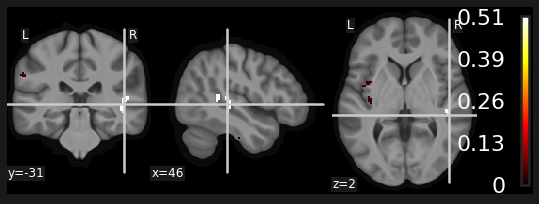

In [33]:
# visualize p values
con_id = '0010'
voxel_threshold = 0.005

plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/con%s_p%s_clustere_corrp_tstat1.nii.gz' %(con_id, voxel_threshold),
                      bg_img = anat_mean,
#                       threshold = 0
                      )

p = nib.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/con%s_p%s_clustere_corrp_tstat1.nii.gz' %(con_id, voxel_threshold))

p_data = p.get_data()
np.max(p_data)

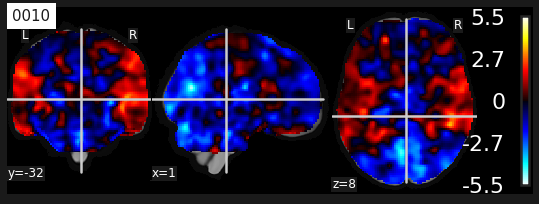

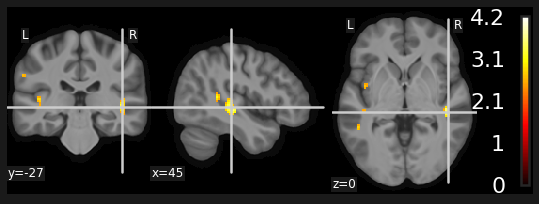

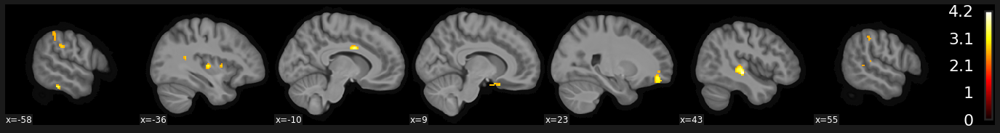

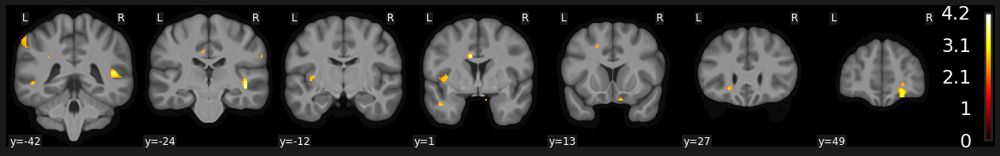

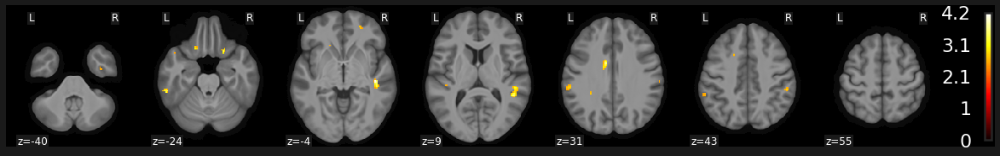

...

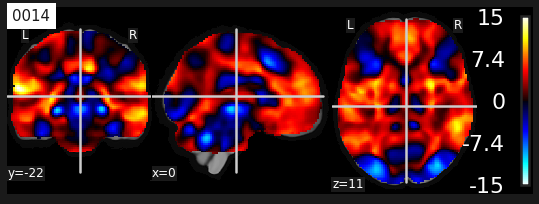

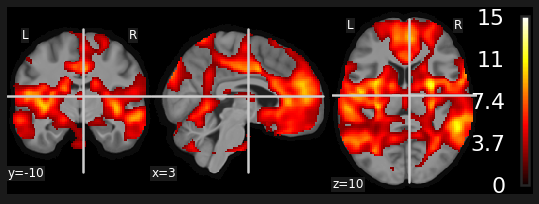

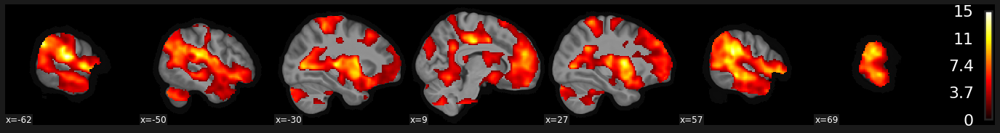

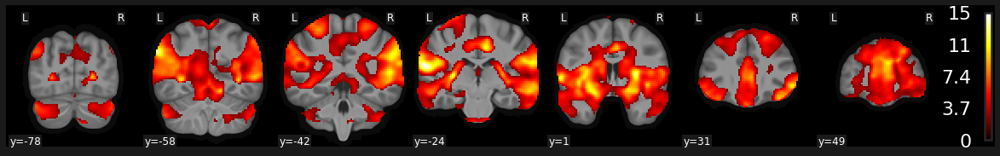

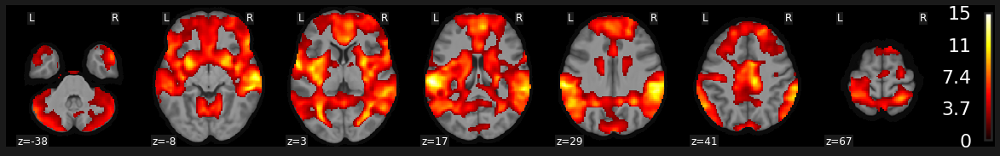

In [36]:
# visualize thresholded t values
con_ids = ['0010', '0011', '0012', '0013', '0014']
voxel_threshold = 0.01

for con_id in con_ids:
    
    t_plot = nib.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/con%s_p%s_tstat1.nii.gz' %(con_id, voxel_threshold))
    p = nib.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/con%s_p%s_clustere_corrp_tstat1.nii.gz' %(con_id, voxel_threshold))

    # thr = 0.95
    t_plot_data = t_plot.get_data()
    p_data = p.get_data()

    # threshold raw t map by p values
    p_mask = p_data == 0
    t_plot_data[p_mask] = 0    
    
    plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/con%s_p%s_tstat1.nii.gz' %(con_id, voxel_threshold),
                          bg_img = anat_mean,
                          title = con_id)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean,
                           display_mode="x", 
                           colorbar=True)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean,
                           display_mode="y",
                           colorbar=True)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean,
                           display_mode="z",
                           colorbar=True)

In [9]:
con_id = '0010'
t_plot = nib.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/con%s_p0.001_tstat1.nii.gz' %con_id)

In [11]:
tmp = t_plot.get_data()

In [19]:
size = tmp.shape

In [20]:
size[0]*size[1]*size[2]

1082035

## TFCE

Positive SV maps <a class = "anchor" id = "tfce_pos-bullet"></a>

In [ ]:
# concatenate scans
# con_id = '0012'

# con_all = {}

# for i in sub_num:
#     con_image = glob.glob('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_reward/1stLevel/_subject_id_' + str(i) + '/con_' + con_id + '.nii')
#     con_all[str(i)] = list(con_image)
# # con_all
# # len(con_all)

# # smooth, fwhm = none
# smooth_con_all = []

# for k, v in con_all.items():
#     smooth_con = image.smooth_img(v[0],None) #  If fwhm is None, no filtering is performed (useful when just removal of non-finite values is needed).
#     print(v)
#     smooth_con_all.append(smooth_con)
    
# #     plotting.plot_glass_brain(smooth_con, colorbar = True)

# # concatenate
# con_concat = image.concat_imgs(smooth_con_all, auto_resample = True)
# con_concat.to_filename(os.path.join(out_root, 'imaging', 'Sink_resp_reward', 'reward_glm_con%s_all_sub.nii.gz' %con_id))



In [52]:
con_id = '0012'
cluster_thr = fsl.Randomise(in_file = os.path.join(out_root, 'imaging', 'Sink_resp_reward', 'reward_glm_con%s_all_sub.nii.gz' %con_id),
                            mask = '/home/rj299/project/mdm_analysis/output/imaging/wb_mask_group.nii.gz',
                            base_name = os.path.join(out_root, 'imaging', 'Sink_resp_reward', 'con%s' %con_id),
                            one_sample_group_mean = True,
                            tfce = True,
                            vox_p_values = True,
                            num_perm = 5000)
cluster_thr.run()

200518-23:39:53,770 nipype.interface INFO:
	 stdout 2020-05-18T23:39:53.770295:randomise options: -i /home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_reward/reward_glm_con0012_all_sub.nii.gz -o /home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_reward/con0012 -m /home/rj299/project/mdm_analysis/output/imaging/wb_mask_group.nii.gz -n 5000 -1 -T -x 
200518-23:39:54,686 nipype.interface INFO:
	 stdout 2020-05-18T23:39:54.686091:Loading Data: 
200518-23:39:54,708 nipype.interface INFO:
	 stdout 2020-05-18T23:39:54.707955:Data loaded
200518-23:39:54,751 nipype.interface INFO:
	 stdout 2020-05-18T23:39:54.751617:One-sample design detected; sign-flipping instead of permuting.
200518-23:39:54,757 nipype.interface INFO:
	 stdout 2020-05-18T23:39:54.757303:8.58993e+09 sign-flips required for exhaustive test of t-test 1
200518-23:39:54,779 nipype.interface INFO:
	 stdout 2020-05-18T23:39:54.779394:Doing 5000 random permutations
200518-23:39:54,784 nipype.interface INFO:
	 stdo

200518-23:40:23,668 nipype.interface INFO:
	 stdout 2020-05-18T23:40:23.667950:Starting permutation 72
200518-23:40:24,108 nipype.interface INFO:
	 stdout 2020-05-18T23:40:24.108650:Starting permutation 73
200518-23:40:24,386 nipype.interface INFO:
	 stdout 2020-05-18T23:40:24.386108:Starting permutation 74
200518-23:40:24,650 nipype.interface INFO:
	 stdout 2020-05-18T23:40:24.650667:Starting permutation 75
200518-23:40:24,910 nipype.interface INFO:
	 stdout 2020-05-18T23:40:24.910405:Starting permutation 76
200518-23:40:25,434 nipype.interface INFO:
	 stdout 2020-05-18T23:40:25.434883:Starting permutation 77
200518-23:40:26,105 nipype.interface INFO:
	 stdout 2020-05-18T23:40:26.105380:Starting permutation 78
200518-23:40:26,604 nipype.interface INFO:
	 stdout 2020-05-18T23:40:26.604375:Starting permutation 79
200518-23:40:26,998 nipype.interface INFO:
	 stdout 2020-05-18T23:40:26.998372:Starting permutation 80
200518-23:40:27,529 nipype.interface INFO:
	 stdout 2020-05-18T23:40:27.5

200518-23:40:57,387 nipype.interface INFO:
	 stdout 2020-05-18T23:40:57.387203:Starting permutation 152
200518-23:40:57,629 nipype.interface INFO:
	 stdout 2020-05-18T23:40:57.629141:Starting permutation 153
200518-23:40:57,918 nipype.interface INFO:
	 stdout 2020-05-18T23:40:57.918684:Starting permutation 154
200518-23:40:58,346 nipype.interface INFO:
	 stdout 2020-05-18T23:40:58.345958:Starting permutation 155
200518-23:40:58,585 nipype.interface INFO:
	 stdout 2020-05-18T23:40:58.585751:Starting permutation 156
200518-23:40:59,30 nipype.interface INFO:
	 stdout 2020-05-18T23:40:59.030640:Starting permutation 157
200518-23:40:59,303 nipype.interface INFO:
	 stdout 2020-05-18T23:40:59.303915:Starting permutation 158
200518-23:40:59,594 nipype.interface INFO:
	 stdout 2020-05-18T23:40:59.594769:Starting permutation 159
200518-23:41:00,109 nipype.interface INFO:
	 stdout 2020-05-18T23:41:00.108978:Starting permutation 160
200518-23:41:00,499 nipype.interface INFO:
	 stdout 2020-05-18T23

200518-23:41:29,202 nipype.interface INFO:
	 stdout 2020-05-18T23:41:29.202910:Starting permutation 231
200518-23:41:29,822 nipype.interface INFO:
	 stdout 2020-05-18T23:41:29.822250:Starting permutation 232
200518-23:41:30,306 nipype.interface INFO:
	 stdout 2020-05-18T23:41:30.306538:Starting permutation 233
200518-23:41:30,662 nipype.interface INFO:
	 stdout 2020-05-18T23:41:30.662156:Starting permutation 234
200518-23:41:31,50 nipype.interface INFO:
	 stdout 2020-05-18T23:41:31.050167:Starting permutation 235
200518-23:41:31,495 nipype.interface INFO:
	 stdout 2020-05-18T23:41:31.495262:Starting permutation 236
200518-23:41:31,834 nipype.interface INFO:
	 stdout 2020-05-18T23:41:31.834379:Starting permutation 237
200518-23:41:32,281 nipype.interface INFO:
	 stdout 2020-05-18T23:41:32.280965:Starting permutation 238
200518-23:41:32,542 nipype.interface INFO:
	 stdout 2020-05-18T23:41:32.542182:Starting permutation 239
200518-23:41:32,929 nipype.interface INFO:
	 stdout 2020-05-18T23

200518-23:41:59,733 nipype.interface INFO:
	 stdout 2020-05-18T23:41:59.733110:Starting permutation 310
200518-23:42:00,54 nipype.interface INFO:
	 stdout 2020-05-18T23:42:00.054939:Starting permutation 311
200518-23:42:00,522 nipype.interface INFO:
	 stdout 2020-05-18T23:42:00.522559:Starting permutation 312
200518-23:42:00,809 nipype.interface INFO:
	 stdout 2020-05-18T23:42:00.809432:Starting permutation 313
200518-23:42:01,170 nipype.interface INFO:
	 stdout 2020-05-18T23:42:01.170519:Starting permutation 314
200518-23:42:01,647 nipype.interface INFO:
	 stdout 2020-05-18T23:42:01.647611:Starting permutation 315
200518-23:42:01,942 nipype.interface INFO:
	 stdout 2020-05-18T23:42:01.942172:Starting permutation 316
200518-23:42:02,338 nipype.interface INFO:
	 stdout 2020-05-18T23:42:02.338884:Starting permutation 317
200518-23:42:02,639 nipype.interface INFO:
	 stdout 2020-05-18T23:42:02.639139:Starting permutation 318
200518-23:42:02,949 nipype.interface INFO:
	 stdout 2020-05-18T23

200518-23:42:30,855 nipype.interface INFO:
	 stdout 2020-05-18T23:42:30.855796:Starting permutation 389
200518-23:42:31,187 nipype.interface INFO:
	 stdout 2020-05-18T23:42:31.187464:Starting permutation 390
200518-23:42:31,668 nipype.interface INFO:
	 stdout 2020-05-18T23:42:31.668047:Starting permutation 391
200518-23:42:32,307 nipype.interface INFO:
	 stdout 2020-05-18T23:42:32.307304:Starting permutation 392
200518-23:42:32,783 nipype.interface INFO:
	 stdout 2020-05-18T23:42:32.783908:Starting permutation 393
200518-23:42:33,228 nipype.interface INFO:
	 stdout 2020-05-18T23:42:33.228227:Starting permutation 394
200518-23:42:33,694 nipype.interface INFO:
	 stdout 2020-05-18T23:42:33.694109:Starting permutation 395
200518-23:42:34,164 nipype.interface INFO:
	 stdout 2020-05-18T23:42:34.164539:Starting permutation 396
200518-23:42:34,651 nipype.interface INFO:
	 stdout 2020-05-18T23:42:34.650969:Starting permutation 397
200518-23:42:35,225 nipype.interface INFO:
	 stdout 2020-05-18T2

200518-23:43:02,516 nipype.interface INFO:
	 stdout 2020-05-18T23:43:02.516240:Starting permutation 468
200518-23:43:02,829 nipype.interface INFO:
	 stdout 2020-05-18T23:43:02.829012:Starting permutation 469
200518-23:43:03,228 nipype.interface INFO:
	 stdout 2020-05-18T23:43:03.228498:Starting permutation 470
200518-23:43:03,541 nipype.interface INFO:
	 stdout 2020-05-18T23:43:03.540986:Starting permutation 471
200518-23:43:03,941 nipype.interface INFO:
	 stdout 2020-05-18T23:43:03.941015:Starting permutation 472
200518-23:43:04,373 nipype.interface INFO:
	 stdout 2020-05-18T23:43:04.373315:Starting permutation 473
200518-23:43:04,785 nipype.interface INFO:
	 stdout 2020-05-18T23:43:04.785888:Starting permutation 474
200518-23:43:05,209 nipype.interface INFO:
	 stdout 2020-05-18T23:43:05.209900:Starting permutation 475
200518-23:43:05,575 nipype.interface INFO:
	 stdout 2020-05-18T23:43:05.575090:Starting permutation 476
200518-23:43:05,933 nipype.interface INFO:
	 stdout 2020-05-18T2

200518-23:43:34,257 nipype.interface INFO:
	 stdout 2020-05-18T23:43:34.257053:Starting permutation 547
200518-23:43:34,616 nipype.interface INFO:
	 stdout 2020-05-18T23:43:34.616267:Starting permutation 548
200518-23:43:35,13 nipype.interface INFO:
	 stdout 2020-05-18T23:43:35.013381:Starting permutation 549
200518-23:43:35,508 nipype.interface INFO:
	 stdout 2020-05-18T23:43:35.508269:Starting permutation 550
200518-23:43:35,897 nipype.interface INFO:
	 stdout 2020-05-18T23:43:35.897503:Starting permutation 551
200518-23:43:36,176 nipype.interface INFO:
	 stdout 2020-05-18T23:43:36.176445:Starting permutation 552
200518-23:43:36,554 nipype.interface INFO:
	 stdout 2020-05-18T23:43:36.554089:Starting permutation 553
200518-23:43:36,866 nipype.interface INFO:
	 stdout 2020-05-18T23:43:36.866292:Starting permutation 554
200518-23:43:37,207 nipype.interface INFO:
	 stdout 2020-05-18T23:43:37.207537:Starting permutation 555
200518-23:43:37,714 nipype.interface INFO:
	 stdout 2020-05-18T23

200518-23:44:06,997 nipype.interface INFO:
	 stdout 2020-05-18T23:44:06.997655:Starting permutation 626
200518-23:44:07,533 nipype.interface INFO:
	 stdout 2020-05-18T23:44:07.533074:Starting permutation 627
200518-23:44:07,811 nipype.interface INFO:
	 stdout 2020-05-18T23:44:07.810995:Starting permutation 628
200518-23:44:08,156 nipype.interface INFO:
	 stdout 2020-05-18T23:44:08.156225:Starting permutation 629
200518-23:44:08,437 nipype.interface INFO:
	 stdout 2020-05-18T23:44:08.437159:Starting permutation 630
200518-23:44:08,990 nipype.interface INFO:
	 stdout 2020-05-18T23:44:08.990240:Starting permutation 631
200518-23:44:09,851 nipype.interface INFO:
	 stdout 2020-05-18T23:44:09.851247:Starting permutation 632
200518-23:44:10,287 nipype.interface INFO:
	 stdout 2020-05-18T23:44:10.287442:Starting permutation 633
200518-23:44:10,734 nipype.interface INFO:
	 stdout 2020-05-18T23:44:10.733962:Starting permutation 634
200518-23:44:11,156 nipype.interface INFO:
	 stdout 2020-05-18T2

200518-23:44:39,352 nipype.interface INFO:
	 stdout 2020-05-18T23:44:39.352694:Starting permutation 705
200518-23:44:39,734 nipype.interface INFO:
	 stdout 2020-05-18T23:44:39.734292:Starting permutation 706
200518-23:44:40,212 nipype.interface INFO:
	 stdout 2020-05-18T23:44:40.212827:Starting permutation 707
200518-23:44:40,599 nipype.interface INFO:
	 stdout 2020-05-18T23:44:40.599299:Starting permutation 708
200518-23:44:40,880 nipype.interface INFO:
	 stdout 2020-05-18T23:44:40.880657:Starting permutation 709
200518-23:44:41,188 nipype.interface INFO:
	 stdout 2020-05-18T23:44:41.188903:Starting permutation 710
200518-23:44:41,786 nipype.interface INFO:
	 stdout 2020-05-18T23:44:41.786242:Starting permutation 711
200518-23:44:42,50 nipype.interface INFO:
	 stdout 2020-05-18T23:44:42.050771:Starting permutation 712
200518-23:44:42,444 nipype.interface INFO:
	 stdout 2020-05-18T23:44:42.444186:Starting permutation 713
200518-23:44:42,840 nipype.interface INFO:
	 stdout 2020-05-18T23

200518-23:45:11,606 nipype.interface INFO:
	 stdout 2020-05-18T23:45:11.605964:Starting permutation 784
200518-23:45:12,21 nipype.interface INFO:
	 stdout 2020-05-18T23:45:12.021884:Starting permutation 785
200518-23:45:12,299 nipype.interface INFO:
	 stdout 2020-05-18T23:45:12.299228:Starting permutation 786
200518-23:45:12,757 nipype.interface INFO:
	 stdout 2020-05-18T23:45:12.756947:Starting permutation 787
200518-23:45:13,393 nipype.interface INFO:
	 stdout 2020-05-18T23:45:13.393421:Starting permutation 788
200518-23:45:13,920 nipype.interface INFO:
	 stdout 2020-05-18T23:45:13.920453:Starting permutation 789
200518-23:45:14,281 nipype.interface INFO:
	 stdout 2020-05-18T23:45:14.281904:Starting permutation 790
200518-23:45:14,552 nipype.interface INFO:
	 stdout 2020-05-18T23:45:14.552828:Starting permutation 791
200518-23:45:14,994 nipype.interface INFO:
	 stdout 2020-05-18T23:45:14.994632:Starting permutation 792
200518-23:45:15,477 nipype.interface INFO:
	 stdout 2020-05-18T23

200518-23:45:41,921 nipype.interface INFO:
	 stdout 2020-05-18T23:45:41.921176:Starting permutation 863
200518-23:45:42,228 nipype.interface INFO:
	 stdout 2020-05-18T23:45:42.228614:Starting permutation 864
200518-23:45:42,674 nipype.interface INFO:
	 stdout 2020-05-18T23:45:42.674253:Starting permutation 865
200518-23:45:43,178 nipype.interface INFO:
	 stdout 2020-05-18T23:45:43.178490:Starting permutation 866
200518-23:45:43,578 nipype.interface INFO:
	 stdout 2020-05-18T23:45:43.578117:Starting permutation 867
200518-23:45:43,952 nipype.interface INFO:
	 stdout 2020-05-18T23:45:43.952126:Starting permutation 868
200518-23:45:44,320 nipype.interface INFO:
	 stdout 2020-05-18T23:45:44.320854:Starting permutation 869
200518-23:45:44,660 nipype.interface INFO:
	 stdout 2020-05-18T23:45:44.660520:Starting permutation 870
200518-23:45:45,15 nipype.interface INFO:
	 stdout 2020-05-18T23:45:45.015872:Starting permutation 871
200518-23:45:45,402 nipype.interface INFO:
	 stdout 2020-05-18T23

200518-23:46:12,977 nipype.interface INFO:
	 stdout 2020-05-18T23:46:12.977176:Starting permutation 942
200518-23:46:13,256 nipype.interface INFO:
	 stdout 2020-05-18T23:46:13.256615:Starting permutation 943
200518-23:46:13,519 nipype.interface INFO:
	 stdout 2020-05-18T23:46:13.519456:Starting permutation 944
200518-23:46:13,781 nipype.interface INFO:
	 stdout 2020-05-18T23:46:13.781289:Starting permutation 945
200518-23:46:14,292 nipype.interface INFO:
	 stdout 2020-05-18T23:46:14.292293:Starting permutation 946
200518-23:46:14,582 nipype.interface INFO:
	 stdout 2020-05-18T23:46:14.582606:Starting permutation 947
200518-23:46:14,973 nipype.interface INFO:
	 stdout 2020-05-18T23:46:14.973461:Starting permutation 948
200518-23:46:15,183 nipype.interface INFO:
	 stdout 2020-05-18T23:46:15.183239:Starting permutation 949
200518-23:46:15,547 nipype.interface INFO:
	 stdout 2020-05-18T23:46:15.547101:Starting permutation 950
200518-23:46:15,905 nipype.interface INFO:
	 stdout 2020-05-18T2

200518-23:46:43,983 nipype.interface INFO:
	 stdout 2020-05-18T23:46:43.983003:Starting permutation 1021
200518-23:46:44,228 nipype.interface INFO:
	 stdout 2020-05-18T23:46:44.228796:Starting permutation 1022
200518-23:46:44,521 nipype.interface INFO:
	 stdout 2020-05-18T23:46:44.521933:Starting permutation 1023
200518-23:46:45,177 nipype.interface INFO:
	 stdout 2020-05-18T23:46:45.177673:Starting permutation 1024
200518-23:46:45,542 nipype.interface INFO:
	 stdout 2020-05-18T23:46:45.542550:Starting permutation 1025
200518-23:46:45,848 nipype.interface INFO:
	 stdout 2020-05-18T23:46:45.848723:Starting permutation 1026
200518-23:46:46,65 nipype.interface INFO:
	 stdout 2020-05-18T23:46:46.065335:Starting permutation 1027
200518-23:46:46,421 nipype.interface INFO:
	 stdout 2020-05-18T23:46:46.421936:Starting permutation 1028
200518-23:46:46,690 nipype.interface INFO:
	 stdout 2020-05-18T23:46:46.690451:Starting permutation 1029
200518-23:46:47,100 nipype.interface INFO:
	 stdout 2020

200518-23:47:16,627 nipype.interface INFO:
	 stdout 2020-05-18T23:47:16.627441:Starting permutation 1100
200518-23:47:16,945 nipype.interface INFO:
	 stdout 2020-05-18T23:47:16.945619:Starting permutation 1101
200518-23:47:17,441 nipype.interface INFO:
	 stdout 2020-05-18T23:47:17.441336:Starting permutation 1102
200518-23:47:17,795 nipype.interface INFO:
	 stdout 2020-05-18T23:47:17.795385:Starting permutation 1103
200518-23:47:18,185 nipype.interface INFO:
	 stdout 2020-05-18T23:47:18.185239:Starting permutation 1104
200518-23:47:18,588 nipype.interface INFO:
	 stdout 2020-05-18T23:47:18.588224:Starting permutation 1105
200518-23:47:19,183 nipype.interface INFO:
	 stdout 2020-05-18T23:47:19.183877:Starting permutation 1106
200518-23:47:19,595 nipype.interface INFO:
	 stdout 2020-05-18T23:47:19.595888:Starting permutation 1107
200518-23:47:19,937 nipype.interface INFO:
	 stdout 2020-05-18T23:47:19.937666:Starting permutation 1108
200518-23:47:20,213 nipype.interface INFO:
	 stdout 202

200518-23:47:47,746 nipype.interface INFO:
	 stdout 2020-05-18T23:47:47.746723:Starting permutation 1179
200518-23:47:48,232 nipype.interface INFO:
	 stdout 2020-05-18T23:47:48.232498:Starting permutation 1180
200518-23:47:48,696 nipype.interface INFO:
	 stdout 2020-05-18T23:47:48.696334:Starting permutation 1181
200518-23:47:49,279 nipype.interface INFO:
	 stdout 2020-05-18T23:47:49.278966:Starting permutation 1182
200518-23:47:50,26 nipype.interface INFO:
	 stdout 2020-05-18T23:47:50.025958:Starting permutation 1183
200518-23:47:50,512 nipype.interface INFO:
	 stdout 2020-05-18T23:47:50.512726:Starting permutation 1184
200518-23:47:50,813 nipype.interface INFO:
	 stdout 2020-05-18T23:47:50.813245:Starting permutation 1185
200518-23:47:51,179 nipype.interface INFO:
	 stdout 2020-05-18T23:47:51.179913:Starting permutation 1186
200518-23:47:51,706 nipype.interface INFO:
	 stdout 2020-05-18T23:47:51.706238:Starting permutation 1187
200518-23:47:52,243 nipype.interface INFO:
	 stdout 2020

200518-23:48:19,336 nipype.interface INFO:
	 stdout 2020-05-18T23:48:19.336699:Starting permutation 1258
200518-23:48:20,0 nipype.interface INFO:
	 stdout 2020-05-18T23:48:20.000174:Starting permutation 1259
200518-23:48:20,467 nipype.interface INFO:
	 stdout 2020-05-18T23:48:20.467611:Starting permutation 1260
200518-23:48:21,16 nipype.interface INFO:
	 stdout 2020-05-18T23:48:21.016065:Starting permutation 1261
200518-23:48:21,272 nipype.interface INFO:
	 stdout 2020-05-18T23:48:21.272738:Starting permutation 1262
200518-23:48:21,699 nipype.interface INFO:
	 stdout 2020-05-18T23:48:21.699303:Starting permutation 1263
200518-23:48:22,125 nipype.interface INFO:
	 stdout 2020-05-18T23:48:22.125367:Starting permutation 1264
200518-23:48:22,478 nipype.interface INFO:
	 stdout 2020-05-18T23:48:22.478235:Starting permutation 1265
200518-23:48:22,864 nipype.interface INFO:
	 stdout 2020-05-18T23:48:22.863968:Starting permutation 1266
200518-23:48:23,300 nipype.interface INFO:
	 stdout 2020-0

200518-23:48:50,968 nipype.interface INFO:
	 stdout 2020-05-18T23:48:50.968022:Starting permutation 1337
200518-23:48:51,393 nipype.interface INFO:
	 stdout 2020-05-18T23:48:51.393262:Starting permutation 1338
200518-23:48:51,660 nipype.interface INFO:
	 stdout 2020-05-18T23:48:51.660454:Starting permutation 1339
200518-23:48:51,925 nipype.interface INFO:
	 stdout 2020-05-18T23:48:51.925232:Starting permutation 1340
200518-23:48:52,317 nipype.interface INFO:
	 stdout 2020-05-18T23:48:52.317789:Starting permutation 1341
200518-23:48:52,769 nipype.interface INFO:
	 stdout 2020-05-18T23:48:52.769771:Starting permutation 1342
200518-23:48:53,4 nipype.interface INFO:
	 stdout 2020-05-18T23:48:53.004717:Starting permutation 1343
200518-23:48:53,513 nipype.interface INFO:
	 stdout 2020-05-18T23:48:53.513551:Starting permutation 1344
200518-23:48:53,761 nipype.interface INFO:
	 stdout 2020-05-18T23:48:53.761229:Starting permutation 1345
200518-23:48:54,42 nipype.interface INFO:
	 stdout 2020-0

200518-23:49:21,790 nipype.interface INFO:
	 stdout 2020-05-18T23:49:21.790429:Starting permutation 1416
200518-23:49:22,416 nipype.interface INFO:
	 stdout 2020-05-18T23:49:22.416135:Starting permutation 1417
200518-23:49:22,784 nipype.interface INFO:
	 stdout 2020-05-18T23:49:22.784574:Starting permutation 1418
200518-23:49:23,391 nipype.interface INFO:
	 stdout 2020-05-18T23:49:23.391459:Starting permutation 1419
200518-23:49:24,127 nipype.interface INFO:
	 stdout 2020-05-18T23:49:24.127406:Starting permutation 1420
200518-23:49:24,840 nipype.interface INFO:
	 stdout 2020-05-18T23:49:24.840381:Starting permutation 1421
200518-23:49:25,194 nipype.interface INFO:
	 stdout 2020-05-18T23:49:25.194290:Starting permutation 1422
200518-23:49:25,627 nipype.interface INFO:
	 stdout 2020-05-18T23:49:25.627395:Starting permutation 1423
200518-23:49:26,153 nipype.interface INFO:
	 stdout 2020-05-18T23:49:26.153613:Starting permutation 1424
200518-23:49:26,744 nipype.interface INFO:
	 stdout 202

200518-23:50:01,496 nipype.interface INFO:
	 stdout 2020-05-18T23:50:01.496203:Starting permutation 1495
200518-23:50:02,115 nipype.interface INFO:
	 stdout 2020-05-18T23:50:02.115690:Starting permutation 1496
200518-23:50:02,566 nipype.interface INFO:
	 stdout 2020-05-18T23:50:02.565949:Starting permutation 1497
200518-23:50:02,843 nipype.interface INFO:
	 stdout 2020-05-18T23:50:02.843391:Starting permutation 1498
200518-23:50:03,396 nipype.interface INFO:
	 stdout 2020-05-18T23:50:03.396342:Starting permutation 1499
200518-23:50:03,847 nipype.interface INFO:
	 stdout 2020-05-18T23:50:03.847587:Starting permutation 1500
200518-23:50:04,366 nipype.interface INFO:
	 stdout 2020-05-18T23:50:04.366245:Starting permutation 1501
200518-23:50:04,690 nipype.interface INFO:
	 stdout 2020-05-18T23:50:04.690840:Starting permutation 1502
200518-23:50:05,158 nipype.interface INFO:
	 stdout 2020-05-18T23:50:05.158398:Starting permutation 1503
200518-23:50:05,537 nipype.interface INFO:
	 stdout 202

200518-23:50:32,624 nipype.interface INFO:
	 stdout 2020-05-18T23:50:32.624388:Starting permutation 1574
200518-23:50:32,861 nipype.interface INFO:
	 stdout 2020-05-18T23:50:32.861367:Starting permutation 1575
200518-23:50:33,128 nipype.interface INFO:
	 stdout 2020-05-18T23:50:33.128885:Starting permutation 1576
200518-23:50:33,584 nipype.interface INFO:
	 stdout 2020-05-18T23:50:33.584712:Starting permutation 1577
200518-23:50:34,117 nipype.interface INFO:
	 stdout 2020-05-18T23:50:34.116946:Starting permutation 1578
200518-23:50:34,529 nipype.interface INFO:
	 stdout 2020-05-18T23:50:34.529287:Starting permutation 1579
200518-23:50:34,919 nipype.interface INFO:
	 stdout 2020-05-18T23:50:34.919644:Starting permutation 1580
200518-23:50:35,168 nipype.interface INFO:
	 stdout 2020-05-18T23:50:35.168464:Starting permutation 1581
200518-23:50:35,404 nipype.interface INFO:
	 stdout 2020-05-18T23:50:35.404881:Starting permutation 1582
200518-23:50:35,783 nipype.interface INFO:
	 stdout 202

200518-23:51:05,206 nipype.interface INFO:
	 stdout 2020-05-18T23:51:05.206927:Starting permutation 1653
200518-23:51:05,914 nipype.interface INFO:
	 stdout 2020-05-18T23:51:05.914084:Starting permutation 1654
200518-23:51:06,197 nipype.interface INFO:
	 stdout 2020-05-18T23:51:06.197285:Starting permutation 1655
200518-23:51:06,547 nipype.interface INFO:
	 stdout 2020-05-18T23:51:06.546959:Starting permutation 1656
200518-23:51:07,38 nipype.interface INFO:
	 stdout 2020-05-18T23:51:07.038606:Starting permutation 1657
200518-23:51:07,383 nipype.interface INFO:
	 stdout 2020-05-18T23:51:07.383160:Starting permutation 1658
200518-23:51:07,769 nipype.interface INFO:
	 stdout 2020-05-18T23:51:07.769024:Starting permutation 1659
200518-23:51:08,118 nipype.interface INFO:
	 stdout 2020-05-18T23:51:08.118831:Starting permutation 1660
200518-23:51:08,592 nipype.interface INFO:
	 stdout 2020-05-18T23:51:08.592526:Starting permutation 1661
200518-23:51:08,926 nipype.interface INFO:
	 stdout 2020

200518-23:51:38,493 nipype.interface INFO:
	 stdout 2020-05-18T23:51:38.493917:Starting permutation 1732
200518-23:51:38,881 nipype.interface INFO:
	 stdout 2020-05-18T23:51:38.881589:Starting permutation 1733
200518-23:51:39,304 nipype.interface INFO:
	 stdout 2020-05-18T23:51:39.304049:Starting permutation 1734
200518-23:51:39,719 nipype.interface INFO:
	 stdout 2020-05-18T23:51:39.719566:Starting permutation 1735
200518-23:51:40,109 nipype.interface INFO:
	 stdout 2020-05-18T23:51:40.109118:Starting permutation 1736
200518-23:51:40,477 nipype.interface INFO:
	 stdout 2020-05-18T23:51:40.477320:Starting permutation 1737
200518-23:51:40,838 nipype.interface INFO:
	 stdout 2020-05-18T23:51:40.838705:Starting permutation 1738
200518-23:51:41,245 nipype.interface INFO:
	 stdout 2020-05-18T23:51:41.245814:Starting permutation 1739
200518-23:51:41,628 nipype.interface INFO:
	 stdout 2020-05-18T23:51:41.628606:Starting permutation 1740
200518-23:51:41,902 nipype.interface INFO:
	 stdout 202

200518-23:52:10,991 nipype.interface INFO:
	 stdout 2020-05-18T23:52:10.991391:Starting permutation 1811
200518-23:52:11,266 nipype.interface INFO:
	 stdout 2020-05-18T23:52:11.266397:Starting permutation 1812
200518-23:52:11,758 nipype.interface INFO:
	 stdout 2020-05-18T23:52:11.758485:Starting permutation 1813
200518-23:52:12,144 nipype.interface INFO:
	 stdout 2020-05-18T23:52:12.144106:Starting permutation 1814
200518-23:52:12,523 nipype.interface INFO:
	 stdout 2020-05-18T23:52:12.523682:Starting permutation 1815
200518-23:52:12,933 nipype.interface INFO:
	 stdout 2020-05-18T23:52:12.933202:Starting permutation 1816
200518-23:52:13,436 nipype.interface INFO:
	 stdout 2020-05-18T23:52:13.436242:Starting permutation 1817
200518-23:52:13,801 nipype.interface INFO:
	 stdout 2020-05-18T23:52:13.801780:Starting permutation 1818
200518-23:52:14,172 nipype.interface INFO:
	 stdout 2020-05-18T23:52:14.172238:Starting permutation 1819
200518-23:52:14,537 nipype.interface INFO:
	 stdout 202

200518-23:52:42,185 nipype.interface INFO:
	 stdout 2020-05-18T23:52:42.185490:Starting permutation 1890
200518-23:52:42,498 nipype.interface INFO:
	 stdout 2020-05-18T23:52:42.498314:Starting permutation 1891
200518-23:52:42,938 nipype.interface INFO:
	 stdout 2020-05-18T23:52:42.938279:Starting permutation 1892
200518-23:52:43,494 nipype.interface INFO:
	 stdout 2020-05-18T23:52:43.494204:Starting permutation 1893
200518-23:52:43,738 nipype.interface INFO:
	 stdout 2020-05-18T23:52:43.738602:Starting permutation 1894
200518-23:52:44,208 nipype.interface INFO:
	 stdout 2020-05-18T23:52:44.208064:Starting permutation 1895
200518-23:52:44,578 nipype.interface INFO:
	 stdout 2020-05-18T23:52:44.578867:Starting permutation 1896
200518-23:52:44,803 nipype.interface INFO:
	 stdout 2020-05-18T23:52:44.802953:Starting permutation 1897
200518-23:52:45,195 nipype.interface INFO:
	 stdout 2020-05-18T23:52:45.195185:Starting permutation 1898
200518-23:52:45,609 nipype.interface INFO:
	 stdout 202

200518-23:53:13,946 nipype.interface INFO:
	 stdout 2020-05-18T23:53:13.946257:Starting permutation 1969
200518-23:53:14,414 nipype.interface INFO:
	 stdout 2020-05-18T23:53:14.414913:Starting permutation 1970
200518-23:53:14,876 nipype.interface INFO:
	 stdout 2020-05-18T23:53:14.875953:Starting permutation 1971
200518-23:53:15,255 nipype.interface INFO:
	 stdout 2020-05-18T23:53:15.255379:Starting permutation 1972
200518-23:53:15,507 nipype.interface INFO:
	 stdout 2020-05-18T23:53:15.507921:Starting permutation 1973
200518-23:53:16,120 nipype.interface INFO:
	 stdout 2020-05-18T23:53:16.120223:Starting permutation 1974
200518-23:53:16,485 nipype.interface INFO:
	 stdout 2020-05-18T23:53:16.485612:Starting permutation 1975
200518-23:53:16,889 nipype.interface INFO:
	 stdout 2020-05-18T23:53:16.889457:Starting permutation 1976
200518-23:53:17,316 nipype.interface INFO:
	 stdout 2020-05-18T23:53:17.316605:Starting permutation 1977
200518-23:53:17,794 nipype.interface INFO:
	 stdout 202

200518-23:53:45,998 nipype.interface INFO:
	 stdout 2020-05-18T23:53:45.998129:Starting permutation 2048
200518-23:53:46,308 nipype.interface INFO:
	 stdout 2020-05-18T23:53:46.308464:Starting permutation 2049
200518-23:53:46,575 nipype.interface INFO:
	 stdout 2020-05-18T23:53:46.575764:Starting permutation 2050
200518-23:53:47,59 nipype.interface INFO:
	 stdout 2020-05-18T23:53:47.059659:Starting permutation 2051
200518-23:53:47,397 nipype.interface INFO:
	 stdout 2020-05-18T23:53:47.397682:Starting permutation 2052
200518-23:53:47,869 nipype.interface INFO:
	 stdout 2020-05-18T23:53:47.869675:Starting permutation 2053
200518-23:53:48,208 nipype.interface INFO:
	 stdout 2020-05-18T23:53:48.208767:Starting permutation 2054
200518-23:53:48,535 nipype.interface INFO:
	 stdout 2020-05-18T23:53:48.535456:Starting permutation 2055
200518-23:53:48,913 nipype.interface INFO:
	 stdout 2020-05-18T23:53:48.913397:Starting permutation 2056
200518-23:53:49,445 nipype.interface INFO:
	 stdout 2020

200518-23:54:17,617 nipype.interface INFO:
	 stdout 2020-05-18T23:54:17.617816:Starting permutation 2127
200518-23:54:18,60 nipype.interface INFO:
	 stdout 2020-05-18T23:54:18.060427:Starting permutation 2128
200518-23:54:18,384 nipype.interface INFO:
	 stdout 2020-05-18T23:54:18.383953:Starting permutation 2129
200518-23:54:18,789 nipype.interface INFO:
	 stdout 2020-05-18T23:54:18.789885:Starting permutation 2130
200518-23:54:19,249 nipype.interface INFO:
	 stdout 2020-05-18T23:54:19.249328:Starting permutation 2131
200518-23:54:19,599 nipype.interface INFO:
	 stdout 2020-05-18T23:54:19.599317:Starting permutation 2132
200518-23:54:19,993 nipype.interface INFO:
	 stdout 2020-05-18T23:54:19.993592:Starting permutation 2133
200518-23:54:20,253 nipype.interface INFO:
	 stdout 2020-05-18T23:54:20.253521:Starting permutation 2134
200518-23:54:20,542 nipype.interface INFO:
	 stdout 2020-05-18T23:54:20.542879:Starting permutation 2135
200518-23:54:20,900 nipype.interface INFO:
	 stdout 2020

200518-23:54:49,840 nipype.interface INFO:
	 stdout 2020-05-18T23:54:49.840507:Starting permutation 2206
200518-23:54:50,405 nipype.interface INFO:
	 stdout 2020-05-18T23:54:50.405250:Starting permutation 2207
200518-23:54:50,823 nipype.interface INFO:
	 stdout 2020-05-18T23:54:50.823761:Starting permutation 2208
200518-23:54:51,385 nipype.interface INFO:
	 stdout 2020-05-18T23:54:51.385278:Starting permutation 2209
200518-23:54:51,693 nipype.interface INFO:
	 stdout 2020-05-18T23:54:51.693768:Starting permutation 2210
200518-23:54:52,336 nipype.interface INFO:
	 stdout 2020-05-18T23:54:52.336232:Starting permutation 2211
200518-23:54:52,731 nipype.interface INFO:
	 stdout 2020-05-18T23:54:52.731459:Starting permutation 2212
200518-23:54:53,71 nipype.interface INFO:
	 stdout 2020-05-18T23:54:53.071751:Starting permutation 2213
200518-23:54:53,427 nipype.interface INFO:
	 stdout 2020-05-18T23:54:53.427814:Starting permutation 2214
200518-23:54:53,954 nipype.interface INFO:
	 stdout 2020

200518-23:55:22,202 nipype.interface INFO:
	 stdout 2020-05-18T23:55:22.202470:Starting permutation 2285
200518-23:55:22,626 nipype.interface INFO:
	 stdout 2020-05-18T23:55:22.626354:Starting permutation 2286
200518-23:55:23,36 nipype.interface INFO:
	 stdout 2020-05-18T23:55:23.036679:Starting permutation 2287
200518-23:55:23,377 nipype.interface INFO:
	 stdout 2020-05-18T23:55:23.377833:Starting permutation 2288
200518-23:55:23,823 nipype.interface INFO:
	 stdout 2020-05-18T23:55:23.823611:Starting permutation 2289
200518-23:55:24,237 nipype.interface INFO:
	 stdout 2020-05-18T23:55:24.237371:Starting permutation 2290
200518-23:55:24,596 nipype.interface INFO:
	 stdout 2020-05-18T23:55:24.596582:Starting permutation 2291
200518-23:55:24,871 nipype.interface INFO:
	 stdout 2020-05-18T23:55:24.871407:Starting permutation 2292
200518-23:55:25,432 nipype.interface INFO:
	 stdout 2020-05-18T23:55:25.432674:Starting permutation 2293
200518-23:55:25,901 nipype.interface INFO:
	 stdout 2020

200518-23:55:54,923 nipype.interface INFO:
	 stdout 2020-05-18T23:55:54.923798:Starting permutation 2364
200518-23:55:55,362 nipype.interface INFO:
	 stdout 2020-05-18T23:55:55.362031:Starting permutation 2365
200518-23:55:55,924 nipype.interface INFO:
	 stdout 2020-05-18T23:55:55.924013:Starting permutation 2366
200518-23:55:56,261 nipype.interface INFO:
	 stdout 2020-05-18T23:55:56.261439:Starting permutation 2367
200518-23:55:56,647 nipype.interface INFO:
	 stdout 2020-05-18T23:55:56.647000:Starting permutation 2368
200518-23:55:56,975 nipype.interface INFO:
	 stdout 2020-05-18T23:55:56.975403:Starting permutation 2369
200518-23:55:57,381 nipype.interface INFO:
	 stdout 2020-05-18T23:55:57.381544:Starting permutation 2370
200518-23:55:57,699 nipype.interface INFO:
	 stdout 2020-05-18T23:55:57.699321:Starting permutation 2371
200518-23:55:57,979 nipype.interface INFO:
	 stdout 2020-05-18T23:55:57.979834:Starting permutation 2372
200518-23:55:58,420 nipype.interface INFO:
	 stdout 202

200518-23:56:26,270 nipype.interface INFO:
	 stdout 2020-05-18T23:56:26.270073:Starting permutation 2443
200518-23:56:26,560 nipype.interface INFO:
	 stdout 2020-05-18T23:56:26.560041:Starting permutation 2444
200518-23:56:26,920 nipype.interface INFO:
	 stdout 2020-05-18T23:56:26.920385:Starting permutation 2445
200518-23:56:27,460 nipype.interface INFO:
	 stdout 2020-05-18T23:56:27.460370:Starting permutation 2446
200518-23:56:27,995 nipype.interface INFO:
	 stdout 2020-05-18T23:56:27.995545:Starting permutation 2447
200518-23:56:28,543 nipype.interface INFO:
	 stdout 2020-05-18T23:56:28.543923:Starting permutation 2448
200518-23:56:28,815 nipype.interface INFO:
	 stdout 2020-05-18T23:56:28.815542:Starting permutation 2449
200518-23:56:29,429 nipype.interface INFO:
	 stdout 2020-05-18T23:56:29.429633:Starting permutation 2450
200518-23:56:29,888 nipype.interface INFO:
	 stdout 2020-05-18T23:56:29.888561:Starting permutation 2451
200518-23:56:30,426 nipype.interface INFO:
	 stdout 202

200518-23:56:59,636 nipype.interface INFO:
	 stdout 2020-05-18T23:56:59.636811:Starting permutation 2522
200518-23:56:59,961 nipype.interface INFO:
	 stdout 2020-05-18T23:56:59.961416:Starting permutation 2523
200518-23:57:00,401 nipype.interface INFO:
	 stdout 2020-05-18T23:57:00.400992:Starting permutation 2524
200518-23:57:00,731 nipype.interface INFO:
	 stdout 2020-05-18T23:57:00.731286:Starting permutation 2525
200518-23:57:01,72 nipype.interface INFO:
	 stdout 2020-05-18T23:57:01.072105:Starting permutation 2526
200518-23:57:01,329 nipype.interface INFO:
	 stdout 2020-05-18T23:57:01.329726:Starting permutation 2527
200518-23:57:01,883 nipype.interface INFO:
	 stdout 2020-05-18T23:57:01.883917:Starting permutation 2528
200518-23:57:02,309 nipype.interface INFO:
	 stdout 2020-05-18T23:57:02.309087:Starting permutation 2529
200518-23:57:02,618 nipype.interface INFO:
	 stdout 2020-05-18T23:57:02.618835:Starting permutation 2530
200518-23:57:02,916 nipype.interface INFO:
	 stdout 2020

200518-23:57:32,816 nipype.interface INFO:
	 stdout 2020-05-18T23:57:32.816542:Starting permutation 2601
200518-23:57:33,149 nipype.interface INFO:
	 stdout 2020-05-18T23:57:33.148963:Starting permutation 2602
200518-23:57:33,634 nipype.interface INFO:
	 stdout 2020-05-18T23:57:33.634021:Starting permutation 2603
200518-23:57:33,960 nipype.interface INFO:
	 stdout 2020-05-18T23:57:33.959976:Starting permutation 2604
200518-23:57:34,521 nipype.interface INFO:
	 stdout 2020-05-18T23:57:34.521819:Starting permutation 2605
200518-23:57:35,86 nipype.interface INFO:
	 stdout 2020-05-18T23:57:35.086756:Starting permutation 2606
200518-23:57:35,355 nipype.interface INFO:
	 stdout 2020-05-18T23:57:35.355366:Starting permutation 2607
200518-23:57:35,707 nipype.interface INFO:
	 stdout 2020-05-18T23:57:35.707644:Starting permutation 2608
200518-23:57:36,345 nipype.interface INFO:
	 stdout 2020-05-18T23:57:36.345921:Starting permutation 2609
200518-23:57:36,723 nipype.interface INFO:
	 stdout 2020

200518-23:58:04,296 nipype.interface INFO:
	 stdout 2020-05-18T23:58:04.296186:Starting permutation 2680
200518-23:58:04,772 nipype.interface INFO:
	 stdout 2020-05-18T23:58:04.771990:Starting permutation 2681
200518-23:58:05,145 nipype.interface INFO:
	 stdout 2020-05-18T23:58:05.145825:Starting permutation 2682
200518-23:58:05,657 nipype.interface INFO:
	 stdout 2020-05-18T23:58:05.657059:Starting permutation 2683
200518-23:58:05,928 nipype.interface INFO:
	 stdout 2020-05-18T23:58:05.928914:Starting permutation 2684
200518-23:58:06,461 nipype.interface INFO:
	 stdout 2020-05-18T23:58:06.461093:Starting permutation 2685
200518-23:58:06,895 nipype.interface INFO:
	 stdout 2020-05-18T23:58:06.895739:Starting permutation 2686
200518-23:58:07,357 nipype.interface INFO:
	 stdout 2020-05-18T23:58:07.357586:Starting permutation 2687
200518-23:58:07,625 nipype.interface INFO:
	 stdout 2020-05-18T23:58:07.625074:Starting permutation 2688
200518-23:58:08,22 nipype.interface INFO:
	 stdout 2020

200518-23:58:35,187 nipype.interface INFO:
	 stdout 2020-05-18T23:58:35.187352:Starting permutation 2759
200518-23:58:35,620 nipype.interface INFO:
	 stdout 2020-05-18T23:58:35.619981:Starting permutation 2760
200518-23:58:35,942 nipype.interface INFO:
	 stdout 2020-05-18T23:58:35.942846:Starting permutation 2761
200518-23:58:36,192 nipype.interface INFO:
	 stdout 2020-05-18T23:58:36.192714:Starting permutation 2762
200518-23:58:36,684 nipype.interface INFO:
	 stdout 2020-05-18T23:58:36.684505:Starting permutation 2763
200518-23:58:37,18 nipype.interface INFO:
	 stdout 2020-05-18T23:58:37.018937:Starting permutation 2764
200518-23:58:37,454 nipype.interface INFO:
	 stdout 2020-05-18T23:58:37.454256:Starting permutation 2765
200518-23:58:38,10 nipype.interface INFO:
	 stdout 2020-05-18T23:58:38.010729:Starting permutation 2766
200518-23:58:38,422 nipype.interface INFO:
	 stdout 2020-05-18T23:58:38.422490:Starting permutation 2767
200518-23:58:38,874 nipype.interface INFO:
	 stdout 2020-

200518-23:59:05,542 nipype.interface INFO:
	 stdout 2020-05-18T23:59:05.542495:Starting permutation 2838
200518-23:59:05,894 nipype.interface INFO:
	 stdout 2020-05-18T23:59:05.894549:Starting permutation 2839
200518-23:59:06,218 nipype.interface INFO:
	 stdout 2020-05-18T23:59:06.218209:Starting permutation 2840
200518-23:59:06,528 nipype.interface INFO:
	 stdout 2020-05-18T23:59:06.528225:Starting permutation 2841
200518-23:59:06,873 nipype.interface INFO:
	 stdout 2020-05-18T23:59:06.872971:Starting permutation 2842
200518-23:59:07,230 nipype.interface INFO:
	 stdout 2020-05-18T23:59:07.230678:Starting permutation 2843
200518-23:59:07,652 nipype.interface INFO:
	 stdout 2020-05-18T23:59:07.652078:Starting permutation 2844
200518-23:59:08,74 nipype.interface INFO:
	 stdout 2020-05-18T23:59:08.074000:Starting permutation 2845
200518-23:59:08,554 nipype.interface INFO:
	 stdout 2020-05-18T23:59:08.554544:Starting permutation 2846
200518-23:59:08,829 nipype.interface INFO:
	 stdout 2020

200518-23:59:36,508 nipype.interface INFO:
	 stdout 2020-05-18T23:59:36.508833:Starting permutation 2917
200518-23:59:36,791 nipype.interface INFO:
	 stdout 2020-05-18T23:59:36.791582:Starting permutation 2918
200518-23:59:37,227 nipype.interface INFO:
	 stdout 2020-05-18T23:59:37.227700:Starting permutation 2919
200518-23:59:37,651 nipype.interface INFO:
	 stdout 2020-05-18T23:59:37.651186:Starting permutation 2920
200518-23:59:38,75 nipype.interface INFO:
	 stdout 2020-05-18T23:59:38.075794:Starting permutation 2921
200518-23:59:38,369 nipype.interface INFO:
	 stdout 2020-05-18T23:59:38.369736:Starting permutation 2922
200518-23:59:38,761 nipype.interface INFO:
	 stdout 2020-05-18T23:59:38.761241:Starting permutation 2923
200518-23:59:39,81 nipype.interface INFO:
	 stdout 2020-05-18T23:59:39.081253:Starting permutation 2924
200518-23:59:39,345 nipype.interface INFO:
	 stdout 2020-05-18T23:59:39.345065:Starting permutation 2925
200518-23:59:39,787 nipype.interface INFO:
	 stdout 2020-

200519-00:00:09,670 nipype.interface INFO:
	 stdout 2020-05-19T00:00:09.670370:Starting permutation 2996
200519-00:00:10,305 nipype.interface INFO:
	 stdout 2020-05-19T00:00:10.305512:Starting permutation 2997
200519-00:00:10,578 nipype.interface INFO:
	 stdout 2020-05-19T00:00:10.578193:Starting permutation 2998
200519-00:00:11,17 nipype.interface INFO:
	 stdout 2020-05-19T00:00:11.017277:Starting permutation 2999
200519-00:00:11,290 nipype.interface INFO:
	 stdout 2020-05-19T00:00:11.290543:Starting permutation 3000
200519-00:00:11,652 nipype.interface INFO:
	 stdout 2020-05-19T00:00:11.652868:Starting permutation 3001
200519-00:00:12,99 nipype.interface INFO:
	 stdout 2020-05-19T00:00:12.099056:Starting permutation 3002
200519-00:00:12,488 nipype.interface INFO:
	 stdout 2020-05-19T00:00:12.488453:Starting permutation 3003
200519-00:00:12,774 nipype.interface INFO:
	 stdout 2020-05-19T00:00:12.774766:Starting permutation 3004
200519-00:00:13,178 nipype.interface INFO:
	 stdout 2020-

200519-00:00:45,210 nipype.interface INFO:
	 stdout 2020-05-19T00:00:45.210475:Starting permutation 3075
200519-00:00:45,623 nipype.interface INFO:
	 stdout 2020-05-19T00:00:45.623353:Starting permutation 3076
200519-00:00:45,942 nipype.interface INFO:
	 stdout 2020-05-19T00:00:45.942519:Starting permutation 3077
200519-00:00:46,278 nipype.interface INFO:
	 stdout 2020-05-19T00:00:46.278712:Starting permutation 3078
200519-00:00:46,673 nipype.interface INFO:
	 stdout 2020-05-19T00:00:46.673834:Starting permutation 3079
200519-00:00:46,902 nipype.interface INFO:
	 stdout 2020-05-19T00:00:46.902557:Starting permutation 3080
200519-00:00:47,251 nipype.interface INFO:
	 stdout 2020-05-19T00:00:47.251423:Starting permutation 3081
200519-00:00:47,806 nipype.interface INFO:
	 stdout 2020-05-19T00:00:47.806439:Starting permutation 3082
200519-00:00:48,182 nipype.interface INFO:
	 stdout 2020-05-19T00:00:48.182747:Starting permutation 3083
200519-00:00:48,454 nipype.interface INFO:
	 stdout 202

200519-00:01:15,577 nipype.interface INFO:
	 stdout 2020-05-19T00:01:15.577086:Starting permutation 3154
200519-00:01:16,38 nipype.interface INFO:
	 stdout 2020-05-19T00:01:16.038444:Starting permutation 3155
200519-00:01:16,420 nipype.interface INFO:
	 stdout 2020-05-19T00:01:16.420454:Starting permutation 3156
200519-00:01:16,895 nipype.interface INFO:
	 stdout 2020-05-19T00:01:16.895399:Starting permutation 3157
200519-00:01:17,178 nipype.interface INFO:
	 stdout 2020-05-19T00:01:17.178452:Starting permutation 3158
200519-00:01:17,714 nipype.interface INFO:
	 stdout 2020-05-19T00:01:17.714419:Starting permutation 3159
200519-00:01:18,95 nipype.interface INFO:
	 stdout 2020-05-19T00:01:18.095675:Starting permutation 3160
200519-00:01:18,463 nipype.interface INFO:
	 stdout 2020-05-19T00:01:18.462991:Starting permutation 3161
200519-00:01:18,788 nipype.interface INFO:
	 stdout 2020-05-19T00:01:18.788487:Starting permutation 3162
200519-00:01:19,350 nipype.interface INFO:
	 stdout 2020-

200519-00:01:46,657 nipype.interface INFO:
	 stdout 2020-05-19T00:01:46.657918:Starting permutation 3233
200519-00:01:46,955 nipype.interface INFO:
	 stdout 2020-05-19T00:01:46.955879:Starting permutation 3234
200519-00:01:47,256 nipype.interface INFO:
	 stdout 2020-05-19T00:01:47.256729:Starting permutation 3235
200519-00:01:47,535 nipype.interface INFO:
	 stdout 2020-05-19T00:01:47.535224:Starting permutation 3236
200519-00:01:48,20 nipype.interface INFO:
	 stdout 2020-05-19T00:01:48.020387:Starting permutation 3237
200519-00:01:48,368 nipype.interface INFO:
	 stdout 2020-05-19T00:01:48.368577:Starting permutation 3238
200519-00:01:48,629 nipype.interface INFO:
	 stdout 2020-05-19T00:01:48.629227:Starting permutation 3239
200519-00:01:48,852 nipype.interface INFO:
	 stdout 2020-05-19T00:01:48.852486:Starting permutation 3240
200519-00:01:49,869 nipype.interface INFO:
	 stdout 2020-05-19T00:01:49.869866:Starting permutation 3241
200519-00:01:50,348 nipype.interface INFO:
	 stdout 2020

200519-00:02:15,938 nipype.interface INFO:
	 stdout 2020-05-19T00:02:15.938352:Starting permutation 3312
200519-00:02:16,266 nipype.interface INFO:
	 stdout 2020-05-19T00:02:16.266632:Starting permutation 3313
200519-00:02:16,751 nipype.interface INFO:
	 stdout 2020-05-19T00:02:16.751908:Starting permutation 3314
200519-00:02:17,138 nipype.interface INFO:
	 stdout 2020-05-19T00:02:17.138436:Starting permutation 3315
200519-00:02:17,688 nipype.interface INFO:
	 stdout 2020-05-19T00:02:17.688331:Starting permutation 3316
200519-00:02:17,896 nipype.interface INFO:
	 stdout 2020-05-19T00:02:17.896674:Starting permutation 3317
200519-00:02:18,285 nipype.interface INFO:
	 stdout 2020-05-19T00:02:18.285238:Starting permutation 3318
200519-00:02:18,571 nipype.interface INFO:
	 stdout 2020-05-19T00:02:18.571757:Starting permutation 3319
200519-00:02:19,254 nipype.interface INFO:
	 stdout 2020-05-19T00:02:19.254352:Starting permutation 3320
200519-00:02:19,678 nipype.interface INFO:
	 stdout 202

200519-00:02:45,290 nipype.interface INFO:
	 stdout 2020-05-19T00:02:45.289949:Starting permutation 3391
200519-00:02:45,493 nipype.interface INFO:
	 stdout 2020-05-19T00:02:45.493628:Starting permutation 3392
200519-00:02:45,769 nipype.interface INFO:
	 stdout 2020-05-19T00:02:45.769645:Starting permutation 3393
200519-00:02:46,263 nipype.interface INFO:
	 stdout 2020-05-19T00:02:46.263247:Starting permutation 3394
200519-00:02:46,582 nipype.interface INFO:
	 stdout 2020-05-19T00:02:46.582628:Starting permutation 3395
200519-00:02:46,942 nipype.interface INFO:
	 stdout 2020-05-19T00:02:46.942486:Starting permutation 3396
200519-00:02:47,300 nipype.interface INFO:
	 stdout 2020-05-19T00:02:47.300010:Starting permutation 3397
200519-00:02:47,547 nipype.interface INFO:
	 stdout 2020-05-19T00:02:47.547909:Starting permutation 3398
200519-00:02:47,907 nipype.interface INFO:
	 stdout 2020-05-19T00:02:47.906965:Starting permutation 3399
200519-00:02:48,319 nipype.interface INFO:
	 stdout 202

200519-00:03:15,175 nipype.interface INFO:
	 stdout 2020-05-19T00:03:15.175394:Starting permutation 3470
200519-00:03:15,601 nipype.interface INFO:
	 stdout 2020-05-19T00:03:15.601402:Starting permutation 3471
200519-00:03:15,907 nipype.interface INFO:
	 stdout 2020-05-19T00:03:15.907602:Starting permutation 3472
200519-00:03:16,341 nipype.interface INFO:
	 stdout 2020-05-19T00:03:16.341725:Starting permutation 3473
200519-00:03:16,678 nipype.interface INFO:
	 stdout 2020-05-19T00:03:16.678065:Starting permutation 3474
200519-00:03:17,159 nipype.interface INFO:
	 stdout 2020-05-19T00:03:17.159115:Starting permutation 3475
200519-00:03:17,449 nipype.interface INFO:
	 stdout 2020-05-19T00:03:17.449594:Starting permutation 3476
200519-00:03:17,738 nipype.interface INFO:
	 stdout 2020-05-19T00:03:17.738181:Starting permutation 3477
200519-00:03:18,93 nipype.interface INFO:
	 stdout 2020-05-19T00:03:18.092959:Starting permutation 3478
200519-00:03:18,364 nipype.interface INFO:
	 stdout 2020

200519-00:03:43,714 nipype.interface INFO:
	 stdout 2020-05-19T00:03:43.714933:Starting permutation 3549
200519-00:03:44,379 nipype.interface INFO:
	 stdout 2020-05-19T00:03:44.379154:Starting permutation 3550
200519-00:03:44,666 nipype.interface INFO:
	 stdout 2020-05-19T00:03:44.666223:Starting permutation 3551
200519-00:03:45,176 nipype.interface INFO:
	 stdout 2020-05-19T00:03:45.176678:Starting permutation 3552
200519-00:03:45,542 nipype.interface INFO:
	 stdout 2020-05-19T00:03:45.542309:Starting permutation 3553
200519-00:03:45,962 nipype.interface INFO:
	 stdout 2020-05-19T00:03:45.962741:Starting permutation 3554
200519-00:03:46,370 nipype.interface INFO:
	 stdout 2020-05-19T00:03:46.370561:Starting permutation 3555
200519-00:03:46,718 nipype.interface INFO:
	 stdout 2020-05-19T00:03:46.718336:Starting permutation 3556
200519-00:03:47,9 nipype.interface INFO:
	 stdout 2020-05-19T00:03:47.009865:Starting permutation 3557
200519-00:03:47,384 nipype.interface INFO:
	 stdout 2020-

200519-00:04:13,666 nipype.interface INFO:
	 stdout 2020-05-19T00:04:13.666451:Starting permutation 3628
200519-00:04:14,33 nipype.interface INFO:
	 stdout 2020-05-19T00:04:14.033389:Starting permutation 3629
200519-00:04:14,302 nipype.interface INFO:
	 stdout 2020-05-19T00:04:14.301993:Starting permutation 3630
200519-00:04:14,813 nipype.interface INFO:
	 stdout 2020-05-19T00:04:14.813521:Starting permutation 3631
200519-00:04:15,88 nipype.interface INFO:
	 stdout 2020-05-19T00:04:15.088876:Starting permutation 3632
200519-00:04:15,454 nipype.interface INFO:
	 stdout 2020-05-19T00:04:15.454563:Starting permutation 3633
200519-00:04:15,711 nipype.interface INFO:
	 stdout 2020-05-19T00:04:15.710964:Starting permutation 3634
200519-00:04:16,23 nipype.interface INFO:
	 stdout 2020-05-19T00:04:16.023458:Starting permutation 3635
200519-00:04:16,496 nipype.interface INFO:
	 stdout 2020-05-19T00:04:16.496525:Starting permutation 3636
200519-00:04:16,865 nipype.interface INFO:
	 stdout 2020-0

200519-00:04:43,330 nipype.interface INFO:
	 stdout 2020-05-19T00:04:43.330556:Starting permutation 3707
200519-00:04:43,680 nipype.interface INFO:
	 stdout 2020-05-19T00:04:43.680078:Starting permutation 3708
200519-00:04:44,303 nipype.interface INFO:
	 stdout 2020-05-19T00:04:44.303764:Starting permutation 3709
200519-00:04:44,606 nipype.interface INFO:
	 stdout 2020-05-19T00:04:44.606889:Starting permutation 3710
200519-00:04:45,64 nipype.interface INFO:
	 stdout 2020-05-19T00:04:45.064824:Starting permutation 3711
200519-00:04:45,381 nipype.interface INFO:
	 stdout 2020-05-19T00:04:45.381202:Starting permutation 3712
200519-00:04:45,649 nipype.interface INFO:
	 stdout 2020-05-19T00:04:45.649040:Starting permutation 3713
200519-00:04:46,59 nipype.interface INFO:
	 stdout 2020-05-19T00:04:46.059619:Starting permutation 3714
200519-00:04:46,368 nipype.interface INFO:
	 stdout 2020-05-19T00:04:46.367955:Starting permutation 3715
200519-00:04:46,651 nipype.interface INFO:
	 stdout 2020-

200519-00:05:13,614 nipype.interface INFO:
	 stdout 2020-05-19T00:05:13.614687:Starting permutation 3786
200519-00:05:14,53 nipype.interface INFO:
	 stdout 2020-05-19T00:05:14.053881:Starting permutation 3787
200519-00:05:14,290 nipype.interface INFO:
	 stdout 2020-05-19T00:05:14.290008:Starting permutation 3788
200519-00:05:14,760 nipype.interface INFO:
	 stdout 2020-05-19T00:05:14.760202:Starting permutation 3789
200519-00:05:15,77 nipype.interface INFO:
	 stdout 2020-05-19T00:05:15.077273:Starting permutation 3790
200519-00:05:15,478 nipype.interface INFO:
	 stdout 2020-05-19T00:05:15.478471:Starting permutation 3791
200519-00:05:15,915 nipype.interface INFO:
	 stdout 2020-05-19T00:05:15.915525:Starting permutation 3792
200519-00:05:16,307 nipype.interface INFO:
	 stdout 2020-05-19T00:05:16.307667:Starting permutation 3793
200519-00:05:16,804 nipype.interface INFO:
	 stdout 2020-05-19T00:05:16.804536:Starting permutation 3794
200519-00:05:17,123 nipype.interface INFO:
	 stdout 2020-

200519-00:05:44,244 nipype.interface INFO:
	 stdout 2020-05-19T00:05:44.244376:Starting permutation 3865
200519-00:05:44,456 nipype.interface INFO:
	 stdout 2020-05-19T00:05:44.456792:Starting permutation 3866
200519-00:05:44,770 nipype.interface INFO:
	 stdout 2020-05-19T00:05:44.770718:Starting permutation 3867
200519-00:05:45,170 nipype.interface INFO:
	 stdout 2020-05-19T00:05:45.170471:Starting permutation 3868
200519-00:05:45,468 nipype.interface INFO:
	 stdout 2020-05-19T00:05:45.468752:Starting permutation 3869
200519-00:05:45,935 nipype.interface INFO:
	 stdout 2020-05-19T00:05:45.934978:Starting permutation 3870
200519-00:05:46,190 nipype.interface INFO:
	 stdout 2020-05-19T00:05:46.190213:Starting permutation 3871
200519-00:05:46,638 nipype.interface INFO:
	 stdout 2020-05-19T00:05:46.638415:Starting permutation 3872
200519-00:05:47,18 nipype.interface INFO:
	 stdout 2020-05-19T00:05:47.018362:Starting permutation 3873
200519-00:05:47,242 nipype.interface INFO:
	 stdout 2020

200519-00:06:14,273 nipype.interface INFO:
	 stdout 2020-05-19T00:06:14.273202:Starting permutation 3944
200519-00:06:14,746 nipype.interface INFO:
	 stdout 2020-05-19T00:06:14.746434:Starting permutation 3945
200519-00:06:15,80 nipype.interface INFO:
	 stdout 2020-05-19T00:06:15.080256:Starting permutation 3946
200519-00:06:15,434 nipype.interface INFO:
	 stdout 2020-05-19T00:06:15.434669:Starting permutation 3947
200519-00:06:15,911 nipype.interface INFO:
	 stdout 2020-05-19T00:06:15.911756:Starting permutation 3948
200519-00:06:16,418 nipype.interface INFO:
	 stdout 2020-05-19T00:06:16.418746:Starting permutation 3949
200519-00:06:16,928 nipype.interface INFO:
	 stdout 2020-05-19T00:06:16.928076:Starting permutation 3950
200519-00:06:17,416 nipype.interface INFO:
	 stdout 2020-05-19T00:06:17.416420:Starting permutation 3951
200519-00:06:17,738 nipype.interface INFO:
	 stdout 2020-05-19T00:06:17.738624:Starting permutation 3952
200519-00:06:18,92 nipype.interface INFO:
	 stdout 2020-

200519-00:06:46,189 nipype.interface INFO:
	 stdout 2020-05-19T00:06:46.189318:Starting permutation 4023
200519-00:06:46,714 nipype.interface INFO:
	 stdout 2020-05-19T00:06:46.714020:Starting permutation 4024
200519-00:06:47,72 nipype.interface INFO:
	 stdout 2020-05-19T00:06:47.072207:Starting permutation 4025
200519-00:06:47,500 nipype.interface INFO:
	 stdout 2020-05-19T00:06:47.500721:Starting permutation 4026
200519-00:06:47,999 nipype.interface INFO:
	 stdout 2020-05-19T00:06:47.999000:Starting permutation 4027
200519-00:06:48,415 nipype.interface INFO:
	 stdout 2020-05-19T00:06:48.415292:Starting permutation 4028
200519-00:06:48,940 nipype.interface INFO:
	 stdout 2020-05-19T00:06:48.940331:Starting permutation 4029
200519-00:06:49,573 nipype.interface INFO:
	 stdout 2020-05-19T00:06:49.573125:Starting permutation 4030
200519-00:06:50,241 nipype.interface INFO:
	 stdout 2020-05-19T00:06:50.241229:Starting permutation 4031
200519-00:06:50,590 nipype.interface INFO:
	 stdout 2020

200519-00:07:18,17 nipype.interface INFO:
	 stdout 2020-05-19T00:07:18.017529:Starting permutation 4102
200519-00:07:18,383 nipype.interface INFO:
	 stdout 2020-05-19T00:07:18.383018:Starting permutation 4103
200519-00:07:18,934 nipype.interface INFO:
	 stdout 2020-05-19T00:07:18.933941:Starting permutation 4104
200519-00:07:19,194 nipype.interface INFO:
	 stdout 2020-05-19T00:07:19.194705:Starting permutation 4105
200519-00:07:19,680 nipype.interface INFO:
	 stdout 2020-05-19T00:07:19.680093:Starting permutation 4106
200519-00:07:20,14 nipype.interface INFO:
	 stdout 2020-05-19T00:07:20.014567:Starting permutation 4107
200519-00:07:20,326 nipype.interface INFO:
	 stdout 2020-05-19T00:07:20.326165:Starting permutation 4108
200519-00:07:20,672 nipype.interface INFO:
	 stdout 2020-05-19T00:07:20.672264:Starting permutation 4109
200519-00:07:21,8 nipype.interface INFO:
	 stdout 2020-05-19T00:07:21.008327:Starting permutation 4110
200519-00:07:21,240 nipype.interface INFO:
	 stdout 2020-05

200519-00:07:47,719 nipype.interface INFO:
	 stdout 2020-05-19T00:07:47.719364:Starting permutation 4181
200519-00:07:48,98 nipype.interface INFO:
	 stdout 2020-05-19T00:07:48.098803:Starting permutation 4182
200519-00:07:48,648 nipype.interface INFO:
	 stdout 2020-05-19T00:07:48.648447:Starting permutation 4183
200519-00:07:48,929 nipype.interface INFO:
	 stdout 2020-05-19T00:07:48.929665:Starting permutation 4184
200519-00:07:49,382 nipype.interface INFO:
	 stdout 2020-05-19T00:07:49.382807:Starting permutation 4185
200519-00:07:49,996 nipype.interface INFO:
	 stdout 2020-05-19T00:07:49.996294:Starting permutation 4186
200519-00:07:50,460 nipype.interface INFO:
	 stdout 2020-05-19T00:07:50.460307:Starting permutation 4187
200519-00:07:50,761 nipype.interface INFO:
	 stdout 2020-05-19T00:07:50.761817:Starting permutation 4188
200519-00:07:51,229 nipype.interface INFO:
	 stdout 2020-05-19T00:07:51.229256:Starting permutation 4189
200519-00:07:51,480 nipype.interface INFO:
	 stdout 2020

200519-00:08:19,201 nipype.interface INFO:
	 stdout 2020-05-19T00:08:19.201702:Starting permutation 4260
200519-00:08:19,564 nipype.interface INFO:
	 stdout 2020-05-19T00:08:19.564120:Starting permutation 4261
200519-00:08:19,855 nipype.interface INFO:
	 stdout 2020-05-19T00:08:19.855495:Starting permutation 4262
200519-00:08:20,216 nipype.interface INFO:
	 stdout 2020-05-19T00:08:20.216250:Starting permutation 4263
200519-00:08:20,696 nipype.interface INFO:
	 stdout 2020-05-19T00:08:20.696063:Starting permutation 4264
200519-00:08:20,988 nipype.interface INFO:
	 stdout 2020-05-19T00:08:20.988815:Starting permutation 4265
200519-00:08:21,386 nipype.interface INFO:
	 stdout 2020-05-19T00:08:21.386489:Starting permutation 4266
200519-00:08:21,839 nipype.interface INFO:
	 stdout 2020-05-19T00:08:21.839790:Starting permutation 4267
200519-00:08:22,156 nipype.interface INFO:
	 stdout 2020-05-19T00:08:22.156501:Starting permutation 4268
200519-00:08:22,597 nipype.interface INFO:
	 stdout 202

200519-00:08:49,539 nipype.interface INFO:
	 stdout 2020-05-19T00:08:49.539051:Starting permutation 4339
200519-00:08:50,139 nipype.interface INFO:
	 stdout 2020-05-19T00:08:50.139315:Starting permutation 4340
200519-00:08:50,636 nipype.interface INFO:
	 stdout 2020-05-19T00:08:50.636593:Starting permutation 4341
200519-00:08:50,937 nipype.interface INFO:
	 stdout 2020-05-19T00:08:50.936985:Starting permutation 4342
200519-00:08:51,227 nipype.interface INFO:
	 stdout 2020-05-19T00:08:51.227371:Starting permutation 4343
200519-00:08:51,757 nipype.interface INFO:
	 stdout 2020-05-19T00:08:51.757366:Starting permutation 4344
200519-00:08:52,108 nipype.interface INFO:
	 stdout 2020-05-19T00:08:52.108525:Starting permutation 4345
200519-00:08:52,580 nipype.interface INFO:
	 stdout 2020-05-19T00:08:52.579952:Starting permutation 4346
200519-00:08:52,831 nipype.interface INFO:
	 stdout 2020-05-19T00:08:52.831272:Starting permutation 4347
200519-00:08:53,139 nipype.interface INFO:
	 stdout 202

200519-00:09:21,497 nipype.interface INFO:
	 stdout 2020-05-19T00:09:21.497932:Starting permutation 4418
200519-00:09:21,822 nipype.interface INFO:
	 stdout 2020-05-19T00:09:21.822305:Starting permutation 4419
200519-00:09:22,130 nipype.interface INFO:
	 stdout 2020-05-19T00:09:22.130907:Starting permutation 4420
200519-00:09:22,735 nipype.interface INFO:
	 stdout 2020-05-19T00:09:22.735117:Starting permutation 4421
200519-00:09:23,223 nipype.interface INFO:
	 stdout 2020-05-19T00:09:23.223185:Starting permutation 4422
200519-00:09:23,548 nipype.interface INFO:
	 stdout 2020-05-19T00:09:23.548445:Starting permutation 4423
200519-00:09:24,61 nipype.interface INFO:
	 stdout 2020-05-19T00:09:24.061591:Starting permutation 4424
200519-00:09:24,371 nipype.interface INFO:
	 stdout 2020-05-19T00:09:24.371873:Starting permutation 4425
200519-00:09:24,602 nipype.interface INFO:
	 stdout 2020-05-19T00:09:24.602605:Starting permutation 4426
200519-00:09:24,920 nipype.interface INFO:
	 stdout 2020

200519-00:09:50,812 nipype.interface INFO:
	 stdout 2020-05-19T00:09:50.812684:Starting permutation 4497
200519-00:09:51,120 nipype.interface INFO:
	 stdout 2020-05-19T00:09:51.120316:Starting permutation 4498
200519-00:09:51,530 nipype.interface INFO:
	 stdout 2020-05-19T00:09:51.530500:Starting permutation 4499
200519-00:09:51,968 nipype.interface INFO:
	 stdout 2020-05-19T00:09:51.968158:Starting permutation 4500
200519-00:09:52,281 nipype.interface INFO:
	 stdout 2020-05-19T00:09:52.281667:Starting permutation 4501
200519-00:09:52,815 nipype.interface INFO:
	 stdout 2020-05-19T00:09:52.815240:Starting permutation 4502
200519-00:09:53,347 nipype.interface INFO:
	 stdout 2020-05-19T00:09:53.347908:Starting permutation 4503
200519-00:09:53,599 nipype.interface INFO:
	 stdout 2020-05-19T00:09:53.599742:Starting permutation 4504
200519-00:09:54,13 nipype.interface INFO:
	 stdout 2020-05-19T00:09:54.013755:Starting permutation 4505
200519-00:09:54,277 nipype.interface INFO:
	 stdout 2020

200519-00:10:20,223 nipype.interface INFO:
	 stdout 2020-05-19T00:10:20.222987:Starting permutation 4576
200519-00:10:20,596 nipype.interface INFO:
	 stdout 2020-05-19T00:10:20.596741:Starting permutation 4577
200519-00:10:20,932 nipype.interface INFO:
	 stdout 2020-05-19T00:10:20.932244:Starting permutation 4578
200519-00:10:21,439 nipype.interface INFO:
	 stdout 2020-05-19T00:10:21.439815:Starting permutation 4579
200519-00:10:21,859 nipype.interface INFO:
	 stdout 2020-05-19T00:10:21.859318:Starting permutation 4580
200519-00:10:22,317 nipype.interface INFO:
	 stdout 2020-05-19T00:10:22.317714:Starting permutation 4581
200519-00:10:22,753 nipype.interface INFO:
	 stdout 2020-05-19T00:10:22.753489:Starting permutation 4582
200519-00:10:23,188 nipype.interface INFO:
	 stdout 2020-05-19T00:10:23.188330:Starting permutation 4583
200519-00:10:23,794 nipype.interface INFO:
	 stdout 2020-05-19T00:10:23.794258:Starting permutation 4584
200519-00:10:24,147 nipype.interface INFO:
	 stdout 202

200519-00:10:51,628 nipype.interface INFO:
	 stdout 2020-05-19T00:10:51.628545:Starting permutation 4655
200519-00:10:51,943 nipype.interface INFO:
	 stdout 2020-05-19T00:10:51.943736:Starting permutation 4656
200519-00:10:52,259 nipype.interface INFO:
	 stdout 2020-05-19T00:10:52.259819:Starting permutation 4657
200519-00:10:52,621 nipype.interface INFO:
	 stdout 2020-05-19T00:10:52.621029:Starting permutation 4658
200519-00:10:53,363 nipype.interface INFO:
	 stdout 2020-05-19T00:10:53.363874:Starting permutation 4659
200519-00:10:53,601 nipype.interface INFO:
	 stdout 2020-05-19T00:10:53.601353:Starting permutation 4660
200519-00:10:53,879 nipype.interface INFO:
	 stdout 2020-05-19T00:10:53.879369:Starting permutation 4661
200519-00:10:54,449 nipype.interface INFO:
	 stdout 2020-05-19T00:10:54.449325:Starting permutation 4662
200519-00:10:54,836 nipype.interface INFO:
	 stdout 2020-05-19T00:10:54.836360:Starting permutation 4663
200519-00:10:55,83 nipype.interface INFO:
	 stdout 2020

200519-00:11:21,620 nipype.interface INFO:
	 stdout 2020-05-19T00:11:21.620726:Starting permutation 4734
200519-00:11:21,960 nipype.interface INFO:
	 stdout 2020-05-19T00:11:21.960025:Starting permutation 4735
200519-00:11:22,218 nipype.interface INFO:
	 stdout 2020-05-19T00:11:22.218223:Starting permutation 4736
200519-00:11:22,558 nipype.interface INFO:
	 stdout 2020-05-19T00:11:22.558385:Starting permutation 4737
200519-00:11:22,838 nipype.interface INFO:
	 stdout 2020-05-19T00:11:22.838041:Starting permutation 4738
200519-00:11:23,215 nipype.interface INFO:
	 stdout 2020-05-19T00:11:23.215033:Starting permutation 4739
200519-00:11:23,754 nipype.interface INFO:
	 stdout 2020-05-19T00:11:23.754353:Starting permutation 4740
200519-00:11:24,4 nipype.interface INFO:
	 stdout 2020-05-19T00:11:24.004254:Starting permutation 4741
200519-00:11:24,426 nipype.interface INFO:
	 stdout 2020-05-19T00:11:24.426417:Starting permutation 4742
200519-00:11:24,707 nipype.interface INFO:
	 stdout 2020-

200519-00:11:54,353 nipype.interface INFO:
	 stdout 2020-05-19T00:11:54.353682:Starting permutation 4813
200519-00:11:54,642 nipype.interface INFO:
	 stdout 2020-05-19T00:11:54.642489:Starting permutation 4814
200519-00:11:54,932 nipype.interface INFO:
	 stdout 2020-05-19T00:11:54.932535:Starting permutation 4815
200519-00:11:55,201 nipype.interface INFO:
	 stdout 2020-05-19T00:11:55.201820:Starting permutation 4816
200519-00:11:55,645 nipype.interface INFO:
	 stdout 2020-05-19T00:11:55.645154:Starting permutation 4817
200519-00:11:56,0 nipype.interface INFO:
	 stdout 2020-05-19T00:11:56.000108:Starting permutation 4818
200519-00:11:56,340 nipype.interface INFO:
	 stdout 2020-05-19T00:11:56.340567:Starting permutation 4819
200519-00:11:56,771 nipype.interface INFO:
	 stdout 2020-05-19T00:11:56.771030:Starting permutation 4820
200519-00:11:57,165 nipype.interface INFO:
	 stdout 2020-05-19T00:11:57.164944:Starting permutation 4821
200519-00:11:57,573 nipype.interface INFO:
	 stdout 2020-

200519-00:12:25,922 nipype.interface INFO:
	 stdout 2020-05-19T00:12:25.922797:Starting permutation 4892
200519-00:12:26,216 nipype.interface INFO:
	 stdout 2020-05-19T00:12:26.215967:Starting permutation 4893
200519-00:12:26,514 nipype.interface INFO:
	 stdout 2020-05-19T00:12:26.514310:Starting permutation 4894
200519-00:12:26,809 nipype.interface INFO:
	 stdout 2020-05-19T00:12:26.809029:Starting permutation 4895
200519-00:12:27,347 nipype.interface INFO:
	 stdout 2020-05-19T00:12:27.347417:Starting permutation 4896
200519-00:12:27,663 nipype.interface INFO:
	 stdout 2020-05-19T00:12:27.663463:Starting permutation 4897
200519-00:12:28,92 nipype.interface INFO:
	 stdout 2020-05-19T00:12:28.092331:Starting permutation 4898
200519-00:12:28,320 nipype.interface INFO:
	 stdout 2020-05-19T00:12:28.320873:Starting permutation 4899
200519-00:12:28,528 nipype.interface INFO:
	 stdout 2020-05-19T00:12:28.528738:Starting permutation 4900
200519-00:12:28,946 nipype.interface INFO:
	 stdout 2020

200519-00:12:55,104 nipype.interface INFO:
	 stdout 2020-05-19T00:12:55.104215:Starting permutation 4971
200519-00:12:55,814 nipype.interface INFO:
	 stdout 2020-05-19T00:12:55.814359:Starting permutation 4972
200519-00:12:56,133 nipype.interface INFO:
	 stdout 2020-05-19T00:12:56.133627:Starting permutation 4973
200519-00:12:56,402 nipype.interface INFO:
	 stdout 2020-05-19T00:12:56.402749:Starting permutation 4974
200519-00:12:56,749 nipype.interface INFO:
	 stdout 2020-05-19T00:12:56.749727:Starting permutation 4975
200519-00:12:57,45 nipype.interface INFO:
	 stdout 2020-05-19T00:12:57.045468:Starting permutation 4976
200519-00:12:57,392 nipype.interface INFO:
	 stdout 2020-05-19T00:12:57.392923:Starting permutation 4977
200519-00:12:57,866 nipype.interface INFO:
	 stdout 2020-05-19T00:12:57.866069:Starting permutation 4978
200519-00:12:58,150 nipype.interface INFO:
	 stdout 2020-05-19T00:12:58.150909:Starting permutation 4979
200519-00:12:58,483 nipype.interface INFO:
	 stdout 2020

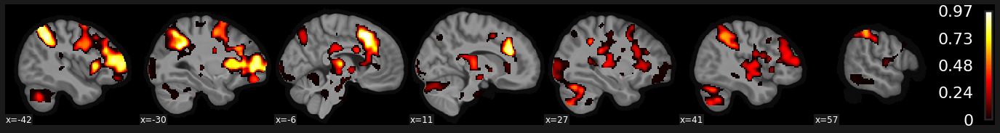

In [53]:
# p maps
con_ids = ['0012']
# con_id = '0013'

for con_id in con_ids:

    plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_reward/con%s_tfce_corrp_tstat1.nii.gz' %con_id,
                          bg_img = anat_mean,
                           display_mode = 'x',
                           colorbar=True)
    
#     plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/sv_map_correction/con%s_tfce_corrp_tstat1.nii.gz' %con_id,
#                           bg_img = anat_mean,
#                            display_mode = 'x',
#                            threshold = 0.8, 
#                            colorbar=True)

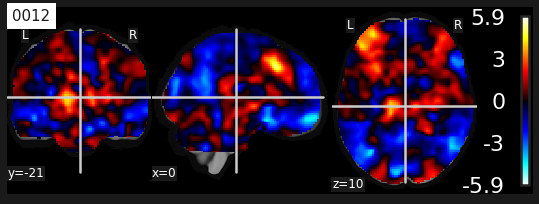

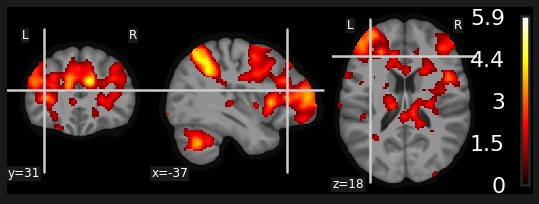

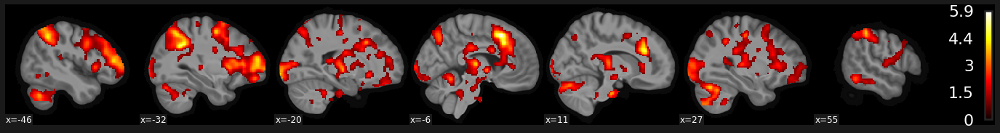

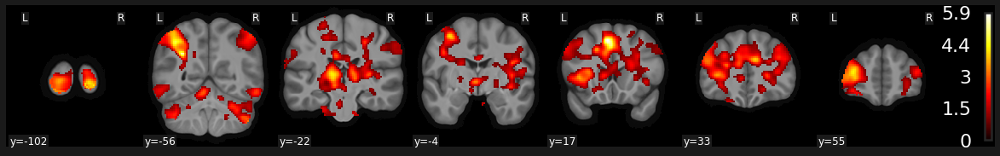

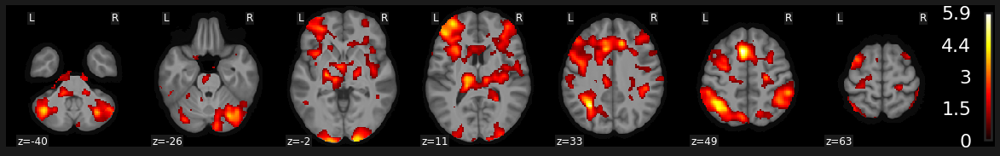

In [55]:
# visualize thresholded t values
con_ids = ['0012']


for con_id in con_ids:
    
    t_plot = nib.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_reward/con%s_tstat1.nii.gz' %con_id)
    p = nib.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_reward/con%s_tfce_corrp_tstat1.nii.gz' %con_id)

    # thr = 0.95
    t_plot_data = t_plot.get_data()
    p_data = p.get_data()

    # threshold raw t map by p values
    p_mask = p_data == 0
    t_plot_data[p_mask] = 0    
    
    plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_reward/con%s_tstat1.nii.gz' %con_id,
                          bg_img = anat_mean,
                          title = con_id)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean,
                           display_mode="x", 
                           colorbar=True)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean,
                           display_mode="y",
                           colorbar=True)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean,
                           display_mode="z",
                           colorbar=True)

Flipped, Negative SV maps <a class = "anchor" id = "tfce_neg-bullet"></a>

In [ ]:
# flipped
con_ids = ['0012', '0013']

for con_id in con_ids:
#     con_id = '0010'

    con_all = {}

    for i in sub_num:
        con_image = glob.glob('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/1stLevel/_subject_id_' + str(i) + '/con_' + con_id + '.nii')
        con_all[str(i)] = list(con_image)
    # con_all
    # len(con_all)

    # smooth, fwhm = none
    smooth_con_all = []

    for k, v in con_all.items():
        smooth_con = image.smooth_img(v[0],None) #  If fwhm is None, no filtering is performed (useful when just removal of non-finite values is needed).
        smooth_con_all.append(smooth_con)

    #     plotting.plot_glass_brain(smooth_con, colorbar = True)

    # flip sign for negative SV maps
    smooth_con_flip_all = []

    for smooth_img in smooth_con_all:
        smooth_img_flip = image.math_img("-img", img=smooth_img)
        smooth_con_flip_all.append(smooth_img_flip)

    # concatenate    
    con_concat_flip = image.concat_imgs(smooth_con_flip_all, auto_resample = True)
    con_concat_flip.to_filename(os.path.join(out_root, 'imaging', 'Sink_resp_mon_sv', 'mon_sv_glm_con%s_flip_all_sub.nii.gz' %con_id))


    cluster_thr = fsl.Randomise(in_file = os.path.join(out_root, 'imaging', 'Sink_resp_mon_sv', 'mon_sv_glm_con%s_flip_all_sub.nii.gz' %con_id),
                                mask = '/home/rj299/scratch60/mdm_analysis/output/imaging/wb_mask_group.nii.gz',
                                base_name = os.path.join(out_root, 'imaging', 'Sink_resp_mon_sv', 'con%s_flip' %con_id),
                                one_sample_group_mean = True,
                                tfce = True,
                                vox_p_values = True,
                                num_perm = 5000)
    cluster_thr.run()

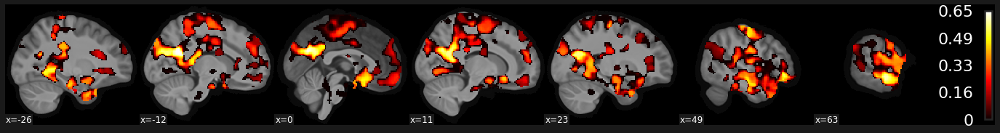

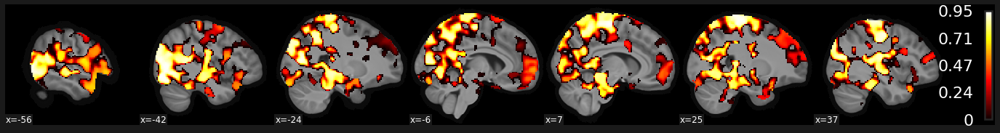

In [4]:
# p maps
con_ids = ['0012', '0013']
# con_id = '0013'

for con_id in con_ids:

    plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/con%s_flip_tfce_corrp_tstat1.nii.gz' %con_id,
                          bg_img = anat_mean,
                           display_mode = 'x',
#                            threshold = 8,
                           colorbar=True)
    

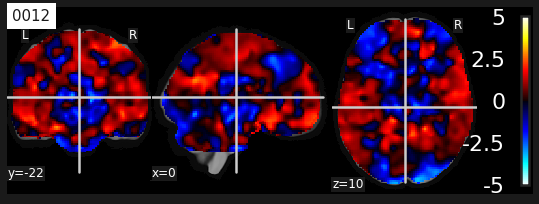

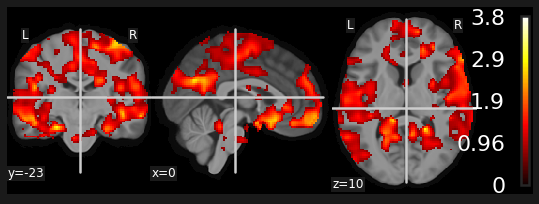

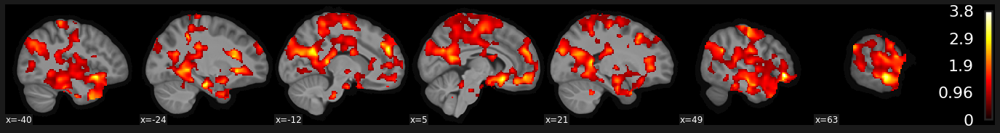

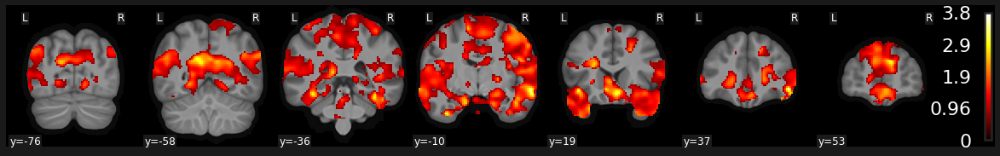

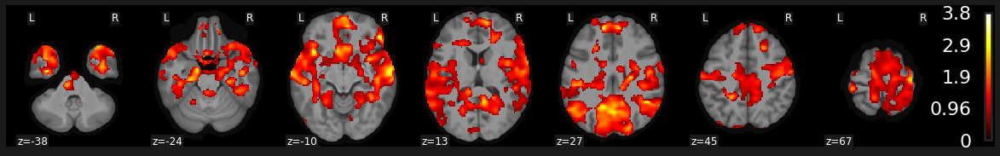

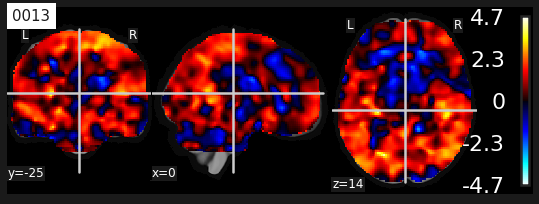

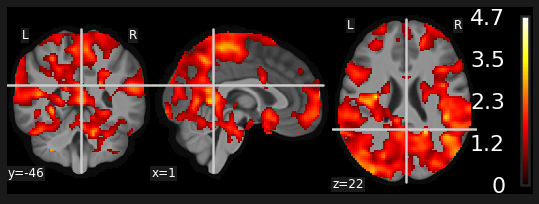

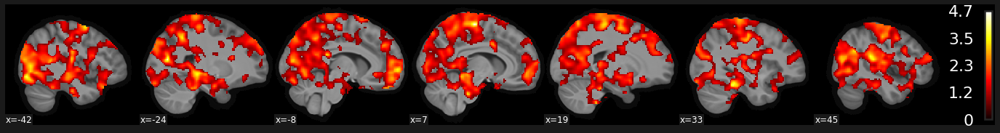

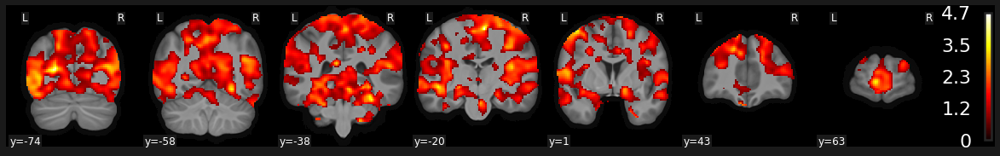

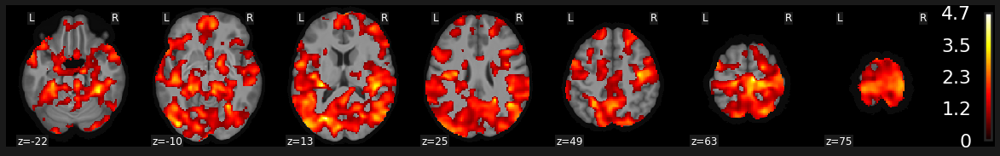

In [9]:
# visualize thresholded t values
con_ids = ['0012', '0013']


for con_id in con_ids:
    
    t_plot = nib.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/con%s_flip_tstat1.nii.gz' %con_id)
    p = nib.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/con%s_flip_tfce_corrp_tstat1.nii.gz' %con_id)

#     thr = 0.95
    t_plot_data = t_plot.get_data()
    p_data = p.get_data()

    # threshold raw t map by p values
#     p_mask = p_data < thr
    p_mask = p_data == 0
    t_plot_data[p_mask] = 0    
    
    plotting.plot_stat_map('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/con%s_flip_tstat1.nii.gz' %con_id,
                          bg_img = anat_mean,
                          title = con_id)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean,
                           display_mode="x", 
                           colorbar=True)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean,
                           display_mode="y",
                           colorbar=True)

    plotting.plot_stat_map(t_plot,
                          bg_img = anat_mean,
                           display_mode="z",
                           colorbar=True)

## ROI analysis

In [7]:
# Contrast index:
# cond_names = ['Med_5', 'Med_8', 'Med_12', 'Med_25',
#               'Mon_5', 'Mon_8', 'Mon_12', 'Mon_25', 'Resp']

# cont1 = ('Med_5', 'T', cond_names, [1, 0, 0, 0, 0, 0, 0, 0, 0])
# cont2 = ('Med_8', 'T', cond_names, [0, 1, 0, 0, 0, 0, 0, 0, 0])
# cont3 = ('Med_12', 'T', cond_names, [0, 0, 1, 0, 0, 0, 0, 0, 0])
# cont4 = ('Med_25', 'T', cond_names, [0, 0, 0, 1, 0, 0, 0, 0, 0])

# cont5 = ('Med_25>5', 'T', cond_names, [-1, 0, 0, 1, 0b, 0, 0, 0, 0])
# cont6 = ('Med_25>8', 'T', cond_names, [0, -1, 0, 1, 0, 0, 0, 0, 0])
# cont7 = ('Med_25>12', 'T', cond_names, [0, 0, -1, 1, 0, 0, 0, 0, 0])

# cont8 = ('Mon_5', 'T', cond_names, [0, 0, 0, 0, 1, 0, 0, 0, 0])
# cont9 = ('Mon_8', 'T', cond_names, [0, 0, 0, 0, 0, 1, 0, 0, 0])
# cont10 = ('Mon_12', 'T', cond_names, [0, 0, 0, 0, 0, 0, 1, 0, 0])
# cont11 = ('Mon_25', 'T', cond_names, [0, 0, 0, 0, 0, 0, 0, 1, 0])

# cont12 = ('Mon_25>5', 'T', cond_names, [0, 0, 0, 0, -1, 0, 0, 1, 0])
# cont13 = ('Mon_25>8', 'T', cond_names, [0, 0, 0, 0, 0, -1, 0, 1, 0])
# cont14 = ('Mon_25>12', 'T', cond_names, [0, 0, 0, 0, 0, 0, -1, 1, 0])

# cont15 = ('Response', 'T', cond_names, [0, 0, 0, 0, 0, 0, 0, 0, 1])

In [37]:
data_root

'/home/rj299/project/mdm_analysis/'

In [38]:
# Masker files
maskfile_vmpfc = os.path.join(data_root,'output','imaging', 'binConjunc_PvNxDECxRECxMONxPRI_vmpfc.nii.gz')
maskfile_vstr = os.path.join(data_root,'output','imaging', 'binConjunc_PvNxDECxRECxMONxPRI_striatum.nii.gz')
mask_file_rppf = os.path.join(data_root,'output','imaging', 'Gilaie-DotanEtAl_2014_Study1_rPPC-NScorr-Thres250Voxels_roi.nii')
maskfile_roi1 = os.path.join(data_root,'output','imaging', 'none_glm_Med_Mon_TFCE_p001_roi1.nii.gz')
maskfile_roi2 = os.path.join(data_root,'output','imaging', 'none_glm_Med_Mon_TFCE_p001_roi2.nii.gz')
maskfile_roi3 = os.path.join(data_root,'output','imaging', 'none_glm_Med_Mon_TFCE_p001_roi3.nii.gz')

maskfiles = {'vmpfc': maskfile_vmpfc, 
             'vstr': maskfile_vstr, 
             'rppc': mask_file_rppf,
             'med_mon_1': maskfile_roi1, 
             'med_mon_2': maskfile_roi2, 
             'med_mon_3': maskfile_roi3}

# roi inputs are loaded images
all_masks = {key_name: nib.load(maskfiles[key_name]) for key_name in maskfiles.keys()}

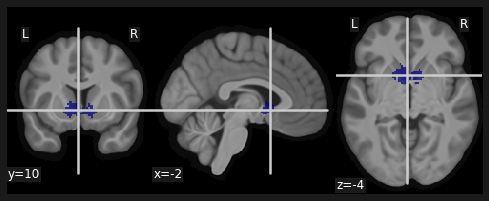

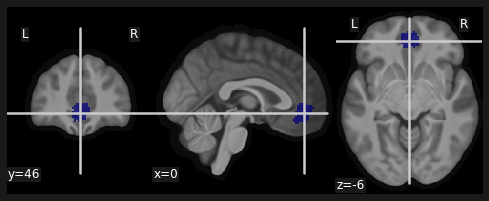

In [39]:
plotting.plot_roi(all_masks['vstr'], bg_img = anat_mean)
plotting.plot_roi(all_masks['vmpfc'], bg_img = anat_mean)

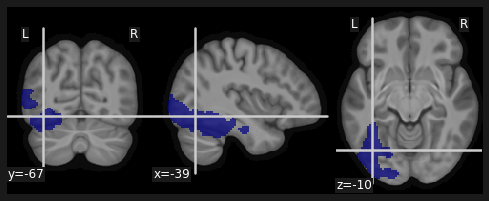

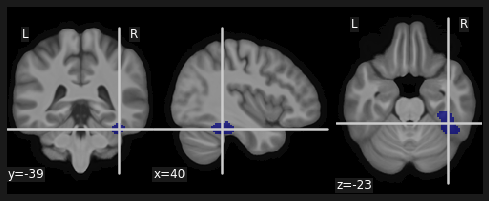

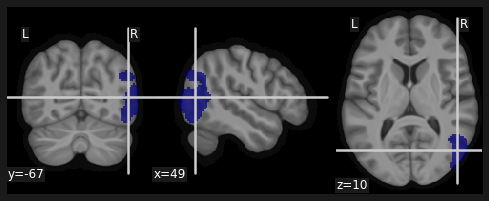

In [40]:
plotting.plot_roi(all_masks['med_mon_1'], bg_img = anat_mean)
plotting.plot_roi(all_masks['med_mon_2'], bg_img = anat_mean)
plotting.plot_roi(all_masks['med_mon_3'], bg_img = anat_mean)

In [41]:
# vStr
# extract betas (t) from ROI

con_ids = ['0010', '0011','0012', '0013']
con_names = ["med_amb", "med_risk", "mon_amb", "mon_risk"]

betas = []

for (idx, con_id) in enumerate(con_ids):
    
    beta = []
    for sub in sub_num:

        masker = NiftiMasker(os.path.join(data_root,"output", "imaging", "binConjunc_PvNxDECxRECxMONxPRI_striatum.nii.gz"))

#         beta_sub = masker.fit_transform('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/1stLevel/_subject_id_%s/con_%s.nii' %(sub, con_id))
        beta_sub = masker.fit_transform('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_%s/spmT_%s.nii' %(sub, con_id))
        
        # average of beta from this ROI, a list of all participants
        beta.append(np.mean(beta_sub[0]))
    
    # a list of 
    betas.append(np.array(beta))
    
# plot
# calculate mean and se
betas_mean = np.mean(betas, axis = 1)
betas_se = stats.sem(betas, axis = 1)

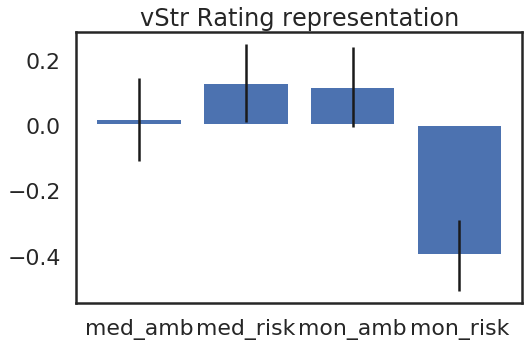

In [42]:
fig, ax = plt.subplots(1,1,figsize = (8,5))
ax.bar(range(len(con_names)), betas_mean, yerr = betas_se, tick_label = con_names)
ax.set_title("vStr Rating representation")
plt.show()

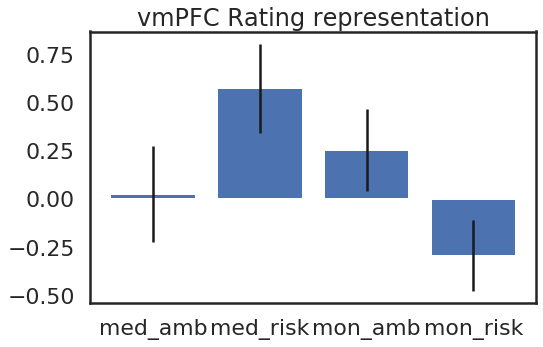

In [43]:
# vmPFC
# extract betas (t) from ROI

con_ids = ['0010', '0011','0012', '0013']
con_names = ["med_amb", "med_risk", "mon_amb", "mon_risk"]

betas = []

for (idx, con_id) in enumerate(con_ids):
    
    beta = []
    for sub in sub_num:

        masker = NiftiMasker(os.path.join(data_root,"output", "imaging", "binConjunc_PvNxDECxRECxMONxPRI_vmpfc.nii.gz"))

#         beta_sub = masker.fit_transform('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/1stLevel/_subject_id_%s/con_%s.nii' %(sub, con_id))
        beta_sub = masker.fit_transform('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_rating/1stLevel/_subject_id_%s/spmT_%s.nii' %(sub, con_id))
        
        # average of beta from this ROI, a list of all participants
        beta.append(np.mean(beta_sub[0]))
    
    # a list of 
    betas.append(np.array(beta))
    
# plot
# calculate mean and se
betas_mean = np.mean(betas, axis = 1)
betas_se = stats.sem(betas, axis = 1)

fig, ax = plt.subplots(1,1,figsize = (8,5))
ax.bar(range(len(con_names)), betas_mean, yerr = betas_se, tick_label = con_names)
ax.set_title("vmPFC Rating representation")
plt.show()

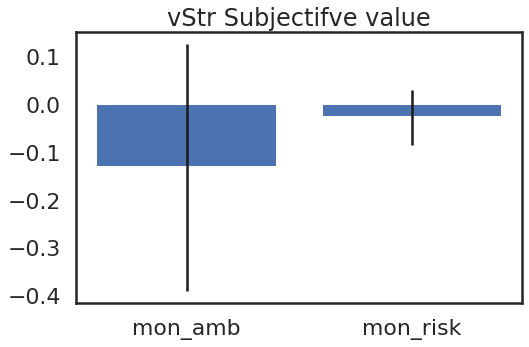

In [18]:
# vStr
# extract betas (con) from ROI

con_ids = ['0012', '0013']
con_names = ["mon_amb", "mon_risk"]

betas = []

for (idx, con_id) in enumerate(con_ids):
    
    beta = []
    for sub in sub_num:

        masker = NiftiMasker(os.path.join(out_root, "imaging", "binConjunc_PvNxDECxRECxMONxPRI_striatum.nii.gz"))

        img = nib.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/1stLevel/_subject_id_%s/con_%s.nii' %(sub, con_id))
        img_data = img.get_data()
        img_data[np.isnan(img_data)] =0
        beta_sub = masker.fit_transform(img)
        
#         beta_sub = masker.fit_transform('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/1stLevel/_subject_id_%s/spmT_%s.nii' %(sub, con_id))
        
    # average of beta from this ROI, a list of all participants
        beta.append(np.mean(beta_sub[0]))
    
    # a list of 
    betas.append(np.array(beta))
    
# plot
# calculate mean and se
betas_mean = np.mean(betas, axis = 1)
betas_se = stats.sem(betas, axis = 1)

fig, ax = plt.subplots(1,1,figsize = (8,5))
ax.bar(range(len(con_names)), betas_mean, yerr = betas_se, tick_label = con_names)
ax.set_title("vStr Subjectifve value")
plt.show()

fig.savefig(os.path.join(out_root,"imaging","Sink_resp_mon_sv", "Bartra_vStr_roi_mon_sv.eps"), format = 'eps')

In [19]:
#stats
for (con_idx, con_id) in enumerate(con_ids):
    print(stats.ttest_1samp(betas[con_idx], popmean = 0))

Ttest_1sampResult(statistic=-0.5093166002023068, pvalue=0.6140247718099849)
Ttest_1sampResult(statistic=-0.46219801399026017, pvalue=0.6470665886398983)


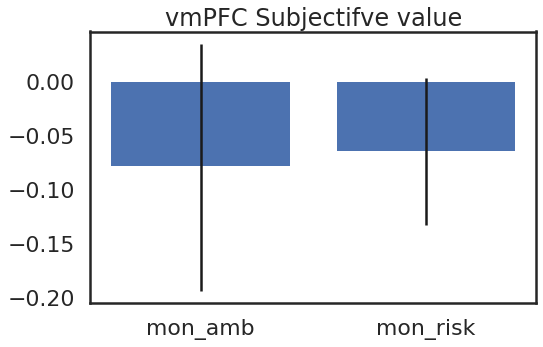

In [20]:
# vmPFC
# extract betas (t) from ROI

con_ids = ['0012', '0013']
con_names = ["mon_amb", "mon_risk"]

betas = []

for (idx, con_id) in enumerate(con_ids):
    
    beta = []
    for sub in sub_num:

        masker = NiftiMasker(os.path.join(out_root, "imaging", "binConjunc_PvNxDECxRECxMONxPRI_vmpfc.nii.gz"))
        
        img = nib.load('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/1stLevel/_subject_id_%s/con_%s.nii' %(sub, con_id))
        img_data = img.get_data()
        img_data[np.isnan(img_data)] =0
        beta_sub = masker.fit_transform(img)
        
#         beta_sub = masker.fit_transform('/home/rj299/scratch60/mdm_analysis/output/imaging/Sink_resp_mon_sv/1stLevel/_subject_id_%s/spmT_%s.nii' %(sub, con_id))
        
        # average of beta from this ROI, a list of all participants
        beta.append(np.mean(beta_sub[0]))
    
    # a list of 
    betas.append(np.array(beta))
    
# plot
# calculate mean and se
betas_mean = np.mean(betas, axis = 1)
betas_se = stats.sem(betas, axis = 1)

fig, ax = plt.subplots(1,1,figsize = (8,5))
ax.bar(range(len(con_names)), betas_mean, yerr = betas_se, tick_label = con_names)
ax.set_title("vmPFC Subjectifve value")
plt.show()

fig.savefig(os.path.join(out_root,"imaging","Sink_resp_mon_sv", "Bartra_vmPFC_roi_mon_sv.eps"), format = 'eps')

In [21]:
#stats
for (con_idx, con_id) in enumerate(con_ids):
    print(stats.ttest_1samp(betas[con_idx], popmean = 0))

Ttest_1sampResult(statistic=-0.6998553921738916, pvalue=0.48907454493429636)
Ttest_1sampResult(statistic=-0.9600525135150698, pvalue=0.34422717561225324)
